In [1]:
import numpy as np
import tensorflow as tf
import sys
import os
import matplotlib.pyplot as plt
import matplotlib, re
%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (10,6)
import json

In [517]:
#coding:utf-8


import numpy as np
import tensorflow as tf
import sys
import matplotlib.pyplot as plt
import matplotlib, re
import json


class LSTM():
    def init_variables(self):
        self.input_train = None
        self.label_train = None
        self.input_test  = None
        self.label_test  = None
        
        self.input_placeholder = None
        self.label_placeholder = None
        
        self.complete_model = None
        
        self.loss  = None
        self.train = None
        
        self.dummy_data = [[0]*self.config.input_dimension]
        self.dummy_label = [[0]*self.config.label_dimension]
        
        self.n_input = 0
        
        self.embedding = None
        self.w2i = None
        self.i2w = None
        
        self.hot_one = np.eye( self.config.label_dimension ,dtype='int').tolist()
        
        #Chargement de l'embedding
        if self.config.bool_create_embedding and self.config.bool_load_embedding:
            raise "Il faut choisir entre générer l'mebedding aléatoirement ou bien le charger"
            
        if self.config.bool_load_embedding:
            x,y = self.config.vocabsize, self.config.input_dimension
            
            emb = []
            with open(self.config.filename+'.embedding','r') as f:
                for l in f.readlines():
                    tmp = l.split()
                    tmp = [float(v) for v in tmp]
                    emb.append(tmp)

            #Vérification de la taille
            if len(emb) != x or len(emb[0]) != y:
                raise "Taille de l'embedding chargée non compatible avec la taille du vocabulaire et de la dimension d'entrée"
            self.embedding = emb
        
        else:            
            if self.config.bool_create_embedding:
                #Xavier-initialization: tirage uniforme sur -p,p avec p=sqrt(6/(x+y))
                p = (6./(x+y))**0.5
                self.embedding = np.random.uniform(-p,p, size=(x,y)).tolist()    
            
            
    def load_data(self):
        """
        Fonction:
            Charge les données qui sont sous la forme {"data": ... ,"label": ... } obtenu par un json.dumps dans
            filename.data
        
        Args:
            Aucun
        Returns:
            Aucun
            
        Remarques:
            - La configuration se fait via Config():
                > bool_w2i = True         : "data" est une liste de mots PRESENTS dans le fichier .w2i chargé
                                             Les mots sont alors convertis en l'index associé
                > bool_embedding = True   : Les entrées sont mappées sur l'embedding du fichier .embedding
                > ratio                   : Détermine le ratio train/test
                
            - "label" peut être de 3 types différents:
                > int      : label est alors utilisé à chaque timestep de la LSTM
                > list int : list est de taille le nombre de sorties de la LSTM
                > list str : si bool_w2i == True alors comme pour "data" les labels sont convertis en l'index associé
               
        """
        
        input_ = []
        label_ = []
        
        with open(self.config.filename+".data", "r") as f:
            for l in f.readlines():
                tmp = json.loads(l)                
                data, label = tmp['data'], tmp['label']                
                
                #Traitement des différents types de label
                if type(label) == int:
                    label = [self.hot_one[label]]*len(data)
                elif type(label[0]) == int:
                    label = [self.hot_one[i] for i in label]
                else:
                    if self.config.bool_w2i:
                        label = [self.hot_one[self.w2i[i]] for i in label]
                    else:
                        raise "Impossible de décrypter les labels"
                
                
                if self.config.bool_w2i:
                    data = [self.w2i[w] for w in data]
                    
                if self.embedding is not None:
                    data = [self.embedding[i] for i in data]
                
                #Complétion des data/label pour la structure LSTM masquée de tensorflow
                data, label = self.feed_utils_complete(data, label)
                                
                input_.append(data)
                label_.append(label)
               
        
        nb = int(self.config.ratio*len(input_))
        self.n_input = nb
        
        #Répartition train/test
        self.input_train = input_[:nb]
        self.label_train = label_[:nb]
        self.input_test = input_[nb:]
        self.label_test = label_[nb:]
        
        
        
                
    def add_placeholder(self):
        self.input_placeholder = tf.placeholder(tf.float32, shape=(None, self.config.sequencesize, self.config.input_dimension))
        self.label_placeholder = tf.placeholder(tf.float32, shape=(None, self.config.sequencesize, self.config.label_dimension))
    
    def create_feed_dict(self,input_batch,label_batch=None):
        feed = {self.input_placeholder: input_batch}
        if label_batch is not None:
            feed[self.label_placeholder] = label_batch
            
        return feed
    
    def add_model(self):
        """
        Fonction:
            Crée le modèle LSTM ainsi que la projection de sortie dans le 'computing graph'
        
        Args:
            Aucun
        Returns:
            Aucun
            
        Remarques:
            Aucunes
        """
        
        with tf.variable_scope("LSTM") as scope:
            cell = tf.nn.rnn_cell.LSTMCell(self.config.hidden_dimension)
            
            #cell = tf.nn.rnn_cell.DropoutWrapper(cell, output_keep_prob=0.95, input_keep_prob=0.95)
            
            l = self.feed_utils_length(self.input_placeholder)
            LSTMmodel, _ = tf.nn.dynamic_rnn(cell, self.input_placeholder, dtype=tf.float32,sequence_length=l)
            #LSTMmodel est un tenseur de taille (batchsize, sequencesize, hidden_dimension)
        
        with tf.variable_scope("output") as scope:
            lstm_outputs = tf.unpack(LSTMmodel, axis=1)
            
            W = tf.get_variable('W', shape=(self.config.hidden_dimension, self.config.label_dimension), dtype=tf.float32, initializer=tf.contrib.layers.xavier_initializer())
            b = tf.get_variable('b', shape=(self.config.label_dimension), dtype=tf.float32, initializer=tf.constant_initializer())
            
            complete_model = [tf.nn.softmax( tf.matmul(ten, W) + b ) for ten in lstm_outputs]
        
        self.complete_model = complete_model
        #self.predictions = [tf.argmax(t,1) for t in self.complete_model]
    
    def add_loss_op(self):
        #ones = tf.ones(shape=(self.config.batchsize))
        #loss = tf.nn.seq2seq.sequence_loss(self.complete_model, tf.unpack(self.label_placeholder,axis=1), [ones for _ in range(self.config.sequencesize)] )
        
        lab = tf.unpack(self.label_placeholder, axis=1)
        
        debut = 4
        
        loss = - tf.reduce_sum( tf.log(self.complete_model[debut])*lab[debut])
        for i in range(debut+1,self.config.sequencesize):
            loss += - (i-debut)**1.5*tf.reduce_sum( tf.log(self.complete_model[i])*lab[i])
            
        self.loss = loss
        
    def add_training_op(self):
        train = tf.train.AdamOptimizer(self.config.lr).minimize(self.loss)
        self.train = train
    
    def run_epoch(self, sess):
        nb_batch = self.n_input // self.config.batchsize
        
        losses = []
        
        for i in range(nb_batch):
            batch = [self.input_train[j] for j in range(i*self.config.batchsize, (i+1)*self.config.batchsize)]
            label = [self.label_train[j] for j in range(i*self.config.batchsize, (i+1)*self.config.batchsize)]
            
            
            feed_dict = self.create_feed_dict(batch,label)
            _, loss = sess.run([self.train, self.loss], feed_dict=feed_dict)
            losses.append(loss)
            
            
            #print "\r%4d / %d : %f"%(i,nb_batch,np.exp(np.mean(losses)/self.config.batchsize/self.config.sequencesize)),
        
        return np.mean(losses)
    
    def feed_utils_complete(self, data, label=None):
        d = self.config.sequencesize - len(data)
        if label is None:
            return data + d*self.dummy_data
        else:
            return data + d*self.dummy_data, label + d*self.dummy_label
        
    
    def feed_utils_length(self, sequences):
        """
        Fonction:
            Calcule la 'vraie' longueur des séquences pour chaque élément du batch (qui a potentiellement été
            artificiellement remplis avec des vecteurs nuls)
        
        Args:
            - (batchsize, sequencesize, inputsize)-Tenseur
        Returns:
            - 1-D Tenseur de taille batchsize contenant la 'vraie' longueur de chaque élément
            
        Remarques:
        """
        
        return tf.cast(tf.reduce_sum(tf.sign(tf.reduce_max(tf.abs(sequences), reduction_indices=2)), reduction_indices=1), tf.int32)
        
        
        
    def fit(self, sess=None,log=True):
        if sess is None:
            sess = self.session
        
        for epoch in range(self.config.nb_epoch):
            loss = self.run_epoch(sess)
            if log:
                print "\rEpoch %4d : %4.2f"%(epoch, loss),
        
        return loss
        
    def predict(self, dataset):
        
        if dataset == 'train':
            inputs = self.input_train
        elif dataset == 'test':
            inputs = self.input_test
        else:
            tmp = json.loads(dataset)
            data = tmp['data']
        
            
            if self.embedding is not None:
                data = [self.embedding[i] for i in data]
            
            inputs = [self.feed_utils_complete(data)]        
        
        #p = np.array(self.session.run(self.predictions, feed_dict=self.create_feed_dict(inputs))).T
        p = self.session.run(self.complete_model, feed_dict={self.input_placeholder:self.input_test} )
        p = np.array(p).transpose([1,0,2])
        p = np.argmax(np.sum(p[:,-3:,:]*np.array([[i*i] for i in range(1,4)]),axis=1),axis=1)
        
        return p
        
     
    def confusion(self,dataset='test'):
        """
        Fonction:
            Calcule la matrice de confusion (non normalisée) de la LSTM
        
        Args:
            - str dataset: dataset utilisé pour les prédictions: 'train' ou 'test'
        Returns:
            - Matrice de confusion
            
        Remarques:
            Matrice de confusion:
                    _______________________________________________..._____________
                    |GroundTruth\Prediction| Classe 1 | Classe 2 | ... | Classe n |
                    |______________________|__________|__________|_..._|__________|
                    |      Classe 1        |   c_11   |   c_12   | ... |   c_1n   |
                    |______________________|__________|__________|_..._|__________|
                    |      Classe 2        |   c_21   |   c_22   | ... |   c_2n   |
                    |______________________|__________|__________|_..._|__________|
                    ⋮                      ⋮          ⋮          ⋮     ⋮          ⋮
                    ⋮______________________⋮__________⋮__________⋮_..._⋮__________⋮
                    |      Classe n        |   c_n1   |   c_n2   | ... |   c_nn   |
                    |______________________|__________|__________|_..._|__________|
                    
                    
                    c_ij = nombre d'exemples de la classe i classifiés comme étant de la classe j            
        """
        
        
        if dataset == 'train':
            inputs = self.input_train
            labels = [np.argmax(l[0]) for l in self.label_train]
        else:
            inputs = self.input_test
            labels = [np.argmax(l[0]) for l in self.label_test]
        
        pred = self.predict(dataset)
        
        confusion = np.zeros((self.config.label_dimension,self.config.label_dimension))
        
        for k in range(len(pred)):
            i = labels[k]
            j = pred[k]
            confusion[i,j] += 1
            
        return confusion
        
        
    def __init__(self, config=None):
        if config is None:
            self.config = Config()
        else:
            self.config = config
        
        self.init_variables()
       
        self.load_data()
        self.add_placeholder()
        self.add_model()
        self.add_loss_op()
        self.add_training_op()
        
        self.session = tf.Session()
        self.session.run(tf.initialize_all_variables())
        

In [518]:
class Config():
    def __init__(
        self, 
        
        filename = "",
        
        lr=0.01,
        seq = 10, 
        ratio=0.1, 
        
        bool_create_embedding = False,
        bool_load_embedding = False,
        bool_w2i = False,
        vocabsize=0,
        label_dimension=0,
        input_dimension = 20,
        hidden_dimension = 40,
        
        nb_epoch=100,
        batchsize = 256
    ):
        
        self.lr = lr
        
        self.hidden_dimension = hidden_dimension
        self.input_dimension = input_dimension
        
        self.sequencesize = seq
        self.batchsize = batchsize
        self.label_dimension = label_dimension
        
        self.filename = filename
        
        self.nb_epoch = nb_epoch
        self.ratio = ratio
        
        self.bool_create_embedding = bool_create_embedding
        self.bool_load_embedding = bool_load_embedding
        self.bool_w2i = bool_w2i
        self.vocabsize = vocabsize

In [514]:
class LSTM_wrapper():
    
    def load_w2i(self, filename):
        self.word2index = dict()
        self.index2word = []
        with open(filename+".w2i",'r') as f:
            i=0
            for l in f.readlines():
                self.word2index[l.strip()] = i
                self.index2word.append(l.strip())
                i+=1
                
    def load_config(self,filename):
        with open(filename+".config") as f:
            self.configfile = json.load(f)
        
        self.config = Config(
                                filename=filename,
                                lr=0.0005,
                                seq=self.configfile['sequencesize'],
                                ratio=0.9,
                                bool_create_embedding = False,
                                bool_load_embedding = True,
                                bool_w2i = False,
                                vocabsize=self.configfile['vocabsize'],
                                label_dimension=self.configfile['label_dimension'],
                                input_dimension=self.configfile['input_dimension'],
                                hidden_dimension=int(self.configfile['input_dimension']*1.3),
                                nb_epoch=10) 
        
    def __init__(self, filename):
        self.load_config(filename)
        self.load_w2i(filename)
               
              
        #Grosse bidouille pour avoir la fin de chaine sans le path
        #name = filename[-filename[::-1].find('/'):]
        name = filename.split('/')[-1]
        with tf.variable_scope(name):
            self.lstm = LSTM(self.config)
        
    def encrypt(self, s):
        res=[]
        for w in s.split():
            res.append(self.word2index[w])
        return res
    
    def decrypt(self,s):
        res = []
        for i in s:
            res.append(self.index2word[i])
            
        return ' '.join(res)
    
    def predict(self, s):
        return [self.configfile['label_name'][i] for i in self.lstm.predict(json.dumps({'data':self.encrypt(s)}))[0][:len(s.split())]]
        
    def show_training(self, nb_epoch=2, nb_times=10):
        self.lstm.config.nb_epoch = nb_epoch
        
        label_test = self.lstm.label_test
        seq_len = [np.sum(l) for l in label_test]
        label_test = np.array([np.argmax(l[0]) for l in label_test])
                    
        for i in range(nb_times):
            self.lstm.fit()
            #p = self.lstm.predict('test')
            p= self.lstm.session.run(self.lstm.complete_model, feed_dict={self.lstm.input_placeholder:self.lstm.input_test} )
            p = np.array(p).transpose([1,0,2])
            
            pr = [0 for i in range(7)]
            
            pr[0] = np.array([x[-1] for x in np.argmax(p,axis=2)])
            pr[1] = np.argmax(np.sum(p,axis=1),axis=1)
            pr[2] = np.argmax(np.sum(p[:,-3:,:]*np.array([[i] for i in range(1,7,2)]),axis=1),axis=1)
            pr[3] = np.argmax(np.sum(p[:,-2:,:],axis=1),axis=1)
            pr[4] = np.argmax(np.sum(p[:,-3:,:]*np.array([[i] for i in range(1,4)]),axis=1),axis=1)
            pr[5] = np.argmax(np.sum(p[:,-3:,:]*np.array([[i*i] for i in range(1,4)]),axis=1),axis=1)
            pr[6] = np.argmax(np.sum(p[:,-3:,:],axis=1),axis=1)
            
            print "  Test accuracy:",
            
            for x in pr:
                print '%2.2f'%(np.mean(label_test==x)*100),
            print ''
            
    def _confusion_plot(self,confusion):
        c = confusion
        #Création de la figure
        fig = plt.figure()
        ax = fig.add_subplot(111)
        ax.set_aspect(1)

        #Tracé de la matrice et de la légende
        res = ax.imshow(c, cmap=plt.cm.jet, interpolation='nearest')
        cb = fig.colorbar(res)

        #Tracé des valeurs dans les cases
        height,width = c.shape
        for i in range(height):
            for j in range(width):
                ax.annotate("%4.1f%%"%(c[i,j]*100),xy=(j-0.2,i))

        plt.xticks(range(width), self.configfile['label_name'], rotation=30)
        plt.yticks(range(width), self.configfile['label_name'])
        plt.show()
        
    def confusion(self, dataset='test'):
        c = self.lstm.confusion(dataset)
        s = np.sum(c, axis=1)
        c/=s.reshape((c.shape[0],1))

        for i,l in enumerate(c):
            print "--------"*len(l)+'-'
            print "|",
            for x in l:
                print "%4.1f%% |"%(x*100),
            print "  Total: %d"%s[i]
            
        self._confusion_plot(c)

    

In [481]:
p1 = np.array([x[-1] for x in np.argmax(p,axis=2)])
p2 = np.argmax(np.sum(p,axis=1),axis=1)
p3 = np.argmax(np.sum(p[:,-3:,:]*np.array([[i] for i in range(1,7,2)]),axis=1),axis=1)
p4 = np.argmax(np.sum(p[:,-2:,:],axis=1),axis=1)
p5 = np.argmax(np.sum(p[:,-3:,:]*np.array([[i] for i in range(1,4)]),axis=1),axis=1)
p6 = np.argmax(np.sum(p[:,-3:,:]*np.array([[i*i] for i in range(1,4)]),axis=1),axis=1)
p7 = np.argmax(np.sum(p[:,-3:,:],axis=1),axis=1)
print np.mean(p1==l), np.mean(p2==l), np.mean(p3==l), np.mean(p4==l), np.mean(p5==l), np.mean(p6==l), np.mean(p7==l)

0.72652173913 0.710434782609 0.738260869565 0.730434782609 0.735652173913 0.740434782609 0.728260869565


In [521]:
tf.reset_default_graph()
t = LSTM_wrapper('dataset/tweets/data/total')

Epoch    3 : 4889.24   Test accuracy: 69.49 73.84 71.50 70.18 71.50 71.77 70.75 
Epoch    3 : 4425.37   Test accuracy: 71.22 75.05 73.00 71.77 73.00 73.25 72.45 
Epoch    3 : 4250.97   Test accuracy: 71.57 75.41 73.91 72.45 73.59 73.98 72.88 
Epoch    3 : 4137.49   Test accuracy: 72.11 75.91 74.25 72.93 74.32 74.43 73.89 
Epoch    3 : 4050.10   Test accuracy: 72.52 76.36 74.77 73.34 74.57 74.95 74.27 
Epoch    3 : 3978.86   Test accuracy: 72.75 76.55 75.14 73.54 74.98 75.41 74.25 
Epoch    3 : 3918.82   Test accuracy: 72.84 76.43 75.34 73.79 75.18 75.59 74.43 
Epoch    3 : 3866.96   Test accuracy: 73.02 76.66 75.43 73.79 75.23 75.55 74.57 
Epoch    3 : 3821.55   Test accuracy: 73.07 76.68 75.27 73.89 75.36 75.55 74.70 
Epoch    3 : 3781.44   Test accuracy: 73.18 76.87 75.50 74.04 75.34 75.77 74.95 
-------------------------------------------------
| 72.0% | 18.0% |  7.5% |  1.5% |  0.6% |  0.4% |   Total: 890
-------------------------------------------------
| 11.4% | 72.5% | 12.2% |  

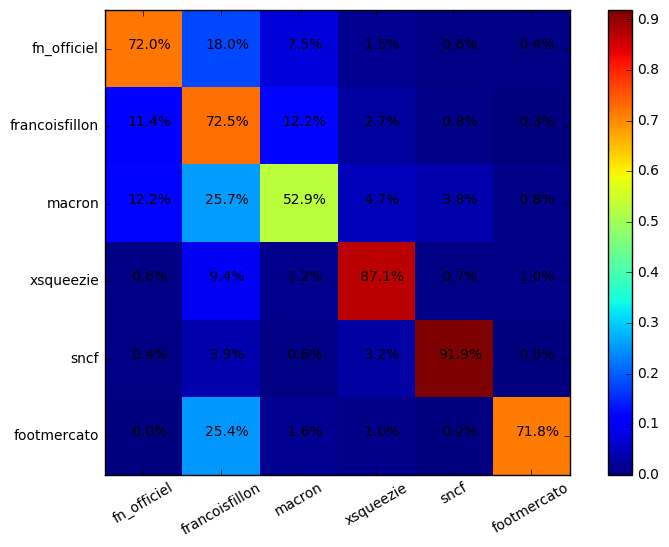

Epoch    3 : 3745.69   Test accuracy: 73.27 76.98 75.64 74.14 75.43 75.64 75.07 
Epoch    3 : 3713.48   Test accuracy: 73.41 77.12 75.75 74.34 75.50 75.89 75.07 
Epoch    3 : 3684.05   Test accuracy: 73.52 77.18 75.68 74.34 75.64 75.89 75.25 
Epoch    3 : 3656.78   Test accuracy: 73.57 77.23 75.86 74.45 75.73 76.21 75.32 
Epoch    3 : 3631.20   Test accuracy: 73.79 77.21 76.07 74.59 76.00 76.36 75.50 
Epoch    3 : 3606.99   Test accuracy: 73.91 77.21 76.25 74.84 76.00 76.43 75.71 
Epoch    3 : 3583.95   Test accuracy: 74.00 77.41 76.36 74.98 76.14 76.43 75.80 
Epoch    3 : 3561.95   Test accuracy: 74.16 77.37 76.41 75.07 76.34 76.57 75.84 
Epoch    3 : 3540.85   Test accuracy: 74.09 77.43 76.52 75.16 76.32 76.68 75.89 
Epoch    3 : 3520.55   Test accuracy: 74.18 77.46 76.64 75.20 76.57 76.73 75.93 
-------------------------------------------------
| 71.8% | 17.3% |  8.4% |  1.3% |  0.8% |  0.3% |   Total: 890
-------------------------------------------------
|  9.9% | 73.9% | 12.7% |  

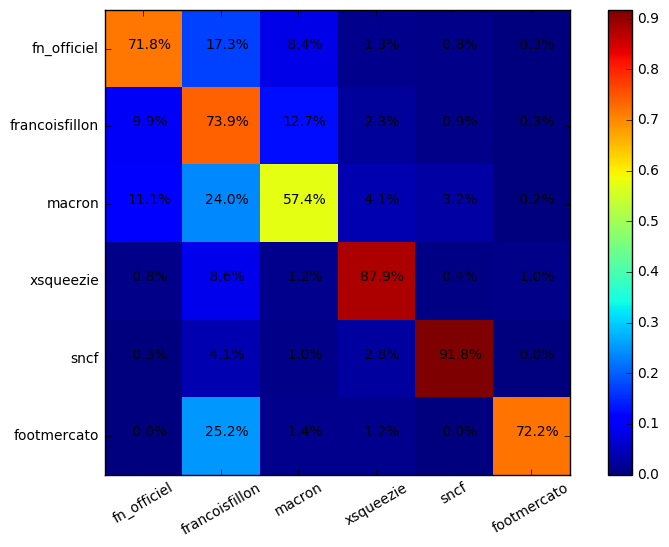

In [522]:
t.show_training(4,10)
t.confusion()
t.show_training(4,10)
t.confusion()

##################### 1 - Essai 0 ###################
Epoch    3 : 4822.24   Test accuracy: 70.27 73.64 72.25 70.84 72.09 72.34 71.59 
Epoch    3 : 4408.97   Test accuracy: 71.86 75.25 73.98 72.47 73.84 74.16 73.18 
Epoch    3 : 4230.39   Test accuracy: 72.54 75.93 74.68 73.20 74.52 74.82 73.89 
Epoch    3 : 4109.05   Test accuracy: 73.23 76.36 75.14 73.68 74.95 75.23 74.34 
Epoch    3 : 4015.95   Test accuracy: 73.77 76.73 75.68 74.27 75.55 75.91 75.20 
Epoch    3 : 3942.41   Test accuracy: 73.95 77.12 76.02 74.50 75.84 76.21 75.45 
Epoch    3 : 3883.61   Test accuracy: 73.91 77.23 76.09 74.55 75.98 76.30 75.59 
Epoch    3 : 3835.51   Test accuracy: 73.86 77.48 76.39 74.84 76.30 76.50 75.77 
Epoch    3 : 3794.92   Test accuracy: 73.86 77.80 76.50 75.05 76.48 76.66 75.96 
Epoch    3 : 3759.58   Test accuracy: 74.00 77.89 76.59 75.09 76.66 76.75 76.16 
-------------------------------------------------
| 71.8% | 18.3% |  7.2% |  1.1% |  1.1% |  0.4% |   Total: 890
-----------------------

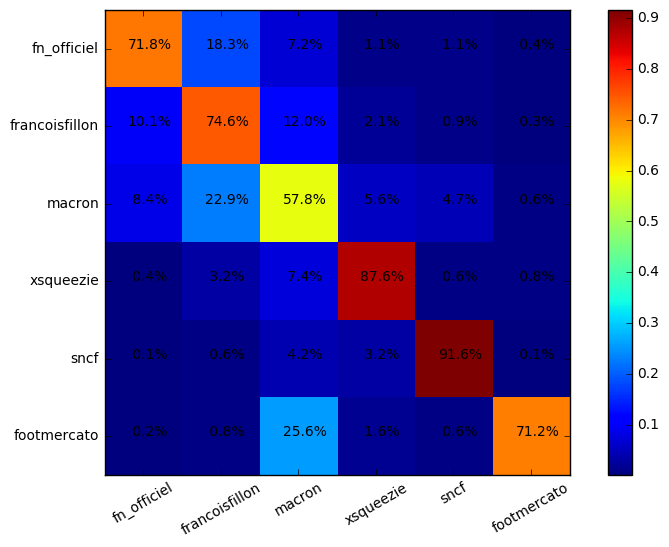

Epoch    3 : 3728.04   Test accuracy: 74.02 77.89 76.73 75.25 76.87 76.80 76.32 
Epoch    3 : 3699.33   Test accuracy: 74.02 77.80 76.84 75.27 76.98 76.87 76.46 
Epoch    3 : 3672.74   Test accuracy: 74.09 77.82 77.00 75.43 76.91 77.05 76.50 
Epoch    3 : 3647.75   Test accuracy: 73.95 77.84 76.87 75.45 76.87 76.96 76.18 
Epoch    3 : 3623.94   Test accuracy: 74.07 77.91 76.91 75.32 76.87 76.98 76.27 
Epoch    3 : 3601.17   Test accuracy: 74.20 77.96 76.93 75.39 76.84 76.98 76.23 
Epoch    3 : 3579.38   Test accuracy: 74.16 77.93 76.96 75.45 76.87 77.07 76.11 
Epoch    3 : 3558.42   Test accuracy: 74.45 78.09 76.93 75.45 76.89 76.98 76.14 
Epoch    3 : 3538.19   Test accuracy: 74.52 78.21 76.98 75.55 76.96 77.05 76.27 
Epoch    3 : 3518.66   Test accuracy: 74.75 78.16 77.02 75.59 76.98 77.12 76.36 
-------------------------------------------------
| 72.2% | 18.4% |  6.7% |  1.0% |  1.0% |  0.6% |   Total: 890
-------------------------------------------------
|  9.4% | 75.9% | 11.9% |  

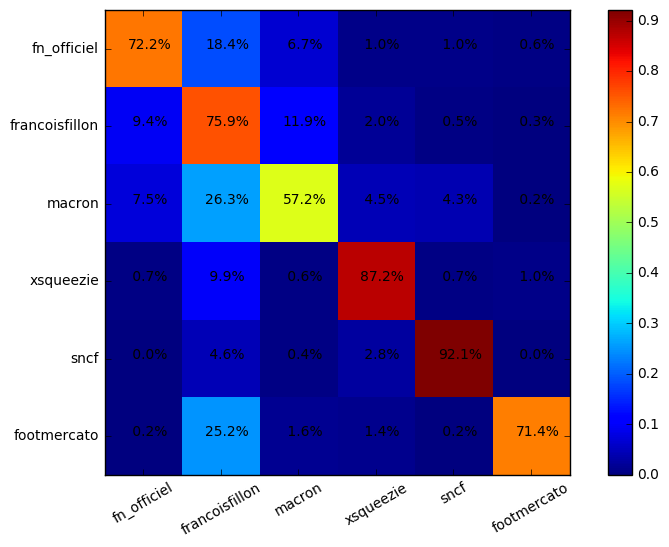

Epoch    3 : 3499.80   Test accuracy: 74.89 78.16 77.07 75.71 77.00 77.02 76.27 
Epoch    3 : 3481.58   Test accuracy: 74.86 78.34 77.16 75.75 77.07 77.09 76.09 
Epoch    3 : 3463.96   Test accuracy: 74.75 78.32 77.09 75.71 76.98 77.14 76.18 
Epoch    3 : 3446.92   Test accuracy: 74.77 78.32 77.14 75.73 77.05 77.34 76.09 
Epoch    3 : 3430.44   Test accuracy: 74.75 78.23 77.23 75.66 77.16 77.25 76.09 
Epoch    3 : 3414.47   Test accuracy: 74.70 78.25 77.34 75.77 77.23 77.23 76.25 
Epoch    3 : 3399.01   Test accuracy: 74.64 78.25 77.21 75.71 77.23 77.21 76.39 
Epoch    3 : 3384.06   Test accuracy: 74.66 78.16 77.18 75.66 77.23 77.30 76.52 
Epoch    3 : 3369.60   Test accuracy: 74.73 78.14 77.21 75.68 77.21 77.32 76.68 
Epoch    3 : 3355.57   Test accuracy: 74.70 78.18 77.23 75.77 77.09 77.32 76.68 
-------------------------------------------------
| 71.9% | 18.1% |  7.9% |  0.7% |  1.0% |  0.4% |   Total: 890
-------------------------------------------------
|  8.4% | 76.5% | 12.4% |  

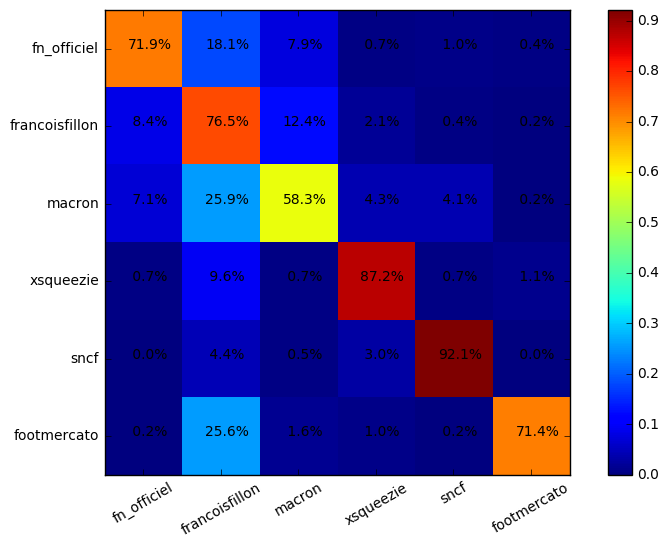

Epoch    3 : 3341.97   Test accuracy: 74.84 78.37 77.34 75.75 77.21 77.37 76.62 
Epoch    3 : 3328.75   Test accuracy: 74.91 78.37 77.43 75.82 77.30 77.39 76.59 
Epoch    3 : 3315.90   Test accuracy: 74.98 78.37 77.32 75.84 77.34 77.53 76.64 
Epoch    3 : 3303.39   Test accuracy: 75.00 78.39 77.50 75.93 77.34 77.48 76.64 
Epoch    3 : 3291.20   Test accuracy: 75.09 78.39 77.43 76.02 77.41 77.57 76.62 
Epoch    3 : 3279.31   Test accuracy: 74.93 78.43 77.41 75.89 77.32 77.59 76.68 
Epoch    3 : 3267.70   Test accuracy: 74.95 78.43 77.48 75.96 77.43 77.59 76.66 
Epoch    3 : 3256.35   Test accuracy: 74.77 78.41 77.46 76.00 77.32 77.59 76.64 
Epoch    3 : 3245.25   Test accuracy: 74.77 78.43 77.50 75.96 77.39 77.57 76.55 
Epoch    3 : 3234.38   Test accuracy: 74.73 78.43 77.50 75.91 77.46 77.64 76.55 
-------------------------------------------------
| 72.4% | 17.9% |  7.9% |  0.6% |  0.9% |  0.4% |   Total: 890
-------------------------------------------------
|  7.5% | 76.9% | 12.7% |  

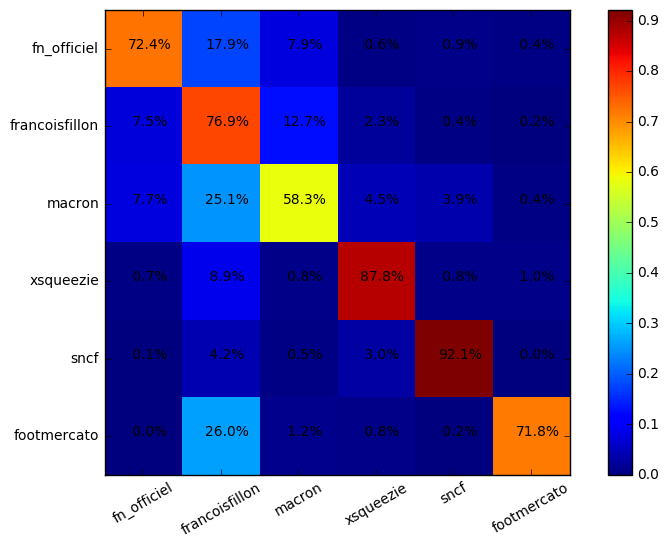

Epoch    3 : 3223.73   Test accuracy: 74.70 78.23 77.57 75.96 77.30 77.53 76.52 
Epoch    3 : 3213.27   Test accuracy: 74.68 78.34 77.53 76.00 77.32 77.27 76.57 
Epoch    3 : 3203.02   Test accuracy: 74.70 78.41 77.50 76.05 77.23 76.89 76.55 
Epoch    3 : 3192.94   Test accuracy: 74.59 78.48 77.43 76.09 77.21 76.91 76.59 
Epoch    3 : 3183.05   Test accuracy: 74.73 78.28 77.21 75.98 77.14 76.91 76.66 
Epoch    3 : 3173.32   Test accuracy: 74.73 78.32 77.25 75.89 77.14 76.73 76.75 
Epoch    3 : 3163.76   Test accuracy: 74.57 78.34 77.14 75.86 77.05 76.75 76.68 
Epoch    3 : 3154.36   Test accuracy: 74.45 78.23 77.16 75.80 77.12 76.68 76.52 
Epoch    3 : 3145.12   Test accuracy: 74.50 78.23 77.12 75.82 77.12 76.64 76.59 
Epoch    3 : 3136.04   Test accuracy: 74.48 78.16 77.16 75.86 77.07 76.71 76.62 
-------------------------------------------------
| 71.3% | 18.5% |  8.3% |  0.7% |  0.7% |  0.4% |   Total: 890
-------------------------------------------------
|  7.2% | 77.4% | 12.8% |  

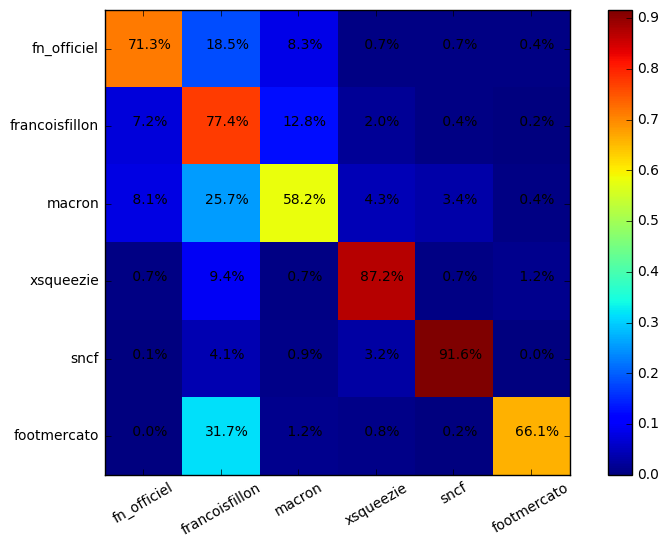

Epoch    3 : 3127.11   Test accuracy: 74.50 78.14 77.21 75.86 77.07 76.64 76.68 
Epoch    3 : 3118.32   Test accuracy: 74.55 78.14 77.09 75.80 77.05 76.66 76.55 
Epoch    3 : 3109.68   Test accuracy: 74.59 78.05 77.07 75.80 77.14 76.66 76.55 
Epoch    3 : 3101.19   Test accuracy: 74.61 78.03 77.21 75.82 77.12 76.66 76.50 
Epoch    3 : 3092.84   Test accuracy: 74.64 77.93 77.23 75.71 77.12 76.59 76.55 
Epoch    3 : 3084.62   Test accuracy: 74.66 77.96 77.23 75.75 77.12 76.57 76.55 
Epoch    3 : 3076.54   Test accuracy: 74.66 77.91 77.21 75.71 77.09 76.64 76.55 
Epoch    3 : 3068.59   Test accuracy: 74.73 77.87 77.18 75.80 77.16 76.64 76.59 
Epoch    3 : 3060.76   Test accuracy: 74.68 77.96 77.18 75.73 77.07 76.68 76.52 
Epoch    3 : 3053.05   Test accuracy: 74.80 78.09 77.18 75.68 77.00 76.59 76.36 
-------------------------------------------------
| 71.6% | 18.2% |  8.4% |  0.8% |  0.6% |  0.4% |   Total: 890
-------------------------------------------------
|  7.4% | 77.3% | 12.7% |  

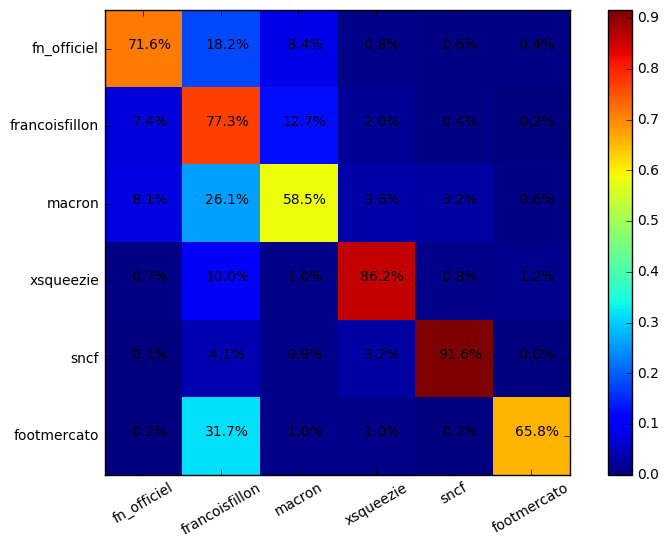

##################### 1 - Essai 1 ###################
Epoch    3 : 4867.78   Test accuracy: 69.43 73.89 71.52 70.45 71.34 71.68 70.91 
Epoch    3 : 4397.66   Test accuracy: 74.70 75.02 75.84 74.89 75.73 75.86 75.39 
Epoch    3 : 4212.65   Test accuracy: 75.27 75.77 76.46 75.57 76.34 76.59 76.07 
Epoch    3 : 4096.48   Test accuracy: 76.09 76.09 77.32 76.43 77.07 77.46 76.62 
Epoch    3 : 4012.13   Test accuracy: 76.68 76.36 77.75 76.82 77.73 77.80 76.91 
Epoch    3 : 3946.05   Test accuracy: 76.75 76.43 78.03 77.16 77.91 78.21 77.30 
Epoch    3 : 3891.36   Test accuracy: 77.23 76.68 78.12 77.23 78.00 78.28 77.39 
Epoch    3 : 3844.54   Test accuracy: 77.62 76.75 78.34 77.57 78.23 78.59 77.53 
Epoch    3 : 3803.41   Test accuracy: 77.53 76.89 78.59 77.48 78.39 78.66 77.71 
Epoch    3 : 3766.53   Test accuracy: 77.53 76.89 78.64 77.68 78.48 78.69 77.82 
-------------------------------------------------
| 72.2% | 17.6% |  7.2% |  1.1% |  0.8% |  1.0% |   Total: 890
-----------------------

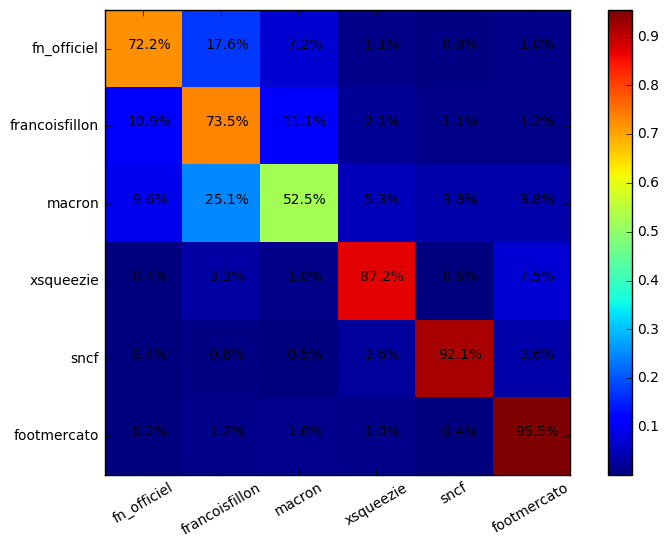

Epoch    3 : 3732.93   Test accuracy: 77.50 77.23 78.50 77.78 78.46 78.62 77.80 
Epoch    3 : 3701.97   Test accuracy: 73.91 77.27 76.05 74.86 76.14 76.07 75.55 
Epoch    3 : 3673.19   Test accuracy: 73.84 77.27 76.14 74.98 76.02 76.21 75.64 
Epoch    3 : 3646.26   Test accuracy: 73.82 77.32 76.18 75.00 76.09 76.36 75.66 
Epoch    3 : 3620.90   Test accuracy: 73.77 77.48 76.30 75.05 76.16 76.34 75.77 
Epoch    3 : 3596.89   Test accuracy: 73.82 77.53 76.39 75.00 76.18 76.34 75.80 
Epoch    3 : 3574.09   Test accuracy: 73.73 77.53 76.30 75.02 76.11 76.39 75.73 
Epoch    3 : 3552.39   Test accuracy: 73.98 77.53 76.25 75.07 76.23 76.48 75.75 
Epoch    3 : 3531.70   Test accuracy: 74.07 77.66 76.43 75.05 76.36 76.59 75.80 
Epoch    3 : 3511.95   Test accuracy: 74.07 77.71 76.50 75.02 76.39 76.66 75.86 
-------------------------------------------------
| 72.5% | 18.3% |  7.0% |  1.0% |  0.8% |  0.4% |   Total: 890
-------------------------------------------------
| 10.4% | 75.7% | 10.8% |  

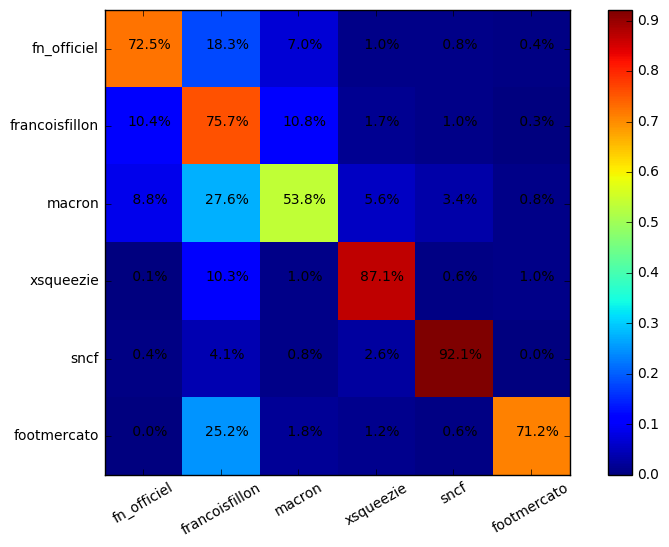

Epoch    3 : 3493.06   Test accuracy: 74.14 77.66 76.48 75.02 76.36 76.73 75.91 
Epoch    3 : 3474.96   Test accuracy: 74.18 77.68 76.52 75.16 76.34 76.66 75.93 
Epoch    3 : 3457.57   Test accuracy: 74.14 77.78 76.50 75.20 76.41 76.59 75.98 
Epoch    3 : 3440.85   Test accuracy: 74.04 77.75 76.46 75.11 76.32 76.57 76.00 
Epoch    3 : 3424.74   Test accuracy: 74.07 77.82 76.41 75.30 76.32 76.57 75.93 
Epoch    3 : 3409.22   Test accuracy: 74.18 77.84 76.48 75.20 76.39 76.71 76.00 
Epoch    3 : 3394.25   Test accuracy: 74.39 77.91 76.62 75.14 76.50 76.73 76.02 
Epoch    3 : 3379.83   Test accuracy: 74.23 77.87 76.68 75.23 76.66 76.80 76.00 
Epoch    3 : 3365.94   Test accuracy: 74.20 77.82 76.62 75.34 76.68 76.80 76.00 
Epoch    3 : 3352.55   Test accuracy: 74.25 77.87 76.68 75.39 76.64 76.73 75.91 
-------------------------------------------------
| 73.3% | 17.3% |  7.8% |  0.7% |  0.7% |  0.3% |   Total: 890
-------------------------------------------------
|  9.8% | 75.6% | 11.6% |  

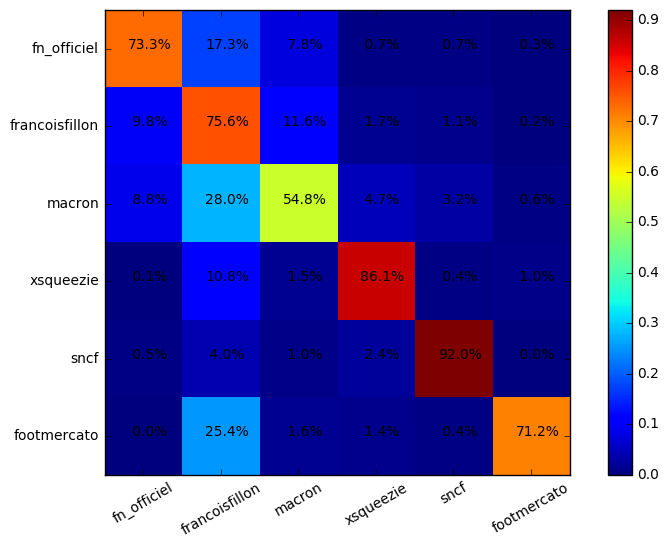

Epoch    3 : 3339.65   Test accuracy: 74.32 77.93 76.64 75.43 76.64 76.82 76.09 
Epoch    3 : 3327.20   Test accuracy: 74.32 77.89 76.73 75.48 76.64 76.82 76.09 
Epoch    3 : 3315.17   Test accuracy: 74.36 77.93 76.68 75.34 76.68 76.87 76.14 
Epoch    3 : 3303.51   Test accuracy: 74.32 77.91 76.75 75.30 76.62 76.96 76.07 
Epoch    3 : 3292.19   Test accuracy: 74.39 77.84 76.77 75.32 76.62 76.87 76.09 
Epoch    3 : 3281.19   Test accuracy: 74.43 77.80 76.75 75.34 76.64 76.73 76.11 
Epoch    3 : 3270.49   Test accuracy: 74.39 77.82 76.80 75.32 76.77 76.77 76.07 
Epoch    3 : 3260.05   Test accuracy: 74.34 77.87 76.75 75.27 76.73 76.71 75.98 
Epoch    3 : 3249.86   Test accuracy: 74.27 77.93 76.84 75.32 76.77 76.66 75.96 
Epoch    3 : 3239.90   Test accuracy: 74.29 77.91 76.77 75.39 76.77 76.57 75.98 
-------------------------------------------------
| 71.9% | 18.2% |  8.4% |  0.7% |  0.6% |  0.2% |   Total: 890
-------------------------------------------------
|  9.8% | 76.4% | 10.8% |  

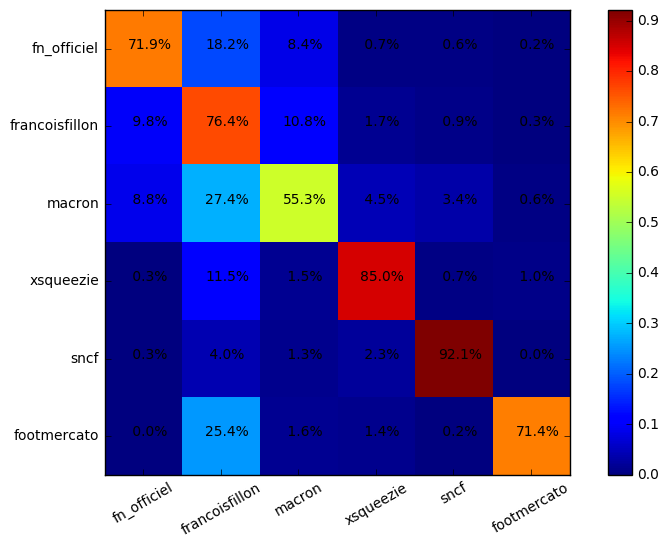

Epoch    3 : 3230.16   Test accuracy: 74.23 77.93 76.77 75.45 76.73 76.73 75.96 
Epoch    3 : 3220.61   Test accuracy: 74.18 78.03 76.71 75.41 76.77 76.68 75.93 
Epoch    3 : 3211.26   Test accuracy: 74.16 78.12 76.71 75.39 76.71 76.59 75.89 
Epoch    3 : 3202.09   Test accuracy: 74.14 78.14 76.73 75.36 76.62 76.62 75.93 
Epoch    3 : 3193.10   Test accuracy: 74.11 78.18 76.66 75.32 76.50 76.71 75.84 
Epoch    3 : 3184.28   Test accuracy: 74.14 78.18 76.71 75.34 76.46 76.68 75.98 
Epoch    3 : 3175.61   Test accuracy: 74.00 78.14 76.57 75.25 76.43 76.62 76.11 
Epoch    3 : 3167.09   Test accuracy: 73.98 78.05 76.43 75.32 76.55 76.55 76.16 
Epoch    3 : 3158.72   Test accuracy: 73.91 78.00 76.48 75.32 76.59 76.57 76.02 
Epoch    3 : 3150.48   Test accuracy: 73.89 77.87 76.57 75.41 76.59 76.48 76.05 
-------------------------------------------------
| 71.8% | 17.6% |  8.9% |  0.8% |  0.7% |  0.2% |   Total: 890
-------------------------------------------------
|  9.2% | 75.9% | 12.0% |  

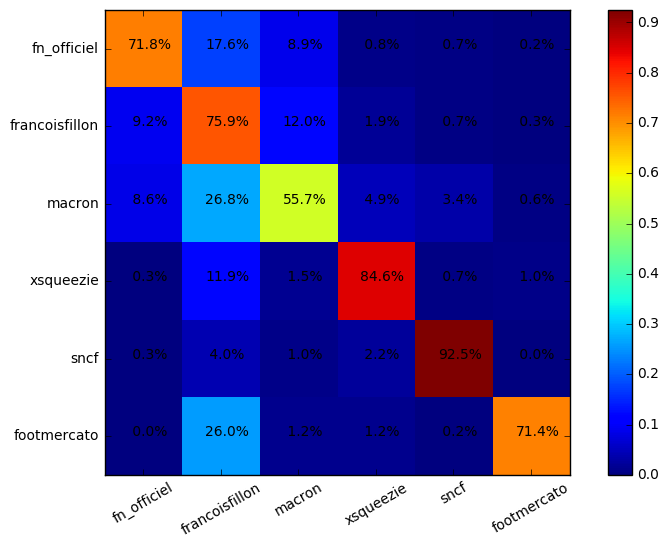

Epoch    3 : 3142.37   Test accuracy: 73.79 77.98 76.64 75.45 76.59 76.50 76.00 
Epoch    3 : 3134.37   Test accuracy: 73.77 77.96 76.59 75.43 76.71 76.46 76.00 
Epoch    3 : 3126.50   Test accuracy: 73.84 77.96 76.57 75.45 76.66 76.48 76.02 
Epoch    3 : 3118.74   Test accuracy: 73.77 77.93 76.66 75.39 76.64 76.55 76.07 
Epoch    3 : 3111.09   Test accuracy: 73.77 77.89 76.73 75.43 76.62 76.59 76.09 
Epoch    3 : 3103.54   Test accuracy: 73.86 77.89 76.75 75.39 76.71 76.57 76.05 
Epoch    3 : 3096.10   Test accuracy: 73.89 78.03 76.73 75.36 76.68 76.57 76.07 
Epoch    3 : 3088.75   Test accuracy: 73.86 77.98 76.75 75.45 76.71 76.62 76.07 
Epoch    3 : 3081.50   Test accuracy: 73.98 78.07 76.80 75.57 76.73 76.62 76.02 
Epoch    3 : 3074.34   Test accuracy: 74.04 78.07 76.96 75.55 76.73 76.62 76.05 
-------------------------------------------------
| 71.0% | 17.6% |  9.7% |  0.8% |  0.7% |  0.2% |   Total: 890
-------------------------------------------------
|  8.8% | 76.9% | 11.4% |  

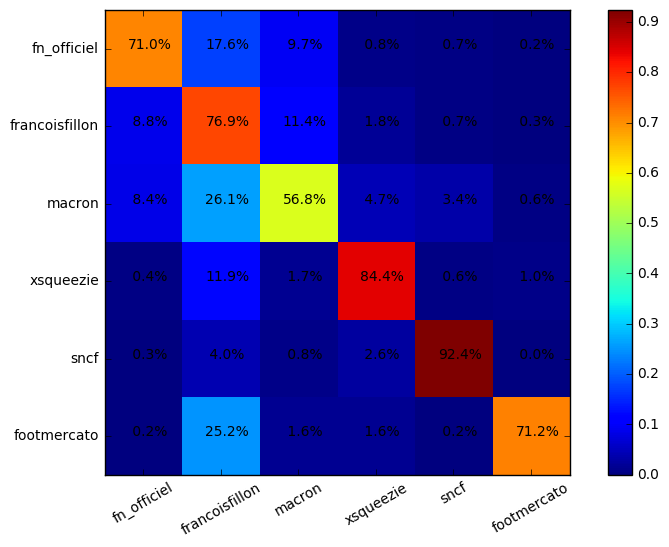

##################### 1 - Essai 2 ###################
Epoch    3 : 4914.60   Test accuracy: 69.38 73.04 71.75 70.38 71.68 71.72 71.29 
Epoch    3 : 4418.48   Test accuracy: 71.41 74.95 73.13 71.88 73.04 73.16 72.95 
Epoch    3 : 4240.81   Test accuracy: 71.54 75.36 73.70 72.41 73.64 73.75 73.25 
Epoch    3 : 4128.72   Test accuracy: 72.32 75.96 74.32 72.95 74.25 74.45 73.73 
Epoch    3 : 4042.70   Test accuracy: 72.73 76.39 74.91 73.27 74.70 75.00 74.27 
Epoch    3 : 3971.33   Test accuracy: 73.36 76.73 75.34 73.77 75.11 75.45 74.39 
Epoch    3 : 3910.41   Test accuracy: 73.54 76.80 75.66 74.07 75.45 75.84 74.64 
Epoch    3 : 3857.75   Test accuracy: 73.54 77.14 75.77 74.34 75.61 75.86 75.05 
Epoch    3 : 3811.84   Test accuracy: 73.79 77.27 76.00 74.61 75.98 76.23 75.25 
Epoch    3 : 3771.28   Test accuracy: 74.00 77.41 75.96 74.64 76.00 76.34 75.32 
-------------------------------------------------
| 71.3% | 18.0% |  8.2% |  1.0% |  0.9% |  0.6% |   Total: 890
-----------------------

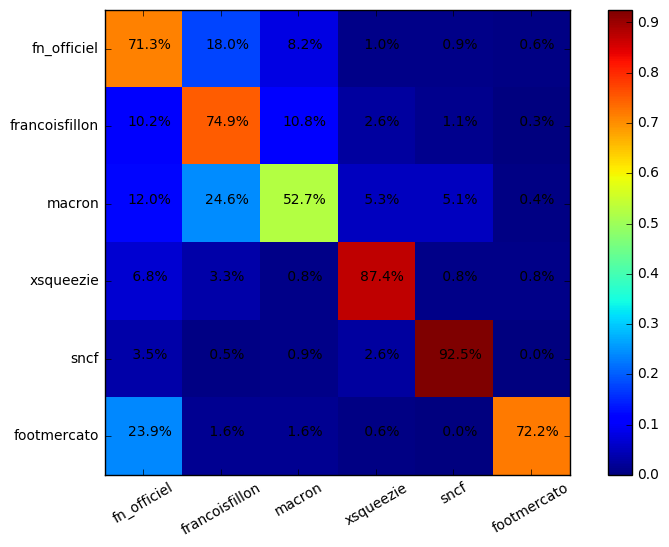

Epoch    3 : 3734.87   Test accuracy: 73.95 77.57 76.36 74.82 76.00 76.52 75.55 
Epoch    3 : 3701.67   Test accuracy: 74.00 77.59 76.50 74.84 76.32 76.62 75.71 
Epoch    3 : 3670.99   Test accuracy: 74.11 77.57 76.43 75.02 76.30 76.75 75.68 
Epoch    3 : 3642.36   Test accuracy: 74.23 77.41 76.57 75.20 76.32 76.84 75.80 
Epoch    3 : 3615.44   Test accuracy: 74.29 77.39 76.73 75.43 76.50 76.87 75.84 
Epoch    3 : 3590.03   Test accuracy: 74.45 77.53 76.68 75.27 76.55 76.84 75.77 
Epoch    3 : 3565.98   Test accuracy: 74.41 77.62 76.62 75.36 76.62 76.84 75.98 
Epoch    3 : 3543.18   Test accuracy: 74.29 77.82 76.75 75.41 76.57 76.98 76.09 
Epoch    3 : 3521.52   Test accuracy: 74.39 77.89 76.80 75.41 76.71 76.91 76.07 
Epoch    3 : 3500.92   Test accuracy: 74.45 77.91 76.77 75.52 76.84 76.84 76.07 
-------------------------------------------------
| 71.0% | 18.2% |  8.3% |  1.1% |  0.9% |  0.4% |   Total: 890
-------------------------------------------------
|  8.4% | 76.9% | 11.1% |  

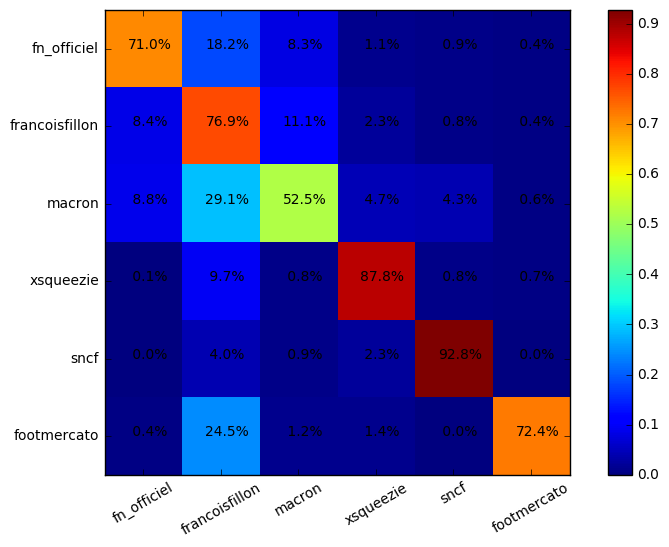

Epoch    3 : 3481.28   Test accuracy: 74.48 78.07 76.71 75.48 76.84 76.84 76.00 
Epoch    3 : 3462.51   Test accuracy: 74.55 77.98 76.80 75.39 76.73 76.91 76.09 
Epoch    3 : 3444.55   Test accuracy: 74.64 78.05 76.80 75.50 76.73 76.98 76.02 
Epoch    3 : 3427.33   Test accuracy: 74.61 78.12 76.73 75.48 76.71 77.00 76.21 
Epoch    3 : 3410.77   Test accuracy: 74.77 78.28 76.80 75.64 76.84 76.98 76.16 
Epoch    3 : 3394.83   Test accuracy: 74.80 78.18 76.87 75.68 76.84 77.00 76.09 
Epoch    3 : 3379.45   Test accuracy: 74.82 78.14 76.82 75.57 76.98 77.09 76.09 
Epoch    3 : 3364.59   Test accuracy: 74.86 78.16 76.87 75.59 77.00 77.12 76.09 
Epoch    3 : 3350.19   Test accuracy: 74.95 78.25 77.02 75.66 77.00 77.14 76.18 
Epoch    3 : 3336.23   Test accuracy: 75.05 78.32 77.07 75.73 77.07 77.18 76.27 
-------------------------------------------------
| 71.9% | 17.8% |  8.5% |  0.8% |  0.7% |  0.3% |   Total: 890
-------------------------------------------------
|  8.7% | 77.2% | 10.4% |  

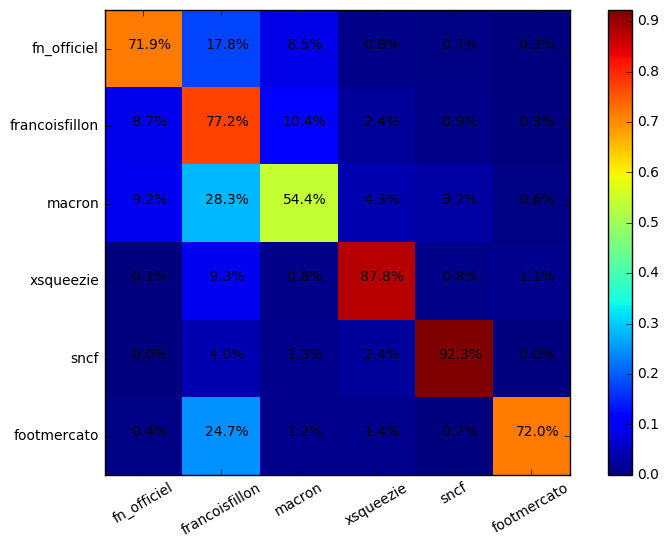

Epoch    3 : 3322.67   Test accuracy: 75.00 78.25 77.25 75.77 77.12 77.30 76.18 
Epoch    3 : 3309.48   Test accuracy: 74.95 78.25 77.18 75.91 77.14 77.30 76.30 
Epoch    3 : 3296.63   Test accuracy: 74.91 78.30 77.37 75.82 77.25 77.32 76.39 
Epoch    3 : 3284.11   Test accuracy: 75.02 78.23 77.32 75.98 77.25 77.34 76.52 
Epoch    3 : 3271.90   Test accuracy: 74.95 78.23 77.34 75.96 77.18 77.37 76.46 
Epoch    3 : 3259.97   Test accuracy: 74.84 78.28 77.34 75.96 77.23 77.43 76.48 
Epoch    3 : 3248.30   Test accuracy: 74.86 78.46 77.34 75.89 77.21 77.46 76.62 
Epoch    3 : 3236.89   Test accuracy: 74.86 78.46 77.27 75.96 77.27 77.43 76.62 
Epoch    3 : 3225.72   Test accuracy: 74.84 78.55 77.30 75.96 77.27 77.30 76.66 
Epoch    3 : 3214.78   Test accuracy: 74.77 78.55 77.34 76.00 77.18 77.37 76.71 
-------------------------------------------------
| 72.4% | 17.2% |  9.0% |  0.7% |  0.4% |  0.3% |   Total: 890
-------------------------------------------------
|  8.2% | 76.8% | 11.4% |  

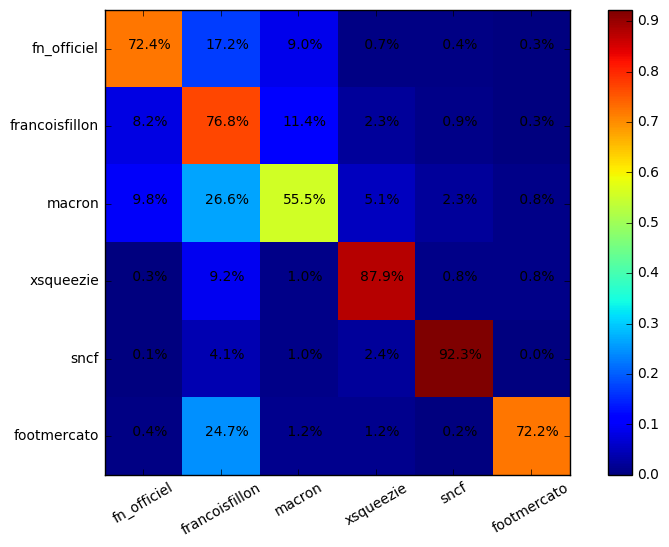

Epoch    3 : 3204.06   Test accuracy: 74.80 78.59 77.32 76.00 77.23 77.41 76.80 
Epoch    3 : 3193.57   Test accuracy: 74.68 78.57 77.37 76.02 77.23 77.41 76.75 
Epoch    3 : 3183.29   Test accuracy: 74.66 78.55 77.41 75.98 77.30 77.34 76.68 
Epoch    3 : 3173.22   Test accuracy: 74.61 78.57 77.37 76.00 77.30 77.41 76.71 
Epoch    3 : 3163.35   Test accuracy: 74.64 78.57 77.37 75.98 77.27 77.39 76.59 
Epoch    3 : 3153.67   Test accuracy: 74.75 78.59 77.32 75.93 77.18 77.43 76.62 
Epoch    3 : 3144.19   Test accuracy: 74.73 78.69 77.34 76.00 77.25 77.39 76.55 
Epoch    3 : 3134.89   Test accuracy: 74.68 78.69 77.37 76.00 77.21 77.46 76.57 
Epoch    3 : 3125.76   Test accuracy: 74.75 78.73 77.50 76.07 77.18 77.57 76.62 
Epoch    3 : 3116.82   Test accuracy: 74.84 78.69 77.46 76.09 77.25 77.55 76.66 
-------------------------------------------------
| 73.0% | 16.9% |  8.7% |  0.8% |  0.3% |  0.3% |   Total: 890
-------------------------------------------------
|  7.6% | 76.7% | 12.2% |  

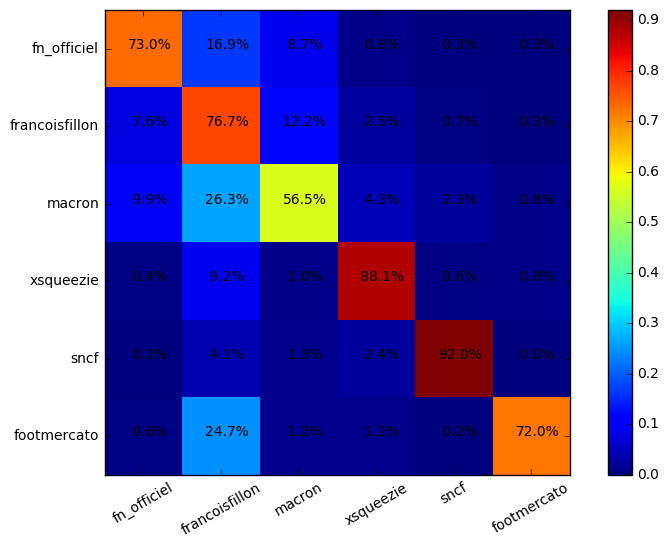

Epoch    3 : 3108.04   Test accuracy: 74.95 78.71 77.43 76.07 77.21 77.46 76.73 
Epoch    3 : 3099.42   Test accuracy: 74.93 78.75 77.43 76.07 77.27 77.46 76.77 
Epoch    3 : 3090.97   Test accuracy: 74.91 78.73 77.41 76.00 77.32 77.43 76.68 
Epoch    3 : 3082.68   Test accuracy: 74.91 78.66 77.46 75.98 77.32 77.41 76.77 
Epoch    3 : 3074.54   Test accuracy: 74.93 78.62 77.53 76.00 77.43 77.41 76.66 
Epoch    3 : 3066.54   Test accuracy: 74.95 78.55 77.53 76.02 77.30 77.43 76.66 
Epoch    3 : 3058.70   Test accuracy: 74.86 78.53 77.50 76.02 77.34 77.43 76.64 
Epoch    3 : 3050.99   Test accuracy: 74.95 78.48 77.46 76.02 77.27 77.34 76.62 
Epoch    3 : 3043.42   Test accuracy: 75.05 78.34 77.37 76.00 77.32 77.30 76.52 
Epoch    3 : 3035.98   Test accuracy: 75.07 78.34 77.39 76.02 77.25 77.27 76.48 
-------------------------------------------------
| 72.6% | 16.7% |  9.1% |  0.8% |  0.2% |  0.6% |   Total: 890
-------------------------------------------------
|  8.2% | 76.0% | 12.2% |  

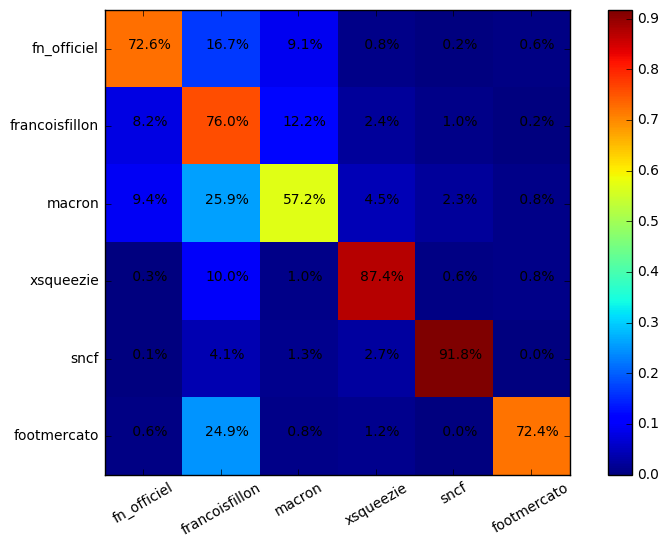

##################### 1 - Essai 3 ###################
Epoch    3 : 4952.87   Test accuracy: 69.22 72.77 71.31 69.79 71.11 71.45 70.50 
Epoch    3 : 4472.86   Test accuracy: 70.97 74.52 72.79 71.43 72.57 73.02 72.29 
Epoch    3 : 4292.67   Test accuracy: 71.68 75.27 73.68 72.18 73.54 73.86 73.18 
Epoch    3 : 4171.61   Test accuracy: 72.52 75.91 74.32 72.88 74.20 74.45 73.79 
Epoch    3 : 4077.10   Test accuracy: 72.70 76.09 75.05 73.45 74.80 75.09 74.32 
Epoch    3 : 4000.20   Test accuracy: 73.09 76.32 75.27 73.84 75.16 75.50 74.66 
Epoch    3 : 3935.80   Test accuracy: 73.36 76.55 75.64 74.00 75.48 75.91 74.84 
Epoch    3 : 3880.14   Test accuracy: 73.59 76.71 76.00 74.55 75.89 76.27 75.02 
Epoch    3 : 3830.79   Test accuracy: 73.70 76.84 76.00 74.45 76.05 76.25 75.36 
Epoch    3 : 3786.32   Test accuracy: 73.82 77.07 76.27 74.68 76.27 76.36 75.61 
-------------------------------------------------
| 72.4% | 16.9% |  8.3% |  0.9% |  1.0% |  0.6% |   Total: 890
-----------------------

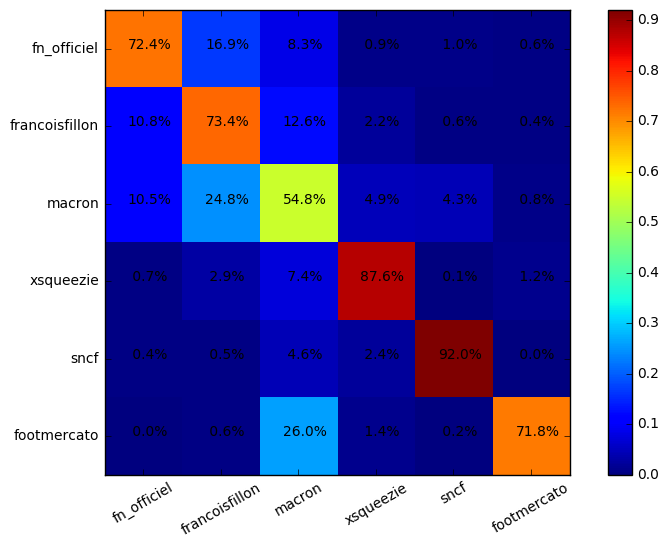

Epoch    3 : 3746.07   Test accuracy: 73.95 77.30 76.43 74.89 76.43 76.57 75.68 
Epoch    3 : 3709.48   Test accuracy: 74.23 77.43 76.48 74.98 76.41 76.66 75.71 
Epoch    3 : 3675.99   Test accuracy: 74.36 77.66 76.62 75.14 76.52 76.80 75.80 
Epoch    3 : 3645.15   Test accuracy: 74.57 77.82 77.00 75.30 76.82 77.00 75.93 
Epoch    3 : 3616.59   Test accuracy: 74.41 78.00 77.05 75.36 77.00 76.91 76.18 
Epoch    3 : 3589.92   Test accuracy: 74.43 78.25 76.96 75.45 76.96 77.02 76.18 
Epoch    3 : 3565.06   Test accuracy: 74.50 78.34 77.00 75.55 76.82 77.25 76.07 
Epoch    3 : 3541.87   Test accuracy: 74.55 78.25 76.98 75.36 76.82 77.18 75.98 
Epoch    3 : 3520.16   Test accuracy: 74.48 78.30 77.00 75.50 76.87 77.18 76.07 
Epoch    3 : 3499.74   Test accuracy: 74.34 78.23 77.00 75.34 76.87 77.16 76.23 
-------------------------------------------------
| 73.1% | 16.6% |  8.4% |  0.4% |  0.9% |  0.4% |   Total: 890
-------------------------------------------------
| 10.1% | 74.4% | 12.2% |  

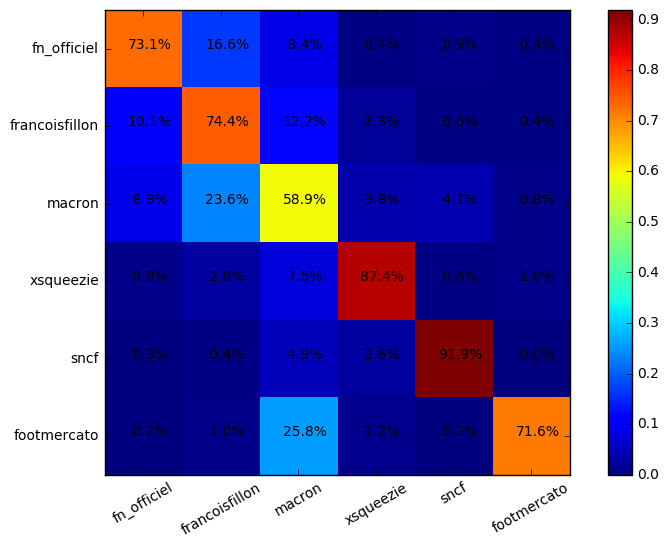

Epoch    3 : 3480.48   Test accuracy: 74.16 78.39 76.93 75.25 76.77 77.12 76.23 
Epoch    3 : 3462.25   Test accuracy: 74.09 78.23 76.82 75.25 76.68 77.05 76.39 
Epoch    3 : 3444.95   Test accuracy: 74.11 78.16 76.87 75.23 76.62 77.00 76.16 
Epoch    3 : 3428.49   Test accuracy: 74.16 78.03 76.71 75.23 76.50 76.91 76.23 
Epoch    3 : 3412.79   Test accuracy: 74.20 77.96 76.64 75.02 76.55 76.73 76.21 
Epoch    3 : 3397.77   Test accuracy: 74.18 78.05 76.43 74.98 76.52 76.71 76.21 
Epoch    3 : 3383.36   Test accuracy: 74.16 77.96 76.46 74.98 76.32 76.75 76.11 
Epoch    3 : 3369.50   Test accuracy: 74.11 77.87 76.48 74.86 76.32 76.62 75.96 
Epoch    3 : 3356.14   Test accuracy: 74.09 77.89 76.39 74.93 76.30 76.52 75.89 
Epoch    3 : 3343.23   Test accuracy: 74.11 77.91 76.36 74.91 76.34 76.59 75.93 
-------------------------------------------------
| 71.1% | 17.5% |  9.4% |  0.4% |  0.9% |  0.6% |   Total: 890
-------------------------------------------------
|  9.7% | 74.2% | 12.9% |  

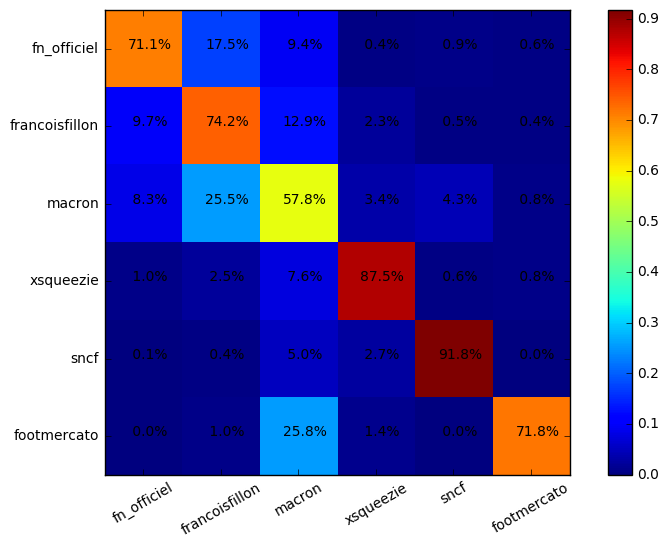

Epoch    3 : 3330.74   Test accuracy: 74.09 77.89 76.48 74.93 76.39 76.55 75.91 
Epoch    3 : 3318.64   Test accuracy: 74.07 77.82 76.48 74.89 76.46 76.59 75.84 
Epoch    3 : 3306.89   Test accuracy: 73.98 77.78 76.46 74.82 76.39 76.62 75.89 
Epoch    3 : 3295.47   Test accuracy: 74.02 77.82 76.43 74.82 76.39 76.64 75.80 
Epoch    3 : 3284.36   Test accuracy: 74.04 77.91 76.46 74.82 76.16 76.66 75.73 
Epoch    3 : 3273.53   Test accuracy: 74.09 77.98 76.41 74.84 76.21 76.71 75.66 
Epoch    3 : 3262.96   Test accuracy: 74.04 77.98 76.43 74.82 76.25 76.66 75.77 
Epoch    3 : 3252.63   Test accuracy: 74.07 78.12 76.43 74.84 76.48 76.64 75.84 
Epoch    3 : 3242.52   Test accuracy: 74.16 78.21 76.55 74.89 76.43 76.57 75.86 
Epoch    3 : 3232.62   Test accuracy: 74.09 78.25 76.59 74.98 76.52 76.62 75.93 
-------------------------------------------------
| 70.9% | 18.2% |  8.8% |  0.6% |  1.0% |  0.6% |   Total: 890
-------------------------------------------------
|  9.4% | 74.1% | 13.0% |  

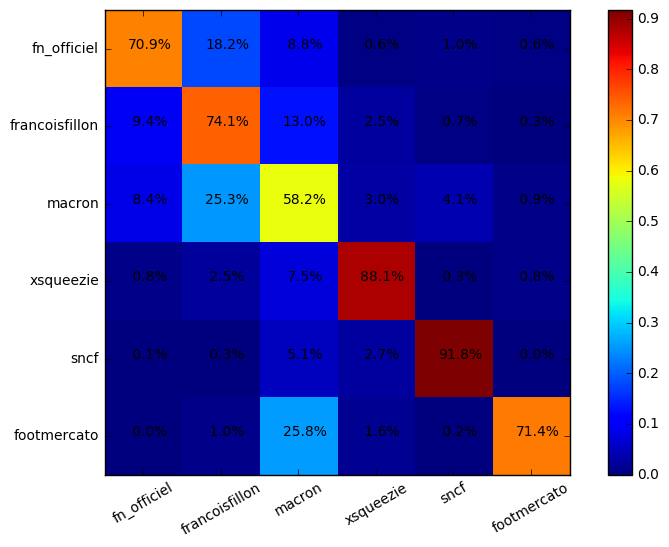

Epoch    3 : 3222.91   Test accuracy: 74.11 78.28 76.62 75.02 76.59 76.80 76.00 
Epoch    3 : 3213.37   Test accuracy: 74.04 78.34 76.75 75.09 76.64 76.87 76.02 
Epoch    3 : 3203.99   Test accuracy: 74.20 78.32 76.91 75.11 76.82 76.96 76.00 
Epoch    3 : 3194.76   Test accuracy: 74.14 78.25 76.82 75.07 76.82 77.00 76.07 
Epoch    3 : 3185.67   Test accuracy: 74.25 78.28 76.89 75.11 76.80 77.05 76.07 
Epoch    3 : 3176.72   Test accuracy: 74.23 78.34 76.82 75.09 76.71 76.93 76.14 
Epoch    3 : 3167.89   Test accuracy: 74.20 78.39 76.80 75.02 76.71 76.87 76.00 
Epoch    3 : 3159.17   Test accuracy: 74.27 78.41 76.77 75.14 76.71 76.91 76.02 
Epoch    3 : 3150.57   Test accuracy: 74.27 78.43 76.87 75.23 76.75 76.87 76.02 
Epoch    3 : 3142.08   Test accuracy: 74.32 78.46 76.82 75.20 76.77 76.96 76.07 
-------------------------------------------------
| 71.6% | 17.5% |  9.0% |  0.6% |  1.0% |  0.3% |   Total: 890
-------------------------------------------------
|  9.0% | 74.6% | 13.2% |  

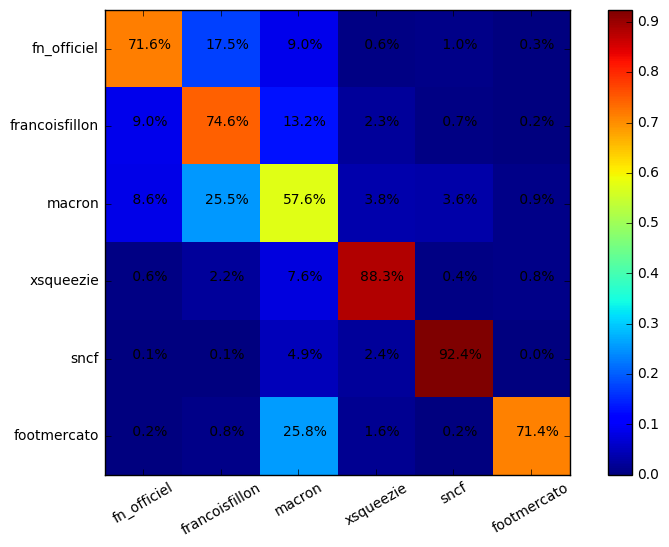

Epoch    3 : 3133.70   Test accuracy: 74.29 78.43 76.80 75.16 76.73 76.96 75.98 
Epoch    3 : 3125.42   Test accuracy: 74.25 78.41 76.82 75.18 76.59 76.98 76.00 
Epoch    3 : 3117.24   Test accuracy: 74.18 78.39 76.71 75.18 76.62 76.96 76.00 
Epoch    3 : 3109.15   Test accuracy: 74.23 78.39 76.75 75.23 76.57 76.93 75.91 
Epoch    3 : 3101.17   Test accuracy: 74.14 78.41 76.71 75.05 76.52 76.87 75.84 
Epoch    3 : 3093.28   Test accuracy: 74.14 78.41 76.77 75.05 76.55 76.84 75.93 
Epoch    3 : 3085.48   Test accuracy: 74.14 78.46 76.75 75.09 76.62 76.82 75.77 
Epoch    3 : 3077.78   Test accuracy: 74.11 78.48 76.71 75.20 76.57 76.84 75.80 
Epoch    3 : 3070.18   Test accuracy: 74.04 78.50 76.66 75.14 76.62 76.87 75.89 
Epoch    3 : 3062.67   Test accuracy: 74.09 78.48 76.73 75.14 76.57 76.80 75.91 
-------------------------------------------------
| 71.3% | 17.6% |  9.0% |  0.6% |  1.0% |  0.4% |   Total: 890
-------------------------------------------------
|  9.0% | 74.2% | 13.8% |  

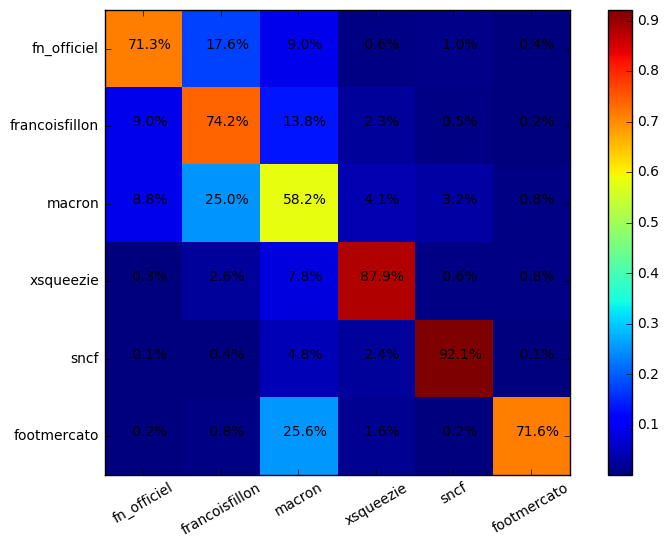

##################### 1 - Essai 4 ###################
Epoch    3 : 4966.85   Test accuracy: 69.18 73.52 71.57 70.15 71.43 71.68 70.81 
Epoch    3 : 4446.48   Test accuracy: 71.29 74.86 73.13 71.84 73.09 73.36 72.68 
Epoch    3 : 4258.27   Test accuracy: 72.13 75.77 73.93 72.61 73.84 74.20 73.38 
Epoch    3 : 4139.17   Test accuracy: 72.77 75.86 74.66 73.23 74.39 74.89 73.93 
Epoch    3 : 4051.21   Test accuracy: 72.73 76.14 74.82 73.52 74.68 74.95 74.07 
Epoch    3 : 3981.41   Test accuracy: 73.07 76.30 75.27 73.73 75.09 75.48 74.45 
Epoch    3 : 3923.17   Test accuracy: 73.41 76.64 75.39 73.86 75.23 75.55 74.77 
Epoch    3 : 3872.79   Test accuracy: 73.64 76.68 75.75 74.00 75.50 75.75 75.05 
Epoch    3 : 3828.43   Test accuracy: 73.86 77.00 76.00 74.34 75.77 76.02 75.14 
Epoch    3 : 3788.76   Test accuracy: 73.98 77.12 76.32 74.82 76.25 76.34 75.55 
-------------------------------------------------
| 71.7% | 18.8% |  7.1% |  1.0% |  0.9% |  0.6% |   Total: 890
-----------------------

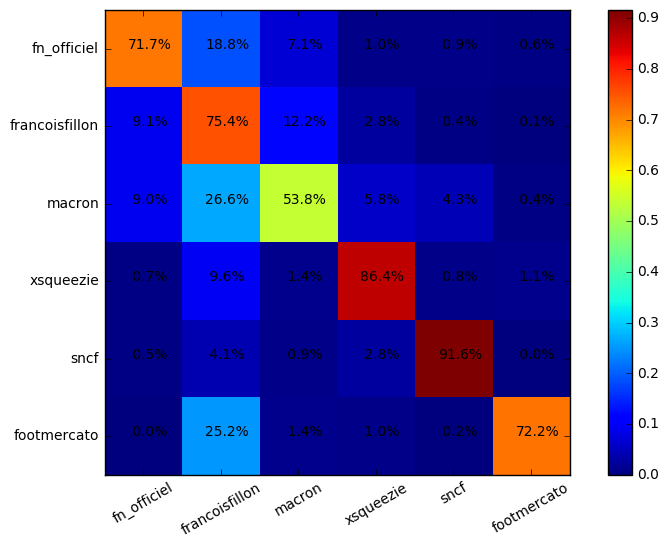

Epoch    3 : 3752.74   Test accuracy: 74.20 77.32 76.46 75.18 76.43 76.64 75.84 
Epoch    3 : 3719.69   Test accuracy: 74.34 77.14 76.68 75.20 76.59 76.64 75.93 
Epoch    3 : 3689.18   Test accuracy: 74.25 77.34 76.59 75.32 76.55 76.66 76.05 
Epoch    3 : 3660.90   Test accuracy: 74.27 77.46 76.64 75.34 76.57 76.89 76.09 
Epoch    3 : 3634.57   Test accuracy: 74.41 77.43 76.73 75.30 76.68 76.82 76.05 
Epoch    3 : 3609.94   Test accuracy: 74.36 77.64 76.77 75.41 76.71 76.89 76.21 
Epoch    3 : 3586.76   Test accuracy: 74.50 77.73 76.91 75.55 76.87 76.87 76.21 
Epoch    3 : 3564.79   Test accuracy: 74.61 77.80 77.02 75.77 77.07 77.02 76.30 
Epoch    3 : 3543.82   Test accuracy: 74.55 77.91 77.09 75.82 77.23 77.16 76.48 
Epoch    3 : 3523.70   Test accuracy: 74.70 77.96 77.12 75.93 77.12 77.14 76.39 
-------------------------------------------------
| 71.7% | 18.9% |  7.2% |  0.9% |  0.8% |  0.6% |   Total: 890
-------------------------------------------------
|  8.1% | 76.9% | 11.2% |  

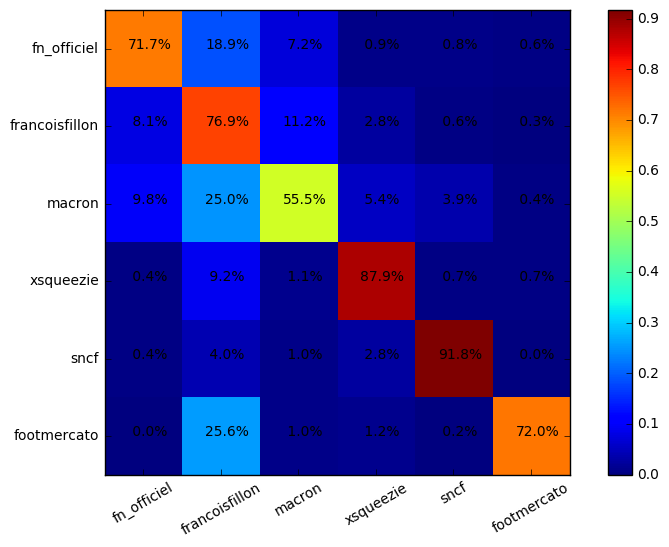

Epoch    3 : 3504.31   Test accuracy: 74.59 77.93 77.16 75.96 77.18 77.27 76.48 
Epoch    3 : 3485.56   Test accuracy: 74.59 78.00 77.12 75.98 77.27 77.32 76.48 
Epoch    3 : 3467.41   Test accuracy: 74.68 78.07 77.12 75.86 77.07 77.30 76.52 
Epoch    3 : 3449.80   Test accuracy: 74.75 78.07 77.25 75.98 77.07 77.41 76.27 
Epoch    3 : 3432.69   Test accuracy: 74.80 78.12 77.39 76.16 77.18 77.68 76.30 
Epoch    3 : 3416.06   Test accuracy: 74.82 78.07 77.43 76.16 77.16 77.68 76.36 
Epoch    3 : 3399.87   Test accuracy: 74.82 78.25 77.46 76.14 77.25 77.68 76.43 
Epoch    3 : 3384.10   Test accuracy: 74.73 78.25 77.41 76.11 77.27 77.66 76.59 
Epoch    3 : 3368.76   Test accuracy: 74.57 78.25 77.30 76.14 77.16 77.57 76.50 
Epoch    3 : 3353.82   Test accuracy: 74.57 78.25 77.25 76.02 77.12 77.50 76.48 
-------------------------------------------------
| 71.9% | 17.9% |  8.1% |  1.0% |  0.6% |  0.6% |   Total: 890
-------------------------------------------------
|  7.5% | 77.1% | 11.2% |  

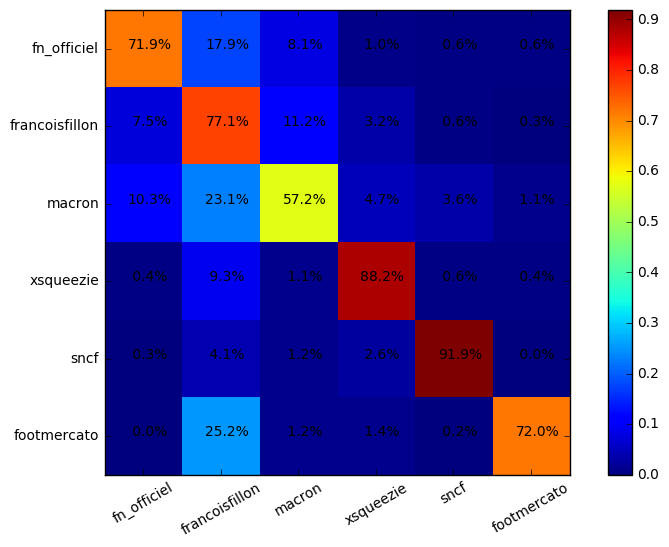

Epoch    3 : 3339.27   Test accuracy: 74.68 78.09 77.09 75.96 77.12 77.39 76.46 
Epoch    3 : 3325.09   Test accuracy: 74.61 78.21 77.12 75.89 77.00 77.30 76.48 
Epoch    3 : 3311.26   Test accuracy: 74.66 78.16 77.09 75.89 77.07 77.21 76.41 
Epoch    3 : 3297.75   Test accuracy: 74.57 78.21 76.98 75.84 77.00 77.14 76.41 
Epoch    3 : 3284.56   Test accuracy: 74.64 78.32 76.98 75.86 76.96 77.14 76.30 
Epoch    3 : 3271.69   Test accuracy: 74.61 78.28 76.93 75.93 76.91 77.09 76.39 
Epoch    3 : 3259.13   Test accuracy: 74.61 78.25 76.96 75.89 76.96 77.12 76.46 
Epoch    3 : 3246.88   Test accuracy: 74.48 78.28 77.05 75.82 76.89 77.07 76.39 
Epoch    3 : 3234.93   Test accuracy: 74.48 78.18 76.98 75.71 76.93 77.09 76.46 
Epoch    3 : 3223.28   Test accuracy: 74.41 78.18 76.98 75.86 76.93 77.14 76.46 
-------------------------------------------------
| 71.7% | 17.3% |  8.5% |  1.1% |  0.8% |  0.6% |   Total: 890
-------------------------------------------------
|  7.5% | 76.2% | 12.2% |  

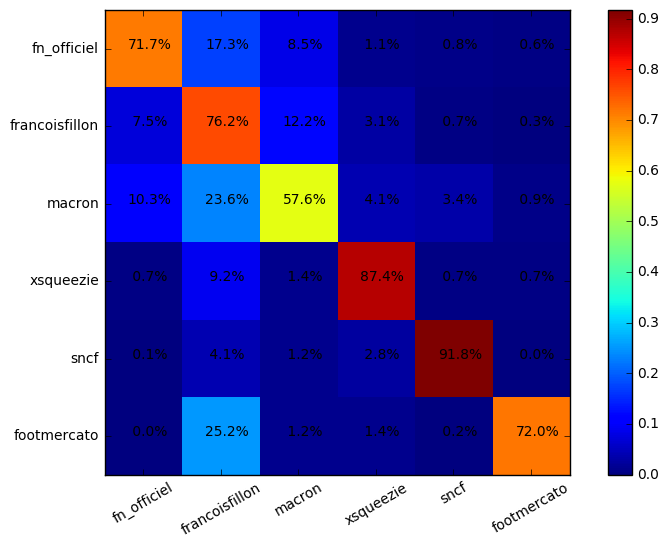

Epoch    3 : 3211.91   Test accuracy: 74.48 78.05 76.96 75.86 77.00 77.16 76.46 
Epoch    3 : 3200.81   Test accuracy: 74.45 78.07 77.05 75.82 76.98 77.16 76.48 
Epoch    3 : 3189.98   Test accuracy: 74.57 78.09 77.02 75.66 77.00 77.05 76.43 
Epoch    3 : 3179.40   Test accuracy: 74.52 78.09 77.02 75.71 76.96 77.09 76.48 
Epoch    3 : 3169.06   Test accuracy: 74.52 78.03 77.00 75.73 77.00 77.09 76.48 
Epoch    3 : 3158.94   Test accuracy: 74.48 77.87 77.05 75.73 77.05 77.23 76.50 
Epoch    3 : 3149.05   Test accuracy: 74.48 77.89 77.12 75.71 77.14 77.32 76.66 
Epoch    3 : 3139.36   Test accuracy: 74.45 77.87 77.21 75.84 77.14 77.34 76.64 
Epoch    3 : 3129.86   Test accuracy: 74.52 77.87 77.21 75.86 77.16 77.37 76.71 
Epoch    3 : 3120.56   Test accuracy: 74.61 77.91 77.16 75.98 77.27 77.27 76.73 
-------------------------------------------------
| 72.8% | 16.1% |  8.9% |  0.9% |  0.9% |  0.4% |   Total: 890
-------------------------------------------------
|  7.6% | 76.4% | 12.2% |  

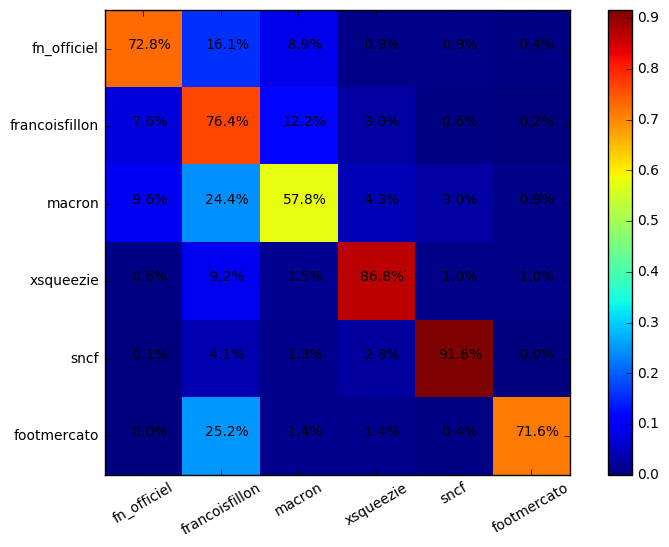

Epoch    3 : 3111.43   Test accuracy: 74.55 77.96 77.30 76.02 77.32 77.32 76.82 
Epoch    3 : 3102.47   Test accuracy: 74.59 78.00 77.32 76.11 77.21 77.34 76.75 
Epoch    3 : 3093.68   Test accuracy: 74.50 77.87 77.30 76.09 77.09 77.32 76.75 
Epoch    3 : 3085.07   Test accuracy: 74.48 77.82 77.37 76.11 77.21 77.25 76.73 
Epoch    3 : 3076.61   Test accuracy: 74.48 77.87 77.25 76.07 77.16 77.32 76.71 
Epoch    3 : 3068.31   Test accuracy: 74.52 77.80 77.16 76.11 77.21 77.25 76.66 
Epoch    3 : 3060.17   Test accuracy: 74.57 77.80 77.27 76.11 77.16 77.27 76.71 
Epoch    3 : 3052.17   Test accuracy: 74.57 77.75 77.27 76.11 77.18 77.27 76.66 
Epoch    3 : 3044.31   Test accuracy: 74.57 77.82 77.23 76.07 77.18 77.25 76.57 
Epoch    3 : 3036.58   Test accuracy: 74.50 77.68 77.21 76.00 77.14 77.21 76.48 
-------------------------------------------------
| 73.0% | 16.1% |  9.0% |  0.8% |  0.6% |  0.6% |   Total: 890
-------------------------------------------------
|  8.8% | 76.0% | 11.3% |  

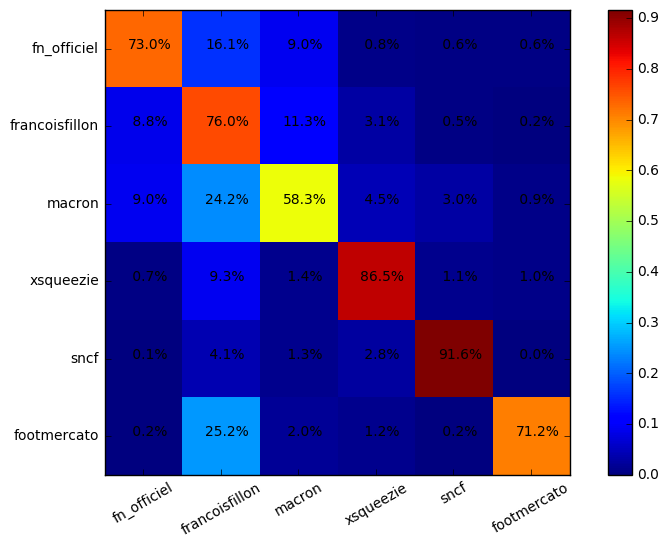

##################### 2 - Essai 0 ###################
Epoch    3 : 19204.04   Test accuracy: 57.43 77.04 61.93 59.28 61.83 61.93 61.51 
Epoch    3 : 16570.43   Test accuracy: 58.97 79.17 63.64 60.96 63.57 63.68 63.22 
Epoch    3 : 15669.45   Test accuracy: 58.69 79.62 63.12 60.40 63.05 63.22 62.74 
Epoch    3 : 15117.62   Test accuracy: 58.97 79.90 63.47 60.71 63.47 63.54 63.19 
Epoch    3 : 14703.80   Test accuracy: 58.86 80.32 63.64 60.75 63.57 63.85 63.26 
Epoch    3 : 14363.42   Test accuracy: 59.11 80.39 63.92 61.10 63.85 63.99 63.22 
Epoch    3 : 14074.32   Test accuracy: 59.32 80.39 64.06 61.27 63.92 64.20 63.33 
Epoch    3 : 13819.21   Test accuracy: 59.42 80.64 64.10 61.37 64.20 64.17 63.68 
Epoch    3 : 13589.85   Test accuracy: 59.60 80.77 64.31 61.41 64.24 64.45 63.75 
Epoch    3 : 13379.90   Test accuracy: 59.80 80.88 64.27 61.30 64.17 64.58 63.96 
-------------------------------------------------
| 69.7% |  9.9% | 19.4% |  0.9% |  0.2% |  0.0% |   Total: 578
-------------

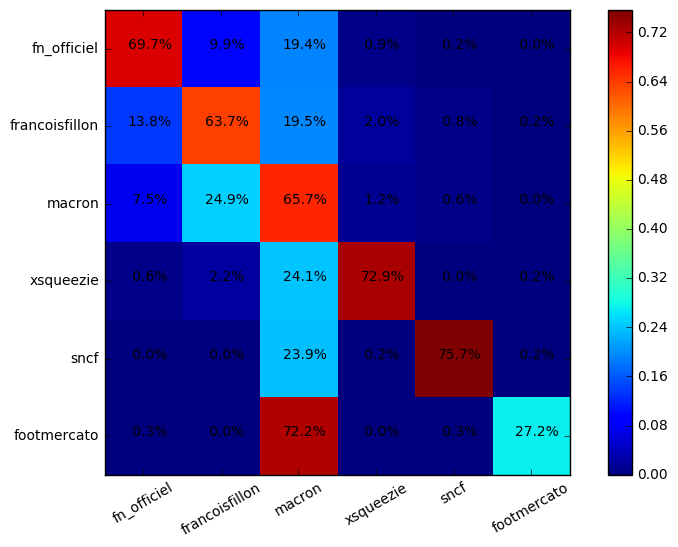

Epoch    3 : 13185.65   Test accuracy: 59.98 80.88 64.48 61.69 64.34 64.65 63.96 
Epoch    3 : 13003.73   Test accuracy: 59.94 81.05 64.62 61.69 64.45 64.69 64.13 
Epoch    3 : 12833.41   Test accuracy: 59.98 81.05 64.55 61.55 64.55 64.76 64.31 
Epoch    3 : 12674.29   Test accuracy: 60.12 81.23 64.58 61.62 64.48 64.72 64.27 
Epoch    3 : 12525.06   Test accuracy: 59.91 81.37 64.69 61.76 64.69 64.76 64.31 
Epoch    3 : 12384.34   Test accuracy: 59.98 81.58 64.76 61.90 64.69 64.86 64.20 
Epoch    3 : 12251.06   Test accuracy: 60.05 81.58 64.79 61.72 64.72 64.97 64.41 
Epoch    3 : 12124.29   Test accuracy: 60.12 81.51 64.90 61.86 64.90 65.07 64.45 
Epoch    3 : 12002.96   Test accuracy: 60.15 81.65 64.93 61.93 64.83 65.14 64.55 
Epoch    3 : 11887.32   Test accuracy: 60.15 81.79 64.93 62.00 64.86 65.18 64.45 
-------------------------------------------------
| 72.3% |  8.7% | 18.2% |  0.9% |  0.0% |  0.0% |   Total: 578
-------------------------------------------------
| 14.3% | 63.3% |

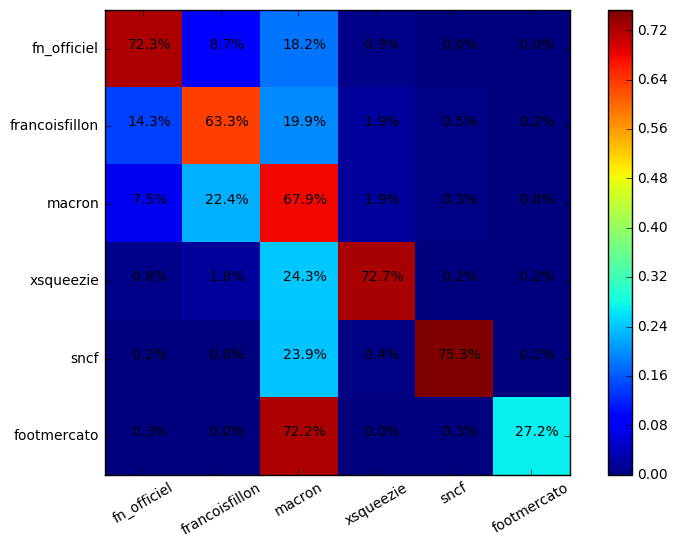

Epoch    3 : 11776.41   Test accuracy: 60.22 81.75 64.97 62.04 64.90 65.14 64.55 
Epoch    3 : 11669.97   Test accuracy: 60.08 81.93 65.14 62.07 65.11 65.18 64.65 
Epoch    3 : 11567.74   Test accuracy: 60.01 81.86 65.14 62.04 65.07 65.28 64.52 
Epoch    3 : 11469.35   Test accuracy: 60.15 81.96 65.11 62.00 64.97 65.28 64.31 
Epoch    3 : 11374.37   Test accuracy: 60.22 82.14 65.18 62.04 64.97 65.32 64.31 
Epoch    3 : 11282.44   Test accuracy: 60.15 82.27 65.11 62.04 64.83 65.32 64.27 
Epoch    3 : 11193.54   Test accuracy: 60.12 82.27 65.07 62.04 64.90 65.28 64.27 
Epoch    3 : 11107.42   Test accuracy: 60.19 82.24 65.04 62.00 64.79 65.18 64.24 
Epoch    3 : 11023.80   Test accuracy: 60.12 82.27 64.97 61.90 64.72 65.21 64.06 
Epoch    3 : 10942.36   Test accuracy: 60.08 82.27 64.97 61.86 64.79 65.21 64.03 
-------------------------------------------------
| 72.5% |  8.8% | 17.6% |  0.9% |  0.2% |  0.0% |   Total: 578
-------------------------------------------------
| 14.3% | 62.8% |

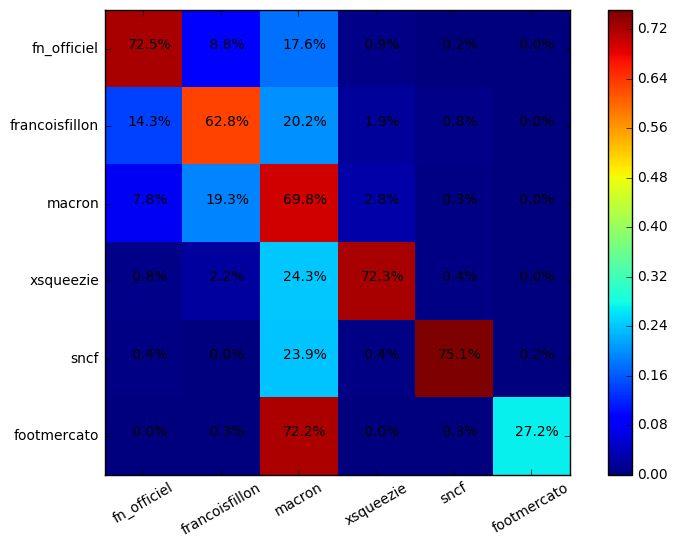

Epoch    3 : 10862.83   Test accuracy: 60.05 82.34 65.04 61.83 64.90 65.14 64.06 
Epoch    3 : 10785.16   Test accuracy: 60.08 82.27 64.86 61.76 64.72 65.21 63.96 
Epoch    3 : 10709.33   Test accuracy: 60.19 82.24 64.83 61.83 64.65 65.07 64.06 
Epoch    3 : 10635.32   Test accuracy: 60.19 82.31 64.93 61.97 64.69 65.21 63.99 
Epoch    3 : 10563.26   Test accuracy: 60.22 82.31 65.00 61.90 64.69 65.18 64.06 
Epoch    3 : 10493.26   Test accuracy: 60.26 82.31 64.97 61.90 64.62 65.18 63.99 
Epoch    3 : 10425.13   Test accuracy: 60.05 82.24 64.62 61.55 64.41 64.93 63.82 
Epoch    3 : 10358.65   Test accuracy: 60.05 82.24 64.52 61.65 64.34 65.00 63.85 
Epoch    3 : 10293.69   Test accuracy: 60.05 82.10 64.58 61.62 64.34 64.97 63.89 
Epoch    3 : 10230.18   Test accuracy: 59.87 82.07 64.55 61.62 64.24 64.86 63.89 
-------------------------------------------------
| 72.7% | 20.6% |  5.9% |  0.9% |  0.0% |  0.0% |   Total: 578
-------------------------------------------------
| 13.8% | 74.7% |

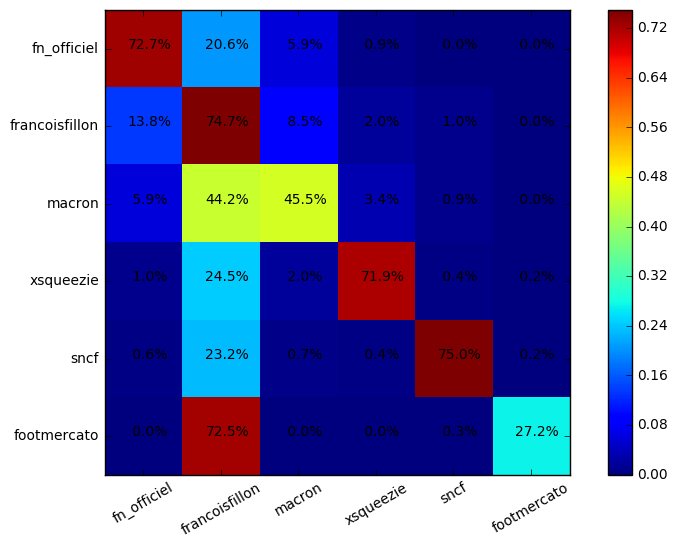

Epoch    3 : 10168.08   Test accuracy: 59.94 82.14 64.65 61.58 64.45 64.86 63.85 
Epoch    3 : 10107.36   Test accuracy: 59.94 82.14 64.52 61.48 64.41 64.86 63.75 
Epoch    3 : 10047.99   Test accuracy: 59.87 82.07 64.52 61.58 64.20 64.72 63.78 
Epoch    3 : 9989.88   Test accuracy: 59.70 81.96 64.38 61.58 64.20 64.58 63.89 
Epoch    3 : 9932.92   Test accuracy: 59.70 81.96 64.45 61.65 64.27 64.52 63.99 
Epoch    3 : 9877.03   Test accuracy: 59.73 82.03 64.48 61.58 64.38 64.55 63.96 
Epoch    3 : 9822.26   Test accuracy: 59.73 82.07 64.55 61.62 64.38 64.72 64.17 
Epoch    3 : 9768.62   Test accuracy: 59.80 82.14 64.62 61.62 64.48 64.76 64.20 
Epoch    3 : 9715.91   Test accuracy: 59.84 82.00 64.55 61.58 64.38 64.83 64.06 
Epoch    3 : 9663.80   Test accuracy: 59.73 82.03 64.62 61.55 64.41 64.76 64.13 
-------------------------------------------------
| 72.5% | 21.1% |  5.5% |  0.9% |  0.0% |  0.0% |   Total: 578
-------------------------------------------------
| 13.9% | 74.0% |  8.7% 

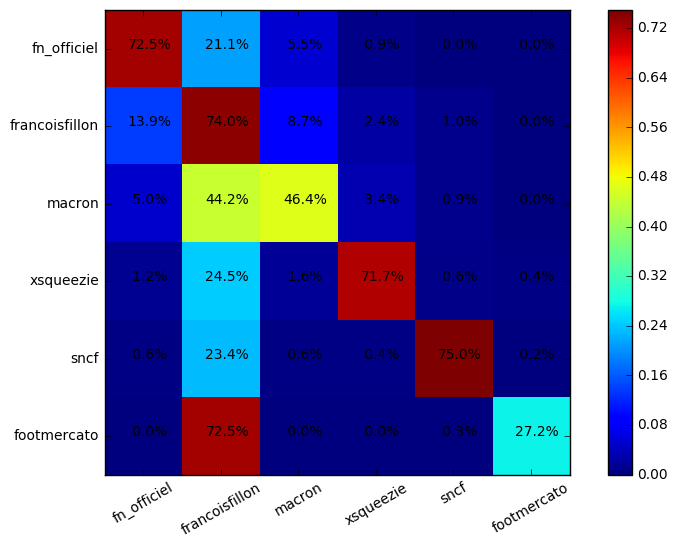

Epoch    3 : 9611.54   Test accuracy: 59.70 82.03 64.58 61.58 64.45 64.65 64.03 
Epoch    3 : 9561.94   Test accuracy: 59.67 82.07 64.48 61.55 64.31 64.55 63.89 
Epoch    3 : 9513.17   Test accuracy: 59.67 82.07 64.55 61.44 64.41 64.65 63.89 
Epoch    3 : 9465.17   Test accuracy: 59.70 82.14 64.52 61.48 64.38 64.55 63.92 
Epoch    3 : 9417.99   Test accuracy: 59.80 82.10 64.52 61.51 64.34 64.45 63.96 
Epoch    3 : 9371.52   Test accuracy: 59.67 82.14 64.52 61.44 64.31 64.52 63.96 
Epoch    3 : 9325.71   Test accuracy: 59.77 82.14 64.52 61.48 64.24 64.41 63.92 
Epoch    3 : 9280.52   Test accuracy: 59.84 82.17 64.55 61.51 64.34 64.06 63.78 
Epoch    3 : 9235.76   Test accuracy: 59.73 82.17 64.45 61.55 64.27 64.10 63.57 
Epoch    3 : 9191.62   Test accuracy: 59.77 82.07 64.31 61.24 64.24 63.92 63.54 
-------------------------------------------------
| 72.7% | 20.9% |  5.5% |  0.9% |  0.0% |  0.0% |   Total: 578
-------------------------------------------------
| 14.3% | 73.9% |  8.7% |  

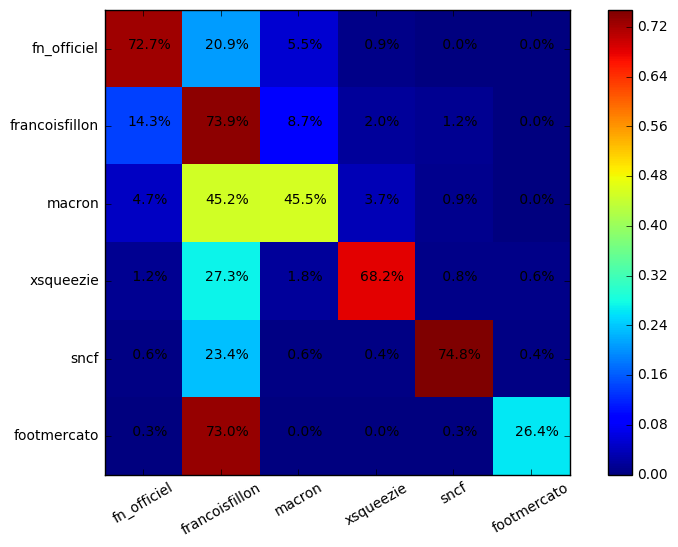

##################### 2 - Essai 1 ###################
Epoch    3 : 20806.83   Test accuracy: 57.47 74.56 60.71 58.83 60.82 60.75 60.68 
Epoch    3 : 17189.78   Test accuracy: 60.54 78.72 64.62 62.25 64.34 64.72 64.06 
Epoch    3 : 15870.17   Test accuracy: 60.96 79.48 65.11 62.84 64.86 65.11 64.72 
Epoch    3 : 15193.62   Test accuracy: 60.82 79.97 65.18 62.88 65.21 65.28 64.86 
Epoch    3 : 14709.88   Test accuracy: 59.11 80.36 63.26 60.64 63.29 63.36 62.91 
Epoch    3 : 14321.34   Test accuracy: 59.32 80.67 63.43 60.64 63.36 63.61 62.88 
Epoch    3 : 13994.04   Test accuracy: 59.35 80.67 63.47 60.64 63.22 63.47 62.98 
Epoch    3 : 13712.73   Test accuracy: 59.49 80.98 63.40 60.68 63.40 63.43 63.12 
Epoch    3 : 13468.72   Test accuracy: 59.56 80.98 63.50 60.71 63.54 63.68 63.33 
Epoch    3 : 13254.72   Test accuracy: 59.63 81.12 63.61 60.96 63.54 63.85 63.33 
-------------------------------------------------
| 83.4% |  8.3% |  7.1% |  1.2% |  0.0% |  0.0% |   Total: 578
-------------

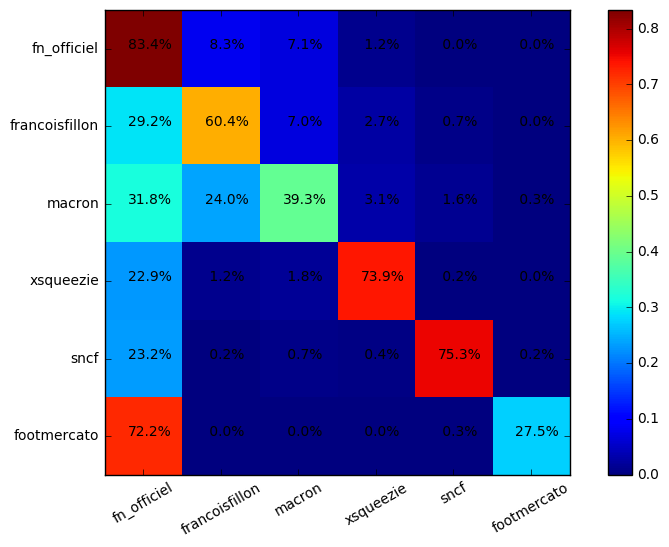

Epoch    3 : 13064.50   Test accuracy: 59.67 81.30 63.75 60.92 63.64 63.68 63.33 
Epoch    3 : 12893.13   Test accuracy: 59.67 81.47 63.78 60.96 63.64 63.96 63.47 
Epoch    3 : 12736.87   Test accuracy: 59.73 81.40 63.89 61.17 63.89 63.99 63.64 
Epoch    3 : 12592.97   Test accuracy: 59.77 81.40 64.10 61.34 64.06 64.20 63.75 
Epoch    3 : 12459.32   Test accuracy: 59.84 81.44 64.31 61.58 64.20 64.34 64.06 
Epoch    3 : 12334.16   Test accuracy: 59.87 81.58 64.83 62.04 64.86 64.76 64.69 
Epoch    3 : 12216.14   Test accuracy: 59.94 81.58 64.83 62.07 64.79 64.93 64.52 
Epoch    3 : 12104.11   Test accuracy: 59.94 81.61 64.79 62.07 64.79 64.97 64.52 
Epoch    3 : 11997.11   Test accuracy: 59.98 81.68 64.93 62.04 64.83 65.11 64.65 
Epoch    3 : 11894.47   Test accuracy: 60.33 81.79 65.04 62.14 64.93 65.18 64.58 
-------------------------------------------------
| 72.0% |  9.7% | 17.3% |  1.0% |  0.0% |  0.0% |   Total: 578
-------------------------------------------------
| 15.8% | 61.1% |

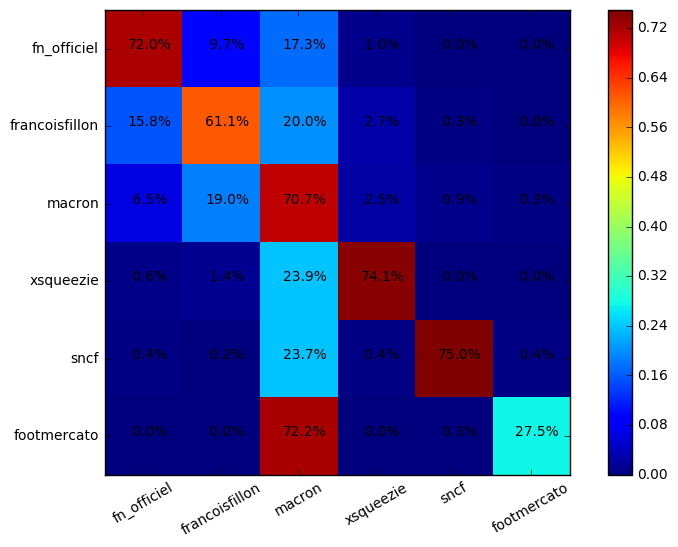

Epoch    3 : 11795.72   Test accuracy: 60.43 81.68 64.93 62.18 64.86 65.18 64.65 
Epoch    3 : 11700.48   Test accuracy: 60.43 81.75 65.07 62.14 64.90 65.21 64.72 
Epoch    3 : 11608.36   Test accuracy: 60.50 81.82 65.25 62.21 65.14 65.32 64.83 
Epoch    3 : 11518.91   Test accuracy: 60.47 81.86 65.21 62.18 65.21 65.28 65.04 
Epoch    3 : 11431.46   Test accuracy: 60.68 82.00 65.32 62.42 65.21 65.39 65.14 
Epoch    3 : 11346.07   Test accuracy: 60.68 82.10 65.35 62.39 65.28 65.46 65.11 
Epoch    3 : 11262.38   Test accuracy: 60.64 82.10 65.28 62.46 65.39 65.39 65.25 
Epoch    3 : 11181.27   Test accuracy: 60.57 82.14 65.25 62.46 65.35 65.46 65.25 
Epoch    3 : 11102.88   Test accuracy: 60.57 82.24 65.21 62.60 65.18 65.35 65.21 
Epoch    3 : 11026.71   Test accuracy: 60.78 82.31 65.35 62.63 65.25 65.49 65.11 
-------------------------------------------------
| 72.8% |  9.5% | 17.0% |  0.7% |  0.0% |  0.0% |   Total: 578
-------------------------------------------------
| 13.8% | 63.0% |

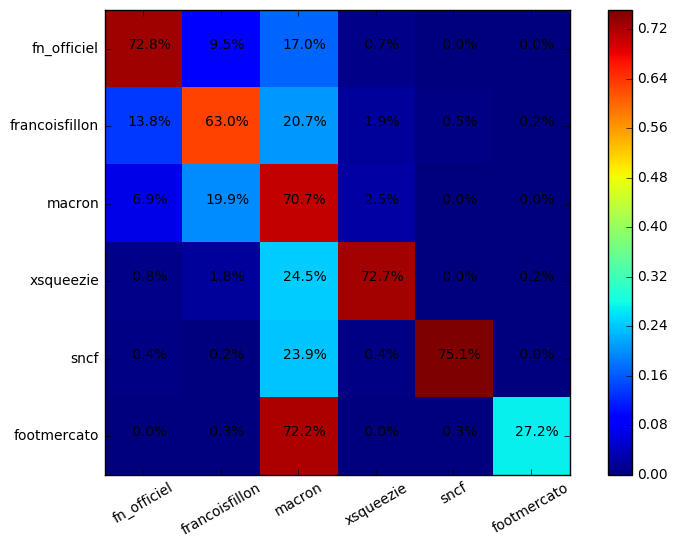

Epoch    3 : 10952.40   Test accuracy: 60.85 82.24 65.42 62.74 65.25 65.53 65.04 
Epoch    3 : 10879.75   Test accuracy: 60.78 82.21 65.42 62.67 65.35 65.18 65.00 
Epoch    3 : 10808.64   Test accuracy: 60.89 82.10 65.46 62.70 65.39 65.18 65.07 
Epoch    3 : 10739.02   Test accuracy: 60.92 82.10 65.56 62.74 65.46 65.14 65.14 
Epoch    3 : 10670.82   Test accuracy: 61.06 82.17 65.56 62.84 65.42 65.18 65.14 
Epoch    3 : 10603.97   Test accuracy: 61.03 82.17 65.56 62.81 65.42 65.28 65.25 
Epoch    3 : 10538.37   Test accuracy: 60.99 82.24 65.49 62.67 65.39 65.21 65.00 
Epoch    3 : 10473.88   Test accuracy: 61.06 82.17 65.60 62.81 65.35 65.11 65.00 
Epoch    3 : 10410.32   Test accuracy: 61.06 82.24 65.53 62.74 65.42 65.11 64.93 
Epoch    3 : 10347.75   Test accuracy: 61.03 82.27 65.49 62.67 65.42 65.21 65.04 
-------------------------------------------------
| 71.8% |  9.9% | 17.8% |  0.5% |  0.0% |  0.0% |   Total: 578
-------------------------------------------------
| 13.1% | 63.8% |

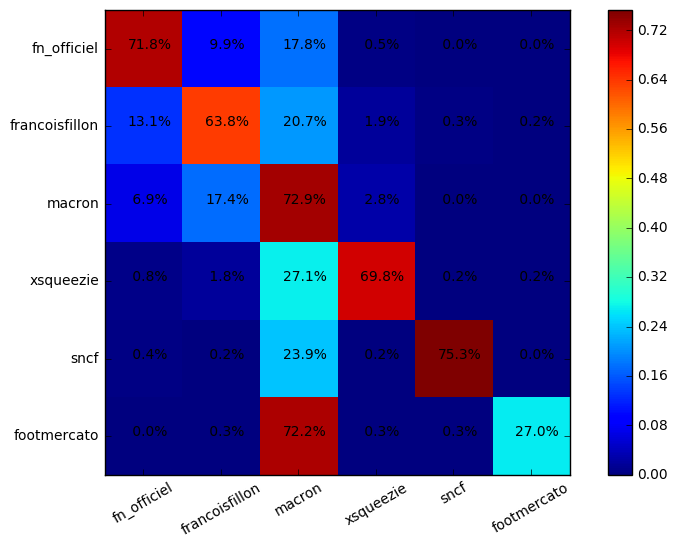

Epoch    3 : 10286.27   Test accuracy: 61.03 82.34 65.49 62.63 65.39 65.28 65.11 
Epoch    3 : 10225.80   Test accuracy: 61.24 82.45 65.53 62.67 65.35 65.39 65.18 
Epoch    3 : 10166.25   Test accuracy: 61.17 82.45 65.63 62.70 65.49 65.32 65.18 
Epoch    3 : 10107.54   Test accuracy: 61.24 82.48 65.63 62.74 65.56 65.42 65.25 
Epoch    3 : 10049.66   Test accuracy: 61.27 82.38 65.81 62.84 65.63 65.60 65.25 
Epoch    3 : 9992.60   Test accuracy: 61.24 82.34 65.81 62.88 65.74 65.60 65.28 
Epoch    3 : 9936.37   Test accuracy: 61.27 82.41 65.88 62.91 65.77 65.63 65.35 
Epoch    3 : 9881.00   Test accuracy: 61.51 82.55 65.88 63.01 65.81 65.74 65.32 
Epoch    3 : 9826.48   Test accuracy: 61.58 82.52 66.02 63.19 65.91 65.77 65.46 
Epoch    3 : 9772.84   Test accuracy: 61.62 82.52 66.05 63.29 65.88 65.77 65.49 
-------------------------------------------------
| 72.7% |  9.3% | 17.5% |  0.5% |  0.0% |  0.0% |   Total: 578
-------------------------------------------------
| 11.9% | 64.7% | 21.1

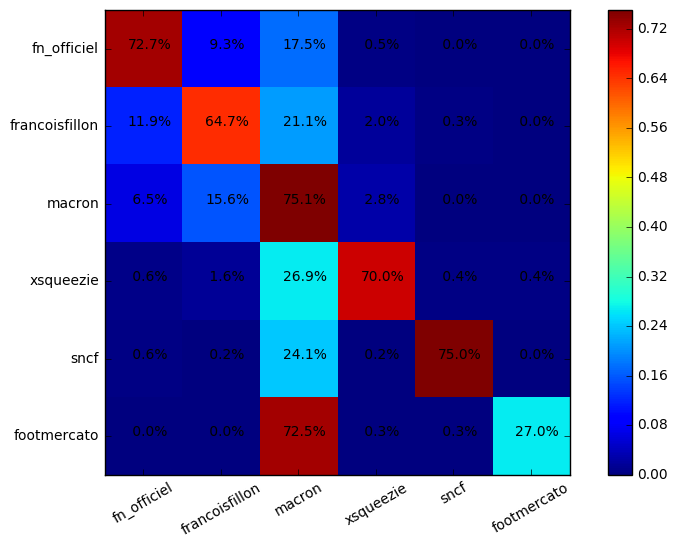

Epoch    3 : 9720.09   Test accuracy: 61.65 82.55 66.05 63.33 65.95 65.77 65.42 
Epoch    3 : 9668.21   Test accuracy: 61.69 82.66 66.12 63.43 66.15 65.81 65.46 
Epoch    3 : 9617.21   Test accuracy: 61.62 82.80 66.12 63.43 66.29 65.84 65.60 
Epoch    3 : 9567.11   Test accuracy: 61.69 82.94 66.15 63.40 66.29 65.84 65.67 
Epoch    3 : 9517.98   Test accuracy: 61.72 82.94 66.19 63.43 66.22 65.84 65.67 
Epoch    3 : 9469.78   Test accuracy: 61.69 82.97 66.29 63.33 66.19 65.91 65.74 
Epoch    3 : 9422.43   Test accuracy: 61.72 83.04 66.29 63.19 66.15 65.98 65.70 
Epoch    3 : 9375.88   Test accuracy: 61.69 83.25 66.29 63.19 66.15 66.02 65.67 
Epoch    3 : 9330.09   Test accuracy: 61.65 83.25 66.26 63.12 66.19 66.09 65.67 
Epoch    3 : 9285.01   Test accuracy: 61.51 83.22 66.26 63.15 66.09 66.09 65.70 
-------------------------------------------------
| 73.2% |  8.5% | 17.6% |  0.7% |  0.0% |  0.0% |   Total: 578
-------------------------------------------------
| 11.7% | 65.0% | 21.2% |  

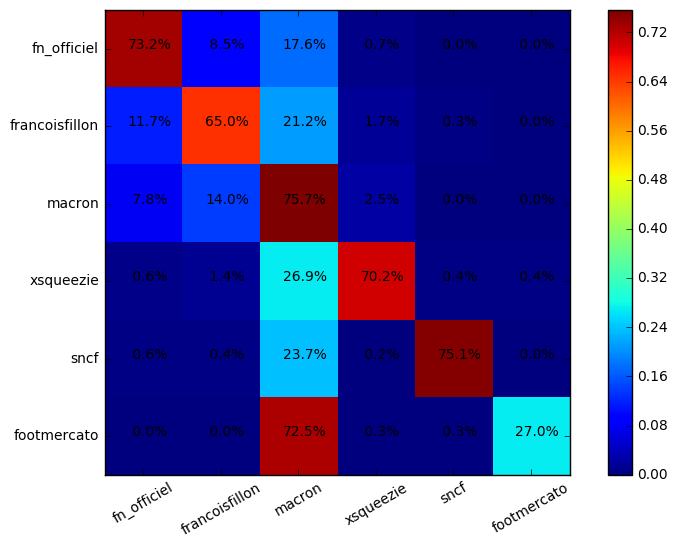

##################### 2 - Essai 2 ###################
Epoch    3 : 19895.35   Test accuracy: 55.34 75.40 58.97 56.59 58.90 59.07 58.65 
Epoch    3 : 16484.71   Test accuracy: 57.92 79.27 62.35 59.63 62.14 62.46 61.90 
Epoch    3 : 15463.79   Test accuracy: 58.69 80.32 62.84 60.08 62.67 62.94 62.35 
Epoch    3 : 14876.73   Test accuracy: 58.86 80.84 63.29 60.36 63.08 63.36 62.74 
Epoch    3 : 14450.28   Test accuracy: 59.25 80.91 63.43 60.75 63.33 63.61 62.94 
Epoch    3 : 14111.72   Test accuracy: 59.35 81.26 63.54 60.64 63.36 63.54 63.08 
Epoch    3 : 13825.45   Test accuracy: 59.46 81.26 63.71 60.99 63.61 63.89 63.26 
Epoch    3 : 13580.26   Test accuracy: 59.60 81.33 63.82 61.06 63.82 63.96 63.47 
Epoch    3 : 13364.37   Test accuracy: 59.73 81.47 64.27 61.37 64.03 64.17 63.54 
Epoch    3 : 13169.92   Test accuracy: 59.84 81.51 64.45 61.48 64.27 64.31 63.64 
-------------------------------------------------
| 69.7% | 21.8% |  7.1% |  1.2% |  0.0% |  0.2% |   Total: 578
-------------

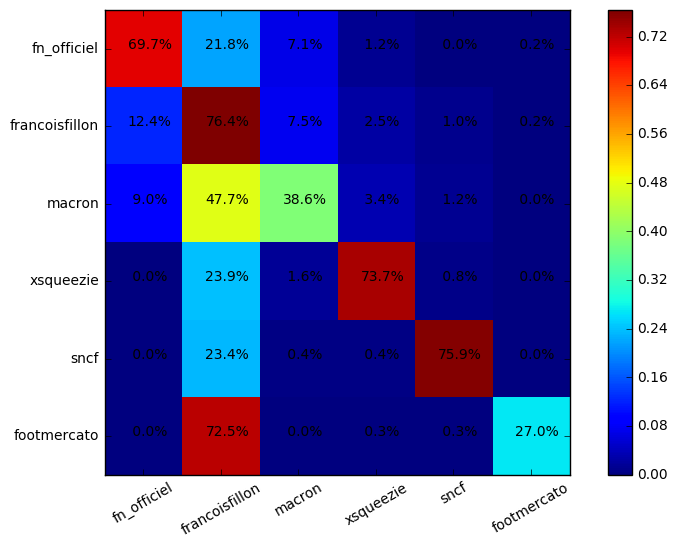

Epoch    3 : 12992.57   Test accuracy: 60.05 81.58 64.38 61.55 64.20 64.45 63.82 
Epoch    3 : 12829.32   Test accuracy: 60.15 81.72 64.38 61.69 64.45 64.76 63.96 
Epoch    3 : 12678.12   Test accuracy: 60.33 81.68 64.55 61.69 64.55 64.97 63.99 
Epoch    3 : 12538.28   Test accuracy: 60.26 81.93 64.90 61.83 64.72 65.07 64.17 
Epoch    3 : 12408.80   Test accuracy: 60.19 81.93 65.04 61.86 64.83 65.21 64.45 
Epoch    3 : 12288.27   Test accuracy: 60.15 82.00 65.00 62.04 64.90 65.18 64.38 
Epoch    3 : 12174.91   Test accuracy: 60.15 82.10 65.04 62.14 64.97 65.18 64.38 
Epoch    3 : 12067.27   Test accuracy: 60.22 82.00 65.07 62.14 64.93 65.21 64.48 
Epoch    3 : 11964.31   Test accuracy: 60.15 82.00 65.07 62.04 65.00 65.18 64.86 
Epoch    3 : 11865.32   Test accuracy: 60.15 82.07 65.18 62.18 65.00 65.21 64.86 
-------------------------------------------------
| 72.5% | 20.9% |  5.2% |  1.4% |  0.0% |  0.0% |   Total: 578
-------------------------------------------------
| 11.2% | 77.4% |

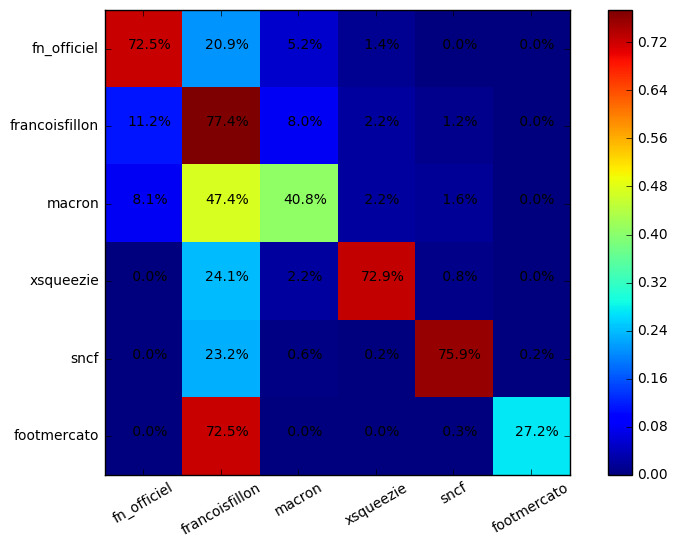

Epoch    3 : 11769.74   Test accuracy: 60.22 82.14 65.07 62.00 65.14 65.18 64.93 
Epoch    3 : 11677.22   Test accuracy: 60.36 82.17 65.18 62.21 65.21 65.14 65.04 
Epoch    3 : 11587.56   Test accuracy: 60.36 81.96 65.14 62.21 65.21 65.18 65.04 
Epoch    3 : 11500.66   Test accuracy: 60.36 81.96 65.25 62.32 65.14 65.25 65.04 
Epoch    3 : 11416.58   Test accuracy: 60.36 81.89 65.18 62.32 65.07 65.25 64.93 
Epoch    3 : 11335.08   Test accuracy: 60.33 82.00 65.14 62.21 65.11 65.14 64.69 
Epoch    3 : 11256.08   Test accuracy: 60.29 82.03 65.14 62.14 65.18 65.07 64.62 
Epoch    3 : 11179.63   Test accuracy: 60.40 82.00 65.14 62.21 65.21 64.97 64.65 
Epoch    3 : 11105.44   Test accuracy: 60.33 81.96 65.18 62.21 65.14 65.04 64.79 
Epoch    3 : 11033.35   Test accuracy: 60.40 81.96 65.11 62.11 65.18 65.00 64.72 
-------------------------------------------------
| 71.6% | 22.5% |  4.3% |  1.2% |  0.2% |  0.2% |   Total: 578
-------------------------------------------------
| 11.0% | 77.1% |

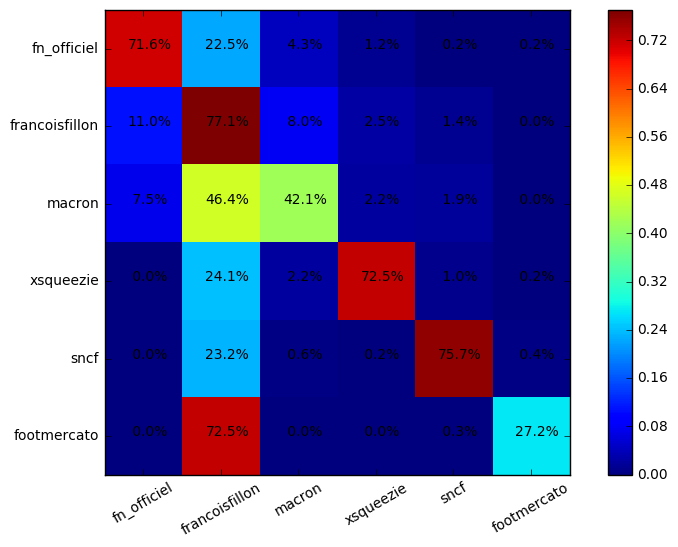

Epoch    3 : 10963.24   Test accuracy: 60.47 81.82 65.14 62.07 65.21 65.04 64.58 
Epoch    3 : 10895.00   Test accuracy: 60.54 81.79 65.07 62.11 65.18 65.04 64.65 
Epoch    3 : 10828.51   Test accuracy: 60.50 81.82 65.04 61.97 65.14 65.11 64.52 
Epoch    3 : 10763.63   Test accuracy: 60.43 81.89 65.00 62.00 65.11 65.11 64.45 
Epoch    3 : 10700.24   Test accuracy: 60.40 81.93 65.00 61.90 65.18 65.00 64.55 
Epoch    3 : 10638.18   Test accuracy: 60.54 81.96 65.04 61.97 65.04 65.07 64.58 
Epoch    3 : 10577.33   Test accuracy: 60.50 81.96 64.97 62.04 65.11 65.00 64.65 
Epoch    3 : 10517.59   Test accuracy: 60.61 81.96 65.00 62.11 65.04 64.93 64.58 
Epoch    3 : 10458.84   Test accuracy: 60.50 81.96 64.93 62.00 65.07 65.04 64.65 
Epoch    3 : 10400.96   Test accuracy: 60.47 81.93 65.11 62.04 65.11 64.90 64.62 
-------------------------------------------------
| 71.3% | 23.2% |  4.0% |  1.2% |  0.2% |  0.2% |   Total: 578
-------------------------------------------------
| 10.7% | 76.4% |

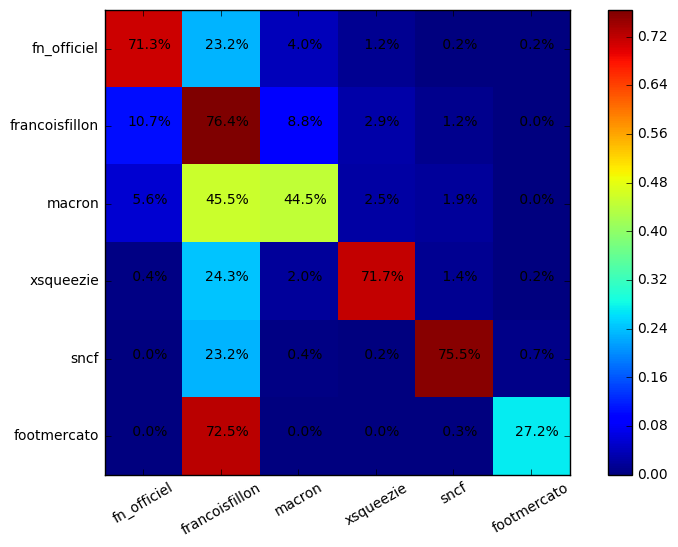

Epoch    3 : 10343.73   Test accuracy: 60.36 81.93 65.11 62.11 65.11 65.14 64.69 
Epoch    3 : 10287.07   Test accuracy: 60.47 82.07 65.14 62.25 65.07 65.18 64.72 
Epoch    3 : 10231.28   Test accuracy: 60.50 81.96 65.11 62.14 65.11 65.07 64.69 
Epoch    3 : 10176.50   Test accuracy: 60.47 81.96 65.07 62.28 65.11 65.11 64.76 
Epoch    3 : 10122.69   Test accuracy: 60.40 82.07 65.11 62.21 65.07 65.18 64.76 
Epoch    3 : 10069.75   Test accuracy: 60.36 82.21 65.18 62.32 65.14 65.25 64.62 
Epoch    3 : 10017.57   Test accuracy: 60.26 82.21 65.18 62.11 65.18 65.28 64.65 
Epoch    3 : 9966.15   Test accuracy: 60.26 82.10 65.11 61.90 65.11 65.18 64.62 
Epoch    3 : 9915.61   Test accuracy: 60.22 82.17 65.07 62.07 65.07 65.18 64.38 
Epoch    3 : 9865.98   Test accuracy: 60.22 82.10 65.14 62.00 64.97 65.11 64.27 
-------------------------------------------------
| 70.6% | 24.4% |  3.8% |  0.9% |  0.2% |  0.2% |   Total: 578
-------------------------------------------------
| 10.2% | 77.2% |  8

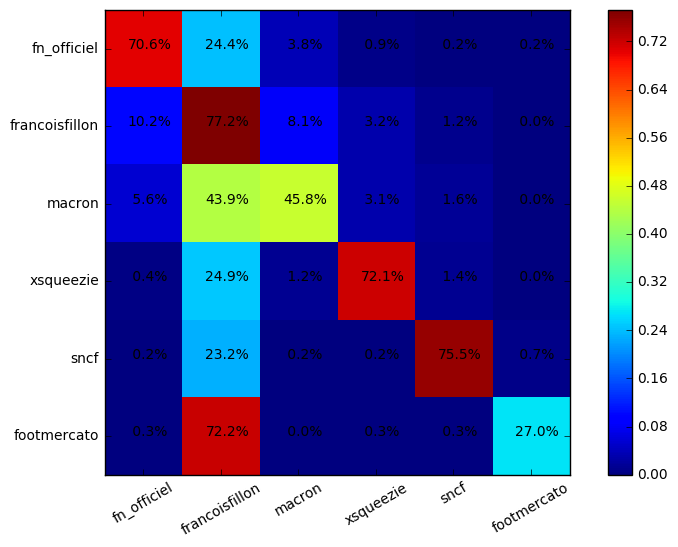

Epoch    3 : 9817.08   Test accuracy: 60.22 82.07 65.07 61.93 65.04 65.00 64.27 
Epoch    3 : 9768.83   Test accuracy: 60.26 82.07 65.11 61.72 64.97 64.93 64.27 
Epoch    3 : 9721.24   Test accuracy: 60.19 82.17 64.97 61.72 64.86 65.00 64.34 
Epoch    3 : 9674.31   Test accuracy: 60.05 82.27 64.90 61.69 64.90 65.00 64.38 
Epoch    3 : 9628.04   Test accuracy: 60.12 82.27 64.83 61.86 64.83 64.90 64.45 
Epoch    3 : 9582.41   Test accuracy: 60.08 82.34 64.79 61.86 64.69 64.83 64.34 
Epoch    3 : 9537.43   Test accuracy: 60.15 82.48 64.72 61.72 64.65 64.72 64.38 
Epoch    3 : 9493.08   Test accuracy: 60.05 82.45 64.79 61.76 64.65 64.76 64.45 
Epoch    3 : 9449.34   Test accuracy: 60.12 82.48 64.76 61.76 64.69 64.72 64.38 
Epoch    3 : 9406.17   Test accuracy: 60.05 82.55 64.72 61.76 64.65 64.72 64.27 
-------------------------------------------------
| 69.0% | 25.6% |  4.2% |  0.9% |  0.2% |  0.2% |   Total: 578
-------------------------------------------------
| 10.2% | 76.9% |  8.7% |  

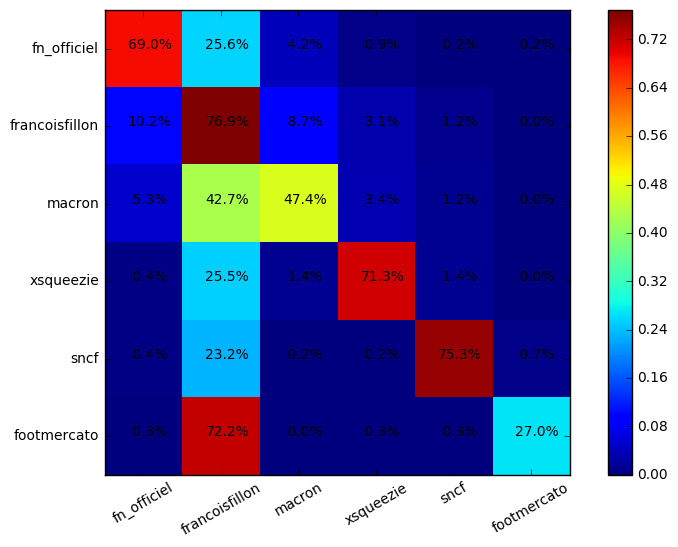

##################### 2 - Essai 3 ###################
Epoch    3 : 19761.30   Test accuracy: 55.76 76.03 59.21 56.87 59.14 59.21 59.18 
Epoch    3 : 16659.92   Test accuracy: 57.78 78.89 61.76 59.35 61.86 61.76 61.30 
Epoch    3 : 15704.75   Test accuracy: 58.58 79.80 62.56 60.05 62.42 62.49 62.25 
Epoch    3 : 15137.26   Test accuracy: 58.79 80.32 62.84 60.36 62.84 62.98 62.67 
Epoch    3 : 14713.74   Test accuracy: 59.42 80.70 63.33 60.68 63.26 63.36 63.12 
Epoch    3 : 14358.94   Test accuracy: 59.53 80.98 63.50 60.68 63.33 63.61 63.15 
Epoch    3 : 14049.60   Test accuracy: 59.77 81.16 64.06 61.03 63.78 63.96 63.54 
Epoch    3 : 13778.18   Test accuracy: 59.70 81.33 63.85 60.96 63.82 64.13 63.54 
Epoch    3 : 13538.08   Test accuracy: 59.49 81.23 64.13 61.10 64.06 64.17 63.78 
Epoch    3 : 13321.34   Test accuracy: 59.42 81.30 63.99 60.92 63.78 63.89 63.61 
-------------------------------------------------
| 71.1% | 20.6% |  7.3% |  0.9% |  0.2% |  0.0% |   Total: 578
-------------

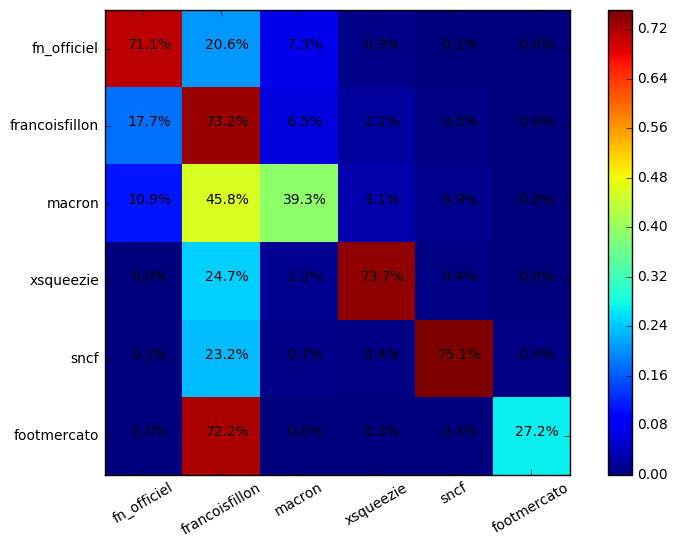

Epoch    3 : 13121.83   Test accuracy: 59.32 81.26 63.96 60.92 63.82 64.10 63.54 
Epoch    3 : 12935.84   Test accuracy: 59.28 81.40 63.78 60.99 63.82 63.92 63.36 
Epoch    3 : 12761.74   Test accuracy: 59.42 81.30 63.89 61.13 63.92 64.17 63.50 
Epoch    3 : 12598.84   Test accuracy: 59.49 81.54 63.92 60.92 63.92 64.06 63.71 
Epoch    3 : 12445.98   Test accuracy: 61.41 81.65 65.81 63.12 65.63 65.84 65.53 
Epoch    3 : 12301.72   Test accuracy: 61.37 81.68 65.95 63.33 65.98 65.81 65.81 
Epoch    3 : 12165.09   Test accuracy: 61.55 81.61 65.91 63.40 65.91 65.84 65.74 
Epoch    3 : 12035.47   Test accuracy: 61.51 81.86 65.88 63.26 65.70 65.77 65.67 
Epoch    3 : 11912.56   Test accuracy: 61.48 81.75 65.63 63.19 65.77 65.84 65.67 
Epoch    3 : 11795.82   Test accuracy: 61.48 81.93 65.70 63.22 65.63 65.95 65.56 
-------------------------------------------------
| 73.2% |  9.5% |  5.0% |  0.9% | 11.4% |  0.0% |   Total: 578
-------------------------------------------------
| 17.3% | 59.1% |

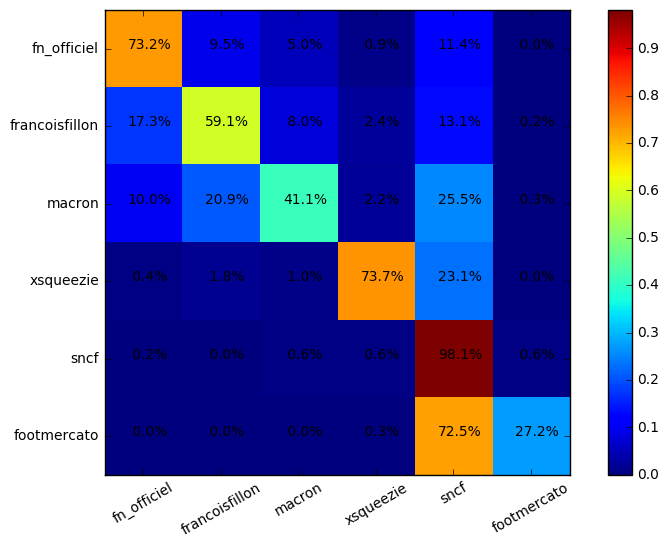

Epoch    3 : 11684.37   Test accuracy: 61.34 81.89 65.70 62.94 65.53 65.77 65.49 
Epoch    3 : 11577.46   Test accuracy: 61.41 81.82 65.63 62.88 65.56 65.74 65.46 
Epoch    3 : 11474.45   Test accuracy: 61.48 81.79 65.70 62.94 65.63 65.70 65.39 
Epoch    3 : 11374.70   Test accuracy: 61.55 81.72 65.67 63.12 65.63 65.98 65.53 
Epoch    3 : 11277.99   Test accuracy: 61.62 81.75 65.81 63.19 65.67 65.95 65.35 
Epoch    3 : 11184.60   Test accuracy: 61.76 81.61 65.88 63.19 65.84 66.09 65.35 
Epoch    3 : 11094.42   Test accuracy: 61.83 81.68 66.02 63.36 65.95 66.09 65.42 
Epoch    3 : 11007.18   Test accuracy: 61.90 81.61 65.98 63.40 65.95 66.05 65.60 
Epoch    3 : 10922.74   Test accuracy: 61.83 81.65 65.98 63.22 65.91 66.09 65.49 
Epoch    3 : 10840.98   Test accuracy: 61.76 81.68 66.12 63.36 65.98 66.15 65.60 
-------------------------------------------------
| 73.2% |  9.9% |  4.7% |  0.7% | 11.6% |  0.0% |   Total: 578
-------------------------------------------------
| 17.1% | 59.1% |

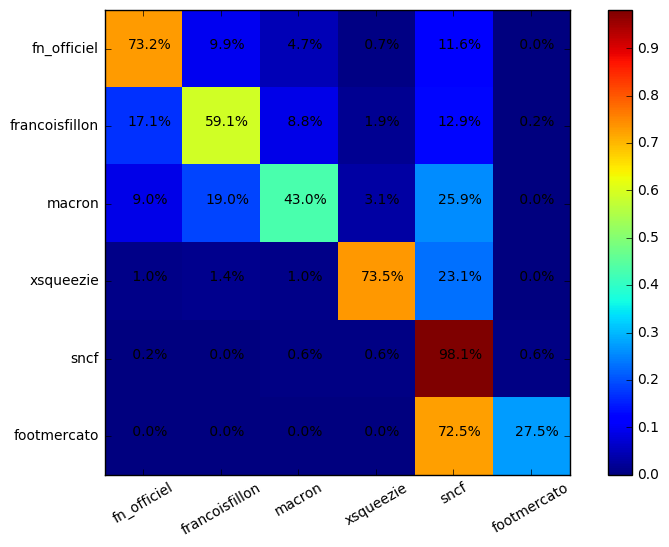

Epoch    3 : 10761.69   Test accuracy: 61.62 81.47 66.19 63.43 66.05 66.15 65.56 
Epoch    3 : 10684.51   Test accuracy: 61.58 81.30 66.19 63.47 65.95 66.33 65.60 
Epoch    3 : 10609.33   Test accuracy: 61.62 81.30 66.12 63.50 66.02 66.19 65.63 
Epoch    3 : 10536.23   Test accuracy: 61.48 81.33 66.12 63.50 65.95 66.22 65.56 
Epoch    3 : 10465.06   Test accuracy: 59.56 81.33 64.45 61.44 64.34 64.76 64.06 
Epoch    3 : 10395.61   Test accuracy: 59.63 81.47 64.38 61.37 64.24 64.55 64.06 
Epoch    3 : 10327.71   Test accuracy: 59.60 81.61 64.41 61.44 64.31 64.52 64.03 
Epoch    3 : 10261.30   Test accuracy: 59.60 81.61 64.52 61.41 64.41 64.58 64.03 
Epoch    3 : 10196.28   Test accuracy: 59.63 81.65 64.52 61.41 64.34 64.62 64.06 
Epoch    3 : 10132.47   Test accuracy: 59.56 81.82 64.38 61.51 64.27 64.55 64.10 
-------------------------------------------------
| 70.9% | 11.1% | 17.1% |  0.9% |  0.0% |  0.0% |   Total: 578
-------------------------------------------------
| 16.5% | 59.6% |

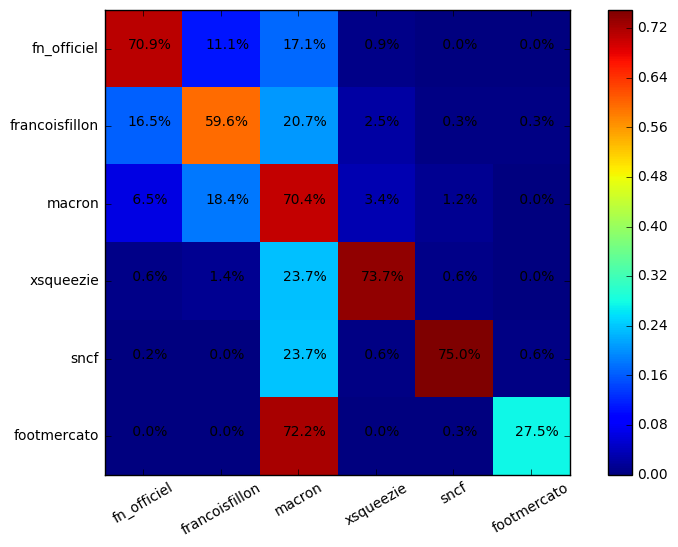

Epoch    3 : 10069.82   Test accuracy: 59.56 81.89 64.41 61.51 64.24 64.45 64.17 
Epoch    3 : 10008.51   Test accuracy: 59.56 81.89 64.48 61.55 64.34 64.52 64.20 
Epoch    3 : 9948.67   Test accuracy: 59.46 81.82 64.38 61.58 64.27 64.45 64.17 
Epoch    3 : 9890.29   Test accuracy: 59.56 81.86 64.41 61.62 64.38 64.45 64.17 
Epoch    3 : 9831.82   Test accuracy: 59.42 81.86 64.45 61.58 64.48 64.45 64.13 
Epoch    3 : 9772.92   Test accuracy: 59.42 81.86 64.38 61.51 64.41 64.45 64.13 
Epoch    3 : 9716.02   Test accuracy: 59.46 81.82 64.38 61.41 64.34 64.41 64.06 
Epoch    3 : 9660.37   Test accuracy: 59.35 81.75 64.48 61.41 64.41 64.45 64.17 
Epoch    3 : 9605.56   Test accuracy: 59.42 81.72 64.52 61.44 64.45 64.52 64.13 
Epoch    3 : 9551.70   Test accuracy: 59.42 81.61 64.48 61.44 64.48 64.48 64.13 
-------------------------------------------------
| 71.3% | 10.9% | 16.6% |  1.0% |  0.0% |  0.2% |   Total: 578
-------------------------------------------------
| 16.1% | 58.9% | 21.2% |

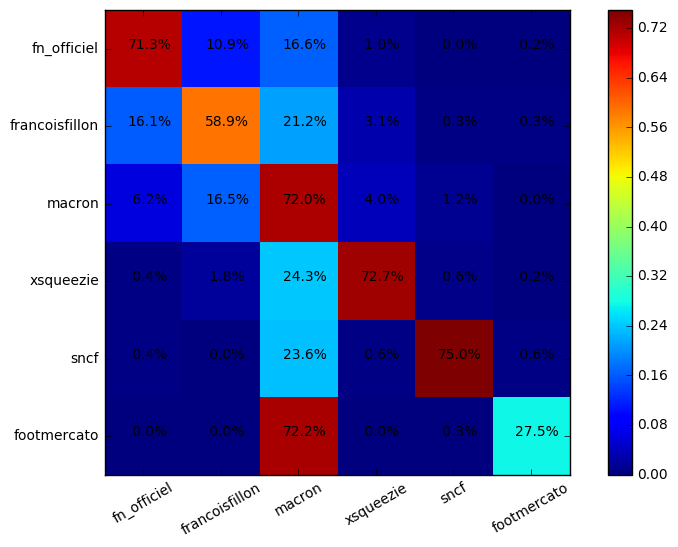

Epoch    3 : 9498.74   Test accuracy: 59.35 81.54 64.45 61.44 64.38 64.34 64.13 
Epoch    3 : 9446.50   Test accuracy: 59.32 81.54 64.38 61.44 64.34 64.34 64.03 
Epoch    3 : 9394.93   Test accuracy: 59.28 81.54 64.45 61.44 64.34 64.31 63.99 
Epoch    3 : 9344.16   Test accuracy: 59.28 81.51 64.48 61.44 64.41 64.41 64.03 
Epoch    3 : 9294.20   Test accuracy: 59.35 81.54 64.48 61.51 64.45 64.41 63.99 
Epoch    3 : 9244.71   Test accuracy: 59.39 81.54 64.38 61.48 64.41 64.34 64.06 
Epoch    3 : 9195.62   Test accuracy: 59.42 81.61 64.34 61.51 64.41 64.34 63.99 
Epoch    3 : 9147.02   Test accuracy: 59.42 81.61 64.38 61.48 64.31 64.31 64.03 
Epoch    3 : 9098.31   Test accuracy: 59.35 81.65 64.38 61.44 64.24 64.41 64.06 
Epoch    3 : 9050.99   Test accuracy: 59.42 81.61 64.27 61.41 64.27 64.48 64.03 
-------------------------------------------------
| 72.0% | 10.2% | 16.6% |  1.0% |  0.0% |  0.2% |   Total: 578
-------------------------------------------------
| 16.1% | 57.9% | 22.2% |  

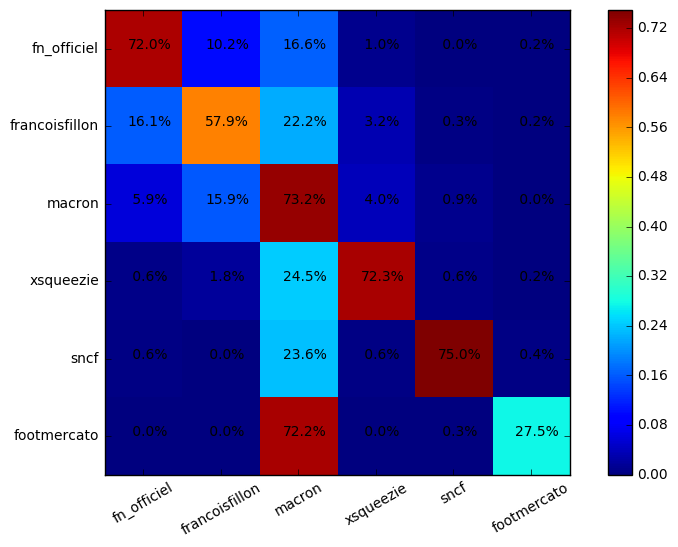

##################### 2 - Essai 4 ###################
Epoch    3 : 20109.67   Test accuracy: 57.57 75.79 61.24 59.28 61.24 61.27 60.82 
Epoch    3 : 16741.63   Test accuracy: 60.64 79.27 64.58 62.35 64.69 64.72 64.48 
Epoch    3 : 15616.88   Test accuracy: 58.72 79.87 62.74 60.12 62.77 62.98 62.32 
Epoch    3 : 14997.23   Test accuracy: 59.46 80.29 63.57 60.64 63.33 63.85 63.12 
Epoch    3 : 14557.87   Test accuracy: 65.81 80.84 70.10 67.45 70.03 70.27 69.50 
Epoch    3 : 14210.76   Test accuracy: 66.22 81.02 70.52 67.59 70.27 70.76 70.13 
Epoch    3 : 13919.91   Test accuracy: 66.43 81.30 70.76 68.21 70.69 70.87 70.24 
Epoch    3 : 13668.80   Test accuracy: 66.22 81.12 70.97 68.35 70.69 71.04 70.73 
Epoch    3 : 13448.35   Test accuracy: 66.40 81.37 71.07 68.42 70.90 71.25 70.80 
Epoch    3 : 13251.54   Test accuracy: 66.26 81.54 71.14 68.42 71.00 71.32 70.80 
-------------------------------------------------
| 72.5% | 10.0% |  5.2% |  0.9% |  0.0% | 11.4% |   Total: 578
-------------

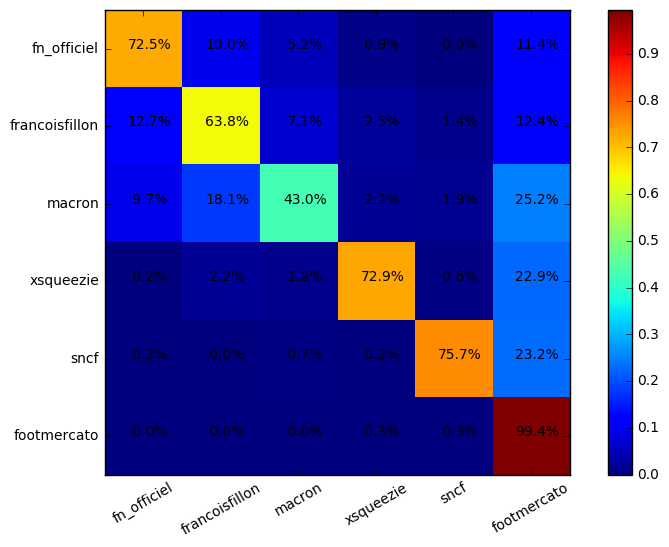

Epoch    3 : 13072.67   Test accuracy: 66.15 81.65 71.25 68.63 71.25 71.39 70.80 
Epoch    3 : 12907.52   Test accuracy: 66.29 81.65 71.32 68.56 71.32 71.42 70.87 
Epoch    3 : 12753.64   Test accuracy: 66.40 81.72 71.42 68.53 71.35 71.42 71.04 
Epoch    3 : 12609.56   Test accuracy: 66.47 81.96 71.56 68.60 71.39 71.56 71.11 
Epoch    3 : 12473.74   Test accuracy: 66.64 82.24 71.49 68.46 71.56 71.60 71.11 
Epoch    3 : 12344.81   Test accuracy: 66.89 82.14 71.60 68.49 71.49 71.70 71.07 
Epoch    3 : 12221.77   Test accuracy: 60.89 82.21 65.39 62.42 65.28 65.42 65.11 
Epoch    3 : 12104.12   Test accuracy: 60.82 82.31 65.42 62.46 65.39 65.53 65.11 
Epoch    3 : 11991.65   Test accuracy: 60.82 82.27 65.67 62.60 65.49 65.67 65.14 
Epoch    3 : 11884.21   Test accuracy: 60.82 82.41 65.67 62.70 65.77 65.63 65.28 
-------------------------------------------------
| 73.4% | 21.1% |  4.5% |  1.0% |  0.0% |  0.0% |   Total: 578
-------------------------------------------------
| 11.0% | 78.8% |

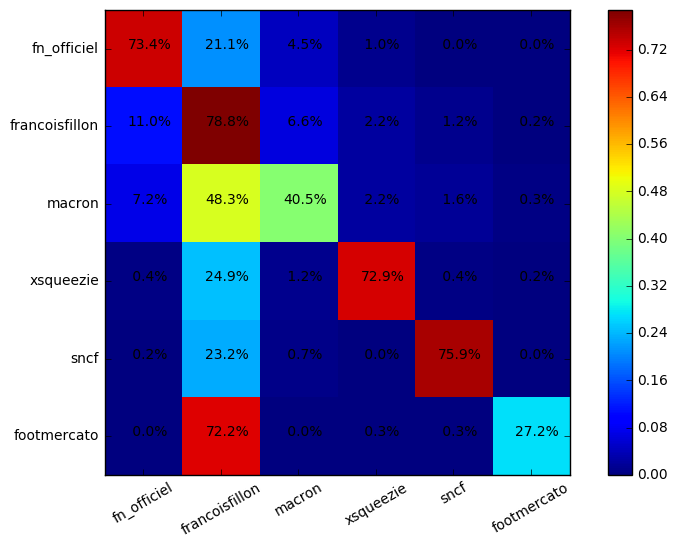

Epoch    3 : 11781.66   Test accuracy: 60.99 82.45 65.81 62.74 65.70 65.84 65.39 
Epoch    3 : 11683.78   Test accuracy: 60.85 82.69 65.84 62.70 65.70 65.74 65.25 
Epoch    3 : 11590.27   Test accuracy: 60.89 82.80 65.81 62.74 65.74 65.88 65.11 
Epoch    3 : 11500.82   Test accuracy: 60.85 82.83 65.77 62.63 65.74 65.77 65.28 
Epoch    3 : 11415.08   Test accuracy: 60.85 82.90 65.70 62.81 65.74 65.84 65.35 
Epoch    3 : 11332.75   Test accuracy: 60.89 82.97 65.77 62.88 65.77 65.81 65.32 
Epoch    3 : 11253.49   Test accuracy: 60.78 83.18 65.77 62.94 65.74 65.70 65.42 
Epoch    3 : 11177.04   Test accuracy: 60.96 83.29 65.67 62.81 65.74 65.77 65.49 
Epoch    3 : 11103.13   Test accuracy: 60.96 83.22 65.70 62.84 65.67 65.84 65.53 
Epoch    3 : 11031.49   Test accuracy: 60.99 83.25 65.63 62.74 65.56 65.77 65.28 
-------------------------------------------------
| 73.2% | 21.5% |  4.2% |  1.0% |  0.2% |  0.0% |   Total: 578
-------------------------------------------------
| 11.2% | 79.3% |

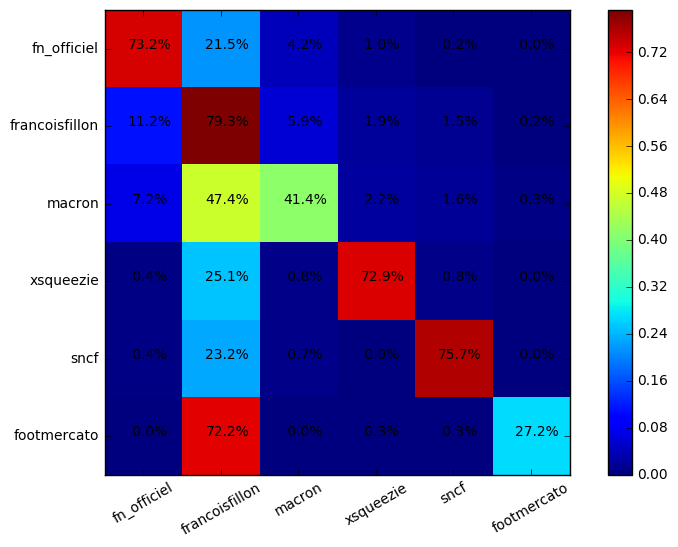

Epoch    3 : 10961.88   Test accuracy: 61.03 83.43 65.67 62.77 65.49 65.81 65.32 
Epoch    3 : 10894.05   Test accuracy: 60.96 83.46 65.70 62.67 65.49 65.88 65.39 
Epoch    3 : 10827.79   Test accuracy: 61.03 83.43 65.63 62.81 65.56 65.84 65.32 
Epoch    3 : 10762.92   Test accuracy: 60.99 83.43 65.67 62.70 65.53 65.77 65.35 
Epoch    3 : 10699.28   Test accuracy: 61.03 83.39 65.63 62.70 65.63 65.74 65.32 
Epoch    3 : 10636.72   Test accuracy: 60.92 83.25 65.67 62.77 65.56 65.70 65.32 
Epoch    3 : 10575.11   Test accuracy: 60.78 83.25 65.56 62.70 65.63 65.67 65.11 
Epoch    3 : 10514.34   Test accuracy: 60.71 83.39 65.49 62.60 65.46 65.67 65.21 
Epoch    3 : 10454.31   Test accuracy: 60.68 83.39 65.53 62.53 65.39 65.56 65.18 
Epoch    3 : 10394.94   Test accuracy: 60.54 83.36 65.39 62.49 65.39 65.46 65.18 
-------------------------------------------------
| 73.0% | 21.5% |  4.2% |  1.0% |  0.3% |  0.0% |   Total: 578
-------------------------------------------------
| 11.5% | 78.4% |

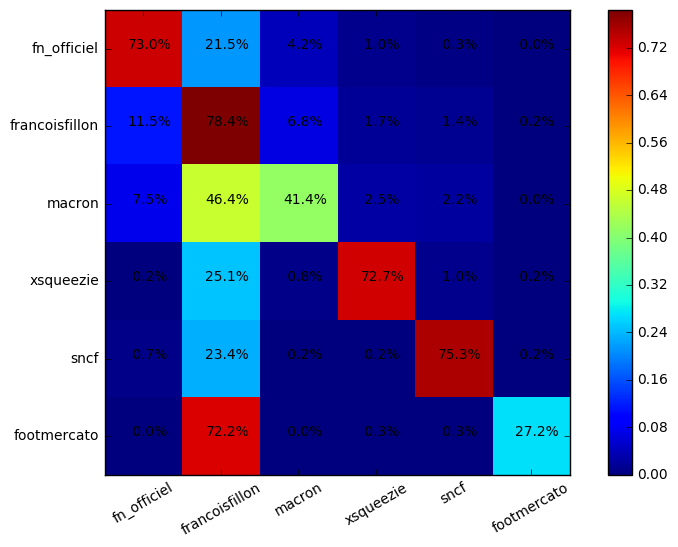

Epoch    3 : 10336.18   Test accuracy: 60.57 83.50 65.39 62.49 65.25 65.53 65.04 
Epoch    3 : 10278.05   Test accuracy: 60.43 83.46 65.32 62.53 65.28 65.60 65.00 
Epoch    3 : 10220.66   Test accuracy: 60.50 83.43 65.35 62.49 65.25 65.56 65.07 
Epoch    3 : 10164.08   Test accuracy: 60.47 83.39 65.39 62.49 65.14 65.53 64.93 
Epoch    3 : 10108.26   Test accuracy: 60.47 83.46 65.46 62.42 65.21 65.53 65.00 
Epoch    3 : 10053.16   Test accuracy: 60.50 83.39 65.32 62.53 65.18 65.53 65.07 
Epoch    3 : 9998.74   Test accuracy: 60.40 83.29 65.21 62.42 65.25 65.49 65.07 
Epoch    3 : 9944.99   Test accuracy: 60.40 83.25 65.32 62.42 65.25 65.49 65.14 
Epoch    3 : 9891.89   Test accuracy: 60.43 83.18 65.39 62.46 65.35 65.39 65.04 
Epoch    3 : 9839.47   Test accuracy: 60.40 83.22 65.32 62.46 65.35 65.25 65.14 
-------------------------------------------------
| 73.0% | 21.6% |  4.3% |  0.9% |  0.2% |  0.0% |   Total: 578
-------------------------------------------------
| 11.7% | 78.6% |  6.

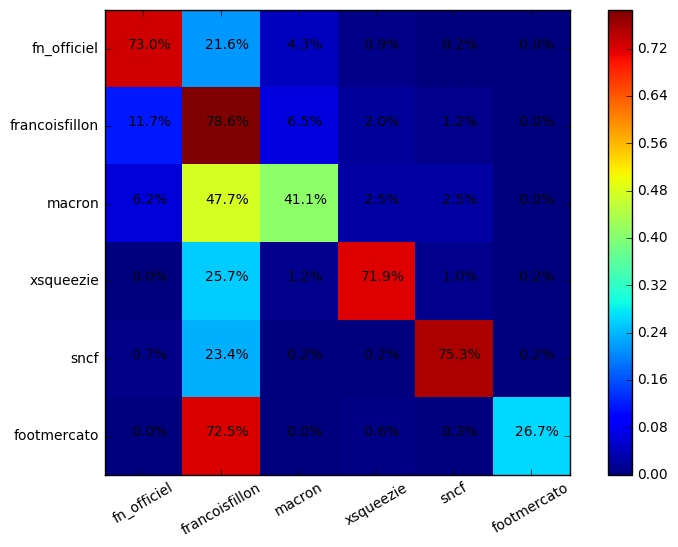

Epoch    3 : 9787.75   Test accuracy: 60.36 83.29 65.35 62.46 65.28 65.35 65.00 
Epoch    3 : 9736.76   Test accuracy: 60.47 83.36 65.32 62.42 65.28 65.39 64.97 
Epoch    3 : 9686.51   Test accuracy: 60.50 83.43 65.35 62.39 65.14 65.35 64.97 
Epoch    3 : 9636.96   Test accuracy: 60.43 83.46 65.28 62.35 65.21 65.49 64.97 
Epoch    3 : 9588.15   Test accuracy: 60.40 83.46 65.21 62.18 65.14 65.28 64.97 
Epoch    3 : 9540.13   Test accuracy: 60.47 83.32 65.21 62.21 65.18 65.18 65.00 
Epoch    3 : 9492.90   Test accuracy: 60.40 83.32 65.25 62.18 65.18 65.14 65.00 
Epoch    3 : 9446.38   Test accuracy: 60.33 83.53 65.28 62.21 65.18 65.00 65.00 
Epoch    3 : 9400.50   Test accuracy: 60.36 83.46 65.25 62.28 65.18 64.93 64.86 
Epoch    3 : 9355.23   Test accuracy: 60.36 83.50 65.25 62.21 65.14 64.20 64.86 
-------------------------------------------------
| 72.8% | 21.3% |  4.5% |  1.0% |  0.3% |  0.0% |   Total: 578
-------------------------------------------------
| 11.4% | 78.3% |  6.6% |  

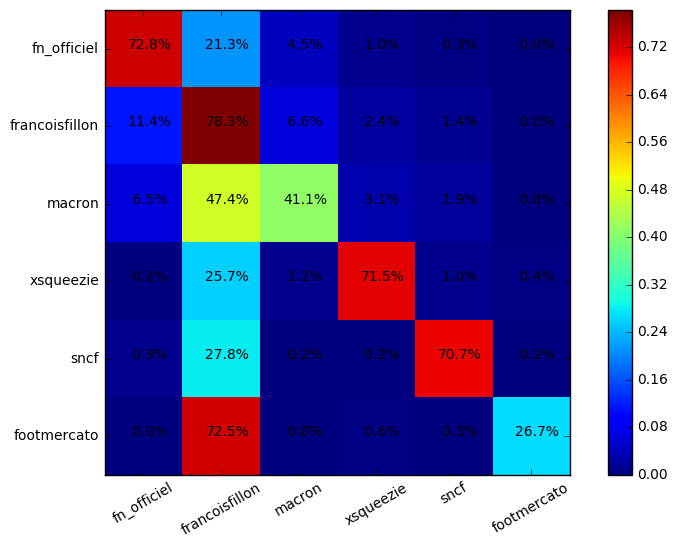

##################### 3 - Essai 0 ###################
Epoch    3 : 4378.74   Test accuracy: 73.16 77.87 76.07 74.45 75.82 76.16 75.34 
Epoch    3 : 4012.85   Test accuracy: 74.48 78.73 77.43 75.86 77.27 77.62 76.93 
Epoch    3 : 3839.41   Test accuracy: 74.89 79.09 77.91 76.46 77.82 78.25 77.46 
Epoch    3 : 3718.15   Test accuracy: 75.23 79.46 78.16 76.50 78.03 78.32 77.53 
Epoch    3 : 3621.70   Test accuracy: 75.48 79.78 78.28 76.57 78.12 78.50 77.55 
Epoch    3 : 3539.30   Test accuracy: 75.68 80.10 78.53 76.87 78.39 78.80 77.75 
Epoch    3 : 3465.67   Test accuracy: 75.93 80.16 78.98 77.37 78.71 79.07 78.12 
Epoch    3 : 3398.27   Test accuracy: 76.21 80.41 78.98 77.46 78.96 79.14 78.46 
Epoch    3 : 3335.98   Test accuracy: 76.34 80.46 79.16 77.62 79.09 79.28 78.59 
Epoch    3 : 3278.19   Test accuracy: 76.64 80.37 79.30 77.71 79.23 79.60 78.84 
-------------------------------------------------
| 74.6% | 17.7% |  6.0% |  1.0% |  0.5% |  0.1% |   Total: 772
-----------------------

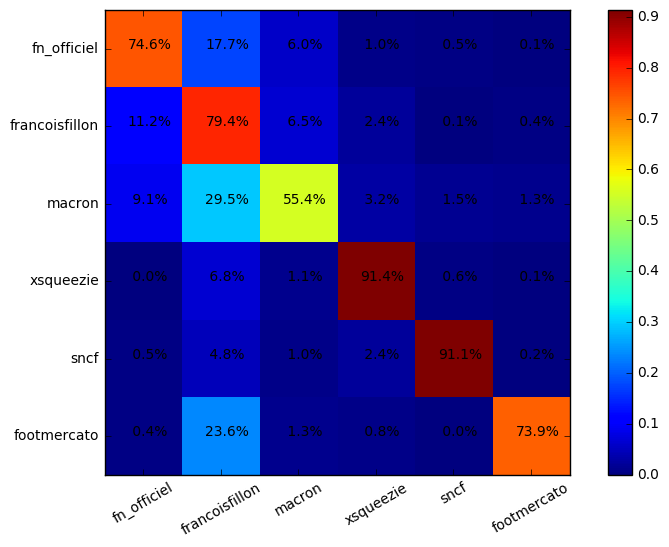

Epoch    3 : 3224.28   Test accuracy: 76.55 80.35 79.32 77.80 79.30 79.89 78.87 
Epoch    3 : 3173.63   Test accuracy: 76.55 80.25 79.41 77.89 79.25 79.66 78.94 
Epoch    3 : 3125.65   Test accuracy: 76.66 80.53 79.32 77.82 79.19 79.69 78.91 
Epoch    3 : 3079.94   Test accuracy: 76.50 80.53 79.23 77.64 79.09 79.66 78.87 
Epoch    3 : 3036.18   Test accuracy: 76.59 80.44 79.44 77.93 79.19 79.57 78.80 
Epoch    3 : 2994.14   Test accuracy: 76.52 80.48 79.32 77.93 79.28 79.80 78.64 
Epoch    3 : 2953.58   Test accuracy: 76.57 80.44 79.39 77.80 79.32 79.62 78.59 
Epoch    3 : 2914.32   Test accuracy: 76.52 80.46 79.32 77.64 79.16 79.48 78.66 
Epoch    3 : 2876.21   Test accuracy: 76.41 80.30 79.23 77.41 79.19 79.30 78.50 
Epoch    3 : 2839.13   Test accuracy: 76.23 80.23 79.23 77.41 79.12 79.14 78.46 
-------------------------------------------------
| 71.9% | 20.1% |  6.3% |  0.8% |  0.6% |  0.3% |   Total: 772
-------------------------------------------------
| 10.3% | 80.2% |  6.3% |  

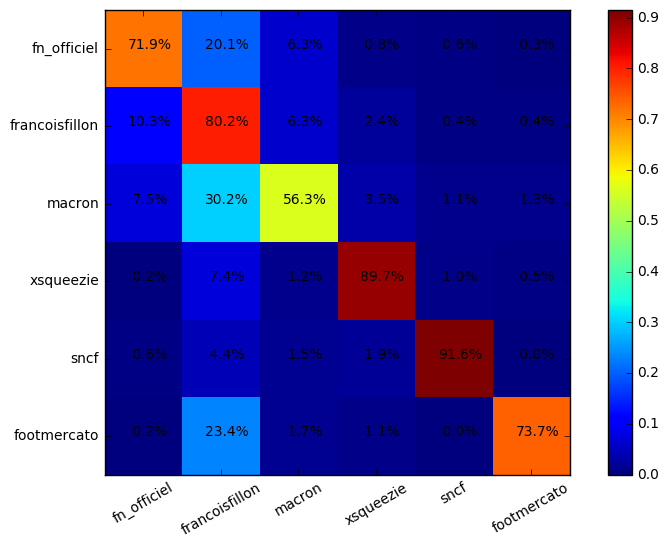

Epoch    3 : 2803.02   Test accuracy: 76.07 80.28 79.09 77.30 79.00 79.12 78.18 
Epoch    3 : 2767.80   Test accuracy: 76.09 80.39 79.03 77.21 78.82 79.05 78.34 
Epoch    3 : 2733.42   Test accuracy: 75.91 80.46 78.89 77.16 78.84 79.05 78.21 
Epoch    3 : 2699.86   Test accuracy: 75.86 80.57 78.87 77.07 78.71 79.07 78.18 
Epoch    3 : 2667.11   Test accuracy: 75.86 80.46 78.75 77.21 78.59 78.98 78.34 
Epoch    3 : 2635.16   Test accuracy: 75.84 80.41 78.82 77.09 78.57 78.94 78.23 
Epoch    3 : 2604.00   Test accuracy: 75.71 80.37 78.69 76.89 78.46 78.78 78.07 
Epoch    3 : 2573.62   Test accuracy: 75.71 80.21 78.53 76.87 78.43 78.78 77.91 
Epoch    3 : 2543.97   Test accuracy: 75.75 80.16 78.53 76.80 78.34 78.64 77.80 
Epoch    3 : 2515.04   Test accuracy: 75.68 80.00 78.48 76.77 78.39 78.69 77.73 
-------------------------------------------------
| 71.0% | 21.0% |  6.5% |  0.8% |  0.6% |  0.1% |   Total: 772
-------------------------------------------------
|  9.4% | 79.8% |  7.4% |  

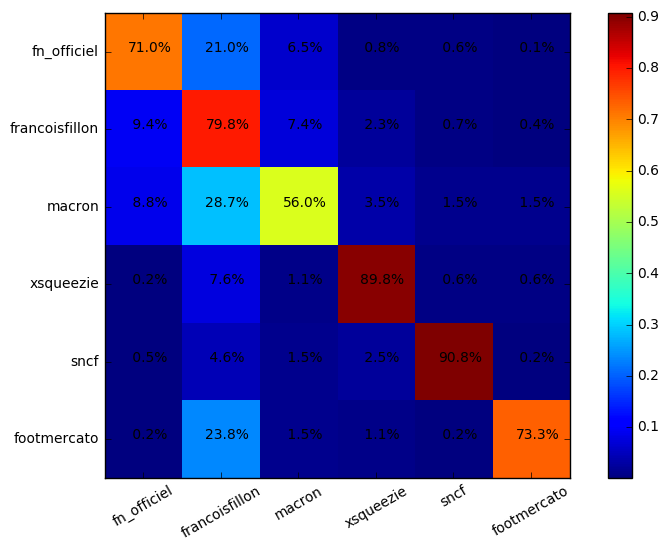

Epoch    3 : 2486.79   Test accuracy: 75.71 79.91 78.62 76.77 78.48 78.64 77.89 
Epoch    3 : 2459.15   Test accuracy: 75.71 79.89 78.73 76.80 78.50 78.64 77.80 
Epoch    3 : 2432.10   Test accuracy: 75.57 79.91 78.53 76.75 78.46 78.59 77.78 
Epoch    3 : 2405.60   Test accuracy: 75.45 79.96 78.41 76.62 78.41 78.39 77.68 
Epoch    3 : 2379.61   Test accuracy: 75.39 79.89 78.39 76.52 78.32 78.34 77.71 
Epoch    3 : 2354.07   Test accuracy: 75.34 79.98 78.23 76.64 78.18 78.25 77.71 
Epoch    3 : 2329.07   Test accuracy: 75.34 79.96 78.12 76.64 78.16 78.25 77.59 
Epoch    3 : 2304.58   Test accuracy: 75.32 79.94 78.07 76.59 78.14 78.23 77.59 
Epoch    3 : 2280.55   Test accuracy: 75.30 79.96 78.12 76.48 78.12 78.32 77.53 
Epoch    3 : 2256.97   Test accuracy: 75.16 79.96 78.21 76.41 78.18 78.37 77.57 
-------------------------------------------------
| 70.1% | 21.1% |  7.0% |  0.6% |  0.8% |  0.4% |   Total: 772
-------------------------------------------------
|  9.2% | 80.3% |  7.2% |  

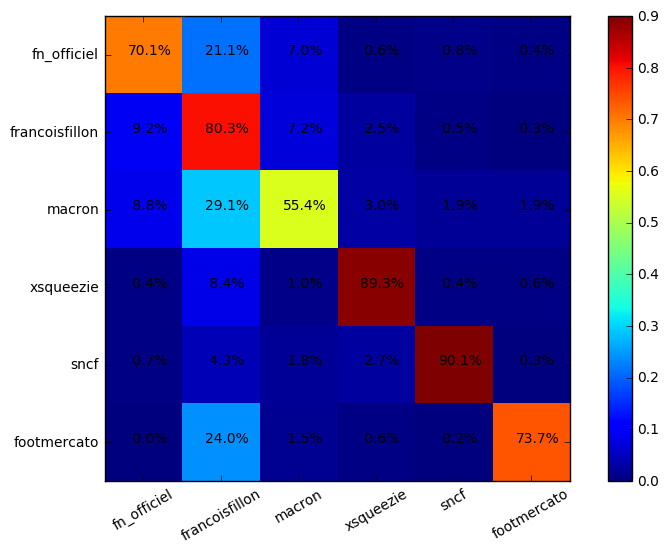

Epoch    3 : 2233.82   Test accuracy: 75.16 79.80 78.21 76.27 78.16 78.46 77.68 
Epoch    3 : 2211.12   Test accuracy: 75.09 79.78 78.16 76.16 78.07 78.28 77.80 
Epoch    3 : 2188.84   Test accuracy: 75.09 79.73 78.05 76.18 78.12 78.07 77.80 
Epoch    3 : 2166.96   Test accuracy: 75.07 79.71 78.03 76.14 77.98 78.12 77.71 
Epoch    3 : 2145.46   Test accuracy: 75.02 79.62 77.87 76.21 77.91 78.03 77.55 
Epoch    3 : 2124.33   Test accuracy: 75.07 79.73 77.87 76.18 77.89 78.05 77.41 
Epoch    3 : 2103.56   Test accuracy: 75.07 79.71 77.91 76.14 77.93 77.89 77.57 
Epoch    3 : 2083.12   Test accuracy: 75.09 79.71 77.93 76.27 77.93 77.75 77.50 
Epoch    3 : 2063.02   Test accuracy: 75.11 79.75 77.84 76.25 77.82 77.68 77.43 
Epoch    3 : 2043.24   Test accuracy: 75.00 79.75 77.89 76.11 77.87 77.71 77.39 
-------------------------------------------------
| 70.7% | 20.9% |  6.6% |  0.5% |  0.8% |  0.5% |   Total: 772
-------------------------------------------------
| 10.6% | 78.5% |  7.5% |  

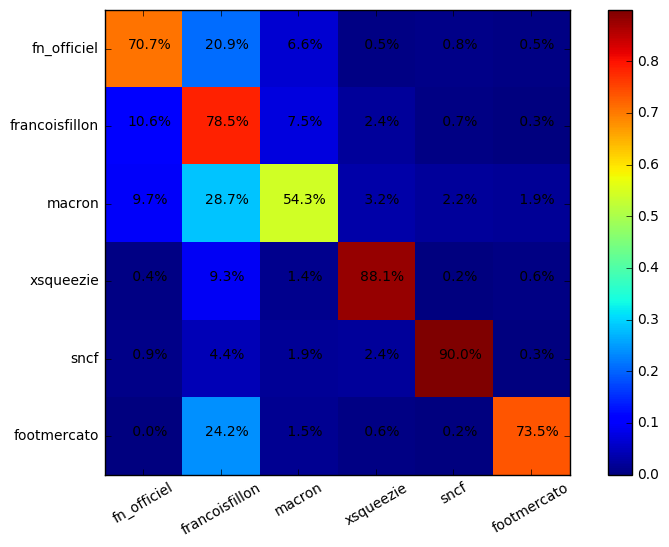

Epoch    3 : 2023.75   Test accuracy: 74.86 79.62 77.87 76.14 77.80 77.71 77.39 
Epoch    3 : 2004.53   Test accuracy: 74.95 79.64 78.00 76.25 77.89 77.75 77.46 
Epoch    3 : 1985.56   Test accuracy: 74.95 79.69 77.98 76.30 77.84 77.78 77.53 
Epoch    3 : 1966.82   Test accuracy: 74.86 79.64 77.91 76.34 77.89 77.84 77.59 
Epoch    3 : 1948.30   Test accuracy: 74.82 79.66 78.03 76.39 77.96 77.89 77.73 
Epoch    3 : 1929.99   Test accuracy: 74.70 79.71 78.03 76.39 78.00 77.84 77.66 
Epoch    3 : 1911.87   Test accuracy: 74.57 79.66 77.96 76.39 78.00 77.80 77.59 
Epoch    3 : 1893.94   Test accuracy: 74.61 79.62 77.89 76.32 77.96 77.71 77.59 
Epoch    3 : 1876.29   Test accuracy: 74.59 79.71 78.03 76.21 78.05 77.66 77.50 
Epoch    3 : 1858.92   Test accuracy: 74.57 79.75 78.05 76.16 77.98 77.64 77.57 
-------------------------------------------------
| 71.0% | 20.6% |  6.5% |  0.8% |  0.6% |  0.5% |   Total: 772
-------------------------------------------------
| 11.6% | 78.3% |  7.3% |  

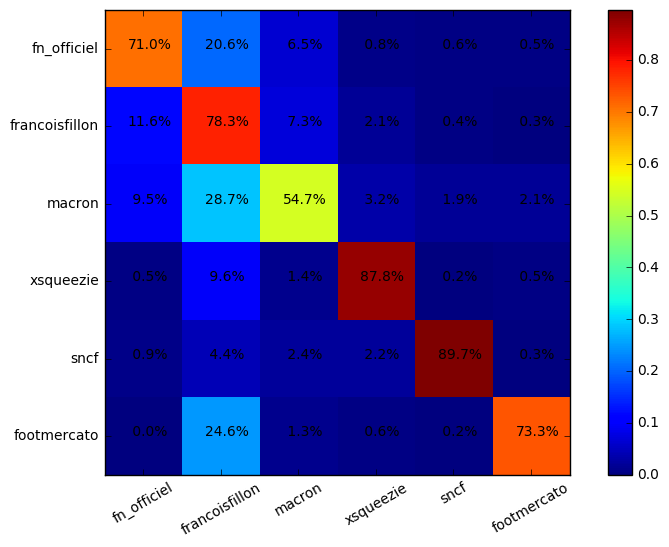

##################### 3 - Essai 1 ###################
Epoch    3 : 4297.85   Test accuracy: 73.82 77.57 76.41 75.09 76.27 76.59 75.75 
Epoch    3 : 3970.52   Test accuracy: 74.93 78.78 77.71 76.30 77.62 77.82 77.09 
Epoch    3 : 3801.92   Test accuracy: 75.55 79.21 78.37 76.93 78.37 78.62 77.62 
Epoch    3 : 3679.16   Test accuracy: 75.89 79.62 78.69 77.09 78.71 78.84 78.03 
Epoch    3 : 3580.90   Test accuracy: 76.16 79.89 78.78 77.16 78.69 79.00 78.09 
Epoch    3 : 3498.70   Test accuracy: 76.21 80.30 78.98 77.27 78.82 79.12 78.25 
Epoch    3 : 3426.53   Test accuracy: 76.16 80.12 79.00 77.41 78.91 79.16 78.43 
Epoch    3 : 3360.76   Test accuracy: 76.32 80.07 79.07 77.48 79.00 79.23 78.50 
Epoch    3 : 3299.45   Test accuracy: 76.18 80.60 79.23 77.68 79.16 79.55 78.66 
Epoch    3 : 3241.69   Test accuracy: 76.27 80.66 79.12 77.59 79.00 79.39 78.91 
-------------------------------------------------
| 77.1% | 15.8% |  5.4% |  0.9% |  0.5% |  0.3% |   Total: 772
-----------------------

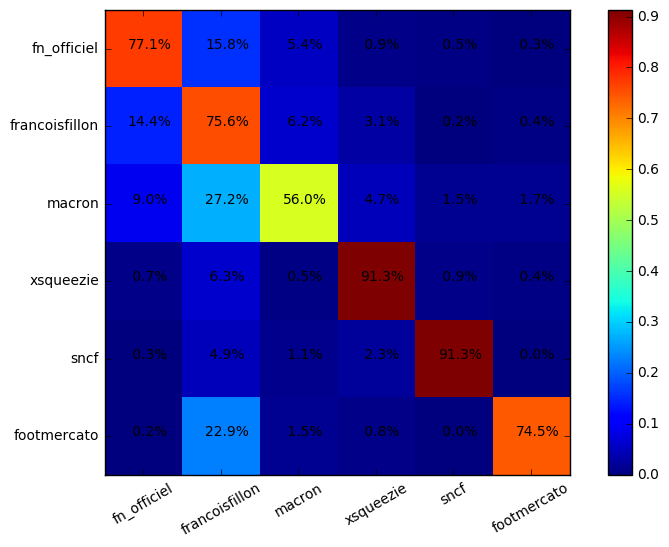

Epoch    3 : 3187.05   Test accuracy: 76.18 80.80 79.09 77.50 78.98 79.23 78.91 
Epoch    3 : 3135.34   Test accuracy: 76.34 80.85 79.21 77.57 79.09 79.32 78.78 
Epoch    3 : 3086.36   Test accuracy: 76.50 80.89 79.09 77.59 79.03 79.16 78.55 
Epoch    3 : 3039.80   Test accuracy: 76.41 81.01 79.03 77.48 78.91 79.21 78.50 
Epoch    3 : 2995.36   Test accuracy: 76.21 80.91 79.09 77.57 79.00 79.28 78.32 
Epoch    3 : 2952.80   Test accuracy: 76.21 80.89 79.09 77.48 78.94 79.41 78.43 
Epoch    3 : 2911.88   Test accuracy: 76.50 80.87 79.44 77.55 79.09 79.39 78.43 
Epoch    3 : 2872.42   Test accuracy: 76.48 80.82 79.37 77.59 79.21 79.50 78.75 
Epoch    3 : 2834.25   Test accuracy: 76.39 80.78 79.39 77.66 79.28 79.53 78.75 
Epoch    3 : 2797.25   Test accuracy: 76.30 80.76 79.34 77.73 79.28 79.50 78.78 
-------------------------------------------------
| 75.8% | 17.4% |  5.6% |  0.8% |  0.4% |  0.1% |   Total: 772
-------------------------------------------------
| 13.8% | 77.0% |  5.9% |  

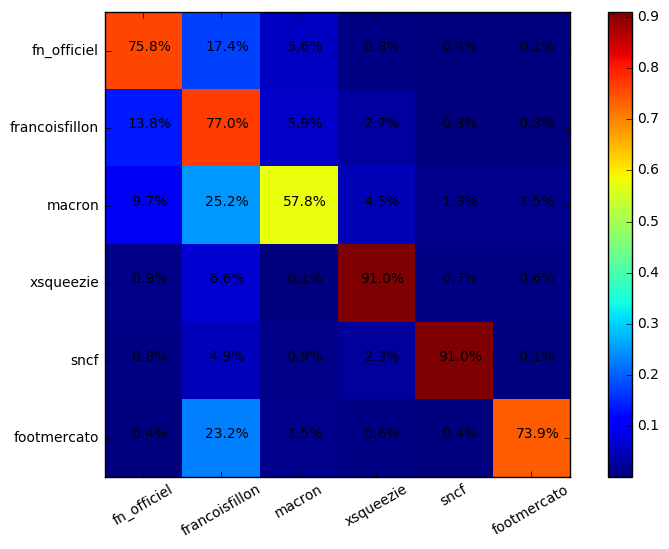

Epoch    3 : 2761.31   Test accuracy: 76.36 80.64 79.41 77.73 79.41 79.32 78.82 
Epoch    3 : 2726.32   Test accuracy: 76.34 80.69 79.23 77.62 79.32 79.25 78.75 
Epoch    3 : 2692.22   Test accuracy: 76.27 80.82 79.25 77.59 79.14 79.32 78.66 
Epoch    3 : 2658.97   Test accuracy: 76.25 80.82 79.25 77.68 79.14 79.30 78.71 
Epoch    3 : 2626.53   Test accuracy: 76.16 80.82 79.23 77.53 79.14 79.32 78.64 
Epoch    3 : 2594.86   Test accuracy: 76.09 80.82 79.09 77.37 79.07 79.14 78.53 
Epoch    3 : 2563.92   Test accuracy: 76.11 80.85 79.12 77.48 79.05 78.89 78.46 
Epoch    3 : 2533.67   Test accuracy: 75.96 80.82 78.96 77.34 79.03 78.98 78.39 
Epoch    3 : 2504.07   Test accuracy: 75.82 80.73 78.98 77.32 78.91 79.12 78.23 
Epoch    3 : 2475.09   Test accuracy: 75.91 80.73 79.05 77.43 79.00 79.00 78.23 
-------------------------------------------------
| 74.4% | 18.7% |  5.7% |  0.8% |  0.4% |  0.1% |   Total: 772
-------------------------------------------------
| 12.7% | 76.8% |  6.8% |  

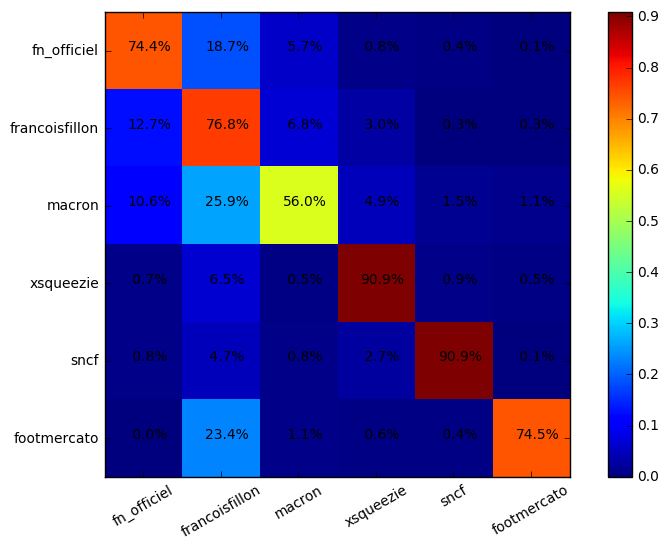

Epoch    3 : 2446.70   Test accuracy: 75.82 80.89 79.14 77.48 79.14 79.19 78.41 
Epoch    3 : 2418.86   Test accuracy: 75.77 80.89 79.19 77.57 79.21 79.23 78.48 
Epoch    3 : 2391.55   Test accuracy: 75.73 80.82 79.34 77.48 79.19 79.21 78.55 
Epoch    3 : 2364.76   Test accuracy: 75.71 80.87 79.34 77.50 79.19 79.23 78.50 
Epoch    3 : 2338.49   Test accuracy: 75.77 80.98 79.30 77.50 79.21 79.16 78.53 
Epoch    3 : 2312.73   Test accuracy: 75.89 80.91 79.23 77.48 79.28 79.12 78.57 
Epoch    3 : 2287.47   Test accuracy: 75.89 80.98 79.21 77.50 79.12 79.16 78.62 
Epoch    3 : 2262.70   Test accuracy: 75.84 81.05 79.25 77.59 79.16 79.34 78.59 
Epoch    3 : 2238.40   Test accuracy: 75.86 81.05 79.28 77.57 79.12 79.28 78.69 
Epoch    3 : 2214.55   Test accuracy: 75.96 81.03 79.21 77.53 79.14 79.23 78.80 
-------------------------------------------------
| 74.5% | 18.8% |  5.6% |  0.4% |  0.6% |  0.1% |   Total: 772
-------------------------------------------------
| 11.4% | 77.2% |  7.3% |  

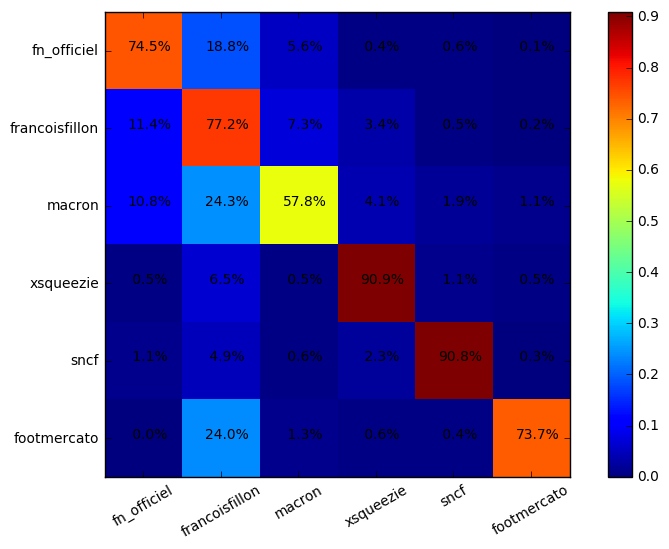

Epoch    3 : 2191.14   Test accuracy: 75.93 81.07 79.16 77.62 79.12 79.25 78.84 
Epoch    3 : 2168.16   Test accuracy: 75.84 81.10 79.19 77.66 79.19 79.12 78.87 
Epoch    3 : 2145.59   Test accuracy: 75.80 80.98 79.07 77.55 79.09 79.12 78.80 
Epoch    3 : 2123.41   Test accuracy: 75.86 81.12 79.03 77.53 79.00 78.96 78.75 
Epoch    3 : 2101.60   Test accuracy: 75.86 81.14 79.03 77.46 78.94 78.98 78.80 
Epoch    3 : 2080.15   Test accuracy: 75.84 81.16 78.98 77.32 78.91 78.87 78.59 
Epoch    3 : 2059.04   Test accuracy: 75.75 81.14 78.89 77.27 78.78 78.87 78.50 
Epoch    3 : 2038.27   Test accuracy: 75.77 81.03 78.89 77.25 78.75 78.80 78.46 
Epoch    3 : 2017.81   Test accuracy: 75.80 81.01 78.84 77.27 78.69 78.82 78.41 
Epoch    3 : 1997.66   Test accuracy: 75.73 80.94 78.84 77.21 78.64 78.82 78.46 
-------------------------------------------------
| 73.7% | 18.7% |  6.0% |  0.6% |  0.6% |  0.4% |   Total: 772
-------------------------------------------------
| 11.4% | 76.4% |  8.0% |  

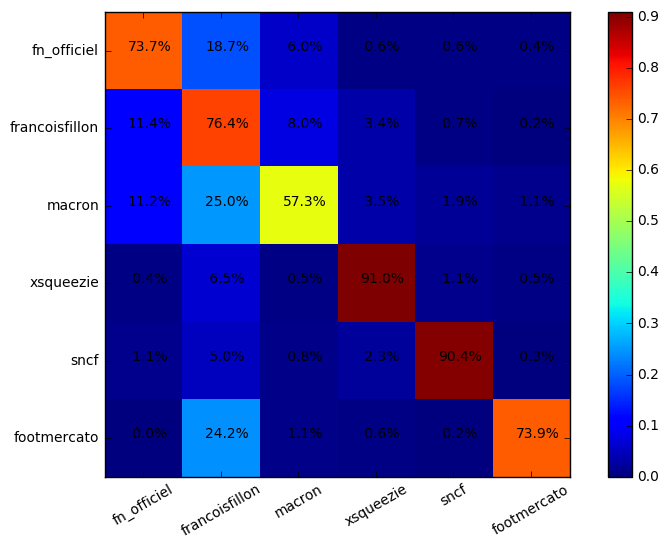

Epoch    3 : 1977.81   Test accuracy: 75.80 80.87 78.73 77.18 78.59 78.64 78.37 
Epoch    3 : 1958.26   Test accuracy: 75.91 80.76 78.57 77.02 78.62 78.73 78.48 
Epoch    3 : 1939.00   Test accuracy: 75.96 80.73 78.69 77.14 78.50 78.73 78.43 
Epoch    3 : 1920.05   Test accuracy: 75.89 80.57 78.62 77.07 78.62 78.71 78.32 
Epoch    3 : 1901.39   Test accuracy: 75.89 80.48 78.62 77.02 78.55 78.64 78.21 
Epoch    3 : 1883.04   Test accuracy: 75.82 80.39 78.62 77.07 78.50 78.69 78.12 
Epoch    3 : 1864.99   Test accuracy: 75.77 80.44 78.66 77.18 78.55 78.62 78.03 
Epoch    3 : 1847.25   Test accuracy: 75.66 80.44 78.62 77.14 78.48 78.57 77.87 
Epoch    3 : 1829.80   Test accuracy: 75.48 80.46 78.53 77.05 78.48 78.50 77.84 
Epoch    3 : 1812.63   Test accuracy: 75.39 80.39 78.48 77.00 78.48 78.53 77.80 
-------------------------------------------------
| 74.0% | 18.8% |  5.3% |  0.8% |  0.6% |  0.5% |   Total: 772
-------------------------------------------------
| 12.2% | 75.8% |  7.3% |  

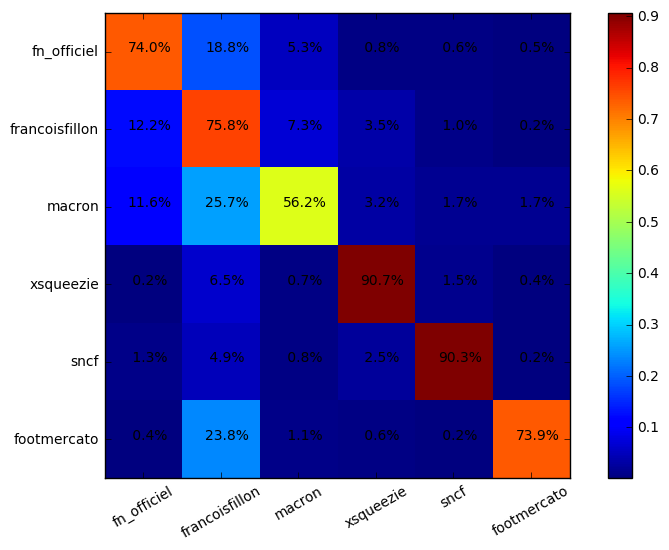

##################### 3 - Essai 2 ###################
Epoch    3 : 4307.12   Test accuracy: 74.41 77.87 76.96 75.45 76.82 77.05 76.48 
Epoch    3 : 3992.06   Test accuracy: 74.61 79.03 77.46 75.98 77.41 77.84 76.84 
Epoch    3 : 3823.63   Test accuracy: 75.25 79.69 78.28 76.89 78.23 78.57 77.87 
Epoch    3 : 3698.02   Test accuracy: 75.93 80.16 79.05 77.37 78.84 79.28 78.48 
Epoch    3 : 3593.87   Test accuracy: 76.68 80.64 79.57 77.91 79.48 79.78 78.94 
Epoch    3 : 3505.32   Test accuracy: 76.87 80.96 79.91 78.21 79.78 80.10 79.03 
Epoch    3 : 3428.78   Test accuracy: 77.00 81.30 79.98 78.37 79.78 80.28 79.07 
Epoch    3 : 3361.29   Test accuracy: 77.05 81.48 79.89 78.25 79.89 80.21 79.30 
Epoch    3 : 3300.45   Test accuracy: 77.02 81.46 80.05 78.34 79.89 80.23 79.48 
Epoch    3 : 3244.51   Test accuracy: 77.07 81.39 80.32 78.46 80.23 80.39 79.66 
-------------------------------------------------
| 75.5% | 16.3% |  6.9% |  0.6% |  0.3% |  0.4% |   Total: 772
-----------------------

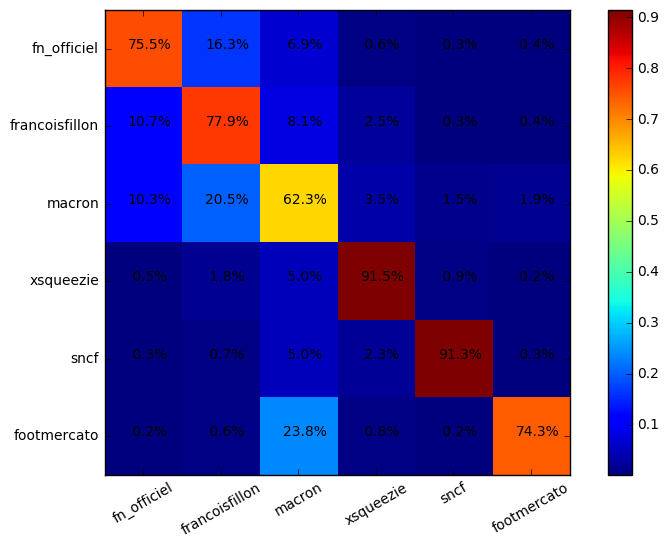

Epoch    3 : 3192.28   Test accuracy: 77.18 81.53 80.46 78.71 80.32 80.48 79.69 
Epoch    3 : 3142.94   Test accuracy: 77.18 81.62 80.48 78.66 80.23 80.64 79.80 
Epoch    3 : 3095.91   Test accuracy: 77.16 81.57 80.46 78.96 80.32 80.78 79.80 
Epoch    3 : 3050.76   Test accuracy: 77.16 81.62 80.53 78.94 80.41 80.62 79.66 
Epoch    3 : 3007.25   Test accuracy: 77.25 81.67 80.41 78.84 80.32 80.60 79.69 
Epoch    3 : 2965.20   Test accuracy: 77.23 81.64 80.60 78.87 80.44 80.60 79.62 
Epoch    3 : 2924.47   Test accuracy: 77.07 81.57 80.57 78.75 80.32 80.37 79.53 
Epoch    3 : 2884.97   Test accuracy: 77.14 81.44 80.37 78.66 80.28 80.32 79.62 
Epoch    3 : 2846.68   Test accuracy: 77.09 81.46 80.32 78.62 80.21 80.48 79.62 
Epoch    3 : 2809.62   Test accuracy: 77.14 81.44 80.32 78.64 80.16 80.64 79.60 
-------------------------------------------------
| 75.6% | 15.4% |  7.3% |  0.8% |  0.3% |  0.6% |   Total: 772
-------------------------------------------------
| 10.1% | 78.0% |  8.7% |  

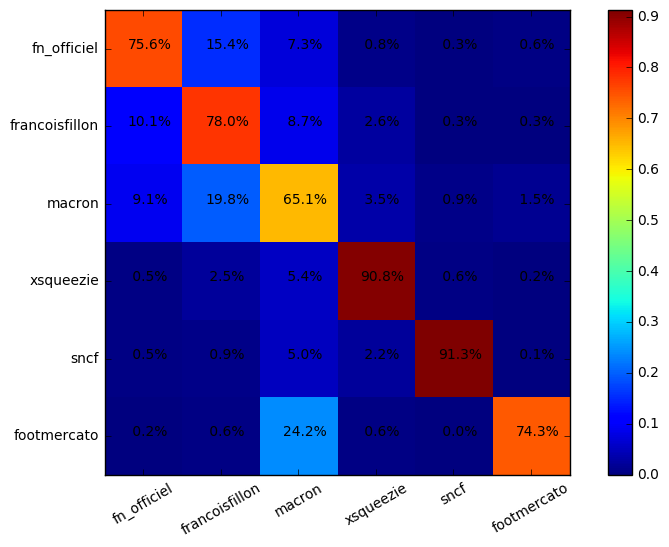

Epoch    3 : 2773.77   Test accuracy: 77.23 81.39 80.21 78.64 80.05 80.44 79.55 
Epoch    3 : 2739.09   Test accuracy: 77.02 81.32 80.16 78.55 79.98 80.28 79.39 
Epoch    3 : 2705.52   Test accuracy: 76.98 81.21 80.12 78.43 79.91 80.23 79.16 
Epoch    3 : 2672.97   Test accuracy: 76.96 81.23 80.00 78.43 79.89 80.28 79.09 
Epoch    3 : 2641.34   Test accuracy: 77.05 81.10 80.12 78.46 79.89 80.14 78.98 
Epoch    3 : 2610.56   Test accuracy: 76.96 80.94 80.05 78.41 79.89 80.14 78.89 
Epoch    3 : 2580.54   Test accuracy: 76.91 80.96 80.10 78.37 79.89 80.14 78.87 
Epoch    3 : 2551.21   Test accuracy: 76.89 80.89 79.94 78.25 79.89 80.07 78.84 
Epoch    3 : 2522.51   Test accuracy: 76.77 80.94 79.80 78.18 79.64 80.14 78.96 
Epoch    3 : 2494.37   Test accuracy: 76.66 80.80 80.07 78.28 79.69 80.12 79.00 
-------------------------------------------------
| 75.4% | 15.3% |  7.8% |  0.6% |  0.3% |  0.6% |   Total: 772
-------------------------------------------------
| 10.7% | 77.4% |  8.3% |  

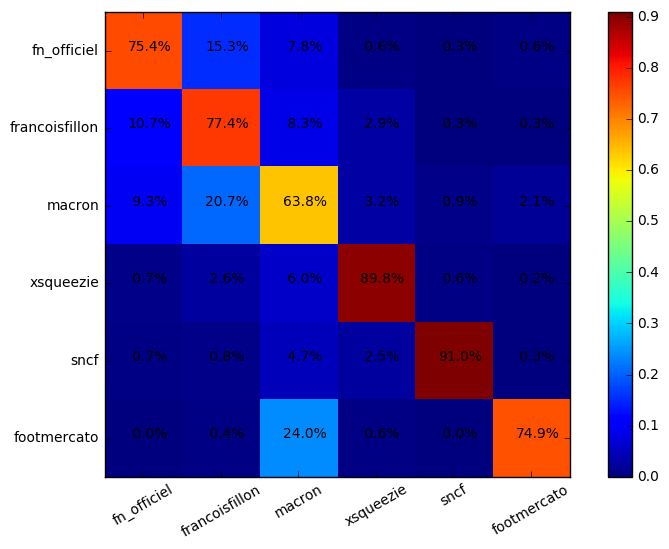

Epoch    3 : 2466.77   Test accuracy: 76.55 80.80 79.91 78.30 79.69 80.14 78.98 
Epoch    3 : 2439.71   Test accuracy: 76.52 80.71 80.00 78.28 79.66 80.10 78.96 
Epoch    3 : 2413.18   Test accuracy: 76.59 80.82 79.98 78.30 79.69 80.14 78.94 
Epoch    3 : 2387.14   Test accuracy: 76.59 80.76 79.96 78.32 79.71 80.03 79.09 
Epoch    3 : 2361.57   Test accuracy: 76.62 80.87 79.78 78.34 79.60 79.98 78.82 
Epoch    3 : 2336.41   Test accuracy: 76.66 80.85 79.62 78.18 79.50 79.82 78.71 
Epoch    3 : 2311.60   Test accuracy: 76.75 80.94 79.55 78.07 79.37 79.78 78.78 
Epoch    3 : 2287.13   Test accuracy: 76.52 80.89 79.53 78.05 79.39 79.69 78.69 
Epoch    3 : 2262.97   Test accuracy: 76.46 80.94 79.46 77.96 79.30 79.62 78.71 
Epoch    3 : 2239.11   Test accuracy: 76.46 80.89 79.53 77.89 79.19 79.60 78.71 
-------------------------------------------------
| 73.4% | 17.4% |  7.6% |  0.5% |  0.5% |  0.5% |   Total: 772
-------------------------------------------------
| 10.6% | 77.5% |  8.5% |  

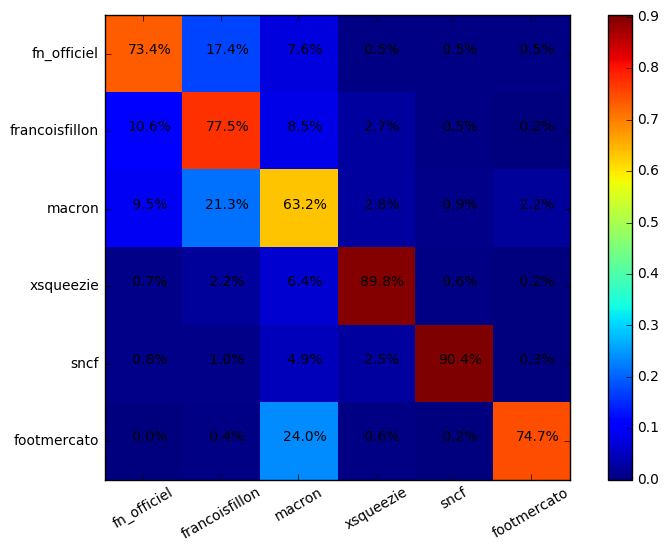

Epoch    3 : 2215.54   Test accuracy: 76.55 80.96 79.46 77.89 79.28 79.60 78.62 
Epoch    3 : 2192.24   Test accuracy: 76.50 80.89 79.34 77.84 79.23 79.57 78.57 
Epoch    3 : 2169.22   Test accuracy: 76.48 80.94 79.32 77.80 79.23 79.50 78.64 
Epoch    3 : 2146.51   Test accuracy: 76.48 80.94 79.41 77.80 79.25 79.48 78.62 
Epoch    3 : 2124.10   Test accuracy: 76.41 80.91 79.39 77.82 79.41 79.53 78.59 
Epoch    3 : 2101.99   Test accuracy: 76.55 81.01 79.53 77.91 79.44 79.57 78.75 
Epoch    3 : 2080.17   Test accuracy: 76.57 81.01 79.60 77.98 79.44 79.71 78.73 
Epoch    3 : 2058.63   Test accuracy: 76.39 80.94 79.41 77.89 79.39 79.80 78.73 
Epoch    3 : 2037.35   Test accuracy: 76.41 80.91 79.53 77.96 79.44 79.60 78.69 
Epoch    3 : 2016.35   Test accuracy: 76.30 80.98 79.46 77.82 79.46 79.55 78.71 
-------------------------------------------------
| 73.8% | 16.7% |  7.5% |  0.9% |  0.5% |  0.5% |   Total: 772
-------------------------------------------------
| 10.7% | 78.3% |  7.8% |  

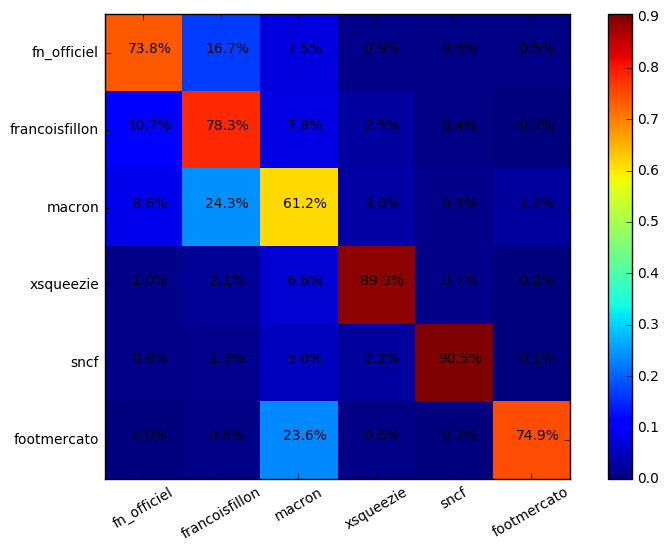

Epoch    3 : 1995.60   Test accuracy: 76.30 80.94 79.30 77.66 79.50 79.39 78.69 
Epoch    3 : 1975.11   Test accuracy: 76.25 80.78 79.21 77.68 79.44 79.37 78.80 
Epoch    3 : 1954.87   Test accuracy: 76.32 80.76 79.30 77.62 79.32 79.34 78.89 
Epoch    3 : 1934.89   Test accuracy: 76.32 80.76 79.21 77.66 79.30 79.23 78.82 
Epoch    3 : 1915.15   Test accuracy: 76.30 80.69 79.30 77.75 79.30 79.19 78.84 
Epoch    3 : 1895.66   Test accuracy: 76.25 80.66 79.28 77.73 79.23 79.28 78.80 
Epoch    3 : 1876.44   Test accuracy: 76.27 80.76 79.19 77.66 79.16 79.25 78.78 
Epoch    3 : 1857.48   Test accuracy: 76.11 80.76 79.14 77.62 79.09 79.19 78.80 
Epoch    3 : 1838.77   Test accuracy: 76.11 80.69 79.16 77.50 79.05 79.12 78.73 
Epoch    3 : 1820.31   Test accuracy: 76.07 80.71 79.14 77.48 79.14 79.03 78.57 
-------------------------------------------------
| 72.3% | 18.5% |  6.7% |  1.0% |  0.9% |  0.5% |   Total: 772
-------------------------------------------------
| 10.6% | 78.3% |  7.9% |  

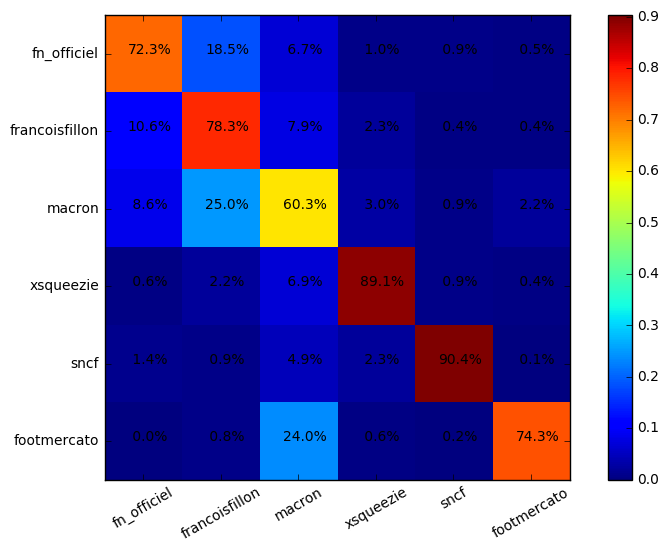

##################### 3 - Essai 3 ###################
Epoch    3 : 4341.50   Test accuracy: 73.52 77.53 76.30 74.91 76.14 76.39 75.64 
Epoch    3 : 3989.31   Test accuracy: 74.70 78.75 77.43 75.84 77.27 77.64 76.80 
Epoch    3 : 3810.05   Test accuracy: 75.07 79.14 78.37 76.48 78.14 78.34 77.68 
Epoch    3 : 3680.61   Test accuracy: 75.50 79.44 78.71 76.91 78.55 78.57 78.00 
Epoch    3 : 3576.00   Test accuracy: 76.09 79.66 79.12 77.46 78.98 79.07 78.34 
Epoch    3 : 3486.37   Test accuracy: 76.39 80.12 79.66 77.80 79.55 79.50 78.80 
Epoch    3 : 3407.28   Test accuracy: 76.36 80.62 79.78 77.96 79.78 79.82 78.96 
Epoch    3 : 3335.89   Test accuracy: 76.57 80.62 79.73 78.14 79.62 79.82 78.98 
Epoch    3 : 3270.49   Test accuracy: 76.36 80.48 79.62 77.91 79.53 79.82 79.00 
Epoch    3 : 3210.09   Test accuracy: 76.36 80.53 79.39 77.68 79.34 79.69 78.73 
-------------------------------------------------
| 76.4% | 16.1% |  6.3% |  0.5% |  0.4% |  0.3% |   Total: 772
-----------------------

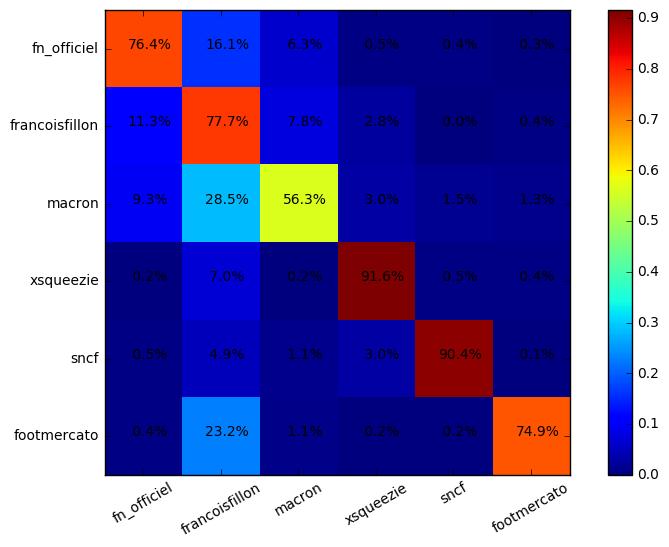

Epoch    3 : 3153.77   Test accuracy: 76.34 80.37 79.39 77.66 79.32 79.50 78.62 
Epoch    3 : 3100.87   Test accuracy: 76.52 80.53 79.44 77.75 79.16 79.55 78.53 
Epoch    3 : 3050.98   Test accuracy: 76.59 80.55 79.41 77.71 79.14 79.60 78.46 
Epoch    3 : 3003.75   Test accuracy: 76.64 80.57 79.55 77.78 79.21 79.60 78.55 
Epoch    3 : 2958.85   Test accuracy: 76.46 80.62 79.28 77.64 79.16 79.55 78.55 
Epoch    3 : 2915.93   Test accuracy: 76.32 80.55 79.12 77.43 78.89 79.30 78.41 
Epoch    3 : 2874.74   Test accuracy: 76.23 80.35 79.05 77.39 78.94 79.16 78.28 
Epoch    3 : 2835.06   Test accuracy: 75.93 80.41 78.84 77.32 78.71 78.96 78.07 
Epoch    3 : 2796.73   Test accuracy: 75.75 80.32 78.84 77.12 78.57 78.96 78.03 
Epoch    3 : 2759.62   Test accuracy: 75.77 80.21 78.89 77.14 78.71 78.87 78.00 
-------------------------------------------------
| 74.9% | 17.5% |  6.6% |  0.6% |  0.4% |  0.0% |   Total: 772
-------------------------------------------------
| 11.4% | 77.8% |  7.5% |  

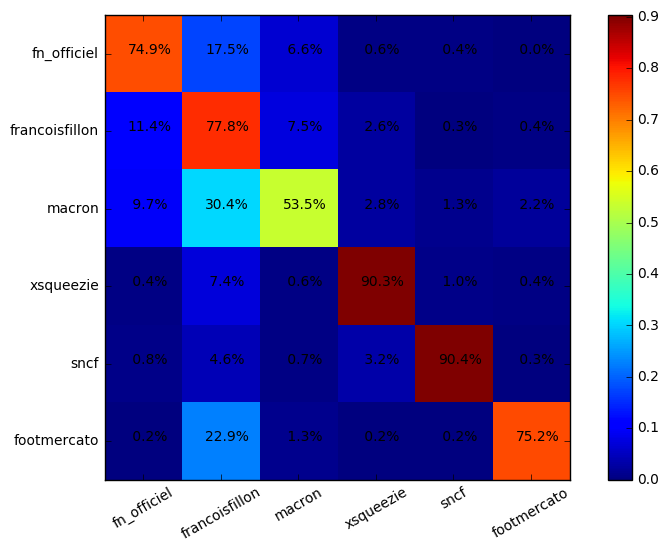

Epoch    3 : 2723.66   Test accuracy: 75.71 80.19 78.89 77.12 78.62 78.91 77.93 
Epoch    3 : 2688.73   Test accuracy: 75.71 80.12 78.82 77.14 78.64 78.89 78.00 
Epoch    3 : 2654.72   Test accuracy: 75.61 80.19 78.75 77.14 78.69 78.82 78.00 
Epoch    3 : 2621.59   Test accuracy: 75.52 80.16 78.80 77.05 78.73 78.89 78.07 
Epoch    3 : 2589.28   Test accuracy: 75.57 80.12 78.73 77.09 78.71 78.82 78.00 
Epoch    3 : 2557.76   Test accuracy: 75.66 80.23 78.66 77.05 78.53 78.84 77.91 
Epoch    3 : 2526.99   Test accuracy: 75.64 80.25 78.62 77.12 78.50 78.75 77.87 
Epoch    3 : 2496.94   Test accuracy: 75.68 80.35 78.71 77.18 78.43 78.80 77.96 
Epoch    3 : 2467.56   Test accuracy: 75.55 80.37 78.59 77.05 78.37 78.73 78.03 
Epoch    3 : 2438.82   Test accuracy: 75.41 80.48 78.50 76.87 78.37 78.66 78.12 
-------------------------------------------------
| 75.0% | 18.0% |  5.8% |  0.8% |  0.4% |  0.0% |   Total: 772
-------------------------------------------------
| 12.6% | 76.2% |  8.0% |  

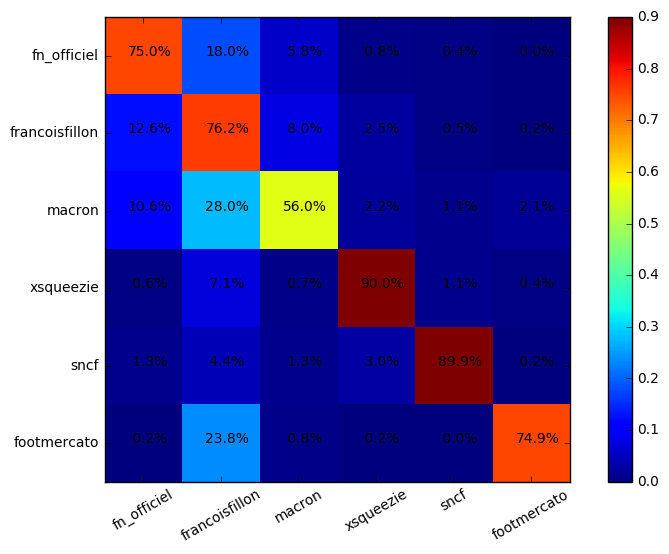

Epoch    3 : 2410.68   Test accuracy: 75.45 80.51 78.57 76.93 78.46 78.66 78.03 
Epoch    3 : 2383.08   Test accuracy: 75.41 80.53 78.64 76.89 78.41 78.75 77.96 
Epoch    3 : 2356.00   Test accuracy: 75.43 80.57 78.53 76.80 78.39 78.75 78.00 
Epoch    3 : 2329.43   Test accuracy: 75.52 80.48 78.55 76.77 78.34 78.69 77.91 
Epoch    3 : 2303.33   Test accuracy: 75.52 80.60 78.50 76.75 78.30 78.62 77.89 
Epoch    3 : 2277.70   Test accuracy: 75.57 80.41 78.57 76.80 78.41 78.66 77.82 
Epoch    3 : 2252.50   Test accuracy: 75.48 80.28 78.50 76.68 78.39 78.59 77.78 
Epoch    3 : 2227.75   Test accuracy: 75.48 80.25 78.37 76.62 78.37 78.46 77.73 
Epoch    3 : 2203.45   Test accuracy: 75.41 80.16 78.25 76.73 78.14 78.39 77.75 
Epoch    3 : 2179.60   Test accuracy: 75.25 80.14 78.21 76.71 78.14 78.37 77.78 
-------------------------------------------------
| 75.4% | 17.2% |  6.5% |  0.6% |  0.3% |  0.0% |   Total: 772
-------------------------------------------------
| 12.8% | 75.2% |  8.1% |  

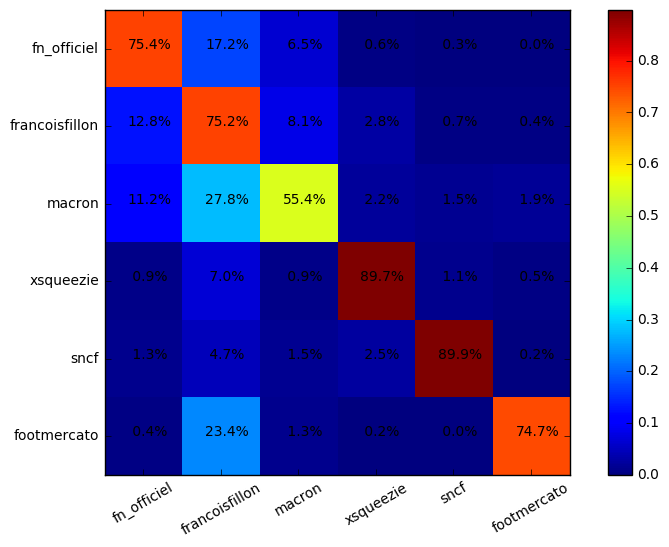

Epoch    3 : 2156.22   Test accuracy: 75.27 80.21 78.18 76.75 78.14 78.18 77.73 
Epoch    3 : 2133.31   Test accuracy: 75.27 80.05 78.25 76.75 78.18 78.32 77.73 
Epoch    3 : 2110.86   Test accuracy: 75.30 79.94 78.14 76.71 78.09 78.25 77.75 
Epoch    3 : 2088.87   Test accuracy: 75.14 80.05 77.93 76.52 77.91 78.07 77.57 
Epoch    3 : 2067.33   Test accuracy: 75.05 79.96 77.89 76.55 77.87 77.98 77.50 
Epoch    3 : 2046.21   Test accuracy: 74.98 79.98 77.87 76.48 77.84 77.93 77.46 
Epoch    3 : 2025.49   Test accuracy: 74.91 79.94 77.89 76.46 77.91 78.03 77.46 
Epoch    3 : 2005.16   Test accuracy: 74.77 79.89 77.98 76.43 77.91 78.07 77.34 
Epoch    3 : 1985.21   Test accuracy: 74.66 79.75 77.87 76.46 77.89 78.07 77.30 
Epoch    3 : 1965.63   Test accuracy: 74.73 79.73 77.89 76.36 77.84 77.98 77.23 
-------------------------------------------------
| 75.6% | 17.6% |  5.8% |  0.5% |  0.4% |  0.0% |   Total: 772
-------------------------------------------------
| 13.0% | 75.5% |  8.2% |  

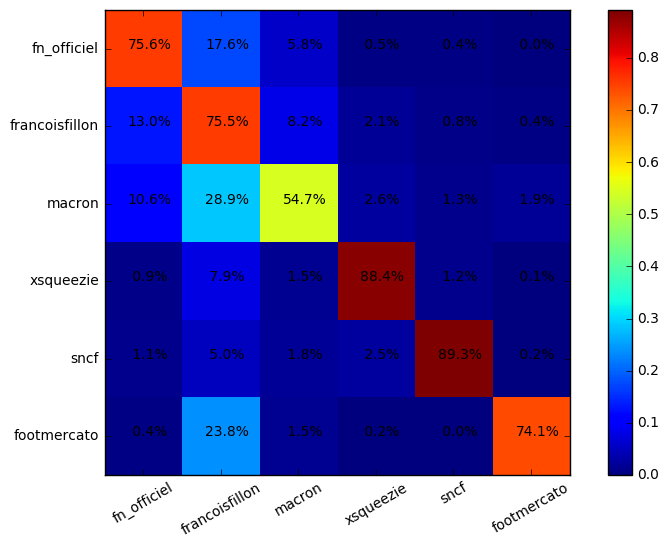

Epoch    3 : 1946.42   Test accuracy: 74.64 79.69 77.82 76.27 77.84 77.89 77.14 
Epoch    3 : 1927.59   Test accuracy: 74.68 79.78 77.84 76.25 77.75 77.78 77.18 
Epoch    3 : 1909.14   Test accuracy: 74.66 79.73 77.82 76.18 77.73 77.80 77.23 
Epoch    3 : 1891.06   Test accuracy: 74.59 79.75 77.73 76.14 77.57 77.82 77.18 
Epoch    3 : 1873.33   Test accuracy: 74.57 79.62 77.68 76.11 77.57 77.82 77.14 
Epoch    3 : 1855.94   Test accuracy: 74.50 79.69 77.75 76.16 77.57 77.87 77.07 
Epoch    3 : 1838.87   Test accuracy: 74.61 79.73 77.82 76.16 77.57 77.84 77.07 
Epoch    3 : 1822.10   Test accuracy: 74.66 79.66 77.82 76.16 77.57 77.84 77.14 
Epoch    3 : 1805.62   Test accuracy: 74.59 79.62 77.87 76.07 77.53 77.84 77.16 
Epoch    3 : 1789.41   Test accuracy: 74.61 79.66 77.78 76.05 77.55 77.78 77.12 
-------------------------------------------------
| 76.2% | 17.7% |  4.9% |  0.6% |  0.4% |  0.1% |   Total: 772
-------------------------------------------------
| 12.6% | 75.0% |  9.4% |  

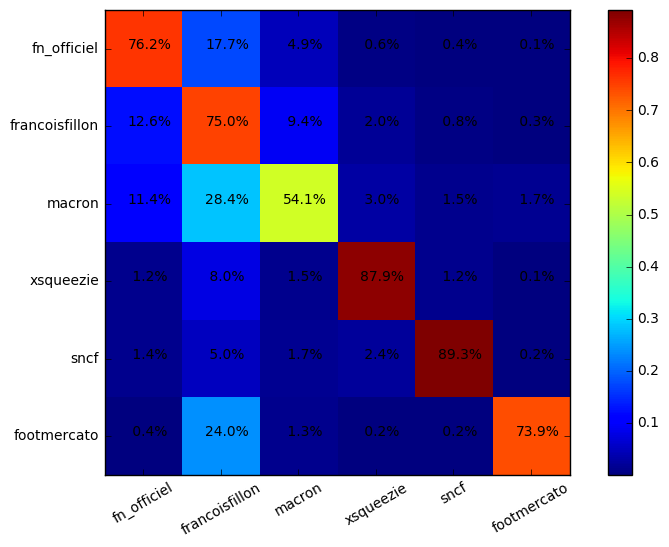

##################### 3 - Essai 4 ###################
Epoch    3 : 4340.19   Test accuracy: 73.91 78.16 76.75 75.27 76.50 76.91 76.11 
Epoch    3 : 3995.77   Test accuracy: 75.00 79.28 77.75 76.23 77.62 77.78 77.27 
Epoch    3 : 3825.04   Test accuracy: 75.80 79.73 78.73 77.18 78.73 78.73 78.05 
Epoch    3 : 3699.10   Test accuracy: 76.34 79.89 79.23 77.48 78.80 79.32 78.32 
Epoch    3 : 3592.44   Test accuracy: 76.48 79.94 79.44 77.89 79.19 79.57 78.64 
Epoch    3 : 3499.39   Test accuracy: 76.68 80.14 79.46 77.89 79.39 79.80 78.71 
Epoch    3 : 3418.67   Test accuracy: 76.73 80.37 79.46 77.66 79.25 79.69 78.59 
Epoch    3 : 3348.17   Test accuracy: 76.73 80.37 79.57 77.68 79.23 79.60 78.82 
Epoch    3 : 3285.22   Test accuracy: 76.80 80.39 79.44 77.62 79.37 79.57 78.69 
Epoch    3 : 3227.61   Test accuracy: 76.93 80.57 79.41 77.68 79.25 79.60 78.57 
-------------------------------------------------
| 76.0% | 17.6% |  5.2% |  0.5% |  0.3% |  0.4% |   Total: 772
-----------------------

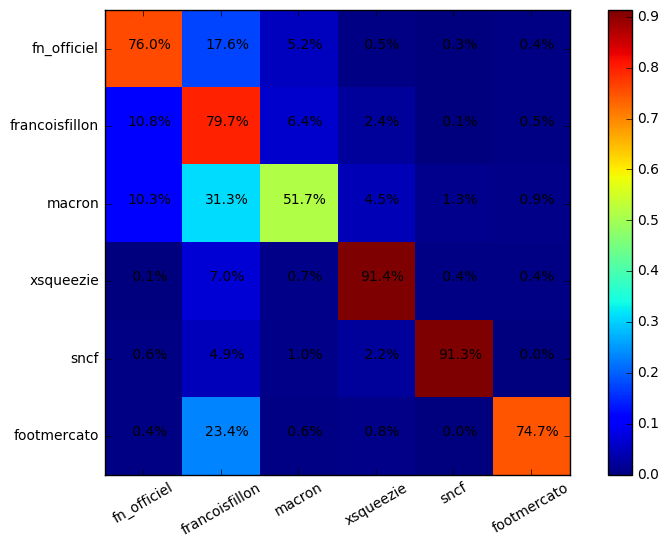

Epoch    3 : 3173.87   Test accuracy: 76.80 80.53 79.41 77.66 79.19 79.60 78.50 
Epoch    3 : 3123.14   Test accuracy: 76.66 80.69 79.44 77.64 79.25 79.53 78.50 
Epoch    3 : 3074.93   Test accuracy: 76.43 80.69 79.32 77.55 79.16 79.44 78.48 
Epoch    3 : 3028.91   Test accuracy: 76.41 80.60 79.12 77.43 79.07 79.25 78.66 
Epoch    3 : 2984.87   Test accuracy: 76.32 80.62 79.21 77.59 79.09 79.30 78.66 
Epoch    3 : 2942.69   Test accuracy: 76.34 80.55 79.30 77.71 79.25 79.55 78.57 
Epoch    3 : 2902.25   Test accuracy: 76.52 80.57 79.46 77.87 79.23 79.62 78.62 
Epoch    3 : 2863.41   Test accuracy: 76.52 80.66 79.46 77.80 79.25 79.53 78.55 
Epoch    3 : 2825.99   Test accuracy: 76.32 80.60 79.46 77.93 79.41 79.64 78.53 
Epoch    3 : 2789.85   Test accuracy: 76.36 80.57 79.48 77.93 79.44 79.60 78.57 
-------------------------------------------------
| 74.5% | 18.5% |  5.6% |  0.8% |  0.1% |  0.5% |   Total: 772
-------------------------------------------------
|  9.9% | 79.6% |  7.5% |  

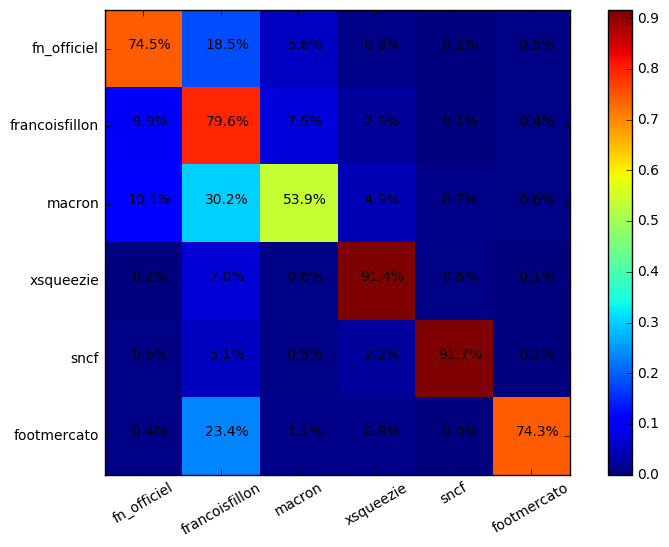

Epoch    3 : 2754.84   Test accuracy: 76.32 80.62 79.46 77.78 79.32 79.46 78.62 
Epoch    3 : 2720.89   Test accuracy: 76.34 80.69 79.34 77.68 79.28 79.32 78.46 
Epoch    3 : 2687.90   Test accuracy: 76.34 80.69 79.34 77.68 79.32 79.41 78.46 
Epoch    3 : 2655.81   Test accuracy: 76.32 80.55 79.19 77.66 79.14 79.32 78.48 
Epoch    3 : 2624.56   Test accuracy: 76.27 80.53 79.25 77.50 79.19 79.30 78.71 
Epoch    3 : 2594.08   Test accuracy: 76.14 80.44 79.19 77.53 79.14 79.28 78.66 
Epoch    3 : 2564.33   Test accuracy: 76.18 80.44 78.98 77.55 79.07 79.23 78.59 
Epoch    3 : 2535.23   Test accuracy: 76.23 80.37 79.14 77.48 79.03 79.25 78.53 
Epoch    3 : 2506.75   Test accuracy: 76.25 80.35 79.19 77.55 78.98 79.23 78.59 
Epoch    3 : 2478.82   Test accuracy: 76.16 80.21 79.25 77.57 79.05 79.23 78.55 
-------------------------------------------------
| 74.4% | 19.0% |  4.9% |  1.2% |  0.1% |  0.4% |   Total: 772
-------------------------------------------------
|  9.2% | 80.0% |  8.1% |  

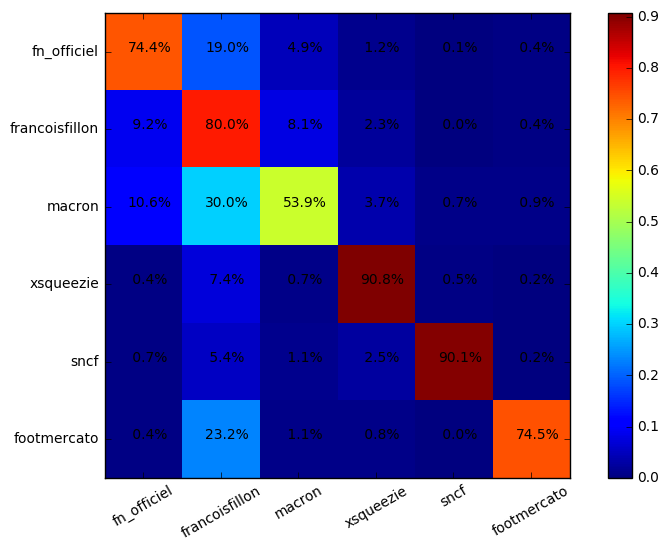

Epoch    3 : 2451.38   Test accuracy: 76.14 80.12 79.19 77.43 79.03 79.30 78.55 
Epoch    3 : 2424.41   Test accuracy: 75.96 80.12 79.19 77.43 79.07 79.25 78.50 
Epoch    3 : 2397.86   Test accuracy: 75.86 80.07 79.07 77.32 79.00 79.16 78.48 
Epoch    3 : 2371.73   Test accuracy: 75.68 80.16 79.14 77.32 78.89 79.19 78.37 
Epoch    3 : 2345.98   Test accuracy: 75.66 80.19 79.09 77.39 78.89 79.19 78.39 
Epoch    3 : 2320.60   Test accuracy: 75.73 80.21 79.07 77.30 78.96 79.14 78.46 
Epoch    3 : 2295.60   Test accuracy: 75.82 80.12 79.05 77.30 79.00 79.09 78.46 
Epoch    3 : 2270.97   Test accuracy: 75.77 80.10 79.03 77.18 78.84 79.05 78.34 
Epoch    3 : 2246.76   Test accuracy: 75.86 80.03 78.91 77.09 78.80 79.05 78.28 
Epoch    3 : 2222.96   Test accuracy: 75.89 79.94 78.82 76.96 78.62 78.98 78.23 
-------------------------------------------------
| 74.4% | 18.5% |  5.4% |  1.3% |  0.0% |  0.4% |   Total: 772
-------------------------------------------------
|  9.0% | 78.7% |  9.1% |  

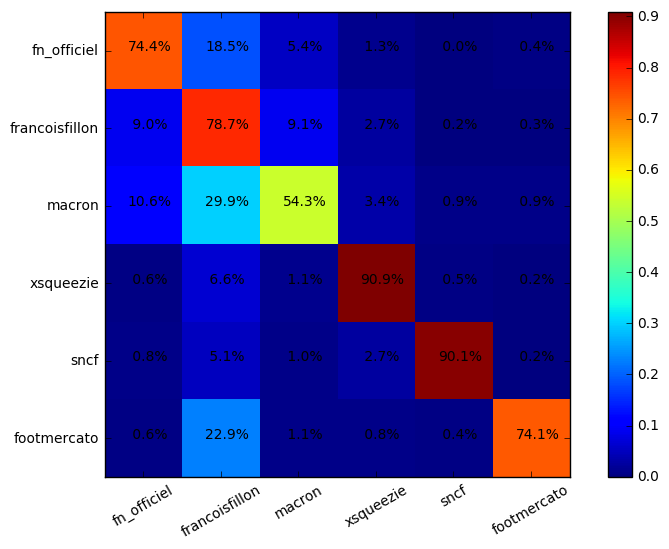

Epoch    3 : 2199.58   Test accuracy: 75.84 79.87 78.78 76.82 78.53 79.00 78.12 
Epoch    3 : 2176.63   Test accuracy: 75.80 79.89 78.71 76.80 78.43 78.89 77.96 
Epoch    3 : 2154.09   Test accuracy: 75.66 79.80 78.64 76.80 78.34 78.89 77.87 
Epoch    3 : 2131.96   Test accuracy: 75.61 79.73 78.48 76.80 78.37 78.75 77.87 
Epoch    3 : 2110.24   Test accuracy: 75.64 79.75 78.46 76.68 78.23 78.66 77.87 
Epoch    3 : 2088.93   Test accuracy: 75.57 79.73 78.48 76.82 78.30 78.59 77.91 
Epoch    3 : 2068.02   Test accuracy: 75.50 79.55 78.43 76.89 78.28 78.53 77.78 
Epoch    3 : 2047.49   Test accuracy: 75.36 79.50 78.43 76.84 78.28 78.59 77.82 
Epoch    3 : 2027.33   Test accuracy: 75.43 79.30 78.39 76.68 78.21 78.50 77.59 
Epoch    3 : 2007.50   Test accuracy: 75.41 79.32 78.39 76.66 78.21 78.69 77.55 
-------------------------------------------------
| 71.9% | 21.1% |  4.9% |  1.4% |  0.3% |  0.4% |   Total: 772
-------------------------------------------------
|  9.4% | 79.3% |  8.2% |  

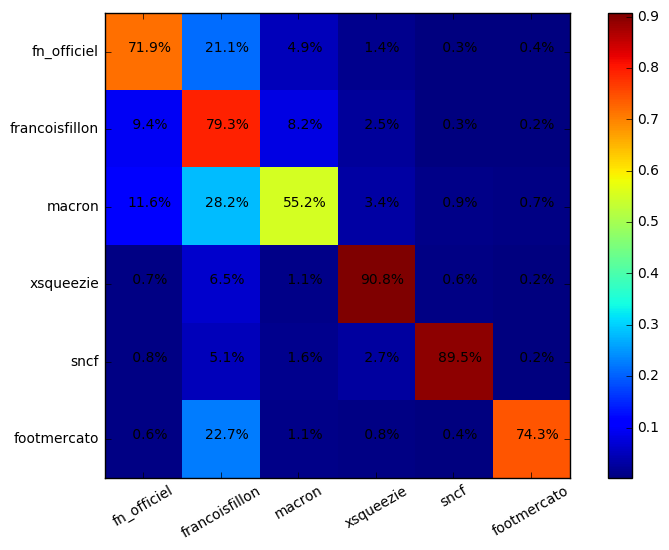

Epoch    3 : 1988.00   Test accuracy: 75.23 79.32 78.30 76.59 78.23 78.71 77.48 
Epoch    3 : 1968.82   Test accuracy: 75.30 79.28 78.25 76.71 78.12 78.64 77.57 
Epoch    3 : 1949.95   Test accuracy: 75.39 79.28 78.28 76.55 78.14 78.50 77.59 
Epoch    3 : 1931.39   Test accuracy: 75.27 79.30 78.23 76.46 78.14 78.43 77.66 
Epoch    3 : 1913.13   Test accuracy: 75.16 79.32 78.21 76.41 78.16 78.25 77.68 
Epoch    3 : 1895.17   Test accuracy: 75.23 79.30 78.07 76.36 78.18 78.16 77.68 
Epoch    3 : 1877.52   Test accuracy: 75.09 79.25 78.00 76.39 78.05 78.07 77.71 
Epoch    3 : 1860.16   Test accuracy: 75.02 79.23 77.98 76.57 78.00 78.14 77.57 
Epoch    3 : 1843.09   Test accuracy: 75.16 79.23 78.03 76.57 78.03 78.16 77.37 
Epoch    3 : 1826.30   Test accuracy: 75.20 79.23 77.89 76.55 78.00 78.14 77.39 
-------------------------------------------------
| 71.4% | 22.2% |  4.7% |  1.2% |  0.3% |  0.4% |   Total: 772
-------------------------------------------------
|  9.4% | 78.5% |  8.3% |  

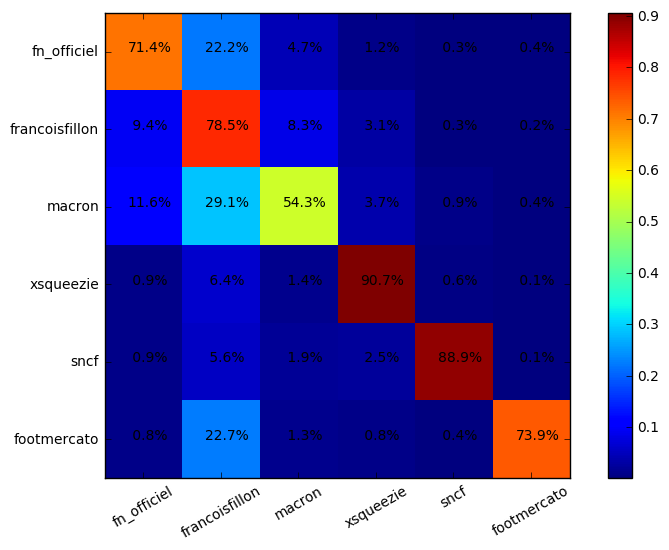

##################### 4 - Essai 0 ###################
Epoch    3 : 4814.52   Test accuracy: 74.27 75.14 76.02 75.14 76.00 75.98 75.50 
Epoch    3 : 4332.43   Test accuracy: 75.30 75.89 76.80 75.96 76.66 76.84 76.18 
Epoch    3 : 4163.41   Test accuracy: 75.66 76.52 77.34 76.30 77.25 77.43 76.59 
Epoch    3 : 4056.25   Test accuracy: 76.09 76.84 77.64 76.62 77.57 77.78 76.98 
Epoch    3 : 3974.96   Test accuracy: 76.34 77.27 77.89 76.87 77.84 78.03 77.39 
Epoch    3 : 3909.04   Test accuracy: 76.66 77.30 78.03 77.32 77.98 78.12 77.50 
Epoch    3 : 3853.66   Test accuracy: 73.66 77.39 76.50 74.98 76.52 76.73 75.96 
Epoch    3 : 3806.04   Test accuracy: 73.91 77.43 76.62 74.86 76.50 76.87 76.00 
Epoch    3 : 3764.41   Test accuracy: 73.95 77.41 76.75 74.98 76.71 76.82 76.09 
Epoch    3 : 3727.27   Test accuracy: 73.98 77.43 76.89 75.16 76.68 76.93 76.18 
-------------------------------------------------
| 79.0% | 14.4% |  4.7% |  1.0% |  0.4% |  0.4% |   Total: 895
-----------------------

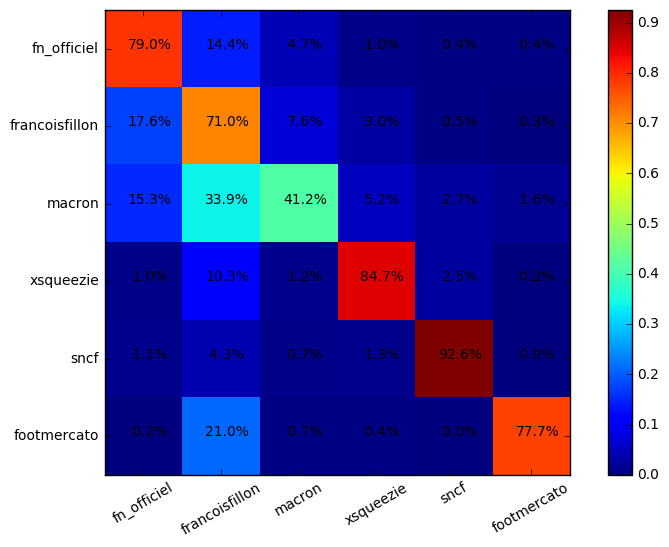

Epoch    3 : 3693.56   Test accuracy: 74.02 77.39 76.91 75.14 76.73 76.96 76.30 
Epoch    3 : 3662.58   Test accuracy: 73.93 77.62 76.73 75.14 76.71 76.91 76.50 
Epoch    3 : 3633.84   Test accuracy: 74.04 77.62 76.82 75.30 76.75 76.96 76.50 
Epoch    3 : 3607.00   Test accuracy: 74.14 77.48 76.89 75.34 76.82 76.96 76.36 
Epoch    3 : 3581.77   Test accuracy: 74.04 77.71 76.93 75.34 76.89 76.93 76.32 
Epoch    3 : 3557.92   Test accuracy: 74.02 77.59 77.00 75.23 76.82 76.91 76.21 
Epoch    3 : 3535.28   Test accuracy: 73.95 77.55 76.80 75.25 76.82 76.84 76.11 
Epoch    3 : 3513.72   Test accuracy: 73.98 77.59 76.82 75.27 76.71 76.84 76.21 
Epoch    3 : 3493.11   Test accuracy: 74.14 77.73 76.84 75.20 76.80 76.98 76.18 
Epoch    3 : 3473.38   Test accuracy: 74.02 77.84 76.77 75.05 76.57 77.05 76.07 
-------------------------------------------------
| 78.0% | 15.8% |  4.5% |  0.9% |  0.4% |  0.4% |   Total: 895
-------------------------------------------------
| 17.3% | 70.6% |  8.7% |  

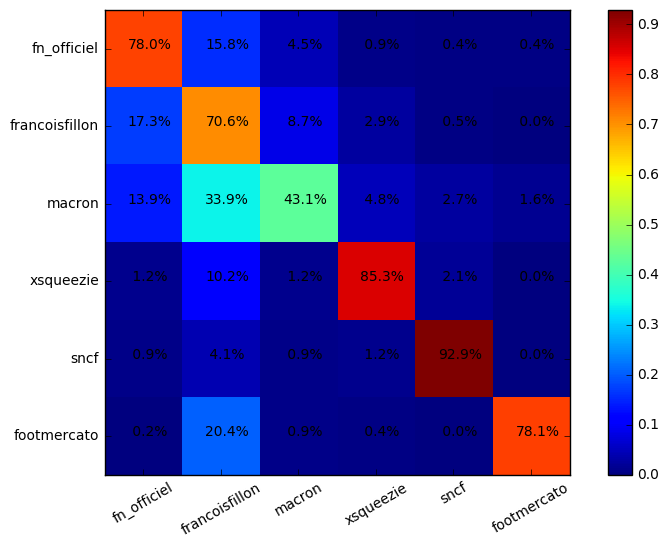

Epoch    3 : 3454.45   Test accuracy: 74.00 77.87 76.80 75.11 76.55 77.09 76.09 
Epoch    3 : 3436.27   Test accuracy: 74.02 77.82 76.82 75.30 76.55 77.18 76.14 
Epoch    3 : 3418.78   Test accuracy: 74.11 77.84 76.96 75.39 76.68 77.27 76.21 
Epoch    3 : 3401.95   Test accuracy: 74.20 77.87 76.98 75.32 76.82 77.43 76.23 
Epoch    3 : 3385.74   Test accuracy: 74.29 77.98 77.00 75.41 76.80 77.46 76.18 
Epoch    3 : 3370.12   Test accuracy: 74.41 78.03 77.09 75.52 76.82 77.41 76.23 
Epoch    3 : 3355.05   Test accuracy: 74.41 78.05 77.02 75.50 76.89 77.32 76.27 
Epoch    3 : 3340.49   Test accuracy: 74.29 78.00 77.16 75.55 76.89 77.32 76.27 
Epoch    3 : 3326.40   Test accuracy: 74.16 77.96 77.09 75.64 77.00 77.34 76.36 
Epoch    3 : 3312.77   Test accuracy: 74.16 78.00 77.12 75.77 77.02 77.37 76.39 
-------------------------------------------------
| 77.3% | 17.1% |  3.9% |  0.9% |  0.4% |  0.3% |   Total: 895
-------------------------------------------------
| 16.5% | 71.7% |  8.6% |  

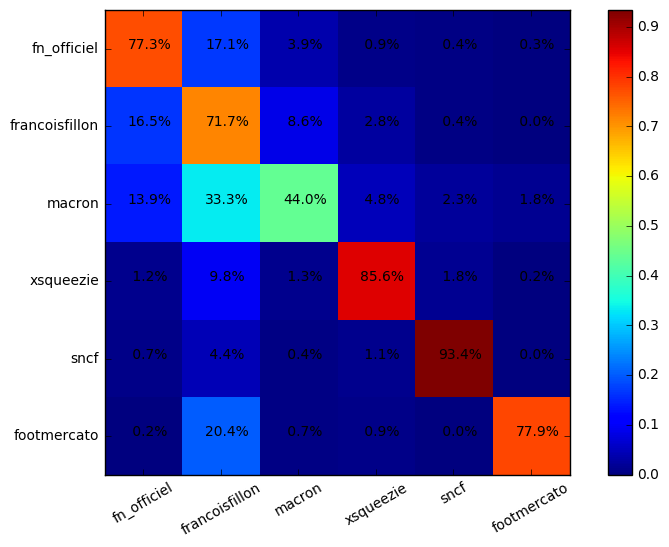

Epoch    3 : 3299.59   Test accuracy: 74.16 78.05 77.18 75.80 77.00 77.39 76.32 
Epoch    3 : 3286.82   Test accuracy: 74.07 78.21 77.32 75.82 77.09 77.46 76.34 
Epoch    3 : 3274.44   Test accuracy: 74.23 78.25 77.25 75.77 77.12 77.30 76.50 
Epoch    3 : 3262.41   Test accuracy: 74.23 78.18 77.21 75.75 77.14 77.43 76.57 
Epoch    3 : 3250.71   Test accuracy: 74.27 78.16 77.18 75.82 77.07 77.53 76.52 
Epoch    3 : 3239.31   Test accuracy: 74.27 78.23 77.14 75.84 77.07 77.43 76.55 
Epoch    3 : 3228.19   Test accuracy: 74.27 78.25 77.27 75.84 77.05 77.55 76.68 
Epoch    3 : 3217.33   Test accuracy: 74.29 78.18 77.34 75.77 77.21 77.59 76.68 
Epoch    3 : 3206.70   Test accuracy: 74.32 78.16 77.30 75.82 77.23 77.50 76.68 
Epoch    3 : 3196.30   Test accuracy: 74.27 78.23 77.34 75.84 77.23 77.57 76.68 
-------------------------------------------------
| 76.8% | 18.0% |  3.5% |  1.0% |  0.2% |  0.6% |   Total: 895
-------------------------------------------------
| 16.0% | 71.7% |  8.6% |  

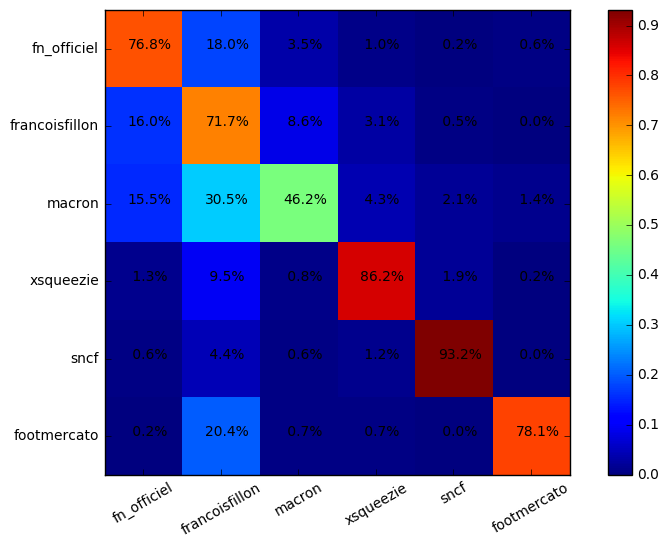

Epoch    3 : 3186.11   Test accuracy: 74.32 78.28 77.37 75.77 77.30 77.55 76.75 
Epoch    3 : 3176.10   Test accuracy: 74.45 78.25 77.41 75.80 77.37 77.50 76.68 
Epoch    3 : 3166.25   Test accuracy: 74.48 78.25 77.53 75.77 77.37 77.53 76.73 
Epoch    3 : 3156.56   Test accuracy: 74.43 78.25 77.62 75.80 77.46 77.53 76.91 
Epoch    3 : 3147.02   Test accuracy: 74.41 78.39 77.68 75.75 77.50 77.59 76.87 
Epoch    3 : 3137.66   Test accuracy: 74.32 78.46 77.66 75.80 77.43 77.59 76.82 
Epoch    3 : 3128.45   Test accuracy: 74.39 78.46 77.62 75.75 77.43 77.55 76.91 
Epoch    3 : 3119.39   Test accuracy: 74.45 78.53 77.78 75.84 77.43 77.57 76.87 
Epoch    3 : 3110.44   Test accuracy: 74.45 78.62 77.71 75.86 77.43 77.66 76.89 
Epoch    3 : 3101.58   Test accuracy: 74.45 78.57 77.78 75.96 77.53 77.71 76.87 
-------------------------------------------------
| 77.5% | 16.9% |  3.9% |  1.0% |  0.1% |  0.6% |   Total: 895
-------------------------------------------------
| 15.7% | 72.8% |  7.9% |  

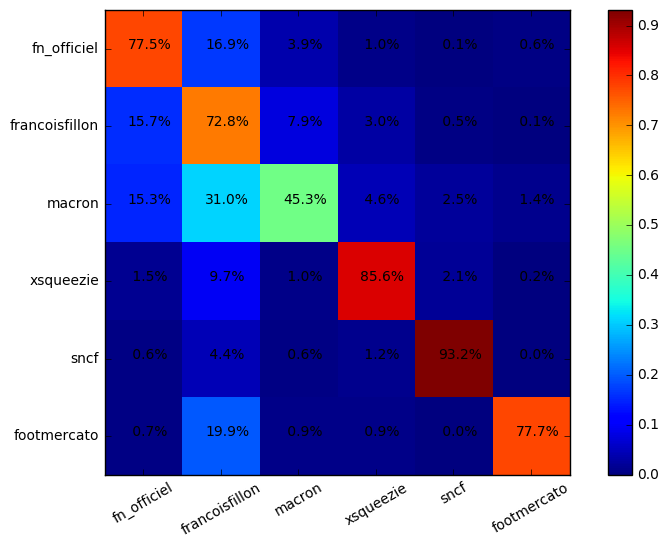

Epoch    3 : 3092.91   Test accuracy: 74.52 78.57 77.84 75.93 77.62 77.80 76.91 
Epoch    3 : 3084.46   Test accuracy: 74.48 78.62 77.89 75.82 77.59 77.75 76.87 
Epoch    3 : 3076.17   Test accuracy: 74.52 78.59 77.75 75.77 77.55 77.64 76.89 
Epoch    3 : 3068.03   Test accuracy: 74.61 78.62 77.68 75.89 77.50 77.71 76.89 
Epoch    3 : 3060.04   Test accuracy: 74.66 78.62 77.62 75.86 77.43 77.73 76.87 
Epoch    3 : 3052.19   Test accuracy: 74.68 78.57 77.66 75.84 77.46 77.71 76.93 
Epoch    3 : 3044.47   Test accuracy: 74.75 78.50 77.68 75.86 77.57 77.64 76.96 
Epoch    3 : 3036.88   Test accuracy: 74.66 78.50 77.62 75.86 77.53 77.64 76.96 
Epoch    3 : 3029.43   Test accuracy: 74.59 78.48 77.57 75.89 77.50 77.64 76.96 
Epoch    3 : 3022.11   Test accuracy: 74.57 78.57 77.57 75.91 77.48 77.64 76.93 
-------------------------------------------------
| 77.8% | 17.0% |  3.5% |  1.1% |  0.1% |  0.6% |   Total: 895
-------------------------------------------------
| 15.4% | 72.8% |  8.0% |  

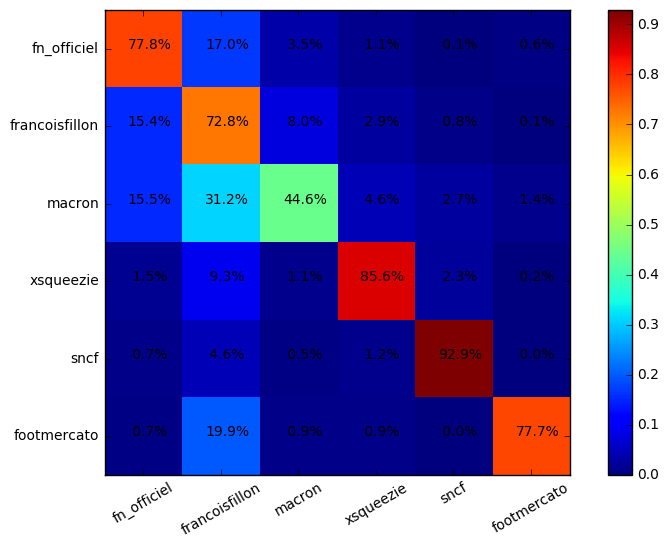

##################### 4 - Essai 1 ###################
Epoch    3 : 4754.29   Test accuracy: 71.63 74.86 74.43 72.93 74.29 74.48 73.93 
Epoch    3 : 4350.11   Test accuracy: 72.54 75.93 75.39 73.75 75.20 75.55 75.07 
Epoch    3 : 4187.16   Test accuracy: 73.43 76.62 75.96 74.32 75.96 76.18 75.39 
Epoch    3 : 4079.15   Test accuracy: 76.39 77.18 78.14 77.18 78.16 78.34 77.68 
Epoch    3 : 3999.15   Test accuracy: 76.62 77.34 78.28 77.30 78.28 78.43 77.91 
Epoch    3 : 3936.11   Test accuracy: 73.50 77.43 76.62 74.86 76.41 76.77 76.14 
Epoch    3 : 3884.10   Test accuracy: 73.48 77.62 76.46 74.82 76.39 76.68 76.09 
Epoch    3 : 3839.57   Test accuracy: 73.57 77.53 76.50 74.77 76.36 76.73 76.02 
Epoch    3 : 3800.32   Test accuracy: 73.61 77.59 76.57 74.95 76.52 76.75 76.11 
Epoch    3 : 3764.92   Test accuracy: 73.64 77.53 76.57 74.89 76.68 76.77 76.16 
-------------------------------------------------
| 77.5% | 16.2% |  4.4% |  0.9% |  0.7% |  0.3% |   Total: 895
-----------------------

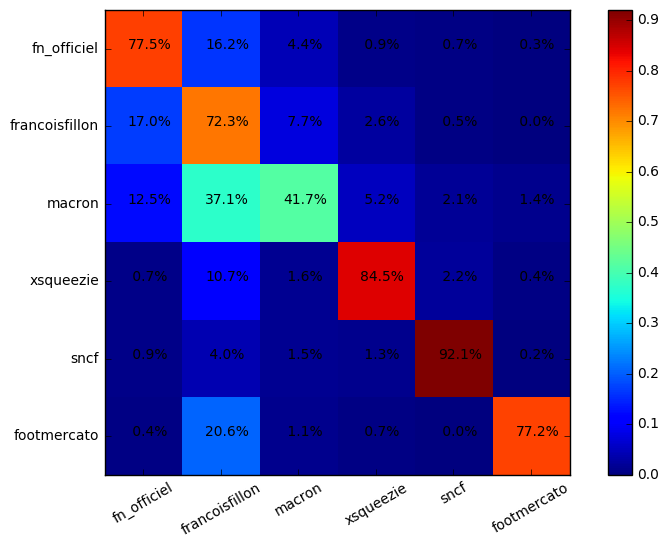

Epoch    3 : 3732.46   Test accuracy: 73.66 77.53 76.75 74.95 76.66 76.96 76.18 
Epoch    3 : 3702.35   Test accuracy: 73.79 77.62 76.89 75.20 76.75 77.14 76.32 
Epoch    3 : 3674.16   Test accuracy: 73.68 77.53 76.93 75.34 76.87 77.12 76.25 
Epoch    3 : 3647.57   Test accuracy: 73.70 77.57 77.09 75.43 77.00 77.34 76.64 
Epoch    3 : 3622.38   Test accuracy: 73.77 77.66 77.23 75.61 77.05 77.46 76.57 
Epoch    3 : 3598.42   Test accuracy: 73.70 77.66 77.21 75.59 77.00 77.50 76.57 
Epoch    3 : 3575.55   Test accuracy: 73.82 77.71 77.21 75.59 77.02 77.41 76.59 
Epoch    3 : 3553.65   Test accuracy: 73.66 77.91 77.18 75.55 77.23 77.39 76.52 
Epoch    3 : 3532.65   Test accuracy: 73.59 77.80 77.25 75.59 77.18 77.48 76.62 
Epoch    3 : 3512.46   Test accuracy: 73.64 77.71 77.32 75.50 77.18 77.46 76.50 
-------------------------------------------------
| 78.3% | 16.1% |  4.4% |  0.6% |  0.4% |  0.2% |   Total: 895
-------------------------------------------------
| 15.8% | 73.4% |  8.2% |  

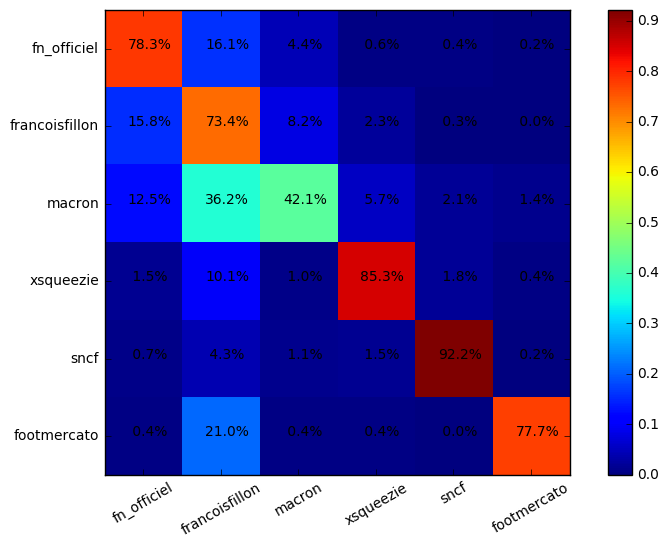

Epoch    3 : 3492.99   Test accuracy: 73.82 77.78 77.41 75.61 77.18 77.66 76.41 
Epoch    3 : 3474.19   Test accuracy: 73.98 77.80 77.43 75.61 77.07 77.59 76.52 
Epoch    3 : 3456.02   Test accuracy: 73.93 77.80 77.30 75.61 77.00 77.48 76.52 
Epoch    3 : 3438.46   Test accuracy: 73.89 77.87 77.18 75.50 77.00 77.46 76.48 
Epoch    3 : 3421.48   Test accuracy: 73.86 77.89 77.14 75.57 77.00 77.30 76.50 
Epoch    3 : 3405.06   Test accuracy: 73.89 77.84 77.16 75.34 77.00 77.14 76.62 
Epoch    3 : 3389.19   Test accuracy: 73.86 77.80 77.05 75.41 76.84 77.09 76.50 
Epoch    3 : 3373.85   Test accuracy: 73.79 77.75 77.02 75.45 76.89 77.21 76.39 
Epoch    3 : 3359.01   Test accuracy: 73.86 77.75 77.09 75.34 76.98 77.23 76.52 
Epoch    3 : 3344.68   Test accuracy: 73.86 77.75 76.98 75.36 76.87 77.16 76.50 
-------------------------------------------------
| 78.5% | 15.5% |  4.8% |  0.7% |  0.2% |  0.2% |   Total: 895
-------------------------------------------------
| 16.8% | 71.9% |  8.4% |  

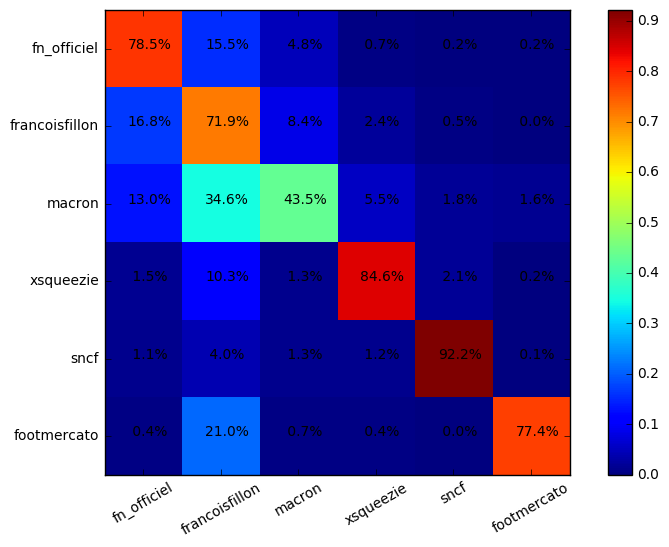

Epoch    3 : 3330.82   Test accuracy: 73.82 77.80 76.91 75.27 76.77 77.21 76.43 
Epoch    3 : 3317.44   Test accuracy: 73.98 77.78 76.93 75.20 76.73 77.27 76.43 
Epoch    3 : 3304.49   Test accuracy: 73.89 77.82 76.77 75.18 76.62 77.23 76.30 
Epoch    3 : 3291.94   Test accuracy: 73.89 77.89 76.80 75.23 76.62 77.25 76.41 
Epoch    3 : 3279.76   Test accuracy: 73.75 77.82 76.82 75.27 76.66 77.14 76.43 
Epoch    3 : 3267.94   Test accuracy: 76.77 77.73 78.66 77.78 78.55 79.03 78.25 
Epoch    3 : 3256.46   Test accuracy: 76.71 77.53 78.73 77.73 78.50 78.98 78.18 
Epoch    3 : 3245.30   Test accuracy: 76.93 77.50 78.78 77.68 78.62 78.96 78.05 
Epoch    3 : 3234.45   Test accuracy: 76.98 77.57 78.75 77.75 78.57 79.05 78.12 
Epoch    3 : 3223.88   Test accuracy: 77.02 77.57 78.80 77.87 78.57 79.12 78.12 
-------------------------------------------------
| 77.9% | 15.3% |  4.8% |  0.7% |  0.2% |  1.1% |   Total: 895
-------------------------------------------------
| 16.8% | 71.3% |  8.0% |  

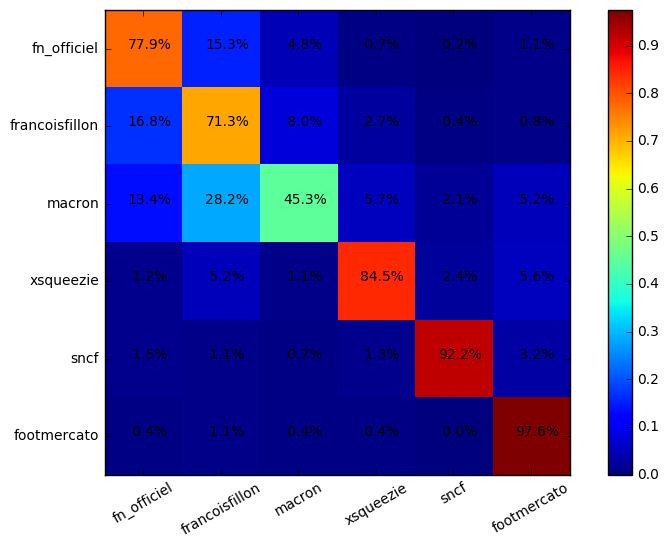

Epoch    3 : 3213.58   Test accuracy: 77.09 77.62 78.80 77.82 78.50 79.14 78.12 
Epoch    3 : 3203.53   Test accuracy: 77.02 77.71 78.78 77.89 78.53 79.14 78.07 
Epoch    3 : 3193.71   Test accuracy: 77.07 77.66 78.84 77.96 78.57 79.16 78.18 
Epoch    3 : 3184.12   Test accuracy: 77.09 77.73 78.89 78.03 78.66 79.21 78.28 
Epoch    3 : 3174.73   Test accuracy: 77.14 77.78 78.98 78.07 78.73 79.21 78.28 
Epoch    3 : 3165.53   Test accuracy: 77.23 77.75 78.96 78.09 78.80 79.32 78.12 
Epoch    3 : 3156.51   Test accuracy: 77.25 77.73 78.96 78.05 78.84 79.30 78.14 
Epoch    3 : 3147.64   Test accuracy: 77.27 77.78 78.94 78.05 78.75 79.28 78.25 
Epoch    3 : 3138.89   Test accuracy: 77.25 77.68 78.94 78.09 78.62 79.34 78.21 
Epoch    3 : 3130.29   Test accuracy: 77.39 77.62 78.96 78.05 78.64 79.28 78.18 
-------------------------------------------------
| 77.8% | 15.1% |  5.0% |  0.8% |  0.1% |  1.2% |   Total: 895
-------------------------------------------------
| 16.3% | 71.6% |  8.3% |  

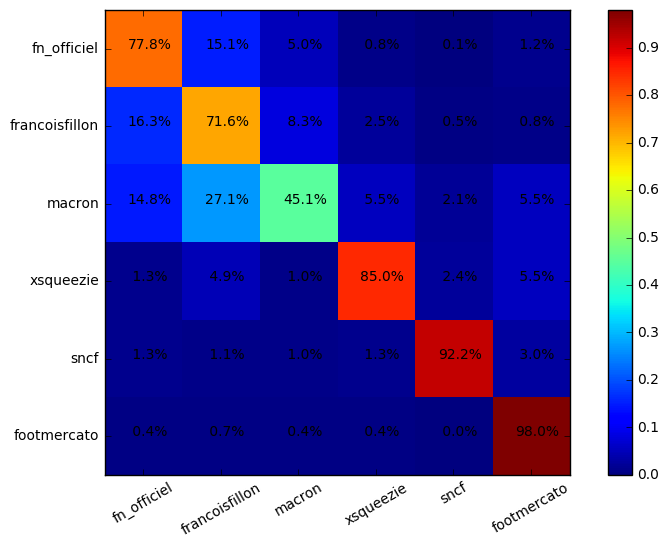

Epoch    3 : 3121.84   Test accuracy: 77.30 77.66 78.91 77.98 78.73 79.21 78.14 
Epoch    3 : 3113.53   Test accuracy: 77.27 77.68 78.91 77.96 78.69 79.16 78.18 
Epoch    3 : 3105.36   Test accuracy: 77.27 77.62 78.84 77.91 78.71 79.07 78.32 
Epoch    3 : 3097.31   Test accuracy: 77.32 77.73 78.89 77.98 78.73 79.07 78.25 
Epoch    3 : 3089.38   Test accuracy: 77.34 77.64 78.82 77.96 78.69 79.14 78.21 
Epoch    3 : 3081.56   Test accuracy: 77.27 77.59 78.75 77.89 78.57 79.05 78.18 
Epoch    3 : 3073.83   Test accuracy: 77.27 77.59 78.80 77.89 78.62 78.98 78.21 
Epoch    3 : 3066.20   Test accuracy: 77.21 77.68 78.82 77.91 78.57 79.00 78.30 
Epoch    3 : 3058.66   Test accuracy: 77.21 77.68 78.78 77.84 78.53 79.03 78.28 
Epoch    3 : 3051.19   Test accuracy: 77.21 77.73 78.80 77.89 78.57 79.05 78.28 
-------------------------------------------------
| 78.1% | 15.2% |  4.6% |  0.9% |  0.1% |  1.1% |   Total: 895
-------------------------------------------------
| 16.4% | 70.7% |  9.1% |  

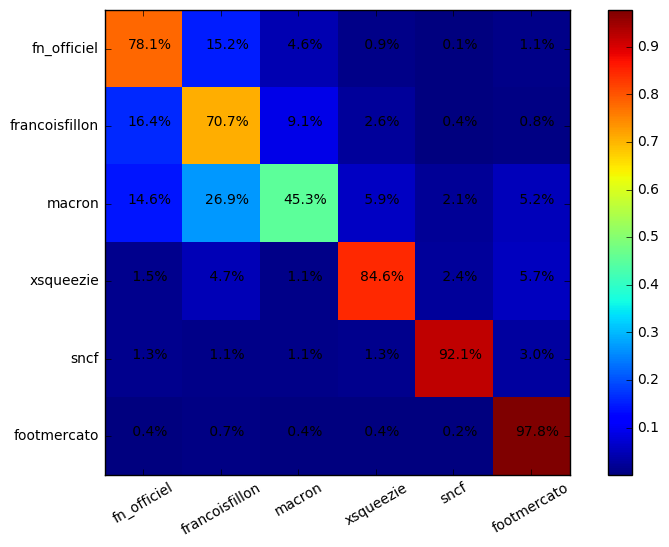

##################### 4 - Essai 2 ###################
Epoch    3 : 4790.14   Test accuracy: 71.95 75.75 74.59 73.04 74.48 74.82 74.07 
Epoch    3 : 4332.22   Test accuracy: 72.52 76.52 75.34 73.84 75.32 75.39 74.86 
Epoch    3 : 4168.72   Test accuracy: 72.91 76.87 75.71 74.07 75.52 75.75 75.25 
Epoch    3 : 4066.40   Test accuracy: 73.02 77.07 75.93 74.27 75.89 75.98 75.59 
Epoch    3 : 3988.80   Test accuracy: 72.95 77.37 76.23 74.68 76.09 76.21 75.91 
Epoch    3 : 3925.15   Test accuracy: 73.45 77.62 76.59 75.07 76.48 76.50 76.09 
Epoch    3 : 3870.71   Test accuracy: 73.36 77.57 76.80 75.23 76.71 76.77 76.32 
Epoch    3 : 3823.03   Test accuracy: 73.66 77.68 76.91 75.36 76.91 76.96 76.23 
Epoch    3 : 3780.51   Test accuracy: 73.79 77.84 77.21 75.57 77.05 77.09 76.43 
Epoch    3 : 3741.76   Test accuracy: 73.98 77.84 77.27 75.68 77.12 77.37 76.59 
-------------------------------------------------
| 79.8% | 14.6% |  4.0% |  0.9% |  0.3% |  0.3% |   Total: 895
-----------------------

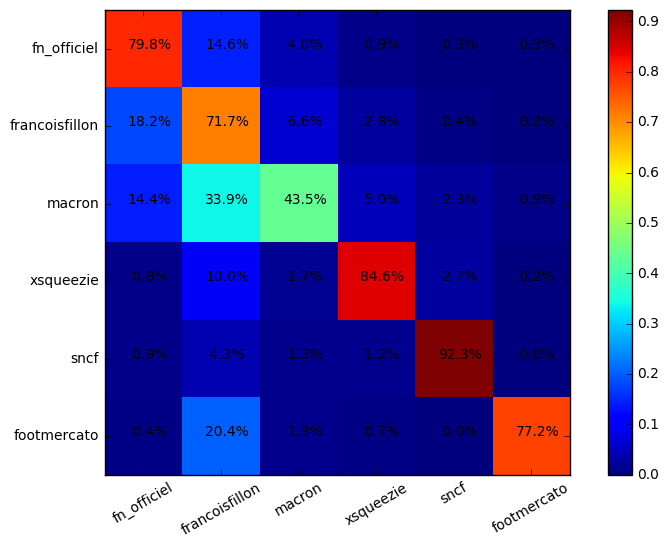

Epoch    3 : 3706.74   Test accuracy: 74.20 77.93 77.55 75.84 77.34 77.59 76.64 
Epoch    3 : 3674.48   Test accuracy: 74.20 77.96 77.66 75.91 77.39 77.66 76.77 
Epoch    3 : 3644.51   Test accuracy: 74.34 78.03 77.73 75.91 77.46 77.66 76.98 
Epoch    3 : 3616.51   Test accuracy: 74.39 78.16 77.75 76.05 77.62 77.91 76.98 
Epoch    3 : 3590.24   Test accuracy: 74.50 78.21 77.84 76.21 77.62 78.00 77.05 
Epoch    3 : 3565.52   Test accuracy: 74.66 78.28 77.96 76.11 77.68 78.05 77.14 
Epoch    3 : 3542.15   Test accuracy: 74.75 78.14 78.00 76.21 77.71 78.07 77.14 
Epoch    3 : 3519.97   Test accuracy: 74.86 78.09 78.05 76.23 77.71 78.21 77.16 
Epoch    3 : 3498.85   Test accuracy: 74.89 78.03 78.12 76.43 77.80 78.16 77.09 
Epoch    3 : 3478.67   Test accuracy: 74.95 78.03 78.09 76.39 77.82 78.25 77.05 
-------------------------------------------------
| 81.2% | 14.0% |  3.5% |  0.9% |  0.3% |  0.1% |   Total: 895
-------------------------------------------------
| 17.3% | 73.8% |  5.7% |  

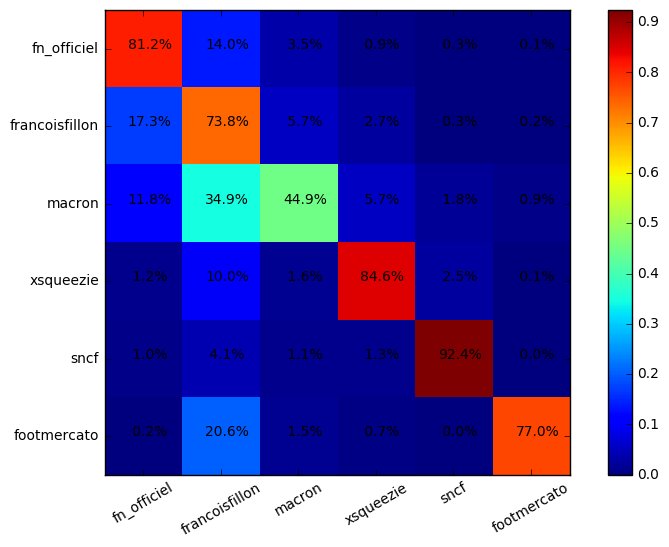

Epoch    3 : 3459.37   Test accuracy: 74.80 78.09 78.14 76.30 77.89 78.18 77.07 
Epoch    3 : 3440.91   Test accuracy: 74.91 78.12 78.03 76.30 77.89 78.23 77.09 
Epoch    3 : 3423.22   Test accuracy: 74.86 78.14 77.98 76.32 77.91 78.18 77.02 
Epoch    3 : 3406.24   Test accuracy: 74.93 78.18 77.87 76.21 77.66 77.98 77.23 
Epoch    3 : 3389.90   Test accuracy: 74.89 78.30 77.68 76.16 77.66 77.89 77.25 
Epoch    3 : 3374.13   Test accuracy: 74.89 78.32 77.75 76.23 77.59 77.89 77.30 
Epoch    3 : 3358.90   Test accuracy: 75.00 78.37 77.82 76.25 77.66 77.91 77.39 
Epoch    3 : 3344.14   Test accuracy: 75.00 78.39 77.96 76.25 77.66 78.00 77.30 
Epoch    3 : 3329.82   Test accuracy: 74.93 78.46 77.98 76.21 77.59 78.09 77.18 
Epoch    3 : 3315.87   Test accuracy: 74.93 78.37 77.93 76.23 77.64 78.16 77.21 
-------------------------------------------------
| 80.3% | 15.3% |  3.0% |  0.8% |  0.3% |  0.2% |   Total: 895
-------------------------------------------------
| 16.9% | 72.9% |  7.0% |  

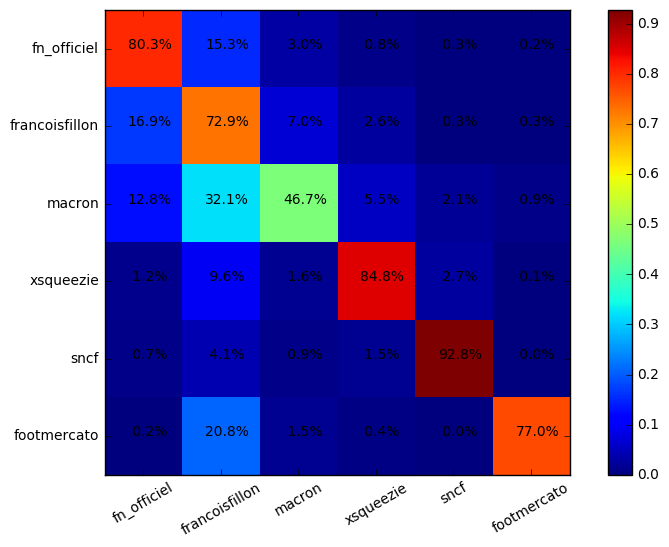

Epoch    3 : 3302.26   Test accuracy: 74.91 78.41 77.93 76.21 77.73 78.18 77.23 
Epoch    3 : 3288.93   Test accuracy: 75.00 78.41 77.96 76.32 77.73 78.09 77.30 
Epoch    3 : 3275.96   Test accuracy: 74.93 78.48 78.00 76.25 77.80 78.12 77.27 
Epoch    3 : 3263.29   Test accuracy: 74.91 78.59 77.98 76.39 77.78 78.12 77.12 
Epoch    3 : 3250.93   Test accuracy: 74.82 78.57 78.03 76.36 77.68 78.16 77.12 
Epoch    3 : 3238.88   Test accuracy: 74.84 78.55 78.07 76.32 77.73 78.16 77.18 
Epoch    3 : 3227.10   Test accuracy: 74.91 78.50 78.05 76.14 77.73 78.12 77.09 
Epoch    3 : 3215.56   Test accuracy: 75.00 78.55 78.09 76.21 77.75 78.12 77.12 
Epoch    3 : 3204.24   Test accuracy: 74.95 78.48 78.12 76.21 77.87 78.09 77.21 
Epoch    3 : 3193.13   Test accuracy: 75.00 78.43 78.07 76.16 77.73 78.03 77.16 
-------------------------------------------------
| 79.6% | 15.8% |  3.4% |  0.6% |  0.3% |  0.4% |   Total: 895
-------------------------------------------------
| 16.7% | 73.1% |  7.0% |  

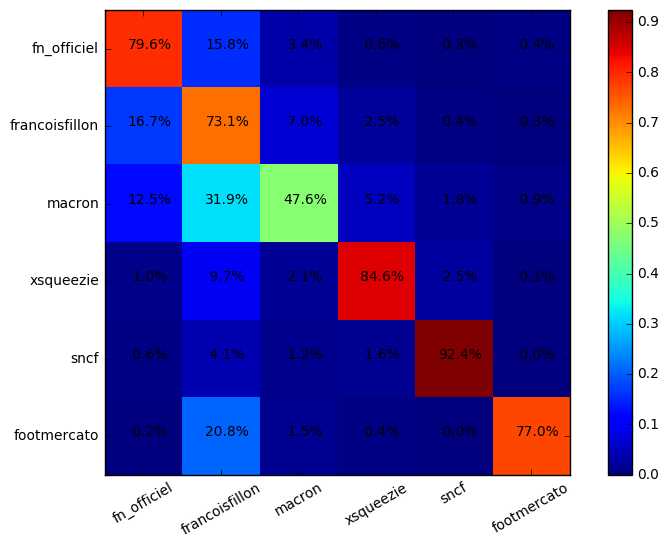

Epoch    3 : 3182.22   Test accuracy: 75.02 78.46 78.03 76.27 77.75 78.03 77.12 
Epoch    3 : 3171.50   Test accuracy: 75.05 78.57 77.98 76.36 77.80 78.00 77.14 
Epoch    3 : 3160.98   Test accuracy: 74.98 78.59 78.03 76.39 77.75 78.00 77.12 
Epoch    3 : 3150.65   Test accuracy: 74.93 78.59 77.96 76.36 77.71 78.09 77.09 
Epoch    3 : 3140.53   Test accuracy: 75.02 78.66 78.03 76.27 77.78 78.21 77.05 
Epoch    3 : 3130.62   Test accuracy: 74.95 78.62 78.05 76.43 77.84 78.28 76.96 
Epoch    3 : 3120.90   Test accuracy: 75.02 78.71 78.16 76.41 77.96 78.25 76.98 
Epoch    3 : 3111.40   Test accuracy: 75.11 78.73 78.16 76.52 77.96 78.21 77.05 
Epoch    3 : 3102.10   Test accuracy: 75.16 78.66 78.14 76.57 77.93 78.18 77.14 
Epoch    3 : 3092.99   Test accuracy: 75.23 78.71 78.05 76.52 77.84 78.18 77.18 
-------------------------------------------------
| 79.1% | 15.6% |  4.0% |  0.6% |  0.3% |  0.3% |   Total: 895
-------------------------------------------------
| 16.7% | 72.9% |  6.9% |  

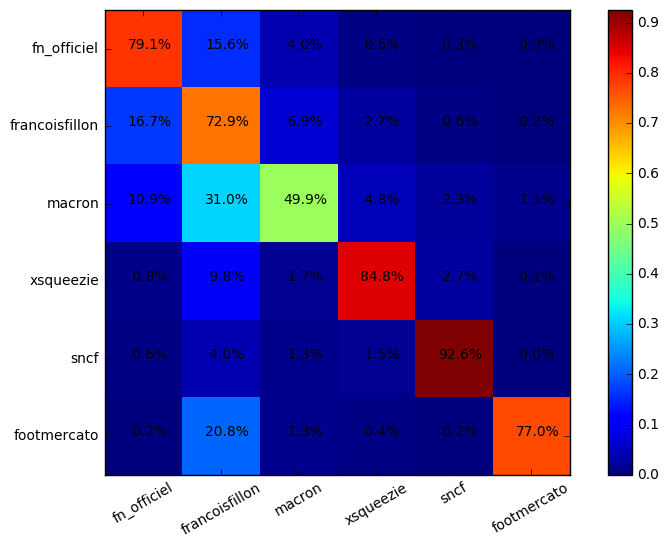

Epoch    3 : 3084.08   Test accuracy: 75.16 78.75 78.03 76.52 77.84 78.09 77.23 
Epoch    3 : 3075.35   Test accuracy: 75.16 78.71 78.00 76.41 77.87 78.07 77.32 
Epoch    3 : 3066.81   Test accuracy: 75.14 78.71 77.96 76.41 77.89 78.12 77.30 
Epoch    3 : 3058.45   Test accuracy: 75.16 78.75 77.93 76.43 77.84 78.09 77.23 
Epoch    3 : 3050.26   Test accuracy: 75.02 78.75 77.93 76.43 77.89 78.14 77.12 
Epoch    3 : 3042.25   Test accuracy: 75.07 78.73 77.87 76.36 77.84 78.09 77.23 
Epoch    3 : 3034.42   Test accuracy: 75.07 78.69 77.80 76.32 77.75 78.05 77.23 
Epoch    3 : 3026.75   Test accuracy: 75.11 78.75 77.84 76.30 77.80 78.03 77.27 
Epoch    3 : 3019.24   Test accuracy: 75.11 78.80 77.84 76.27 77.82 78.05 77.18 
Epoch    3 : 3011.89   Test accuracy: 75.09 78.73 77.87 76.23 77.80 78.00 77.09 
-------------------------------------------------
| 79.2% | 15.3% |  4.2% |  0.6% |  0.3% |  0.3% |   Total: 895
-------------------------------------------------
| 17.1% | 72.3% |  7.2% |  

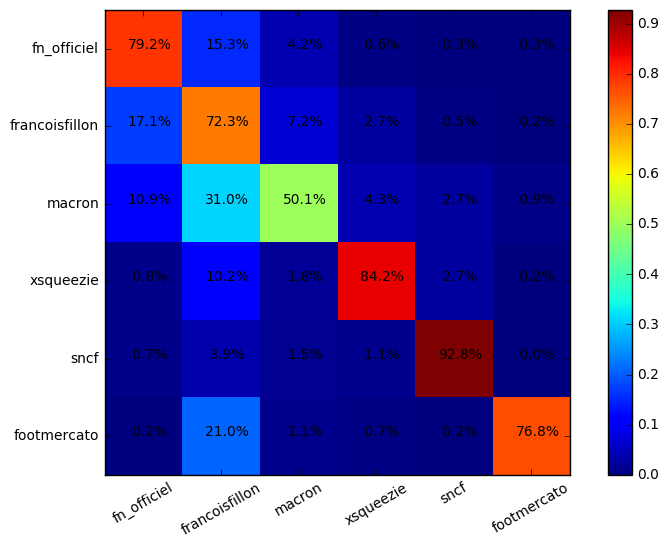

##################### 4 - Essai 3 ###################
Epoch    3 : 4836.58   Test accuracy: 71.91 75.20 74.07 72.54 73.89 74.27 73.45 
Epoch    3 : 4384.62   Test accuracy: 72.50 75.82 74.89 73.68 74.80 75.18 74.29 
Epoch    3 : 4203.22   Test accuracy: 73.25 76.50 75.73 74.34 75.61 75.93 75.07 
Epoch    3 : 4094.33   Test accuracy: 73.45 76.84 76.07 74.77 76.02 76.30 75.66 
Epoch    3 : 4014.40   Test accuracy: 73.79 76.91 76.34 74.86 76.30 76.48 75.91 
Epoch    3 : 3949.70   Test accuracy: 73.57 77.14 76.55 74.86 76.43 76.55 76.02 
Epoch    3 : 3894.28   Test accuracy: 73.77 77.25 76.57 75.11 76.43 76.77 76.14 
Epoch    3 : 3845.10   Test accuracy: 73.73 77.41 76.87 75.18 76.66 76.84 76.16 
Epoch    3 : 3800.81   Test accuracy: 73.73 77.62 76.89 75.39 76.87 76.98 76.14 
Epoch    3 : 3760.78   Test accuracy: 73.93 77.66 76.82 75.39 76.82 76.93 76.23 
-------------------------------------------------
| 77.9% | 16.1% |  4.2% |  1.0% |  0.3% |  0.4% |   Total: 895
-----------------------

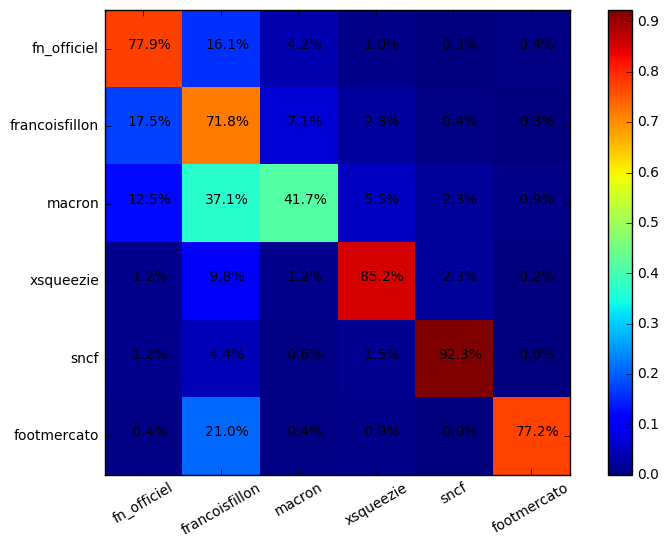

Epoch    3 : 3724.57   Test accuracy: 73.98 77.78 76.98 75.34 76.98 76.93 76.50 
Epoch    3 : 3691.64   Test accuracy: 74.16 77.89 77.12 75.41 77.07 77.05 76.57 
Epoch    3 : 3661.55   Test accuracy: 74.39 78.00 77.07 75.55 76.98 77.21 76.55 
Epoch    3 : 3633.82   Test accuracy: 74.36 78.14 77.18 75.59 77.00 77.39 76.32 
Epoch    3 : 3608.01   Test accuracy: 74.25 78.25 77.30 75.59 77.09 77.39 76.43 
Epoch    3 : 3583.78   Test accuracy: 74.29 78.18 77.16 75.55 77.16 77.48 76.59 
Epoch    3 : 3560.85   Test accuracy: 74.11 78.07 77.16 75.43 77.16 77.34 76.64 
Epoch    3 : 3539.04   Test accuracy: 74.14 78.16 77.23 75.55 77.16 77.39 76.87 
Epoch    3 : 3518.21   Test accuracy: 74.29 78.14 77.18 75.80 77.18 77.46 76.84 
Epoch    3 : 3498.28   Test accuracy: 74.45 78.21 77.34 75.75 77.12 77.62 76.91 
-------------------------------------------------
| 77.4% | 16.1% |  4.2% |  1.3% |  0.3% |  0.6% |   Total: 895
-------------------------------------------------
| 15.9% | 73.3% |  7.9% |  

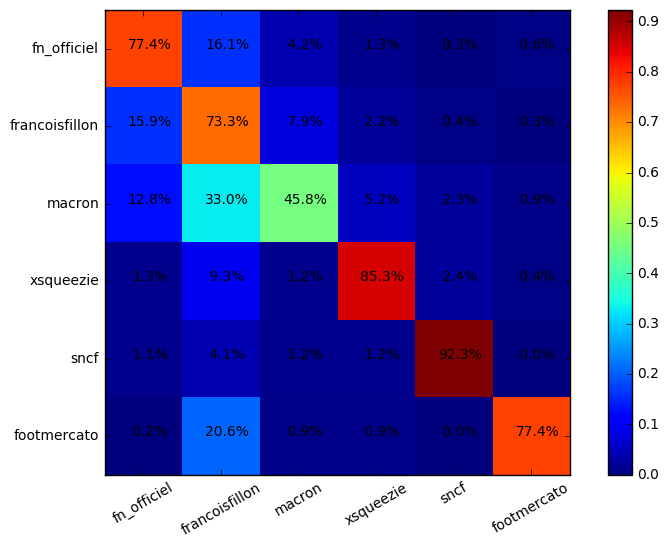

Epoch    3 : 3479.19   Test accuracy: 74.34 78.41 77.50 75.89 77.16 77.64 76.91 
Epoch    3 : 3460.89   Test accuracy: 74.36 78.41 77.68 75.93 77.37 77.62 76.91 
Epoch    3 : 3443.36   Test accuracy: 74.43 78.41 77.66 76.02 77.48 77.80 76.82 
Epoch    3 : 3426.57   Test accuracy: 74.52 78.43 77.62 76.00 77.43 77.75 76.87 
Epoch    3 : 3410.49   Test accuracy: 74.52 78.41 77.68 76.09 77.62 77.71 76.84 
Epoch    3 : 3395.06   Test accuracy: 74.39 78.46 77.55 75.98 77.66 77.64 76.80 
Epoch    3 : 3380.22   Test accuracy: 74.32 78.48 77.53 75.91 77.53 77.71 76.84 
Epoch    3 : 3365.93   Test accuracy: 74.39 78.48 77.43 75.93 77.55 77.59 76.89 
Epoch    3 : 3352.14   Test accuracy: 74.34 78.55 77.55 75.86 77.50 77.57 76.89 
Epoch    3 : 3338.75   Test accuracy: 74.27 78.48 77.53 75.86 77.43 77.68 76.80 
-------------------------------------------------
| 76.6% | 17.4% |  3.9% |  1.0% |  0.4% |  0.6% |   Total: 895
-------------------------------------------------
| 14.9% | 74.2% |  7.7% |  

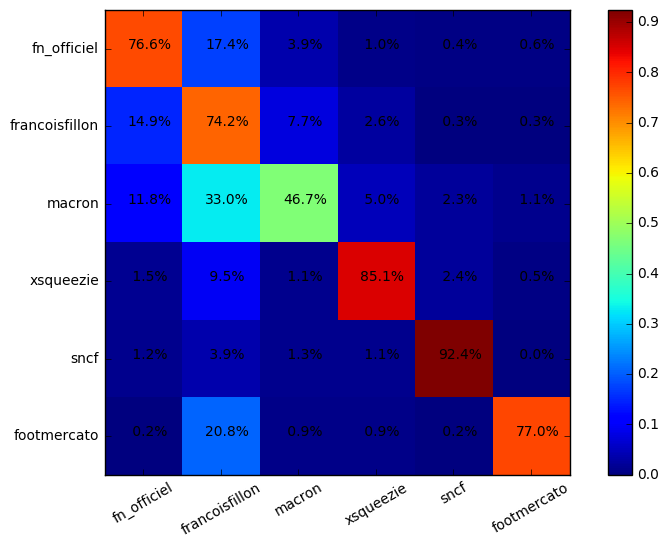

Epoch    3 : 3325.82   Test accuracy: 74.29 78.39 77.50 75.82 77.43 77.68 76.75 
Epoch    3 : 3313.28   Test accuracy: 74.36 78.34 77.62 75.86 77.48 77.59 76.77 
Epoch    3 : 3301.09   Test accuracy: 74.43 78.30 77.62 75.93 77.50 77.55 76.77 
Epoch    3 : 3289.24   Test accuracy: 74.45 78.25 77.64 75.84 77.50 77.68 76.71 
Epoch    3 : 3277.70   Test accuracy: 74.45 78.28 77.57 75.93 77.48 77.57 76.75 
Epoch    3 : 3266.46   Test accuracy: 74.43 78.32 77.57 75.98 77.48 77.66 76.68 
Epoch    3 : 3255.49   Test accuracy: 74.32 78.25 77.57 75.89 77.46 77.64 76.82 
Epoch    3 : 3244.78   Test accuracy: 74.50 78.23 77.53 75.91 77.50 77.66 76.75 
Epoch    3 : 3234.31   Test accuracy: 74.48 78.25 77.50 75.93 77.37 77.62 76.71 
Epoch    3 : 3224.05   Test accuracy: 74.52 78.28 77.46 75.91 77.34 77.62 76.68 
-------------------------------------------------
| 76.2% | 17.8% |  4.1% |  0.9% |  0.4% |  0.6% |   Total: 895
-------------------------------------------------
| 14.7% | 74.7% |  7.2% |  

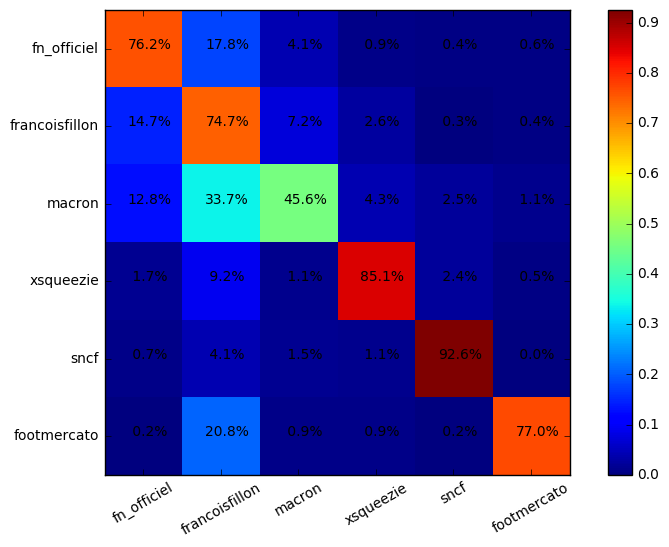

Epoch    3 : 3214.00   Test accuracy: 74.61 78.28 77.43 75.89 77.32 77.55 76.64 
Epoch    3 : 3204.14   Test accuracy: 74.66 78.21 77.46 75.93 77.39 77.50 76.59 
Epoch    3 : 3194.45   Test accuracy: 74.64 78.21 77.39 75.93 77.30 77.43 76.50 
Epoch    3 : 3184.92   Test accuracy: 74.61 78.23 77.37 75.96 77.32 77.46 76.52 
Epoch    3 : 3175.55   Test accuracy: 74.66 78.23 77.53 75.93 77.37 77.53 76.64 
Epoch    3 : 3166.35   Test accuracy: 74.57 78.09 77.43 76.00 77.37 77.57 76.66 
Epoch    3 : 3157.31   Test accuracy: 74.59 78.05 77.37 75.98 77.34 77.57 76.77 
Epoch    3 : 3148.44   Test accuracy: 74.59 78.07 77.25 75.93 77.30 77.59 76.82 
Epoch    3 : 3139.73   Test accuracy: 74.48 77.98 77.32 76.02 77.34 77.55 76.89 
Epoch    3 : 3131.19   Test accuracy: 74.48 77.91 77.34 76.02 77.41 77.66 76.91 
-------------------------------------------------
| 76.5% | 17.2% |  4.5% |  0.8% |  0.6% |  0.4% |   Total: 895
-------------------------------------------------
| 14.3% | 75.7% |  6.7% |  

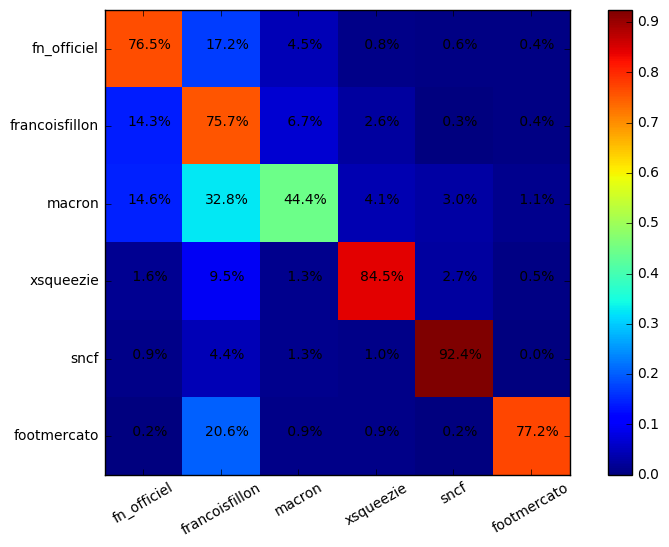

Epoch    3 : 3122.81   Test accuracy: 74.57 77.96 77.37 76.00 77.37 77.66 76.77 
Epoch    3 : 3114.58   Test accuracy: 74.52 77.96 77.41 76.09 77.39 77.62 76.77 
Epoch    3 : 3106.49   Test accuracy: 74.45 78.00 77.50 76.11 77.41 77.68 76.82 
Epoch    3 : 3098.55   Test accuracy: 74.45 78.09 77.66 76.07 77.43 77.82 76.87 
Epoch    3 : 3090.75   Test accuracy: 74.55 78.03 77.64 76.05 77.43 77.80 76.87 
Epoch    3 : 3083.09   Test accuracy: 74.57 78.05 77.66 76.16 77.43 77.80 76.91 
Epoch    3 : 3075.56   Test accuracy: 74.59 78.07 77.73 76.11 77.50 77.78 76.96 
Epoch    3 : 3068.17   Test accuracy: 74.73 78.05 77.66 76.16 77.53 77.82 76.93 
Epoch    3 : 3060.90   Test accuracy: 74.77 78.07 77.66 76.16 77.46 77.80 76.96 
Epoch    3 : 3053.76   Test accuracy: 74.70 78.07 77.71 76.21 77.55 77.80 77.00 
-------------------------------------------------
| 76.6% | 16.8% |  4.8% |  0.8% |  0.6% |  0.4% |   Total: 895
-------------------------------------------------
| 14.2% | 75.7% |  6.8% |  

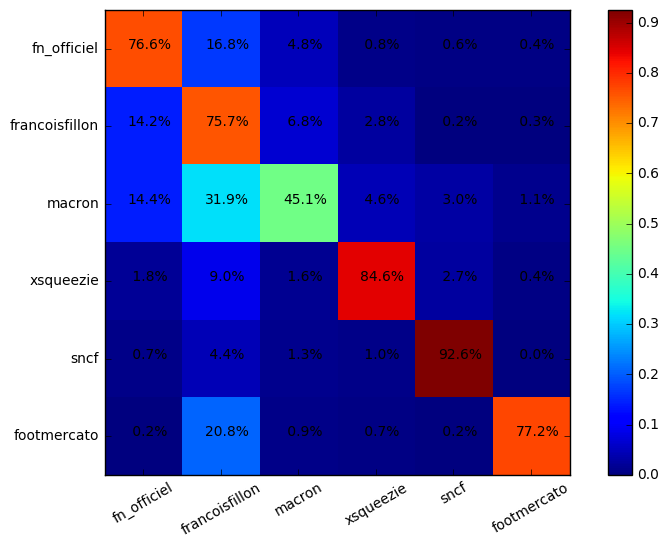

##################### 4 - Essai 4 ###################
Epoch    3 : 4790.42   Test accuracy: 71.59 75.50 74.34 72.84 74.09 74.45 73.68 
Epoch    3 : 4323.36   Test accuracy: 72.61 76.23 75.16 73.48 75.02 75.41 74.25 
Epoch    3 : 4148.65   Test accuracy: 72.88 76.50 75.57 73.86 75.41 75.73 74.66 
Epoch    3 : 4039.90   Test accuracy: 73.09 76.84 76.07 74.52 75.96 76.16 75.59 
Epoch    3 : 3960.33   Test accuracy: 73.29 77.14 76.32 74.59 76.05 76.48 75.77 
Epoch    3 : 3897.11   Test accuracy: 73.43 77.43 76.46 74.84 76.41 76.64 75.96 
Epoch    3 : 3844.41   Test accuracy: 73.50 77.43 76.71 74.95 76.52 76.62 76.09 
Epoch    3 : 3799.00   Test accuracy: 73.57 77.41 76.84 75.07 76.75 76.84 76.34 
Epoch    3 : 3758.66   Test accuracy: 73.70 77.55 76.91 75.18 76.84 76.89 76.46 
Epoch    3 : 3722.24   Test accuracy: 73.75 77.62 76.93 75.34 76.82 77.00 76.52 
-------------------------------------------------
| 78.4% | 14.5% |  5.3% |  1.3% |  0.2% |  0.2% |   Total: 895
-----------------------

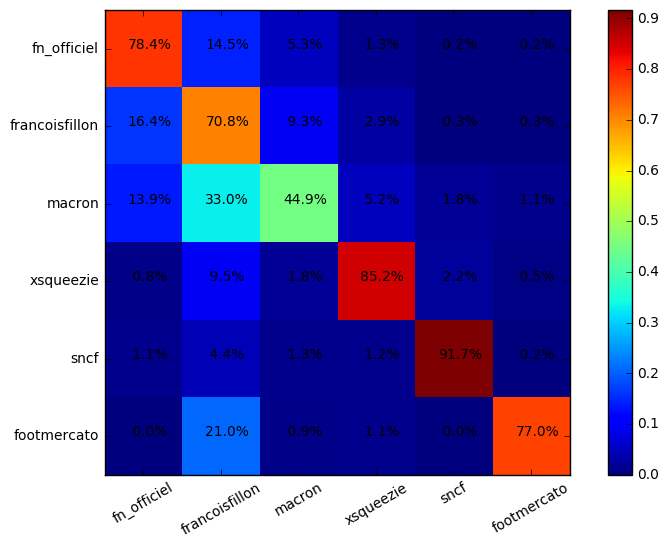

Epoch    3 : 3688.68   Test accuracy: 73.93 77.96 77.09 75.48 77.05 77.21 76.73 
Epoch    3 : 3657.41   Test accuracy: 74.02 78.14 77.32 75.57 77.21 77.27 76.77 
Epoch    3 : 3628.07   Test accuracy: 73.93 78.07 77.25 75.48 77.23 77.32 76.73 
Epoch    3 : 3600.43   Test accuracy: 74.04 78.16 77.09 75.36 77.05 77.27 76.68 
Epoch    3 : 3574.32   Test accuracy: 74.20 78.18 77.16 75.41 77.00 77.53 76.75 
Epoch    3 : 3549.60   Test accuracy: 74.34 78.23 77.30 75.41 77.07 77.50 76.68 
Epoch    3 : 3526.17   Test accuracy: 74.55 78.12 77.48 75.39 77.25 77.46 76.68 
Epoch    3 : 3503.95   Test accuracy: 74.57 78.21 77.48 75.66 77.43 77.57 76.68 
Epoch    3 : 3482.84   Test accuracy: 74.59 78.39 77.59 75.77 77.39 77.66 76.71 
Epoch    3 : 3462.82   Test accuracy: 74.64 78.32 77.57 75.84 77.46 77.68 76.89 
-------------------------------------------------
| 78.9% | 14.1% |  5.6% |  0.7% |  0.3% |  0.4% |   Total: 895
-------------------------------------------------
| 15.9% | 71.7% |  8.9% |  

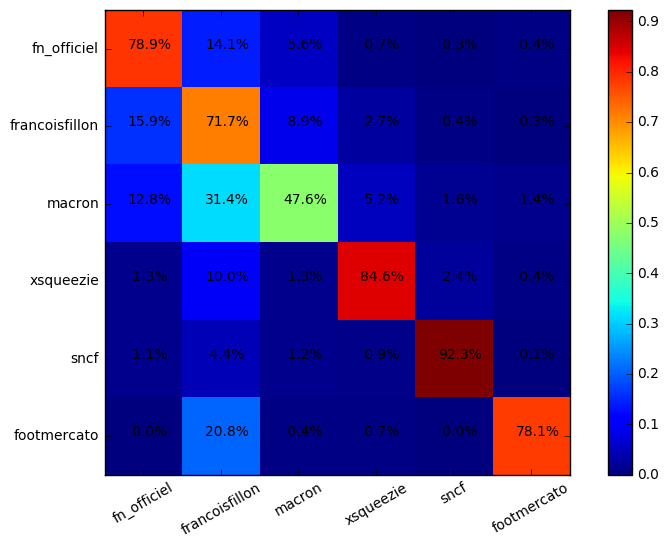

Epoch    3 : 3443.77   Test accuracy: 74.73 78.39 77.50 75.75 77.25 77.73 76.77 
Epoch    3 : 3425.56   Test accuracy: 74.77 78.30 77.48 75.71 77.21 77.75 76.71 
Epoch    3 : 3408.12   Test accuracy: 74.75 78.18 77.43 75.66 77.23 77.57 76.59 
Epoch    3 : 3391.37   Test accuracy: 74.75 78.32 77.41 75.71 77.18 77.71 76.68 
Epoch    3 : 3375.27   Test accuracy: 74.73 78.28 77.37 75.71 77.25 77.71 76.73 
Epoch    3 : 3359.77   Test accuracy: 74.45 78.23 77.41 75.75 77.37 77.75 76.68 
Epoch    3 : 3344.83   Test accuracy: 74.59 78.16 77.34 75.82 77.16 77.59 76.59 
Epoch    3 : 3330.42   Test accuracy: 74.64 78.09 77.41 75.84 77.16 77.66 76.62 
Epoch    3 : 3316.50   Test accuracy: 74.70 78.21 77.37 75.75 77.14 77.55 76.68 
Epoch    3 : 3303.04   Test accuracy: 74.50 78.16 77.41 75.73 77.12 77.48 76.55 
-------------------------------------------------
| 79.4% | 14.2% |  5.1% |  0.7% |  0.2% |  0.3% |   Total: 895
-------------------------------------------------
| 16.4% | 71.2% |  9.1% |  

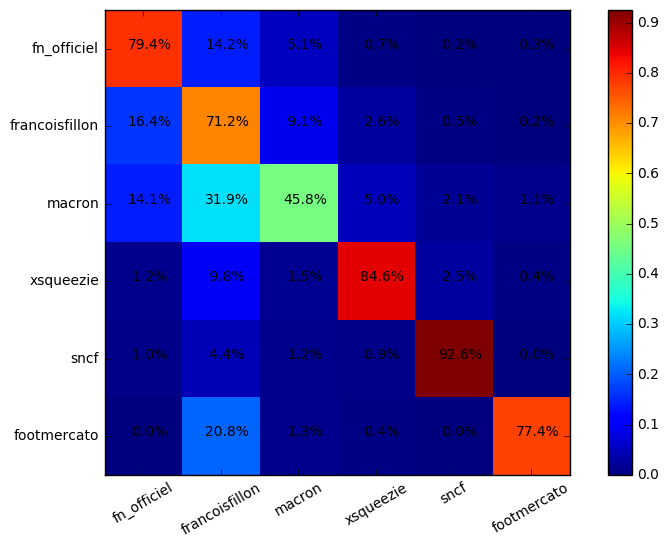

Epoch    3 : 3289.99   Test accuracy: 74.48 78.16 77.27 75.71 77.18 77.46 76.55 
Epoch    3 : 3277.32   Test accuracy: 74.48 78.16 77.37 75.66 77.14 77.50 76.59 
Epoch    3 : 3265.01   Test accuracy: 74.50 78.16 77.34 75.66 77.05 77.55 76.62 
Epoch    3 : 3253.02   Test accuracy: 74.41 78.16 77.27 75.66 77.12 77.55 76.66 
Epoch    3 : 3241.34   Test accuracy: 74.41 78.16 77.25 75.55 77.16 77.43 76.71 
Epoch    3 : 3229.93   Test accuracy: 74.39 78.18 77.23 75.55 77.21 77.39 76.62 
Epoch    3 : 3218.78   Test accuracy: 74.41 78.30 77.27 75.52 77.16 77.37 76.62 
Epoch    3 : 3207.87   Test accuracy: 74.41 78.30 77.27 75.55 77.07 77.34 76.64 
Epoch    3 : 3197.18   Test accuracy: 74.48 78.32 77.25 75.57 77.07 77.32 76.62 
Epoch    3 : 3186.69   Test accuracy: 74.39 78.41 77.18 75.61 77.05 77.34 76.59 
-------------------------------------------------
| 79.6% | 13.5% |  5.6% |  0.9% |  0.2% |  0.2% |   Total: 895
-------------------------------------------------
| 17.2% | 70.8% |  8.9% |  

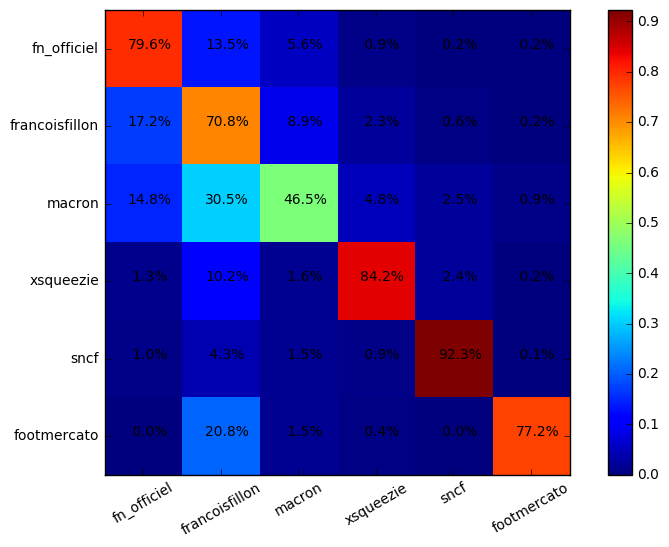

Epoch    3 : 3176.39   Test accuracy: 74.48 78.43 77.14 75.64 77.07 77.30 76.59 
Epoch    3 : 3166.27   Test accuracy: 74.50 78.34 77.23 75.71 77.16 77.27 76.59 
Epoch    3 : 3156.32   Test accuracy: 74.50 78.25 77.25 75.68 77.23 77.39 76.64 
Epoch    3 : 3146.53   Test accuracy: 74.48 78.25 77.21 75.59 77.23 77.32 76.57 
Epoch    3 : 3136.89   Test accuracy: 74.48 78.30 77.14 75.55 77.14 77.32 76.59 
Epoch    3 : 3127.41   Test accuracy: 74.45 78.23 77.16 75.50 77.14 77.25 76.57 
Epoch    3 : 3118.08   Test accuracy: 74.41 78.12 77.23 75.43 77.07 77.23 76.55 
Epoch    3 : 3108.89   Test accuracy: 74.39 78.05 77.25 75.41 77.05 77.30 76.62 
Epoch    3 : 3099.84   Test accuracy: 74.43 78.05 77.21 75.45 77.12 77.30 76.59 
Epoch    3 : 3090.93   Test accuracy: 74.39 77.96 77.16 75.52 77.16 77.30 76.66 
-------------------------------------------------
| 79.1% | 13.7% |  5.7% |  0.9% |  0.3% |  0.2% |   Total: 895
-------------------------------------------------
| 17.3% | 70.5% |  8.8% |  

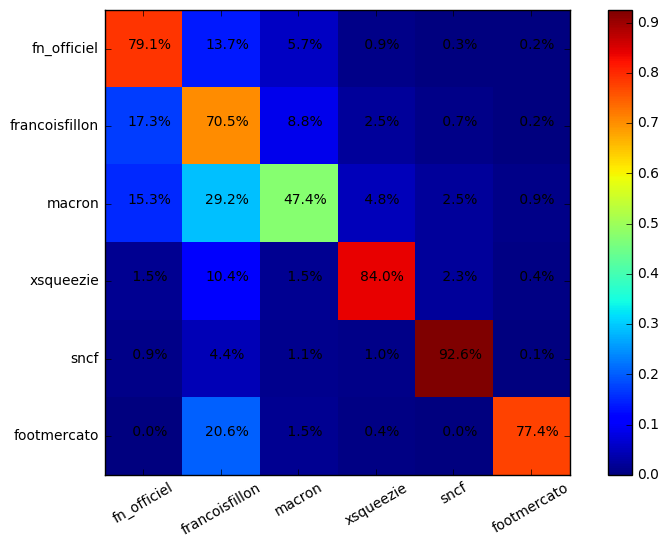

Epoch    3 : 3082.16   Test accuracy: 74.32 77.96 77.23 75.61 77.25 77.25 76.75 
Epoch    3 : 3073.51   Test accuracy: 74.41 77.93 77.27 75.61 77.30 77.30 76.84 
Epoch    3 : 3064.99   Test accuracy: 74.39 77.89 77.32 75.57 77.37 77.32 76.93 
Epoch    3 : 3056.61   Test accuracy: 74.50 77.89 77.30 75.59 77.34 77.43 77.00 
Epoch    3 : 3048.37   Test accuracy: 74.45 77.91 77.23 75.57 77.21 77.50 77.02 
Epoch    3 : 3040.26   Test accuracy: 74.41 77.84 77.23 75.64 77.27 77.39 77.05 
Epoch    3 : 3032.29   Test accuracy: 74.48 77.89 77.32 75.64 77.39 77.46 77.09 
Epoch    3 : 3024.47   Test accuracy: 74.43 77.82 77.37 75.64 77.37 77.46 77.02 
Epoch    3 : 3016.77   Test accuracy: 74.39 77.82 77.37 75.73 77.39 77.46 76.96 
Epoch    3 : 3009.21   Test accuracy: 74.43 77.78 77.32 75.75 77.34 77.53 77.07 
-------------------------------------------------
| 79.2% | 14.2% |  5.3% |  0.8% |  0.3% |  0.2% |   Total: 895
-------------------------------------------------
| 16.4% | 71.2% |  8.6% |  

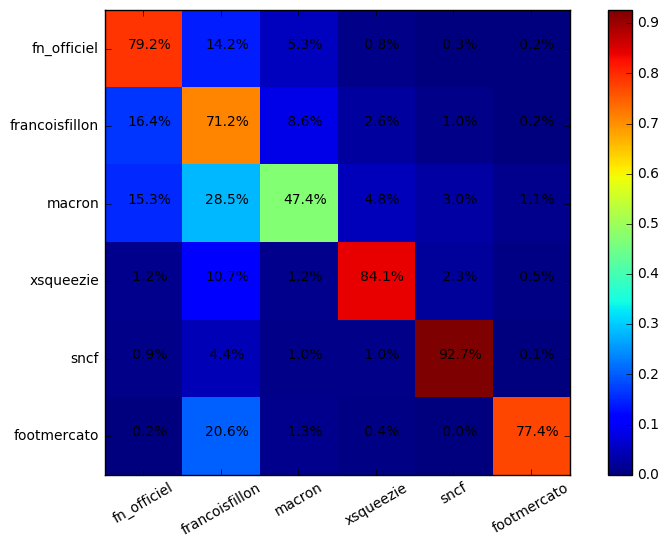

##################### 5 - Essai 0 ###################
Epoch    3 : 8533.97   Test accuracy: 68.83 77.38 71.88 70.39 71.85 71.96 71.47 
Epoch    3 : 7759.29   Test accuracy: 69.50 78.46 72.44 70.82 72.33 72.55 72.09 
Epoch    3 : 7390.15   Test accuracy: 70.12 79.14 73.14 71.58 73.23 73.17 72.79 
Epoch    3 : 7113.02   Test accuracy: 68.91 79.49 72.63 70.72 72.60 72.63 72.50 
Epoch    3 : 6876.32   Test accuracy: 69.50 79.68 73.12 71.12 73.06 73.20 72.79 
Epoch    3 : 6668.29   Test accuracy: 69.69 79.76 73.58 71.69 73.47 73.47 73.14 
Epoch    3 : 6481.95   Test accuracy: 69.80 79.81 73.52 71.79 73.41 73.60 73.36 
Epoch    3 : 6311.94   Test accuracy: 70.12 80.00 73.90 71.96 73.79 73.85 73.41 
Epoch    3 : 6155.48   Test accuracy: 70.31 79.87 73.82 72.15 73.87 73.98 73.52 
Epoch    3 : 6011.08   Test accuracy: 70.34 80.00 73.90 72.15 73.85 74.04 73.60 
-------------------------------------------------
| 67.6% | 24.0% |  6.5% |  1.2% |  0.5% |  0.2% |   Total: 645
-----------------------

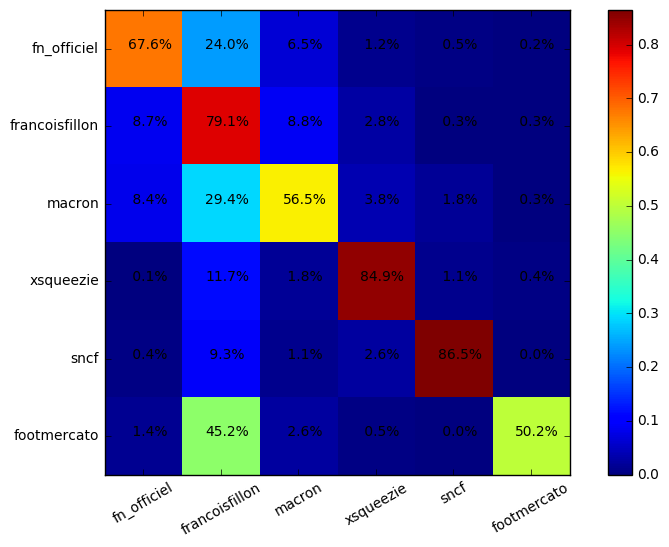

Epoch    3 : 5876.80   Test accuracy: 70.66 80.05 74.09 72.36 74.20 74.22 73.50 
Epoch    3 : 5750.98   Test accuracy: 70.66 80.11 74.22 72.39 74.17 74.22 73.68 
Epoch    3 : 5632.26   Test accuracy: 70.74 80.16 74.14 72.39 74.12 74.28 73.60 
Epoch    3 : 5519.62   Test accuracy: 70.63 80.16 74.25 72.31 74.20 74.33 73.74 
Epoch    3 : 5412.30   Test accuracy: 70.50 80.40 74.25 72.39 74.25 74.33 73.74 
Epoch    3 : 5309.62   Test accuracy: 70.45 80.35 74.25 72.44 74.22 74.33 73.77 
Epoch    3 : 5211.03   Test accuracy: 70.42 80.46 74.25 72.44 74.12 74.25 73.77 
Epoch    3 : 5116.08   Test accuracy: 70.50 80.49 74.22 72.39 74.12 74.17 73.66 
Epoch    3 : 5024.47   Test accuracy: 70.50 80.65 74.20 72.42 74.06 74.22 73.77 
Epoch    3 : 4935.96   Test accuracy: 70.36 80.51 74.06 72.42 74.12 74.22 73.74 
-------------------------------------------------
| 67.8% | 25.1% |  5.6% |  1.4% |  0.2% |  0.0% |   Total: 645
-------------------------------------------------
|  8.6% | 78.9% |  9.1% |  

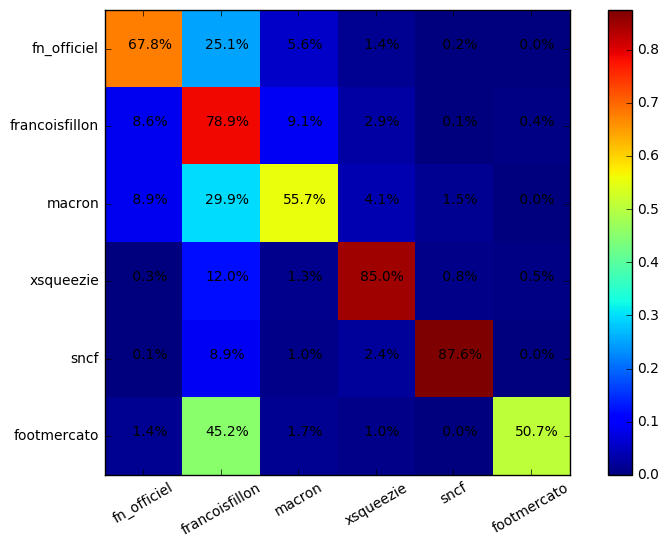

Epoch    3 : 4850.29   Test accuracy: 70.20 80.51 74.12 72.36 74.22 74.14 73.77 
Epoch    3 : 4767.23   Test accuracy: 70.12 80.32 73.98 72.20 74.01 73.87 73.77 
Epoch    3 : 4686.51   Test accuracy: 70.18 80.43 73.95 72.17 74.04 73.95 73.68 
Epoch    3 : 4607.87   Test accuracy: 70.20 80.35 74.14 72.17 74.04 74.12 73.85 
Epoch    3 : 4531.12   Test accuracy: 70.28 80.38 74.06 72.17 74.06 74.06 74.06 
Epoch    3 : 4456.11   Test accuracy: 70.42 80.35 74.06 72.04 73.85 74.17 73.90 
Epoch    3 : 4382.77   Test accuracy: 70.28 80.32 74.01 71.96 73.90 74.12 73.82 
Epoch    3 : 4311.10   Test accuracy: 70.04 80.62 74.12 71.93 73.79 74.06 73.66 
Epoch    3 : 4241.15   Test accuracy: 69.96 80.70 73.79 71.88 73.77 73.98 73.66 
Epoch    3 : 4172.94   Test accuracy: 69.99 80.73 73.79 71.82 73.79 73.77 73.68 
-------------------------------------------------
| 67.1% | 24.5% |  6.2% |  1.9% |  0.3% |  0.0% |   Total: 645
-------------------------------------------------
|  9.0% | 78.9% |  8.2% |  

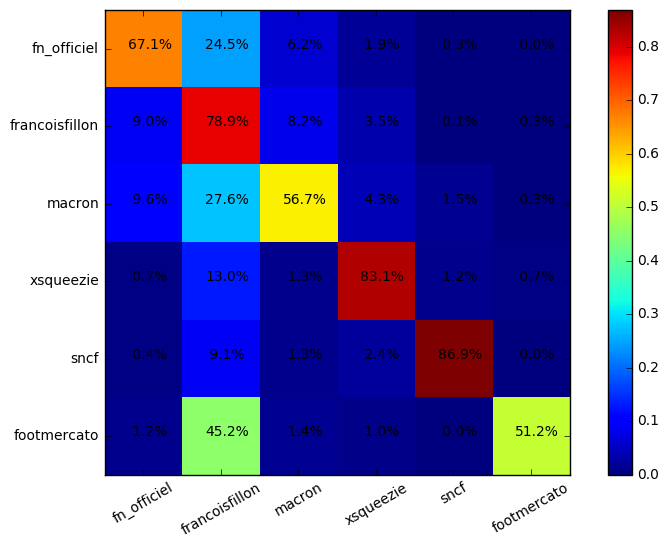

Epoch    3 : 4106.44   Test accuracy: 69.85 80.65 73.85 71.98 73.90 73.79 73.58 
Epoch    3 : 4041.60   Test accuracy: 69.88 80.70 73.79 71.93 73.85 73.82 73.63 
Epoch    3 : 3978.37   Test accuracy: 69.91 80.67 73.79 71.90 73.74 73.82 73.63 
Epoch    3 : 3916.58   Test accuracy: 69.80 80.57 73.82 71.85 73.68 73.77 73.55 
Epoch    3 : 3856.15   Test accuracy: 69.93 80.35 73.71 71.69 73.63 73.71 73.47 
Epoch    3 : 3797.01   Test accuracy: 69.85 80.30 73.68 71.52 73.55 73.66 73.47 
Epoch    3 : 3739.11   Test accuracy: 69.96 80.49 73.63 71.58 73.55 73.60 73.36 
Epoch    3 : 3682.40   Test accuracy: 70.07 80.51 73.55 71.66 73.47 73.74 73.41 
Epoch    3 : 3626.79   Test accuracy: 70.04 80.54 73.58 71.63 73.58 73.74 73.39 
Epoch    3 : 3572.26   Test accuracy: 69.99 80.46 73.58 71.52 73.52 73.82 73.33 
-------------------------------------------------
| 67.4% | 23.3% |  6.8% |  1.9% |  0.6% |  0.0% |   Total: 645
-------------------------------------------------
|  9.6% | 78.8% |  7.6% |  

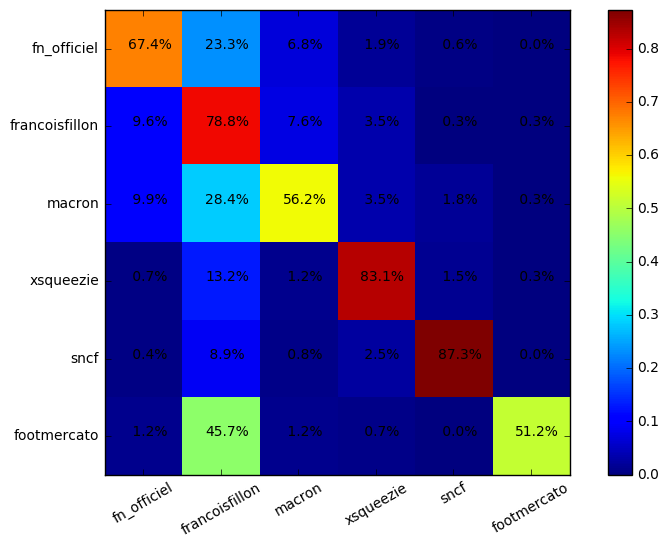

Epoch    3 : 3518.84   Test accuracy: 69.93 80.46 73.52 71.50 73.44 73.68 73.33 
Epoch    3 : 3466.62   Test accuracy: 69.93 80.35 73.58 71.52 73.50 73.63 73.09 
Epoch    3 : 3415.65   Test accuracy: 69.85 80.24 73.58 71.55 73.41 73.71 73.06 
Epoch    3 : 3365.87   Test accuracy: 69.74 80.30 73.63 71.44 73.55 73.74 72.93 
Epoch    3 : 3317.18   Test accuracy: 69.64 80.38 73.52 71.44 73.50 73.66 72.87 
Epoch    3 : 3269.44   Test accuracy: 69.64 80.30 73.52 71.52 73.44 73.58 72.90 
Epoch    3 : 3222.52   Test accuracy: 69.53 80.27 73.47 71.61 73.33 73.50 72.93 
Epoch    3 : 3176.30   Test accuracy: 69.47 80.22 73.47 71.66 73.36 73.44 72.98 
Epoch    3 : 3130.67   Test accuracy: 69.53 80.22 73.55 71.63 73.33 73.50 73.06 
Epoch    3 : 3085.62   Test accuracy: 69.61 80.16 73.50 71.63 73.36 73.52 73.01 
-------------------------------------------------
| 64.2% | 26.8% |  6.8% |  1.6% |  0.6% |  0.0% |   Total: 645
-------------------------------------------------
|  8.5% | 79.9% |  7.6% |  

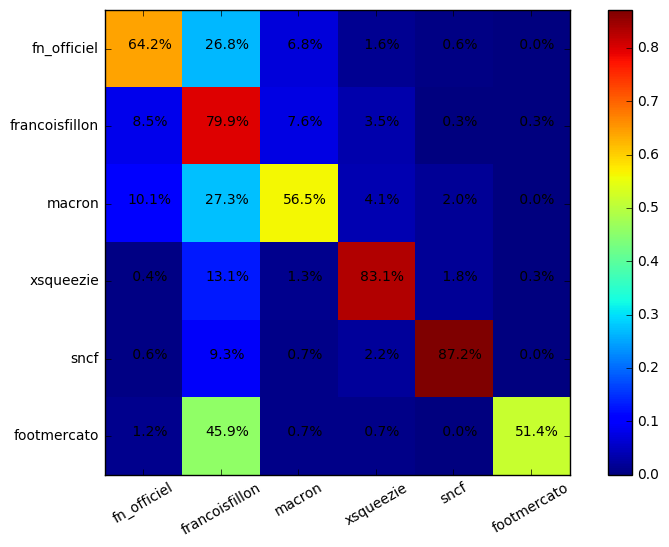

Epoch    3 : 3041.13   Test accuracy: 69.58 80.16 73.58 71.52 73.44 73.50 73.06 
Epoch    3 : 2997.20   Test accuracy: 69.37 80.19 73.50 71.44 73.41 73.52 72.93 
Epoch    3 : 2953.79   Test accuracy: 69.34 80.27 73.41 71.39 73.28 73.44 72.93 
Epoch    3 : 2910.90   Test accuracy: 69.37 80.19 73.28 71.31 73.09 73.47 72.93 
Epoch    3 : 2868.60   Test accuracy: 69.31 80.16 73.23 71.26 73.01 73.28 72.79 
Epoch    3 : 2826.92   Test accuracy: 69.23 80.22 73.17 71.15 72.93 73.17 72.71 
Epoch    3 : 2785.82   Test accuracy: 69.28 80.35 73.01 71.15 72.93 73.06 72.74 
Epoch    3 : 2745.30   Test accuracy: 69.23 80.46 73.04 71.12 72.96 73.06 72.63 
Epoch    3 : 2705.37   Test accuracy: 69.18 80.46 73.01 71.09 72.98 72.90 72.63 
Epoch    3 : 2666.06   Test accuracy: 69.12 80.43 72.98 70.99 72.98 73.01 72.69 
-------------------------------------------------
| 64.7% | 26.2% |  7.0% |  1.7% |  0.5% |  0.0% |   Total: 645
-------------------------------------------------
|  9.9% | 77.6% |  8.1% |  

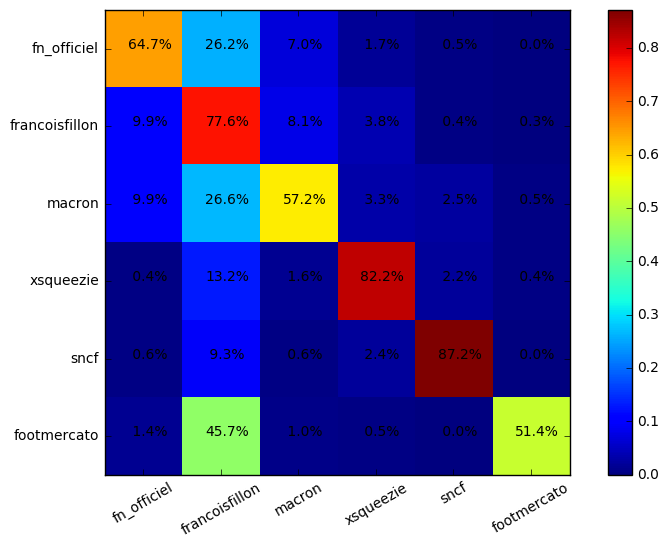

##################### 5 - Essai 1 ###################
Epoch    3 : 8550.71   Test accuracy: 67.18 77.25 70.55 69.07 70.50 70.72 70.28 
Epoch    3 : 7762.99   Test accuracy: 68.21 78.33 71.55 69.66 71.58 71.58 71.07 
Epoch    3 : 7376.64   Test accuracy: 68.48 79.00 72.01 70.12 71.98 72.17 71.74 
Epoch    3 : 7079.37   Test accuracy: 68.66 79.38 72.50 70.50 72.47 72.60 72.23 
Epoch    3 : 6827.40   Test accuracy: 69.37 79.62 72.98 70.82 72.90 73.23 72.42 
Epoch    3 : 6611.16   Test accuracy: 69.74 80.08 73.39 71.42 73.23 73.41 72.52 
Epoch    3 : 6420.66   Test accuracy: 69.91 80.30 73.41 71.52 73.33 73.58 72.79 
Epoch    3 : 6248.36   Test accuracy: 70.01 80.54 73.66 71.79 73.66 73.74 73.36 
Epoch    3 : 6089.92   Test accuracy: 69.96 80.70 73.77 72.04 73.66 73.90 73.47 
Epoch    3 : 5942.32   Test accuracy: 70.01 80.62 73.85 72.15 73.82 74.14 73.44 
-------------------------------------------------
| 71.2% | 21.6% |  5.1% |  1.9% |  0.0% |  0.3% |   Total: 645
-----------------------

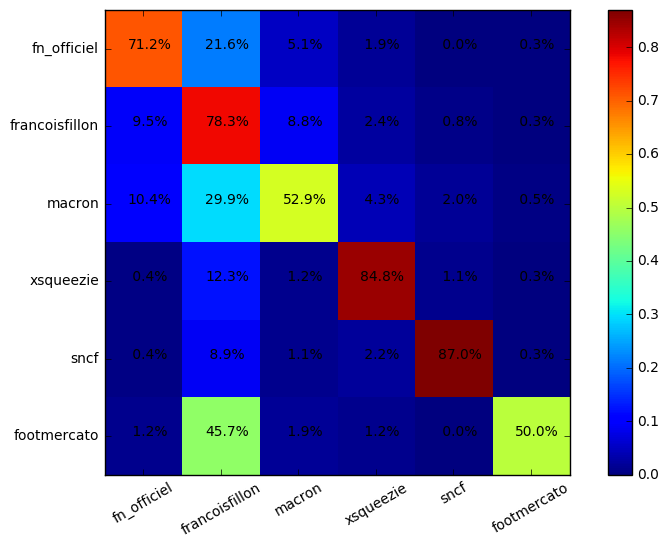

Epoch    3 : 5803.44   Test accuracy: 69.99 80.73 74.12 72.28 74.01 74.06 73.82 
Epoch    3 : 5671.71   Test accuracy: 70.07 80.76 73.90 72.12 73.93 74.04 73.82 
Epoch    3 : 5546.37   Test accuracy: 70.01 80.94 74.01 71.98 73.87 74.14 73.77 
Epoch    3 : 5426.74   Test accuracy: 69.99 80.92 74.06 72.15 73.98 74.28 73.71 
Epoch    3 : 5312.39   Test accuracy: 70.07 80.86 74.22 72.25 74.09 74.06 73.79 
Epoch    3 : 5203.16   Test accuracy: 70.26 80.97 74.28 72.39 74.25 74.39 73.93 
Epoch    3 : 5098.99   Test accuracy: 70.31 80.97 74.39 72.52 74.39 74.41 73.95 
Epoch    3 : 4999.71   Test accuracy: 70.36 80.86 74.49 72.42 74.28 74.30 73.98 
Epoch    3 : 4905.03   Test accuracy: 70.53 80.70 74.28 72.47 74.17 74.47 73.87 
Epoch    3 : 4814.52   Test accuracy: 70.69 80.84 74.36 72.47 74.33 74.52 74.01 
-------------------------------------------------
| 69.1% | 23.4% |  5.1% |  1.4% |  0.6% |  0.3% |   Total: 645
-------------------------------------------------
|  8.0% | 80.9% |  8.0% |  

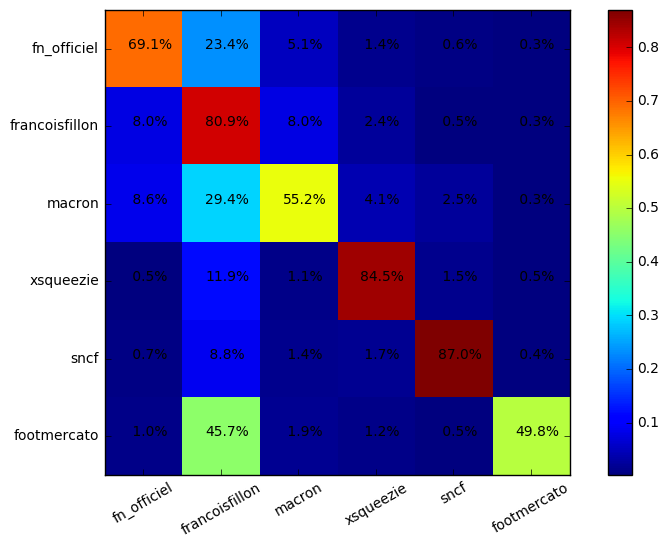

Epoch    3 : 4727.76   Test accuracy: 70.55 80.94 74.47 72.55 74.39 74.52 73.90 
Epoch    3 : 4644.24   Test accuracy: 70.39 80.94 74.39 72.44 74.41 74.49 74.01 
Epoch    3 : 4563.48   Test accuracy: 70.42 80.94 74.28 72.39 74.28 74.30 73.82 
Epoch    3 : 4485.11   Test accuracy: 70.42 80.84 74.39 72.50 74.30 74.36 73.87 
Epoch    3 : 4408.89   Test accuracy: 70.28 81.00 74.44 72.31 74.44 74.30 73.95 
Epoch    3 : 4334.68   Test accuracy: 70.34 81.00 74.28 72.23 74.04 74.36 73.85 
Epoch    3 : 4262.37   Test accuracy: 70.42 81.03 74.25 72.15 74.12 74.41 73.82 
Epoch    3 : 4191.83   Test accuracy: 70.26 80.94 74.28 72.20 74.17 74.47 73.68 
Epoch    3 : 4122.93   Test accuracy: 70.26 80.86 74.06 72.06 73.95 74.33 73.55 
Epoch    3 : 4055.72   Test accuracy: 70.18 80.89 74.12 72.04 73.98 74.36 73.47 
-------------------------------------------------
| 67.8% | 25.3% |  5.0% |  1.2% |  0.5% |  0.3% |   Total: 645
-------------------------------------------------
|  9.0% | 81.0% |  7.3% |  

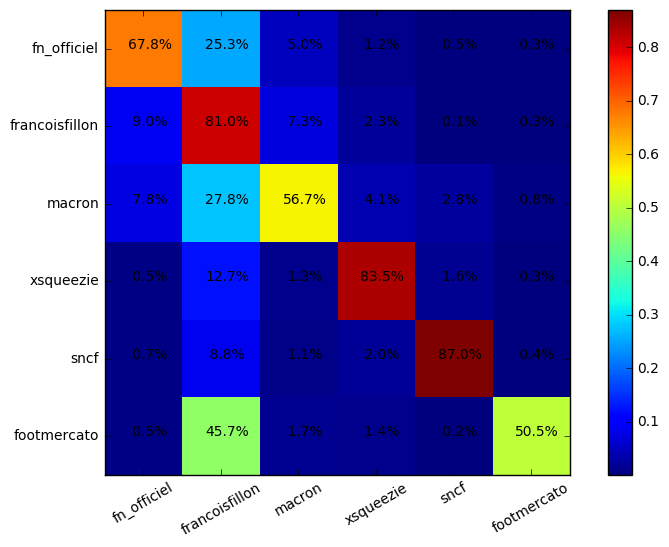

Epoch    3 : 3990.19   Test accuracy: 70.04 80.86 74.09 72.04 73.93 74.22 73.44 
Epoch    3 : 3926.20   Test accuracy: 70.15 80.84 74.04 72.01 73.98 74.25 73.44 
Epoch    3 : 3863.65   Test accuracy: 70.12 80.73 73.98 71.82 73.95 74.12 73.50 
Epoch    3 : 3802.46   Test accuracy: 70.15 80.70 74.01 72.06 73.98 74.17 73.47 
Epoch    3 : 3742.58   Test accuracy: 70.18 80.76 73.98 72.01 73.93 74.06 73.58 
Epoch    3 : 3683.93   Test accuracy: 70.09 80.70 74.04 72.04 73.90 74.12 73.52 
Epoch    3 : 3626.44   Test accuracy: 70.07 80.62 73.93 71.88 73.93 73.87 73.50 
Epoch    3 : 3570.08   Test accuracy: 70.09 80.59 73.77 71.82 73.87 73.82 73.41 
Epoch    3 : 3514.83   Test accuracy: 70.04 80.54 73.71 71.66 73.66 73.79 73.41 
Epoch    3 : 3460.61   Test accuracy: 69.96 80.54 73.71 71.71 73.63 73.79 73.47 
-------------------------------------------------
| 66.7% | 26.0% |  4.8% |  1.6% |  0.5% |  0.5% |   Total: 645
-------------------------------------------------
| 10.1% | 80.5% |  7.1% |  

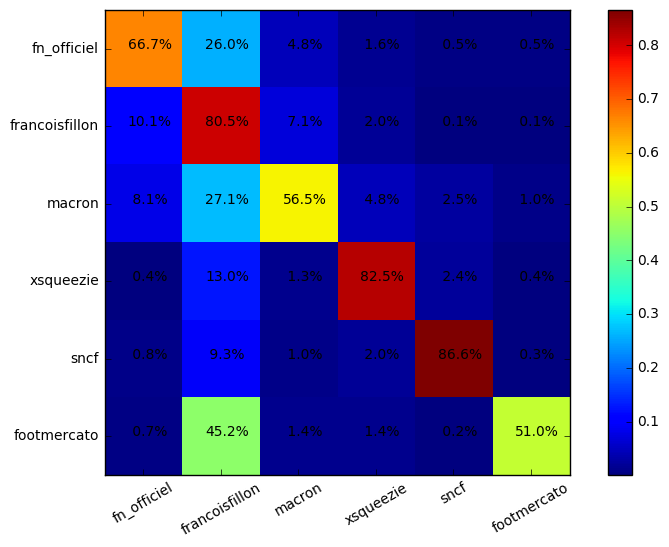

Epoch    3 : 3407.60   Test accuracy: 69.88 80.40 73.74 71.77 73.71 73.71 73.50 
Epoch    3 : 3355.79   Test accuracy: 69.85 80.32 73.63 71.74 73.74 73.66 73.55 
Epoch    3 : 3305.03   Test accuracy: 69.80 80.27 73.74 71.71 73.85 73.63 73.63 
Epoch    3 : 3255.26   Test accuracy: 69.80 80.35 73.71 71.82 73.71 73.71 73.50 
Epoch    3 : 3206.41   Test accuracy: 69.77 80.24 73.66 71.82 73.71 73.66 73.33 
Epoch    3 : 3158.43   Test accuracy: 69.93 80.27 73.74 71.88 73.90 73.68 73.36 
Epoch    3 : 3111.28   Test accuracy: 69.99 80.30 73.82 71.98 73.77 73.68 73.31 
Epoch    3 : 3064.92   Test accuracy: 69.91 80.40 73.77 71.88 73.74 73.77 73.33 
Epoch    3 : 3019.34   Test accuracy: 69.91 80.38 73.82 71.85 73.79 73.79 73.36 
Epoch    3 : 2974.56   Test accuracy: 70.01 80.32 73.74 71.82 73.77 73.74 73.25 
-------------------------------------------------
| 68.8% | 23.6% |  5.1% |  1.1% |  0.9% |  0.5% |   Total: 645
-------------------------------------------------
| 10.5% | 80.0% |  6.7% |  

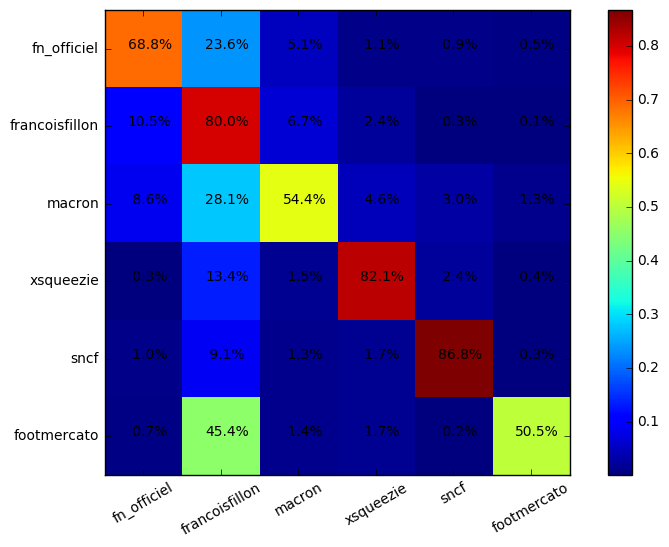

Epoch    3 : 2930.61   Test accuracy: 69.91 80.16 73.74 71.74 73.68 73.71 73.12 
Epoch    3 : 2887.46   Test accuracy: 69.85 80.05 73.66 71.66 73.63 73.68 73.20 
Epoch    3 : 2845.18   Test accuracy: 69.77 80.05 73.50 71.47 73.47 73.50 73.09 
Epoch    3 : 2803.76   Test accuracy: 69.77 80.00 73.28 71.50 73.36 73.28 72.93 
Epoch    3 : 2763.10   Test accuracy: 69.74 79.89 73.25 71.36 73.28 73.28 72.90 
Epoch    3 : 2723.24   Test accuracy: 69.74 79.81 73.25 71.31 73.31 73.23 73.04 
Epoch    3 : 2684.25   Test accuracy: 69.72 79.81 73.23 71.36 73.36 73.23 72.93 
Epoch    3 : 2646.01   Test accuracy: 69.69 79.89 73.17 71.34 73.20 73.23 72.77 
Epoch    3 : 2608.43   Test accuracy: 69.61 79.97 73.09 71.34 73.17 73.17 72.82 
Epoch    3 : 2571.65   Test accuracy: 69.58 80.08 73.17 71.26 73.12 73.20 72.87 
-------------------------------------------------
| 67.3% | 25.3% |  4.5% |  1.6% |  0.9% |  0.5% |   Total: 645
-------------------------------------------------
| 10.6% | 79.4% |  7.0% |  

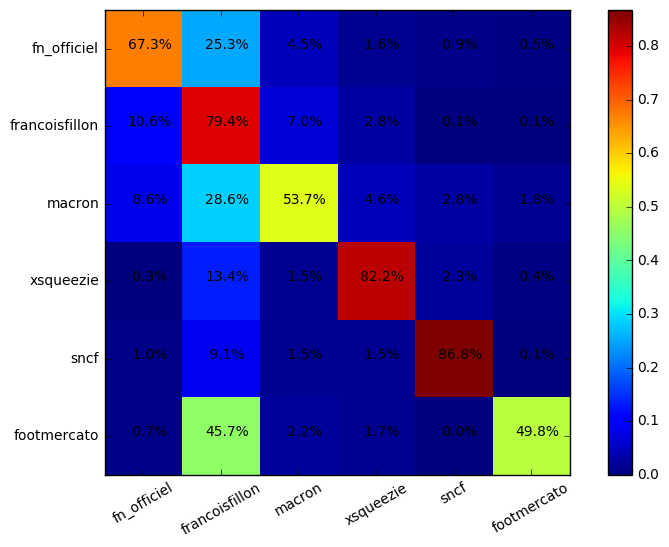

##################### 5 - Essai 2 ###################
Epoch    3 : 8498.48   Test accuracy: 67.45 77.54 70.63 68.96 70.47 70.61 70.55 
Epoch    3 : 7767.93   Test accuracy: 68.39 78.41 71.85 70.09 71.77 71.93 71.44 
Epoch    3 : 7409.96   Test accuracy: 68.74 79.06 72.52 70.66 72.50 72.60 72.01 
Epoch    3 : 7140.69   Test accuracy: 69.10 79.81 72.79 70.90 72.71 72.82 72.28 
Epoch    3 : 6912.56   Test accuracy: 69.58 80.16 73.23 71.39 73.09 73.44 72.66 
Epoch    3 : 6715.58   Test accuracy: 69.91 80.27 73.36 71.44 73.01 73.47 72.74 
Epoch    3 : 6539.76   Test accuracy: 69.91 80.35 73.44 71.47 73.31 73.52 73.17 
Epoch    3 : 6377.06   Test accuracy: 70.18 80.65 73.60 71.82 73.50 73.50 73.20 
Epoch    3 : 6224.68   Test accuracy: 70.12 80.62 73.55 71.90 73.55 73.66 73.36 
Epoch    3 : 6081.52   Test accuracy: 70.18 80.76 73.74 71.96 73.77 74.01 73.52 
-------------------------------------------------
| 68.4% | 23.7% |  5.6% |  1.9% |  0.2% |  0.3% |   Total: 645
-----------------------

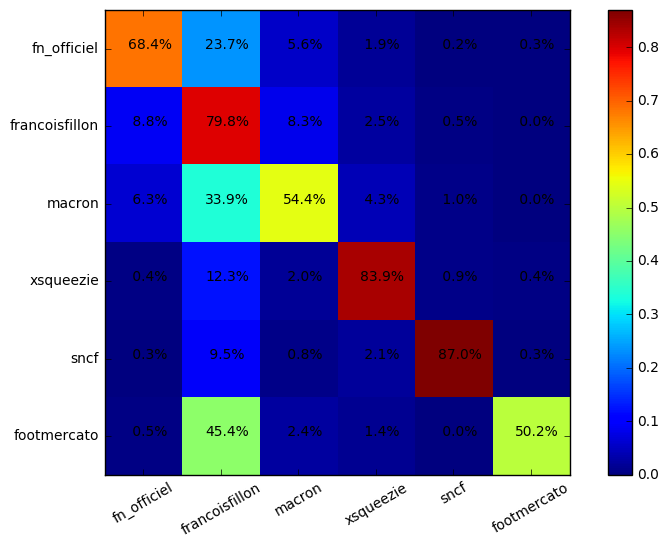

Epoch    3 : 5946.29   Test accuracy: 70.34 81.11 73.90 72.23 73.90 73.95 73.41 
Epoch    3 : 5817.87   Test accuracy: 70.31 81.46 74.14 72.25 74.14 74.30 73.74 
Epoch    3 : 5695.84   Test accuracy: 70.47 81.40 74.14 72.20 74.20 74.36 73.79 
Epoch    3 : 5579.46   Test accuracy: 70.45 81.32 74.25 72.20 74.36 74.25 73.87 
Epoch    3 : 5467.87   Test accuracy: 70.36 81.43 74.12 72.20 74.22 74.17 73.71 
Epoch    3 : 5360.33   Test accuracy: 70.34 81.35 74.22 72.25 74.25 74.17 73.63 
Epoch    3 : 5256.33   Test accuracy: 70.12 81.35 74.06 72.12 74.06 74.06 73.68 
Epoch    3 : 5155.72   Test accuracy: 70.09 81.03 73.93 72.04 74.06 74.04 73.68 
Epoch    3 : 5058.36   Test accuracy: 70.01 81.11 73.93 71.96 73.79 73.98 73.52 
Epoch    3 : 4964.00   Test accuracy: 70.09 81.11 73.82 71.88 73.79 73.98 73.44 
-------------------------------------------------
| 67.3% | 24.8% |  5.3% |  1.9% |  0.5% |  0.3% |   Total: 645
-------------------------------------------------
|  7.3% | 82.0% |  8.0% |  

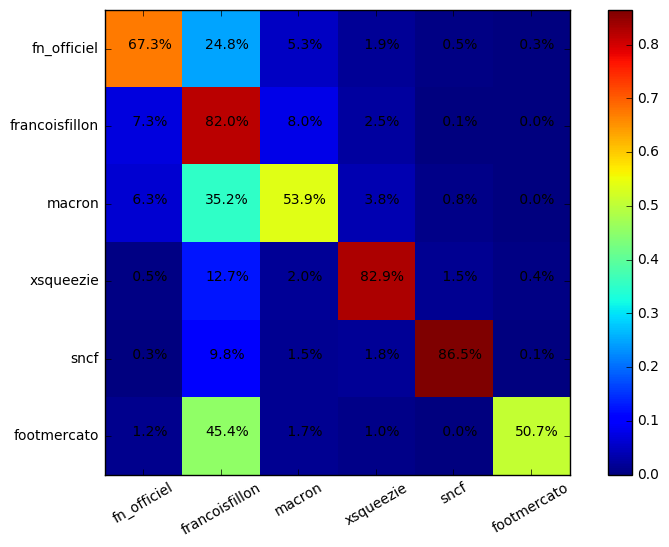

Epoch    3 : 4872.49   Test accuracy: 69.93 80.97 73.87 71.90 73.79 73.79 73.36 
Epoch    3 : 4783.91   Test accuracy: 70.01 80.97 73.82 72.04 73.82 73.79 73.39 
Epoch    3 : 4698.37   Test accuracy: 70.04 80.84 73.74 72.12 73.79 73.87 73.23 
Epoch    3 : 4615.87   Test accuracy: 69.82 80.84 73.82 72.04 73.79 73.85 73.23 
Epoch    3 : 4536.21   Test accuracy: 69.61 80.76 73.87 72.01 73.79 73.93 73.23 
Epoch    3 : 4459.15   Test accuracy: 69.61 80.76 73.87 72.12 73.79 74.06 73.36 
Epoch    3 : 4384.68   Test accuracy: 69.55 80.70 73.82 72.06 73.85 73.93 73.31 
Epoch    3 : 4312.59   Test accuracy: 69.64 80.65 74.01 72.04 73.85 73.85 73.44 
Epoch    3 : 4242.57   Test accuracy: 69.58 80.76 73.85 72.04 73.87 73.74 73.47 
Epoch    3 : 4174.41   Test accuracy: 69.66 80.76 73.77 72.01 73.77 73.68 73.41 
-------------------------------------------------
| 66.7% | 25.1% |  6.0% |  1.9% |  0.0% |  0.3% |   Total: 645
-------------------------------------------------
|  7.1% | 81.0% |  9.0% |  

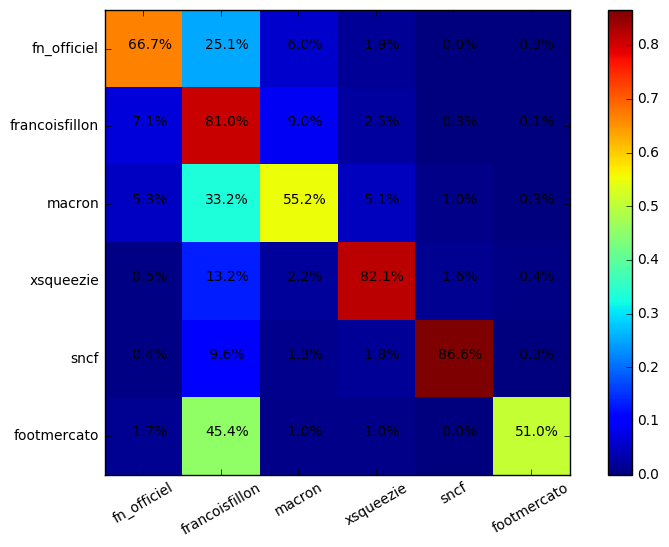

Epoch    3 : 4108.00   Test accuracy: 69.61 80.78 73.52 71.79 73.55 73.60 73.20 
Epoch    3 : 4043.20   Test accuracy: 69.53 80.62 73.58 71.79 73.60 73.63 73.14 
Epoch    3 : 3979.84   Test accuracy: 69.66 80.67 73.52 71.71 73.50 73.50 73.09 
Epoch    3 : 3917.82   Test accuracy: 69.58 80.59 73.41 71.71 73.55 73.50 72.98 
Epoch    3 : 3857.21   Test accuracy: 69.64 80.67 73.41 71.58 73.31 73.47 72.93 
Epoch    3 : 3798.05   Test accuracy: 69.53 80.67 73.20 71.55 73.23 73.47 72.87 
Epoch    3 : 3740.27   Test accuracy: 69.53 80.78 73.23 71.52 73.36 73.25 72.85 
Epoch    3 : 3683.74   Test accuracy: 69.55 80.81 73.12 71.50 73.25 73.06 72.87 
Epoch    3 : 3628.37   Test accuracy: 69.47 80.65 73.17 71.50 73.09 73.09 72.93 
Epoch    3 : 3574.09   Test accuracy: 69.50 80.57 73.14 71.39 73.25 73.04 72.77 
-------------------------------------------------
| 66.7% | 26.0% |  5.0% |  2.0% |  0.0% |  0.3% |   Total: 645
-------------------------------------------------
|  8.0% | 79.4% |  9.4% |  

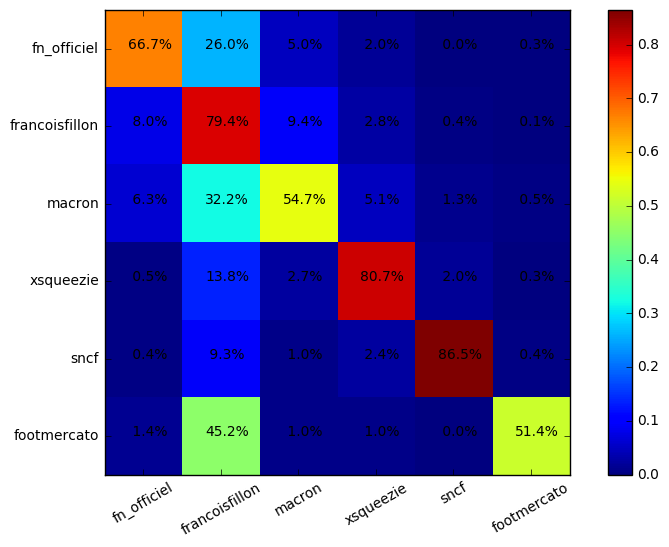

Epoch    3 : 3520.78   Test accuracy: 69.31 80.54 73.20 71.42 73.33 73.06 72.69 
Epoch    3 : 3468.12   Test accuracy: 69.28 80.43 73.20 71.44 73.23 73.14 72.69 
Epoch    3 : 3416.40   Test accuracy: 69.31 80.38 73.20 71.26 73.23 73.23 72.69 
Epoch    3 : 3365.88   Test accuracy: 69.28 80.16 73.25 71.36 73.06 73.12 72.66 
Epoch    3 : 3316.37   Test accuracy: 69.15 80.05 73.12 71.28 73.12 73.14 72.74 
Epoch    3 : 3267.84   Test accuracy: 69.23 80.00 73.04 71.15 73.04 73.04 72.69 
Epoch    3 : 3220.23   Test accuracy: 69.23 79.87 73.04 71.17 73.01 73.06 72.58 
Epoch    3 : 3173.47   Test accuracy: 69.26 79.84 73.01 71.20 72.93 72.93 72.66 
Epoch    3 : 3127.70   Test accuracy: 69.15 79.87 73.06 71.20 72.87 72.96 72.58 
Epoch    3 : 3082.93   Test accuracy: 69.07 79.89 73.06 71.20 72.90 73.06 72.50 
-------------------------------------------------
| 65.7% | 26.8% |  5.0% |  2.2% |  0.0% |  0.3% |   Total: 645
-------------------------------------------------
|  8.6% | 79.1% |  8.8% |  

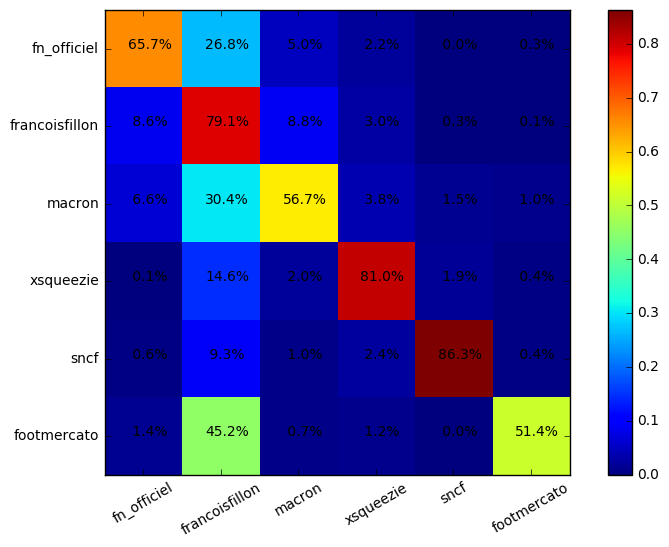

Epoch    3 : 3039.37   Test accuracy: 69.10 79.92 72.96 71.09 72.85 72.98 72.42 
Epoch    3 : 2997.06   Test accuracy: 69.04 79.95 72.90 71.07 72.74 72.90 72.47 
Epoch    3 : 2955.95   Test accuracy: 69.04 79.87 72.85 71.07 72.77 73.04 72.44 
Epoch    3 : 2915.98   Test accuracy: 68.99 80.00 72.87 70.90 72.74 72.96 72.36 
Epoch    3 : 2877.12   Test accuracy: 68.93 79.95 72.69 70.90 72.71 72.96 72.31 
Epoch    3 : 2839.38   Test accuracy: 68.88 79.95 72.69 70.93 72.69 72.96 72.28 
Epoch    3 : 2802.87   Test accuracy: 68.93 80.00 72.69 70.85 72.71 72.90 72.20 
Epoch    3 : 2767.72   Test accuracy: 69.01 80.03 72.69 70.77 72.63 72.87 72.09 
Epoch    3 : 2734.04   Test accuracy: 68.99 79.97 72.69 70.77 72.74 72.85 72.15 
Epoch    3 : 2702.04   Test accuracy: 68.99 80.03 72.79 70.80 72.63 72.87 72.15 
-------------------------------------------------
| 64.8% | 27.8% |  5.0% |  2.2% |  0.0% |  0.3% |   Total: 645
-------------------------------------------------
|  8.7% | 79.0% |  8.7% |  

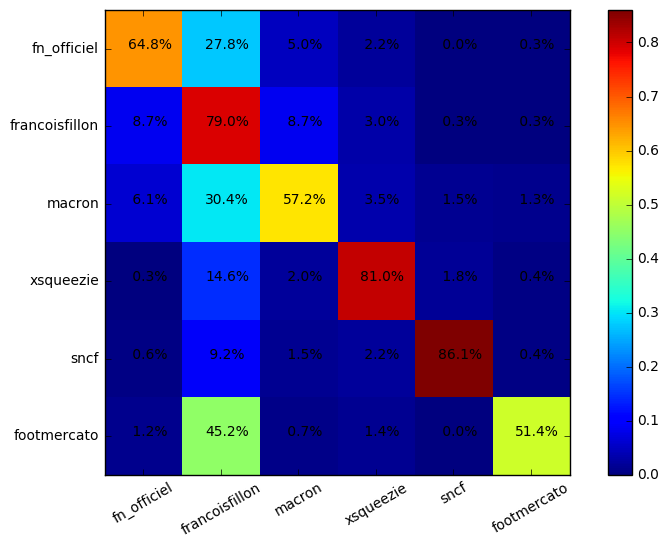

##################### 5 - Essai 3 ###################
Epoch    3 : 8581.08   Test accuracy: 69.04 77.52 71.90 70.47 71.90 72.12 71.50 
Epoch    3 : 7759.70   Test accuracy: 73.31 78.68 76.17 74.60 76.06 76.33 75.76 
Epoch    3 : 7389.57   Test accuracy: 68.64 79.19 72.23 70.42 72.12 72.33 71.88 
Epoch    3 : 7109.93   Test accuracy: 68.91 79.54 72.60 70.69 72.55 72.63 72.42 
Epoch    3 : 6877.22   Test accuracy: 69.23 79.87 73.01 71.09 73.01 73.06 72.69 
Epoch    3 : 6675.70   Test accuracy: 69.61 80.00 73.25 71.44 73.12 73.17 72.85 
Epoch    3 : 6493.62   Test accuracy: 69.58 80.32 73.50 71.82 73.52 73.52 73.23 
Epoch    3 : 6325.89   Test accuracy: 69.91 80.35 73.74 71.88 73.68 73.90 73.68 
Epoch    3 : 6170.58   Test accuracy: 70.07 80.51 73.93 72.04 73.85 74.17 73.66 
Epoch    3 : 6026.90   Test accuracy: 70.12 80.49 74.20 72.25 74.20 74.17 73.85 
-------------------------------------------------
| 70.7% | 21.4% |  6.2% |  1.4% |  0.3% |  0.0% |   Total: 645
-----------------------

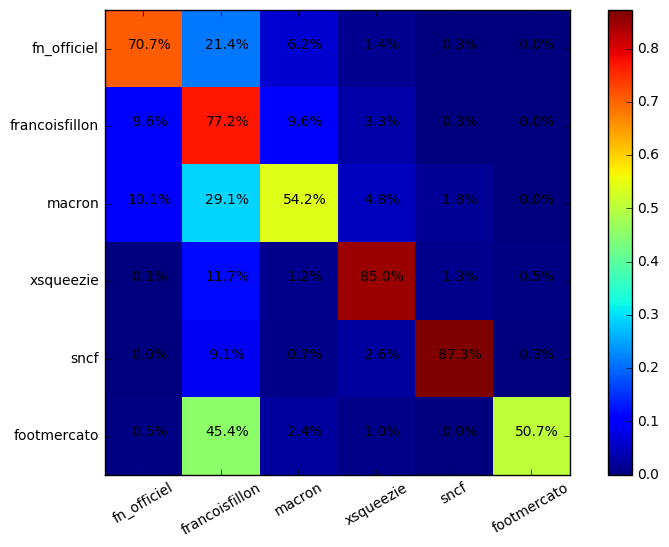

Epoch    3 : 5893.50   Test accuracy: 70.23 80.73 74.20 72.28 74.25 74.12 73.98 
Epoch    3 : 5768.58   Test accuracy: 70.26 80.86 74.30 72.28 74.25 74.25 73.85 
Epoch    3 : 5650.59   Test accuracy: 70.34 80.97 74.44 72.42 74.25 74.36 74.01 
Epoch    3 : 5538.46   Test accuracy: 70.50 80.89 74.39 72.31 74.25 74.41 73.90 
Epoch    3 : 5431.52   Test accuracy: 70.58 80.86 74.44 72.42 74.36 74.55 74.01 
Epoch    3 : 5329.23   Test accuracy: 70.74 80.78 74.49 72.42 74.47 74.57 74.20 
Epoch    3 : 5231.23   Test accuracy: 70.69 80.78 74.55 72.52 74.44 74.52 74.09 
Epoch    3 : 5137.14   Test accuracy: 70.74 80.94 74.57 72.50 74.44 74.55 74.06 
Epoch    3 : 5046.65   Test accuracy: 70.85 80.86 74.41 72.42 74.22 74.55 73.93 
Epoch    3 : 4959.42   Test accuracy: 70.69 80.67 74.36 72.25 74.20 74.30 74.04 
-------------------------------------------------
| 71.0% | 21.7% |  4.8% |  1.6% |  0.8% |  0.2% |   Total: 645
-------------------------------------------------
|  8.8% | 79.9% |  7.7% |  

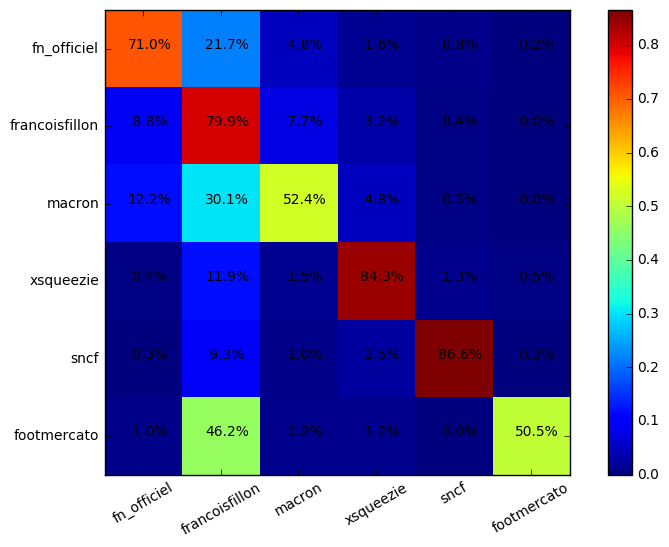

Epoch    3 : 4875.14   Test accuracy: 70.39 80.54 74.36 72.33 74.33 74.28 73.98 
Epoch    3 : 4793.52   Test accuracy: 70.39 80.65 74.28 72.12 74.22 74.39 73.95 
Epoch    3 : 4714.34   Test accuracy: 70.39 80.65 74.17 72.20 74.17 74.30 73.98 
Epoch    3 : 4637.43   Test accuracy: 70.47 80.51 74.20 72.15 74.06 74.30 73.79 
Epoch    3 : 4562.60   Test accuracy: 70.18 80.43 74.17 72.20 74.14 74.30 73.85 
Epoch    3 : 4489.71   Test accuracy: 70.34 80.49 74.12 72.20 74.01 74.25 73.71 
Epoch    3 : 4418.75   Test accuracy: 70.42 80.57 74.04 72.15 73.95 74.20 73.74 
Epoch    3 : 4349.66   Test accuracy: 70.39 80.54 74.14 72.09 73.95 74.22 73.74 
Epoch    3 : 4282.34   Test accuracy: 70.34 80.40 74.12 72.01 74.04 74.17 73.71 
Epoch    3 : 4216.67   Test accuracy: 70.20 80.43 74.04 71.98 73.98 74.12 73.77 
-------------------------------------------------
| 70.1% | 23.7% |  3.9% |  1.6% |  0.8% |  0.0% |   Total: 645
-------------------------------------------------
|  8.3% | 80.5% |  7.6% |  

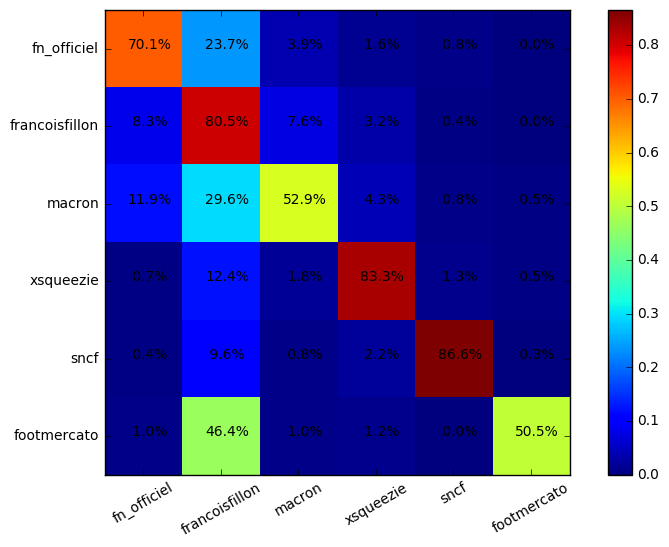

Epoch    3 : 4152.51   Test accuracy: 70.15 80.46 74.01 71.96 73.93 74.12 73.71 
Epoch    3 : 4089.74   Test accuracy: 70.12 80.70 73.87 71.93 73.90 74.01 73.74 
Epoch    3 : 4028.26   Test accuracy: 70.01 80.73 73.85 71.79 73.93 73.93 73.71 
Epoch    3 : 3967.95   Test accuracy: 69.80 80.70 73.85 71.74 73.87 73.95 73.66 
Epoch    3 : 3908.72   Test accuracy: 69.85 80.84 73.90 71.82 73.79 73.95 73.68 
Epoch    3 : 3850.49   Test accuracy: 69.91 80.78 73.85 71.63 73.77 73.85 73.60 
Epoch    3 : 3793.18   Test accuracy: 69.85 80.81 73.68 71.66 73.63 73.79 73.66 
Epoch    3 : 3736.78   Test accuracy: 69.80 80.89 73.55 71.47 73.50 73.77 73.79 
Epoch    3 : 3681.24   Test accuracy: 69.69 80.78 73.50 71.47 73.47 73.66 73.68 
Epoch    3 : 3626.56   Test accuracy: 69.50 80.76 73.47 71.52 73.47 73.60 73.52 
-------------------------------------------------
| 69.0% | 24.7% |  4.2% |  1.6% |  0.6% |  0.0% |   Total: 645
-------------------------------------------------
|  9.2% | 79.9% |  7.7% |  

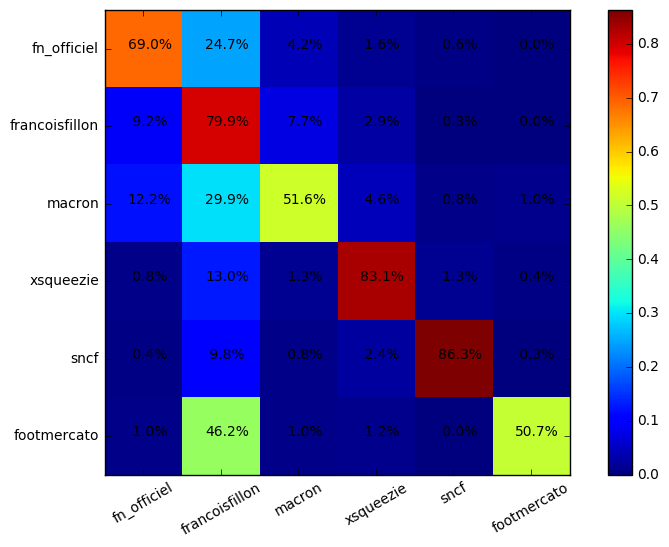

Epoch    3 : 3572.72   Test accuracy: 69.61 80.86 73.52 71.44 73.47 73.47 73.47 
Epoch    3 : 3519.74   Test accuracy: 69.55 80.81 73.47 71.44 73.47 73.50 73.39 
Epoch    3 : 3467.59   Test accuracy: 69.66 80.78 73.50 71.36 73.36 73.55 73.25 
Epoch    3 : 3416.32   Test accuracy: 69.45 80.73 73.36 71.34 73.39 73.31 73.25 
Epoch    3 : 3365.85   Test accuracy: 69.50 80.78 73.39 71.55 73.39 73.36 73.14 
Epoch    3 : 3316.13   Test accuracy: 69.39 80.59 73.44 71.52 73.33 73.31 73.04 
Epoch    3 : 3267.39   Test accuracy: 69.37 80.62 73.33 71.61 73.33 73.31 72.98 
Epoch    3 : 3219.52   Test accuracy: 69.42 80.70 73.33 71.58 73.25 73.31 72.96 
Epoch    3 : 3172.45   Test accuracy: 69.39 80.62 73.23 71.47 73.23 73.39 73.06 
Epoch    3 : 3126.15   Test accuracy: 69.42 80.62 73.23 71.47 73.09 73.33 72.90 
-------------------------------------------------
| 71.6% | 22.2% |  3.9% |  1.6% |  0.8% |  0.0% |   Total: 645
-------------------------------------------------
| 12.5% | 77.9% |  6.2% |  

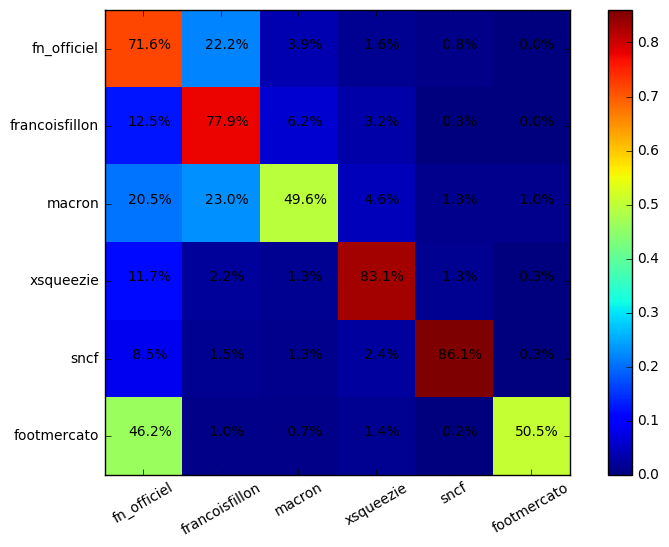

Epoch    3 : 3080.56   Test accuracy: 69.42 80.43 73.31 71.47 73.28 73.36 72.90 
Epoch    3 : 3035.66   Test accuracy: 69.34 80.35 73.28 71.44 73.25 73.31 72.85 
Epoch    3 : 2991.47   Test accuracy: 69.34 80.38 73.20 71.42 73.36 73.23 72.77 
Epoch    3 : 2948.02   Test accuracy: 69.39 80.27 73.20 71.36 73.31 73.14 72.69 
Epoch    3 : 2905.33   Test accuracy: 69.50 80.19 73.09 71.28 73.20 73.14 72.71 
Epoch    3 : 2863.42   Test accuracy: 69.42 80.35 73.12 71.31 73.17 73.12 72.63 
Epoch    3 : 2822.29   Test accuracy: 69.50 80.38 73.04 71.28 73.04 73.17 72.71 
Epoch    3 : 2781.87   Test accuracy: 69.45 80.27 73.04 71.20 73.12 73.14 72.79 
Epoch    3 : 2742.12   Test accuracy: 69.37 80.19 72.93 71.07 72.98 73.12 72.74 
Epoch    3 : 2702.98   Test accuracy: 69.28 80.22 73.01 70.96 72.93 73.09 72.69 
-------------------------------------------------
| 70.7% | 22.6% |  4.3% |  1.6% |  0.8% |  0.0% |   Total: 645
-------------------------------------------------
| 13.0% | 78.6% |  5.2% |  

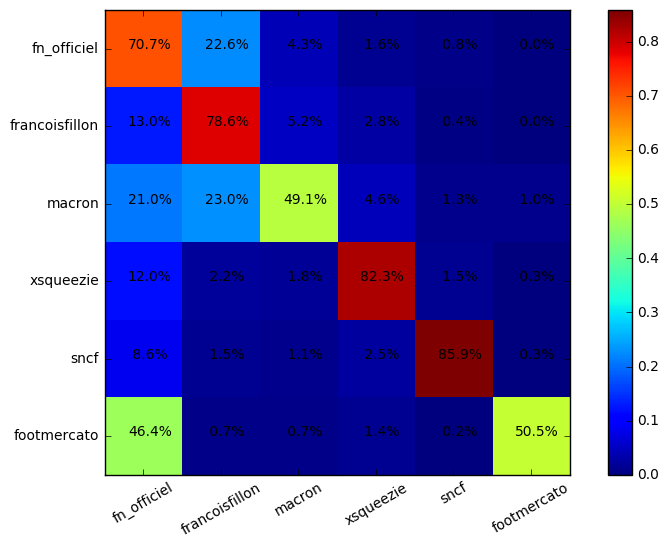

##################### 5 - Essai 4 ###################
Epoch    3 : 8556.81   Test accuracy: 66.45 77.30 70.39 68.45 70.31 70.26 70.23 
Epoch    3 : 7800.83   Test accuracy: 67.75 78.25 71.39 69.45 71.34 71.31 71.07 
Epoch    3 : 7438.87   Test accuracy: 68.53 78.54 71.77 69.88 71.85 71.88 71.66 
Epoch    3 : 7163.18   Test accuracy: 68.80 78.95 72.31 70.26 72.15 72.47 71.93 
Epoch    3 : 6924.66   Test accuracy: 68.88 78.95 72.77 70.74 72.60 72.87 72.50 
Epoch    3 : 6712.07   Test accuracy: 69.15 79.11 72.66 70.69 72.58 72.71 72.44 
Epoch    3 : 6519.95   Test accuracy: 69.20 79.51 72.96 71.07 72.87 73.01 72.63 
Epoch    3 : 6343.26   Test accuracy: 69.28 79.51 73.01 70.99 72.93 73.12 72.66 
Epoch    3 : 6178.20   Test accuracy: 69.34 79.57 73.06 71.26 72.85 73.06 72.60 
Epoch    3 : 6023.56   Test accuracy: 69.53 79.81 73.23 71.36 73.06 73.20 72.90 
-------------------------------------------------
| 68.4% | 22.3% |  7.3% |  1.4% |  0.5% |  0.2% |   Total: 645
-----------------------

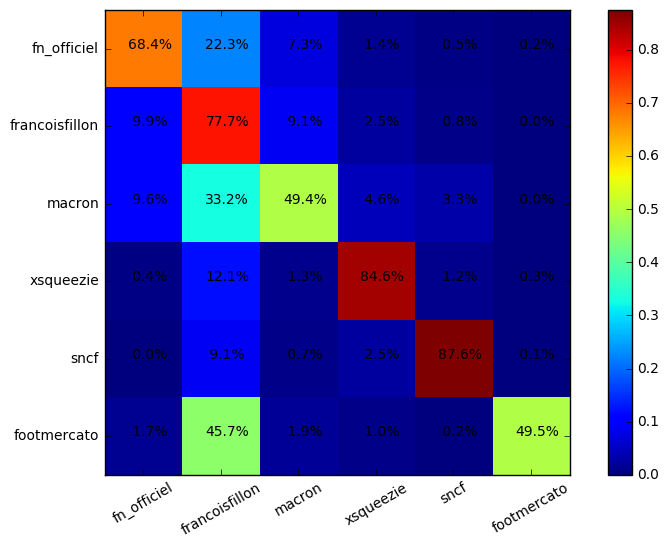

Epoch    3 : 5878.54   Test accuracy: 69.61 79.92 73.41 71.44 73.25 73.47 73.14 
Epoch    3 : 5742.53   Test accuracy: 69.55 79.70 73.36 71.42 73.23 73.36 72.96 
Epoch    3 : 5614.50   Test accuracy: 69.47 79.51 73.20 71.26 73.17 73.25 72.66 
Epoch    3 : 5493.70   Test accuracy: 69.37 79.81 73.23 71.36 72.98 73.23 72.50 
Epoch    3 : 5378.94   Test accuracy: 69.37 79.87 73.14 71.17 72.93 73.28 72.50 
Epoch    3 : 5269.73   Test accuracy: 69.34 79.97 73.06 71.04 72.96 73.28 72.69 
Epoch    3 : 5165.65   Test accuracy: 69.28 79.68 73.14 71.04 73.12 73.23 72.69 
Epoch    3 : 5065.94   Test accuracy: 69.15 79.78 72.98 71.04 72.98 73.20 72.60 
Epoch    3 : 4969.90   Test accuracy: 69.07 79.87 72.90 70.96 72.74 72.93 72.39 
Epoch    3 : 4877.15   Test accuracy: 69.10 79.89 72.79 70.96 72.82 72.85 72.31 
-------------------------------------------------
| 68.2% | 24.0% |  6.2% |  1.2% |  0.2% |  0.2% |   Total: 645
-------------------------------------------------
|  9.2% | 76.6% | 10.6% |  

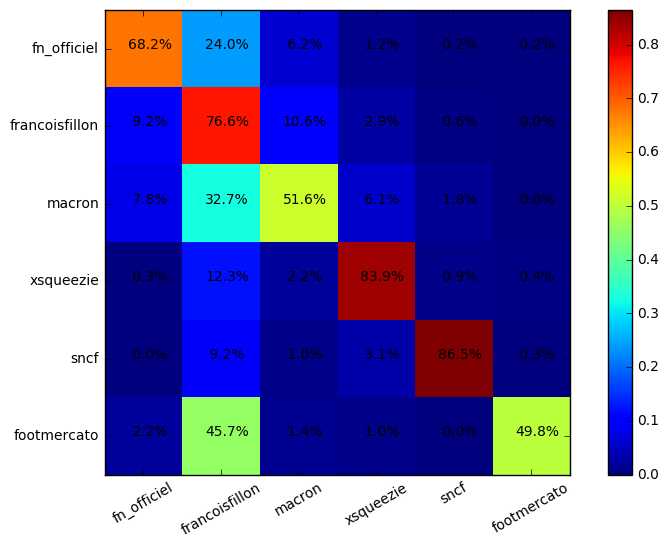

Epoch    3 : 4787.37   Test accuracy: 69.18 79.84 72.69 70.72 72.60 72.90 72.33 
Epoch    3 : 4700.14   Test accuracy: 69.20 79.92 72.71 70.74 72.63 72.87 72.28 
Epoch    3 : 4615.24   Test accuracy: 69.28 79.84 72.66 70.66 72.63 72.74 72.17 
Epoch    3 : 4532.58   Test accuracy: 69.34 80.03 72.60 70.53 72.58 72.74 72.15 
Epoch    3 : 4452.19   Test accuracy: 69.26 80.03 72.79 70.72 72.71 72.82 72.25 
Epoch    3 : 4374.09   Test accuracy: 69.12 79.81 72.69 70.69 72.58 72.85 72.15 
Epoch    3 : 4298.20   Test accuracy: 69.04 79.95 72.79 70.82 72.74 72.96 72.23 
Epoch    3 : 4224.35   Test accuracy: 69.07 79.87 72.63 70.80 72.52 72.74 72.20 
Epoch    3 : 4152.50   Test accuracy: 68.88 79.92 72.60 70.66 72.50 72.71 72.09 
Epoch    3 : 4082.62   Test accuracy: 68.99 79.95 72.47 70.58 72.39 72.58 72.20 
-------------------------------------------------
| 65.9% | 25.9% |  6.4% |  1.6% |  0.2% |  0.2% |   Total: 645
-------------------------------------------------
|  9.5% | 76.2% | 11.0% |  

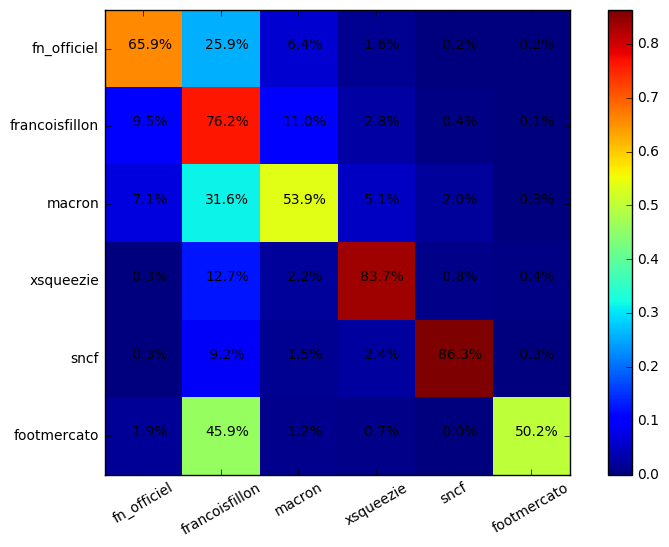

Epoch    3 : 4014.65   Test accuracy: 68.64 79.92 72.47 70.63 72.55 72.47 72.25 
Epoch    3 : 3948.52   Test accuracy: 68.69 79.89 72.42 70.61 72.33 72.50 72.17 
Epoch    3 : 3884.12   Test accuracy: 68.58 79.87 72.42 70.63 72.31 72.47 72.15 
Epoch    3 : 3821.34   Test accuracy: 68.58 79.87 72.44 70.58 72.36 72.36 72.15 
Epoch    3 : 3760.09   Test accuracy: 68.58 79.95 72.47 70.66 72.39 72.47 72.20 
Epoch    3 : 3700.30   Test accuracy: 68.58 80.00 72.33 70.53 72.39 72.50 72.12 
Epoch    3 : 3641.95   Test accuracy: 68.61 79.89 72.33 70.50 72.33 72.42 72.04 
Epoch    3 : 3585.00   Test accuracy: 68.64 79.92 72.23 70.42 72.23 72.36 72.04 
Epoch    3 : 3529.39   Test accuracy: 68.53 79.76 72.23 70.45 72.25 72.15 71.98 
Epoch    3 : 3475.08   Test accuracy: 68.42 79.51 72.23 70.34 72.20 72.17 72.15 
-------------------------------------------------
| 65.6% | 25.7% |  6.5% |  1.7% |  0.3% |  0.2% |   Total: 645
-------------------------------------------------
| 10.0% | 75.9% | 10.7% |  

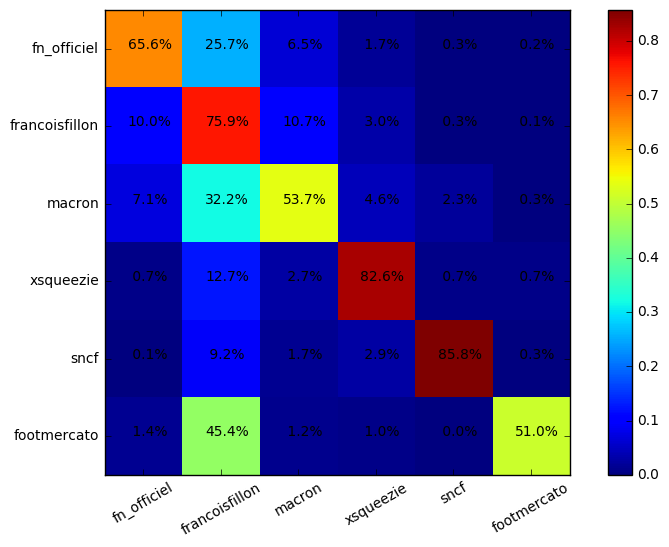

Epoch    3 : 3421.92   Test accuracy: 68.45 79.49 72.15 70.26 72.06 72.04 72.17 
Epoch    3 : 3369.56   Test accuracy: 68.31 79.43 72.01 70.28 72.17 71.96 72.15 
Epoch    3 : 3319.13   Test accuracy: 68.26 79.30 72.09 70.36 72.25 72.01 72.06 
Epoch    3 : 3269.76   Test accuracy: 68.21 79.22 72.04 70.45 72.23 72.01 72.09 
Epoch    3 : 3221.26   Test accuracy: 68.10 79.43 72.09 70.39 72.06 72.06 72.15 
Epoch    3 : 3173.63   Test accuracy: 68.10 79.41 71.98 70.20 71.96 71.88 72.12 
Epoch    3 : 3126.76   Test accuracy: 68.15 79.49 71.93 70.15 71.90 71.88 72.15 
Epoch    3 : 3080.62   Test accuracy: 68.10 79.46 71.85 70.20 71.85 71.93 72.06 
Epoch    3 : 3035.18   Test accuracy: 68.07 79.35 71.98 70.23 72.01 71.96 72.01 
Epoch    3 : 2990.49   Test accuracy: 68.07 79.46 72.06 70.20 71.98 72.06 72.06 
-------------------------------------------------
| 64.8% | 27.1% |  6.2% |  1.4% |  0.3% |  0.2% |   Total: 645
-------------------------------------------------
|  9.1% | 76.2% | 11.0% |  

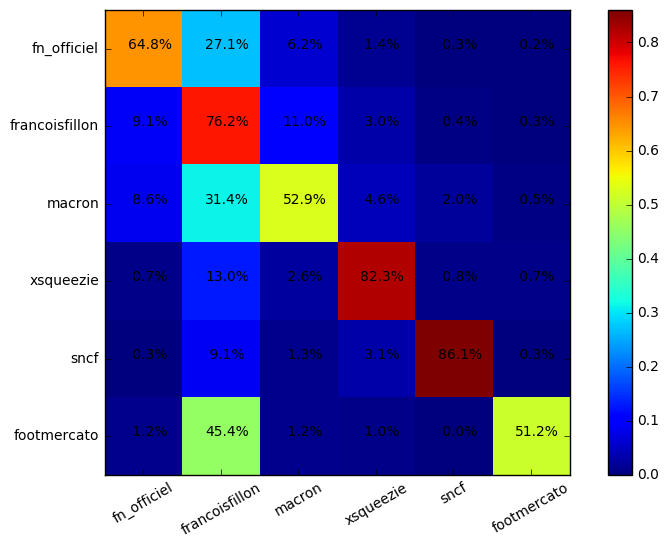

Epoch    3 : 2946.58   Test accuracy: 68.04 79.54 71.98 70.20 72.01 71.98 72.06 
Epoch    3 : 2903.47   Test accuracy: 68.07 79.46 72.01 70.18 72.12 71.96 71.96 
Epoch    3 : 2861.44   Test accuracy: 68.18 79.43 72.04 70.15 72.04 71.98 71.74 
Epoch    3 : 2820.42   Test accuracy: 68.15 79.43 71.98 70.23 71.90 71.98 71.69 
Epoch    3 : 2780.33   Test accuracy: 68.12 79.51 71.90 70.18 71.90 71.93 71.66 
Epoch    3 : 2741.08   Test accuracy: 68.02 79.38 72.01 70.18 71.98 71.58 71.77 
Epoch    3 : 2702.63   Test accuracy: 67.99 79.49 72.04 70.28 72.01 71.63 71.69 
Epoch    3 : 2664.91   Test accuracy: 68.04 79.49 72.06 70.28 72.04 71.66 71.69 
Epoch    3 : 2627.90   Test accuracy: 68.07 79.49 72.06 70.15 71.88 71.55 71.69 
Epoch    3 : 2591.56   Test accuracy: 67.99 79.51 71.93 70.04 71.82 71.39 71.77 
-------------------------------------------------
| 64.7% | 28.4% |  5.3% |  1.1% |  0.5% |  0.2% |   Total: 645
-------------------------------------------------
|  9.1% | 77.0% |  9.9% |  

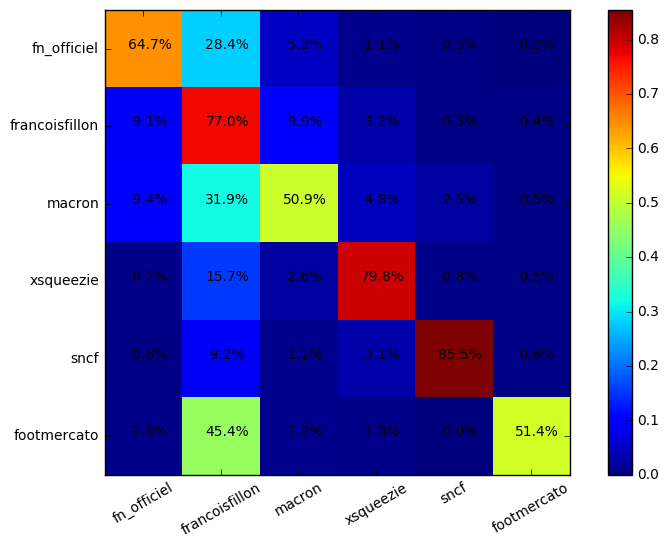

##################### 6 - Essai 0 ###################
Epoch    3 : 5350.10   Test accuracy: 68.27 71.11 70.50 69.02 70.54 70.50 70.22 
Epoch    3 : 4715.94   Test accuracy: 70.18 72.82 72.41 70.97 72.25 72.63 71.86 
Epoch    3 : 4505.76   Test accuracy: 70.29 73.66 72.82 71.31 72.66 73.00 72.54 
Epoch    3 : 4380.81   Test accuracy: 70.86 73.84 73.27 71.91 72.98 73.50 72.61 
Epoch    3 : 4291.49   Test accuracy: 71.06 74.25 73.48 72.20 73.52 73.79 73.00 
Epoch    3 : 4222.37   Test accuracy: 71.18 74.75 73.75 72.34 73.64 74.09 73.57 
Epoch    3 : 4165.81   Test accuracy: 71.43 75.07 74.23 72.75 74.09 74.43 73.75 
Epoch    3 : 4117.87   Test accuracy: 71.88 75.09 74.45 73.00 74.34 74.66 73.98 
Epoch    3 : 4076.35   Test accuracy: 72.07 75.07 74.73 73.20 74.61 74.89 74.00 
Epoch    3 : 4039.94   Test accuracy: 71.95 75.20 74.86 73.36 74.77 75.07 74.27 
-------------------------------------------------
| 81.2% | 13.0% |  3.5% |  1.6% |  0.6% |  0.0% |   Total: 799
-----------------------

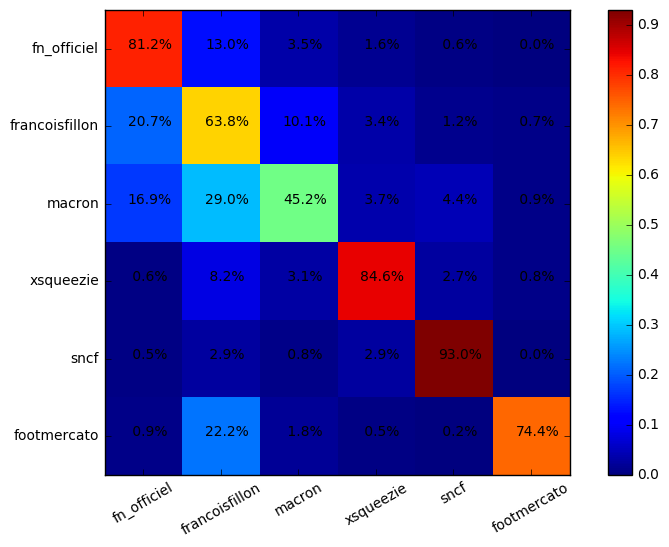

Epoch    3 : 4007.66   Test accuracy: 71.84 75.43 75.14 73.45 74.89 75.27 74.27 
Epoch    3 : 3978.69   Test accuracy: 72.16 75.48 75.20 73.59 75.11 75.30 74.32 
Epoch    3 : 3952.31   Test accuracy: 72.25 75.55 75.39 73.91 75.41 75.48 74.43 
Epoch    3 : 3928.01   Test accuracy: 72.32 75.73 75.64 73.86 75.50 75.64 74.59 
Epoch    3 : 3905.41   Test accuracy: 72.47 75.82 75.64 74.02 75.48 75.64 74.80 
Epoch    3 : 3884.24   Test accuracy: 72.43 75.89 75.73 74.07 75.48 75.77 75.00 
Epoch    3 : 3864.36   Test accuracy: 72.57 75.93 75.73 74.20 75.48 75.89 75.00 
Epoch    3 : 3845.66   Test accuracy: 72.52 76.07 75.66 74.11 75.71 75.93 75.11 
Epoch    3 : 3828.05   Test accuracy: 72.57 76.39 75.73 74.16 75.75 75.98 75.32 
Epoch    3 : 3811.46   Test accuracy: 72.59 76.52 75.80 74.25 75.80 76.05 75.43 
-------------------------------------------------
| 82.1% | 12.3% |  3.6% |  1.6% |  0.4% |  0.0% |   Total: 799
-------------------------------------------------
| 18.6% | 66.6% | 10.1% |  

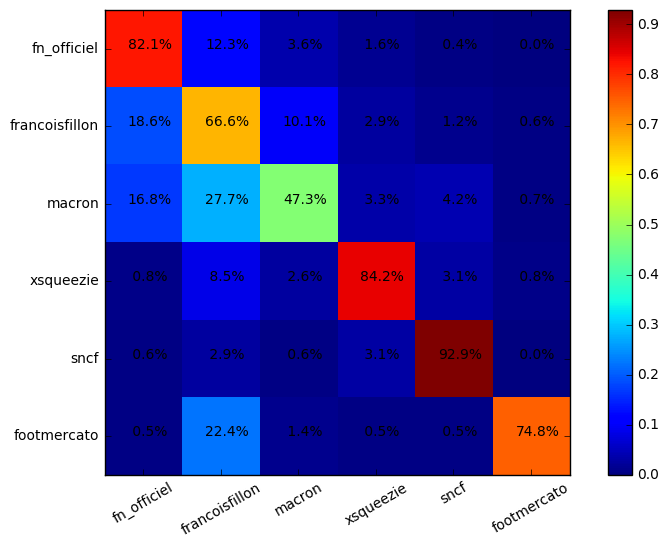

Epoch    3 : 3795.81   Test accuracy: 72.52 76.57 75.86 74.34 75.84 76.05 75.45 
Epoch    3 : 3781.05   Test accuracy: 72.66 76.59 75.93 74.39 75.82 76.25 75.57 
Epoch    3 : 3767.13   Test accuracy: 72.82 76.59 76.05 74.48 75.96 76.27 75.64 
Epoch    3 : 3753.98   Test accuracy: 72.91 76.71 76.00 74.41 75.96 76.21 75.61 
Epoch    3 : 3741.53   Test accuracy: 72.93 76.64 76.05 74.50 75.98 76.23 75.73 
Epoch    3 : 3729.71   Test accuracy: 73.02 76.57 76.11 74.55 76.07 76.32 75.71 
Epoch    3 : 3718.44   Test accuracy: 73.13 76.62 76.11 74.70 76.16 76.36 75.64 
Epoch    3 : 3707.70   Test accuracy: 73.23 76.57 76.11 74.70 76.23 76.30 75.71 
Epoch    3 : 3697.42   Test accuracy: 73.20 76.59 76.18 74.80 76.21 76.39 75.73 
Epoch    3 : 3687.57   Test accuracy: 73.25 76.64 76.16 74.89 76.11 76.34 75.82 
-------------------------------------------------
| 82.0% | 12.3% |  3.8% |  1.6% |  0.4% |  0.0% |   Total: 799
-------------------------------------------------
| 16.8% | 67.8% | 10.5% |  

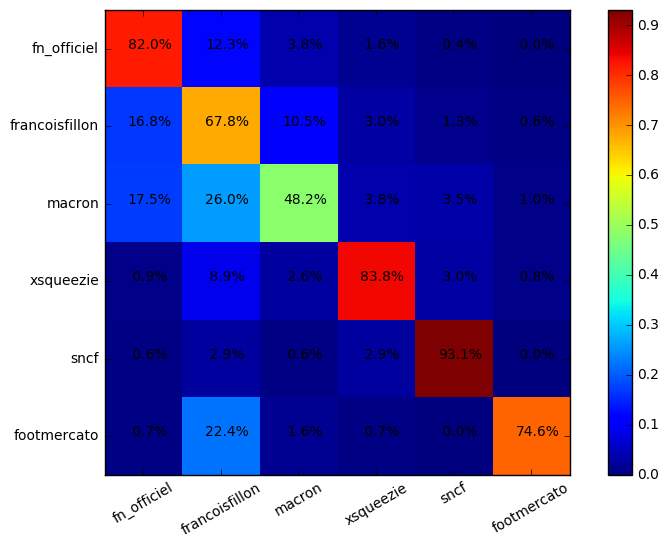

Epoch    3 : 3678.11   Test accuracy: 73.20 76.66 76.11 74.77 76.14 76.32 75.93 
Epoch    3 : 3669.00   Test accuracy: 73.32 76.66 76.16 74.70 76.18 76.39 75.96 
Epoch    3 : 3660.20   Test accuracy: 73.27 76.66 76.25 74.75 76.27 76.34 76.02 
Epoch    3 : 3651.69   Test accuracy: 73.29 76.75 76.30 74.82 76.34 76.41 76.09 
Epoch    3 : 3643.43   Test accuracy: 73.36 76.77 76.41 74.95 76.43 76.52 76.05 
Epoch    3 : 3635.41   Test accuracy: 73.38 76.87 76.43 75.02 76.46 76.55 75.98 
Epoch    3 : 3627.61   Test accuracy: 73.41 76.93 76.50 74.95 76.43 76.62 76.02 
Epoch    3 : 3620.00   Test accuracy: 73.38 76.96 76.57 74.98 76.48 76.59 76.09 
Epoch    3 : 3612.58   Test accuracy: 73.43 77.02 76.62 75.00 76.48 76.68 76.07 
Epoch    3 : 3605.34   Test accuracy: 73.36 77.07 76.62 75.07 76.50 76.68 76.09 
-------------------------------------------------
| 81.4% | 12.5% |  4.1% |  1.6% |  0.4% |  0.0% |   Total: 799
-------------------------------------------------
| 15.9% | 68.8% | 10.6% |  

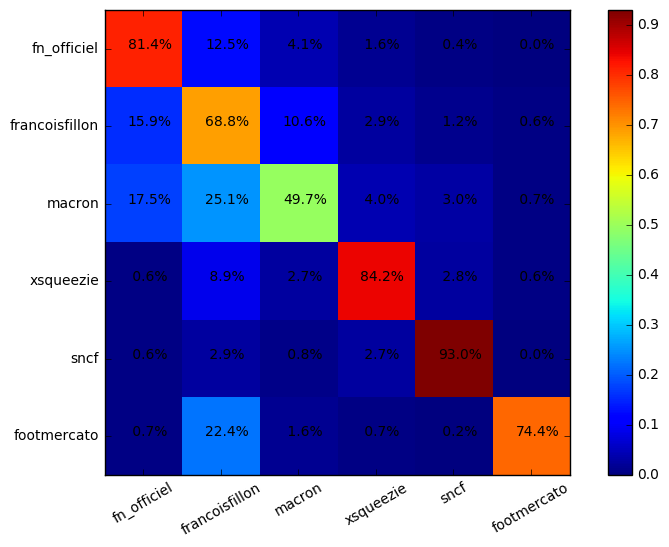

Epoch    3 : 3598.26   Test accuracy: 73.50 77.14 76.62 75.18 76.57 76.73 76.14 
Epoch    3 : 3591.34   Test accuracy: 73.54 77.02 76.71 75.16 76.57 76.73 76.07 
Epoch    3 : 3584.56   Test accuracy: 73.50 77.00 76.73 75.07 76.64 76.73 76.00 
Epoch    3 : 3577.93   Test accuracy: 73.54 77.02 76.75 75.14 76.64 76.73 75.96 
Epoch    3 : 3571.43   Test accuracy: 73.52 77.14 76.71 75.07 76.62 76.68 75.84 
Epoch    3 : 3565.06   Test accuracy: 73.45 77.18 76.71 75.02 76.59 76.71 75.93 
Epoch    3 : 3558.81   Test accuracy: 73.50 77.14 76.73 75.00 76.66 76.68 75.96 
Epoch    3 : 3552.69   Test accuracy: 73.45 77.16 76.73 75.02 76.57 76.77 76.05 
Epoch    3 : 3546.69   Test accuracy: 73.52 77.25 76.77 75.14 76.62 76.84 76.05 
Epoch    3 : 3540.81   Test accuracy: 73.45 77.23 76.82 75.07 76.57 76.91 76.07 
-------------------------------------------------
| 81.4% | 12.5% |  4.3% |  1.5% |  0.4% |  0.0% |   Total: 799
-------------------------------------------------
| 15.6% | 69.1% | 10.5% |  

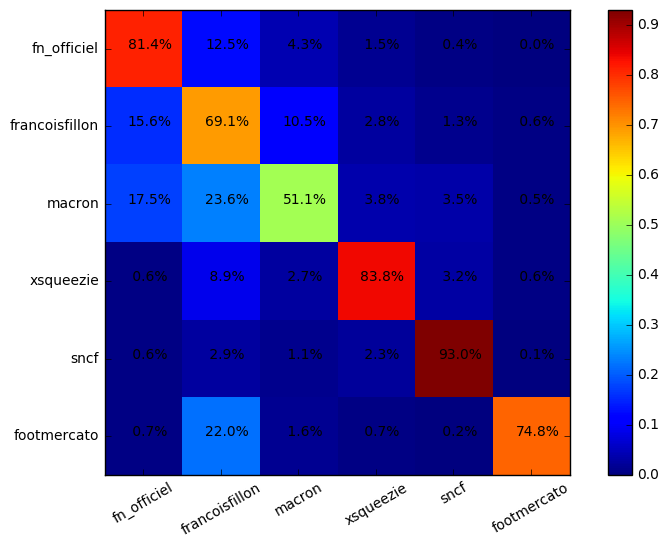

Epoch    3 : 3535.05   Test accuracy: 73.52 77.30 76.82 75.07 76.71 76.82 76.02 
Epoch    3 : 3529.40   Test accuracy: 73.54 77.34 76.75 75.16 76.73 76.77 76.09 
Epoch    3 : 3523.86   Test accuracy: 73.57 77.39 76.75 75.20 76.75 76.87 76.18 
Epoch    3 : 3518.43   Test accuracy: 73.57 77.39 76.71 75.25 76.68 76.89 76.09 
Epoch    3 : 3513.10   Test accuracy: 73.66 77.48 76.80 75.20 76.68 76.98 76.05 
Epoch    3 : 3507.88   Test accuracy: 73.75 77.57 76.80 75.23 76.75 77.05 76.07 
Epoch    3 : 3502.76   Test accuracy: 73.77 77.53 76.82 75.20 76.77 77.05 76.16 
Epoch    3 : 3497.73   Test accuracy: 73.70 77.50 76.82 75.30 76.80 76.98 76.18 
Epoch    3 : 3492.80   Test accuracy: 73.66 77.53 76.82 75.39 76.82 76.96 76.18 
Epoch    3 : 3487.95   Test accuracy: 73.64 77.57 76.82 75.36 76.80 77.00 76.21 
-------------------------------------------------
| 81.5% | 11.9% |  5.0% |  1.3% |  0.4% |  0.0% |   Total: 799
-------------------------------------------------
| 15.4% | 69.3% | 10.6% |  

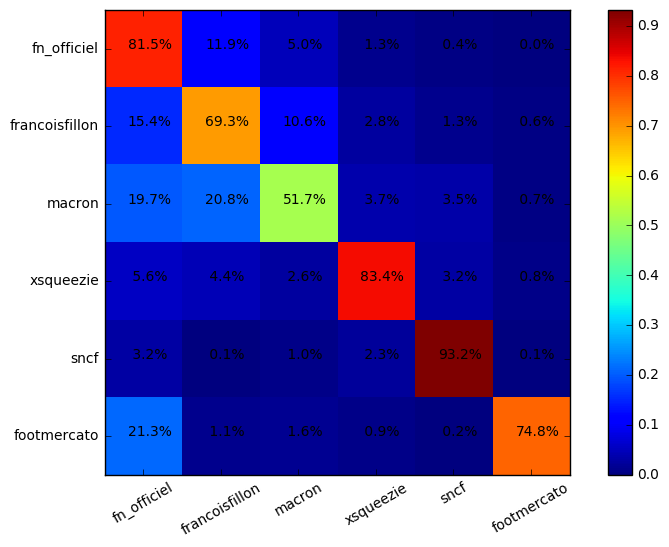

##################### 6 - Essai 1 ###################
Epoch    3 : 5216.44   Test accuracy: 67.83 71.61 70.54 69.04 70.47 70.63 70.25 
Epoch    3 : 4675.73   Test accuracy: 69.81 72.88 72.79 71.41 72.68 72.88 72.13 
Epoch    3 : 4480.33   Test accuracy: 70.56 74.11 73.61 72.02 73.41 73.68 72.84 
Epoch    3 : 4361.22   Test accuracy: 71.02 74.55 73.77 72.27 73.61 73.86 73.29 
Epoch    3 : 4274.98   Test accuracy: 71.11 74.55 73.93 72.47 73.89 74.00 73.52 
Epoch    3 : 4207.24   Test accuracy: 71.52 74.59 74.18 72.66 74.14 74.32 73.86 
Epoch    3 : 4151.71   Test accuracy: 71.68 74.95 74.57 73.20 74.32 74.68 74.04 
Epoch    3 : 4104.89   Test accuracy: 74.84 75.14 76.62 75.89 76.62 76.80 76.32 
Epoch    3 : 4064.48   Test accuracy: 75.07 75.18 76.82 76.02 76.64 76.98 76.43 
Epoch    3 : 4028.95   Test accuracy: 75.25 75.41 76.98 76.09 76.91 77.18 76.43 
-------------------------------------------------
| 79.7% | 13.6% |  4.1% |  1.3% |  0.4% |  0.9% |   Total: 799
-----------------------

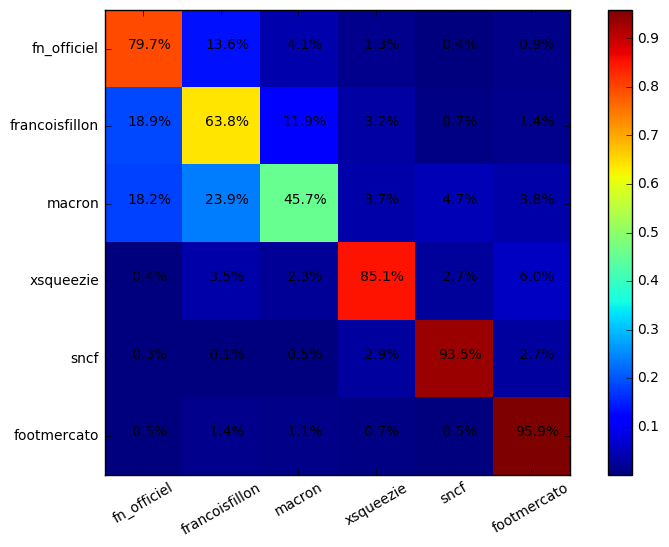

Epoch    3 : 3997.29   Test accuracy: 75.18 75.52 77.18 76.09 77.02 77.21 76.71 
Epoch    3 : 3968.77   Test accuracy: 75.36 75.64 77.25 76.43 77.21 77.32 76.75 
Epoch    3 : 3942.85   Test accuracy: 75.73 75.82 77.46 76.57 77.37 77.48 76.89 
Epoch    3 : 3919.30   Test accuracy: 75.73 75.96 77.57 76.64 77.57 77.59 77.05 
Epoch    3 : 3897.88   Test accuracy: 75.91 76.11 77.82 76.52 77.71 77.78 77.32 
Epoch    3 : 3878.26   Test accuracy: 75.96 76.14 77.84 76.68 77.93 77.84 77.48 
Epoch    3 : 3860.15   Test accuracy: 76.23 76.36 77.91 76.84 77.93 78.09 77.66 
Epoch    3 : 3843.32   Test accuracy: 76.27 76.36 77.93 76.96 77.93 78.07 77.78 
Epoch    3 : 3827.56   Test accuracy: 76.27 76.32 77.96 76.93 78.00 77.89 77.84 
Epoch    3 : 3812.73   Test accuracy: 76.39 76.46 78.00 76.98 77.87 77.98 77.87 
-------------------------------------------------
| 79.7% | 13.5% |  4.5% |  1.1% |  0.4% |  0.8% |   Total: 799
-------------------------------------------------
| 17.4% | 65.3% | 11.7% |  

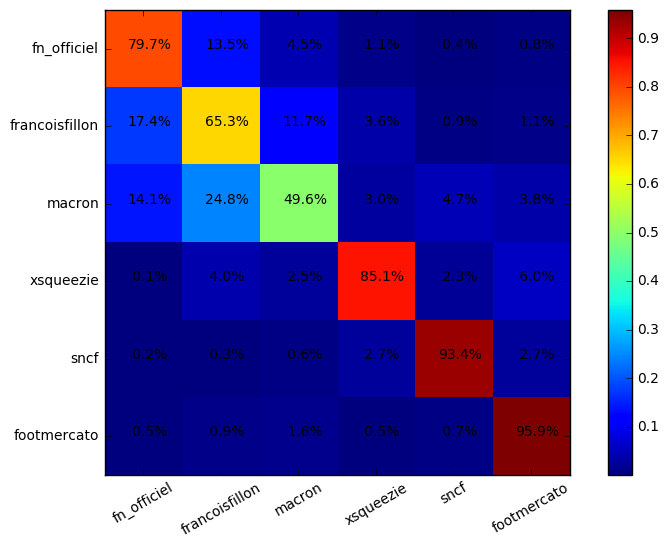

Epoch    3 : 3798.69   Test accuracy: 76.46 76.46 77.93 76.96 78.00 78.03 77.89 
Epoch    3 : 3785.34   Test accuracy: 76.48 76.39 77.89 77.00 77.93 77.93 77.84 
Epoch    3 : 3772.62   Test accuracy: 76.50 76.43 77.93 76.98 77.87 77.91 77.78 
Epoch    3 : 3760.44   Test accuracy: 76.64 76.41 77.98 77.07 77.87 78.09 77.71 
Epoch    3 : 3748.77   Test accuracy: 76.62 76.46 78.16 77.16 77.96 78.09 77.59 
Epoch    3 : 3737.56   Test accuracy: 76.68 76.62 78.09 77.14 78.07 78.09 77.59 
Epoch    3 : 3726.78   Test accuracy: 76.66 76.57 78.14 77.07 78.14 78.14 77.57 
Epoch    3 : 3716.40   Test accuracy: 76.64 76.52 78.09 77.14 78.05 78.12 77.57 
Epoch    3 : 3706.39   Test accuracy: 76.62 76.59 78.25 77.07 78.03 78.21 77.53 
Epoch    3 : 3696.75   Test accuracy: 76.64 76.62 78.28 77.07 78.23 78.23 77.55 
-------------------------------------------------
| 79.3% | 13.4% |  5.1% |  1.0% |  0.4% |  0.8% |   Total: 799
-------------------------------------------------
| 16.6% | 66.7% | 11.3% |  

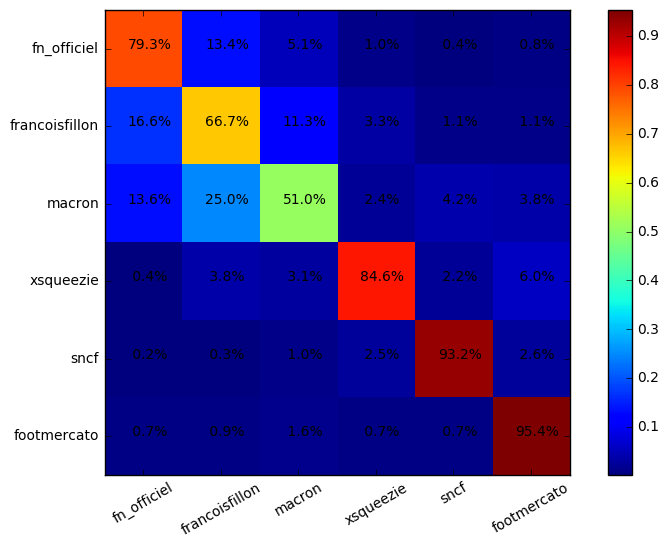

Epoch    3 : 3687.44   Test accuracy: 76.75 76.62 78.25 77.14 78.21 78.21 77.64 
Epoch    3 : 3678.44   Test accuracy: 76.82 76.68 78.30 77.21 78.28 78.28 77.71 
Epoch    3 : 3669.75   Test accuracy: 76.66 76.64 78.25 77.23 78.28 78.25 77.68 
Epoch    3 : 3661.34   Test accuracy: 76.62 76.71 78.32 77.34 78.23 78.37 77.73 
Epoch    3 : 3653.19   Test accuracy: 76.66 76.68 78.37 77.23 78.18 78.39 77.78 
Epoch    3 : 3645.30   Test accuracy: 76.80 76.71 78.32 77.23 78.23 78.48 77.80 
Epoch    3 : 3637.65   Test accuracy: 76.80 76.68 78.48 77.30 78.32 78.53 77.84 
Epoch    3 : 3630.23   Test accuracy: 76.77 76.66 78.43 77.18 78.32 78.46 77.80 
Epoch    3 : 3623.02   Test accuracy: 76.80 76.73 78.43 77.21 78.32 78.50 77.89 
Epoch    3 : 3616.01   Test accuracy: 76.80 76.77 78.46 77.34 78.32 78.53 77.93 
-------------------------------------------------
| 78.8% | 13.9% |  5.0% |  1.0% |  0.5% |  0.8% |   Total: 799
-------------------------------------------------
| 16.0% | 67.8% | 10.7% |  

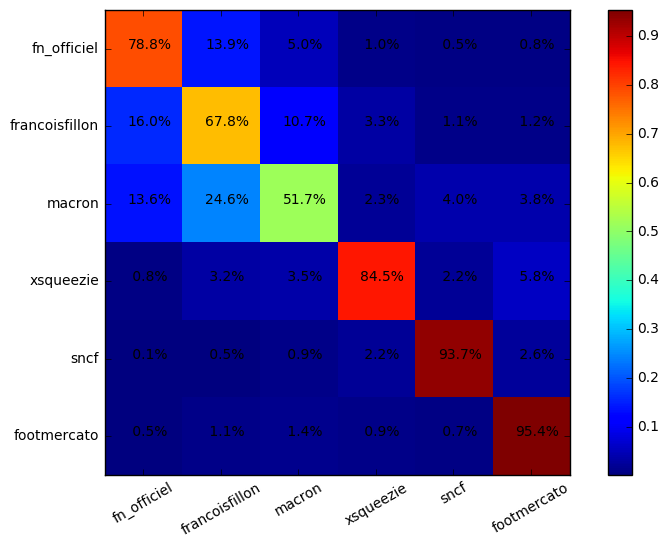

Epoch    3 : 3609.19   Test accuracy: 76.75 76.82 78.53 77.39 78.50 78.62 77.91 
Epoch    3 : 3602.56   Test accuracy: 76.73 76.77 78.53 77.53 78.53 78.57 77.87 
Epoch    3 : 3596.09   Test accuracy: 76.82 76.75 78.62 77.55 78.59 78.64 77.89 
Epoch    3 : 3589.79   Test accuracy: 76.80 76.84 78.71 77.55 78.64 78.71 78.00 
Epoch    3 : 3583.63   Test accuracy: 76.82 76.89 78.66 77.62 78.64 78.69 78.05 
Epoch    3 : 3577.61   Test accuracy: 76.80 76.87 78.71 77.59 78.69 78.82 78.16 
Epoch    3 : 3571.73   Test accuracy: 76.80 76.84 78.80 77.68 78.64 78.96 78.14 
Epoch    3 : 3565.96   Test accuracy: 76.82 76.80 78.75 77.66 78.71 78.91 78.18 
Epoch    3 : 3560.31   Test accuracy: 76.80 76.82 78.84 77.71 78.73 78.94 78.23 
Epoch    3 : 3554.76   Test accuracy: 76.87 76.80 78.87 77.71 78.71 78.96 78.21 
-------------------------------------------------
| 79.3% | 13.3% |  5.0% |  1.1% |  0.5% |  0.8% |   Total: 799
-------------------------------------------------
| 15.2% | 68.7% | 10.6% |  

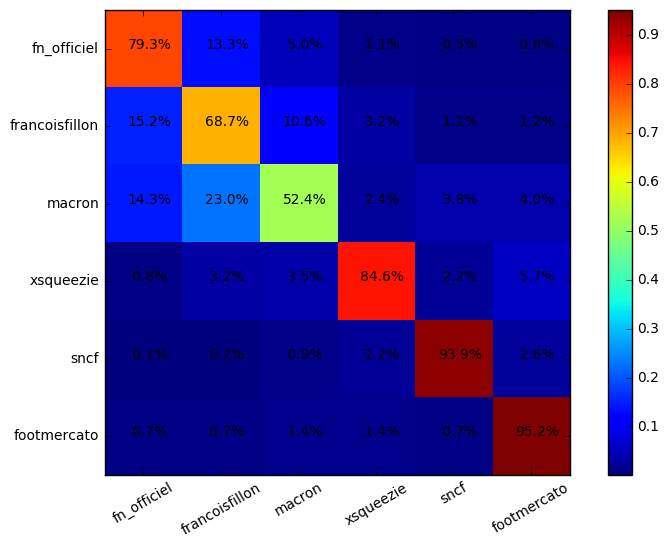

Epoch    3 : 3549.31   Test accuracy: 76.82 76.84 78.80 77.57 78.69 79.05 78.18 
Epoch    3 : 3543.96   Test accuracy: 76.77 76.82 78.75 77.64 78.69 79.00 78.25 
Epoch    3 : 3538.69   Test accuracy: 76.75 76.80 78.71 77.66 78.62 79.03 78.25 
Epoch    3 : 3533.50   Test accuracy: 76.68 76.80 78.78 77.68 78.66 79.00 78.25 
Epoch    3 : 3528.38   Test accuracy: 76.66 76.82 78.80 77.71 78.71 78.98 78.25 
Epoch    3 : 3523.33   Test accuracy: 76.68 76.80 78.84 77.73 78.69 79.03 78.30 
Epoch    3 : 3518.35   Test accuracy: 76.71 76.82 78.89 77.78 78.71 78.98 78.23 
Epoch    3 : 3513.43   Test accuracy: 76.68 76.87 78.94 77.73 78.71 78.96 78.21 
Epoch    3 : 3508.57   Test accuracy: 76.66 76.82 78.94 77.73 78.82 78.98 78.25 
Epoch    3 : 3503.76   Test accuracy: 76.66 76.82 78.89 77.68 78.78 78.89 78.21 
-------------------------------------------------
| 80.0% | 12.9% |  4.6% |  1.3% |  0.5% |  0.8% |   Total: 799
-------------------------------------------------
| 15.6% | 67.7% | 11.4% |  

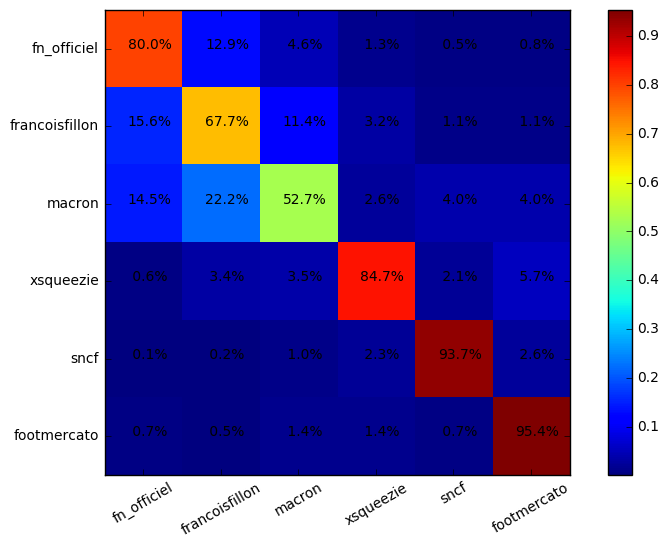

##################### 6 - Essai 2 ###################
Epoch    3 : 5226.75   Test accuracy: 68.38 71.79 70.93 69.56 70.84 70.95 70.43 
Epoch    3 : 4718.38   Test accuracy: 70.40 73.27 72.73 71.25 72.34 72.86 72.16 
Epoch    3 : 4522.38   Test accuracy: 70.68 73.89 73.29 72.04 73.38 73.34 73.04 
Epoch    3 : 4403.44   Test accuracy: 70.93 74.32 73.75 72.32 73.57 73.77 73.25 
Epoch    3 : 4318.07   Test accuracy: 71.57 74.75 74.09 72.66 73.89 74.02 73.68 
Epoch    3 : 4251.74   Test accuracy: 74.23 75.14 76.02 74.82 75.93 76.14 75.55 
Epoch    3 : 4198.18   Test accuracy: 74.66 75.52 76.32 75.14 76.30 76.55 76.21 
Epoch    3 : 4153.56   Test accuracy: 74.84 75.73 76.59 75.66 76.62 76.96 76.64 
Epoch    3 : 4115.23   Test accuracy: 75.20 75.84 76.91 75.93 76.89 77.12 76.80 
Epoch    3 : 4081.13   Test accuracy: 75.27 75.91 77.23 76.30 77.07 77.46 76.98 
-------------------------------------------------
| 81.9% | 10.3% |  5.4% |  1.4% |  0.4% |  0.8% |   Total: 799
-----------------------

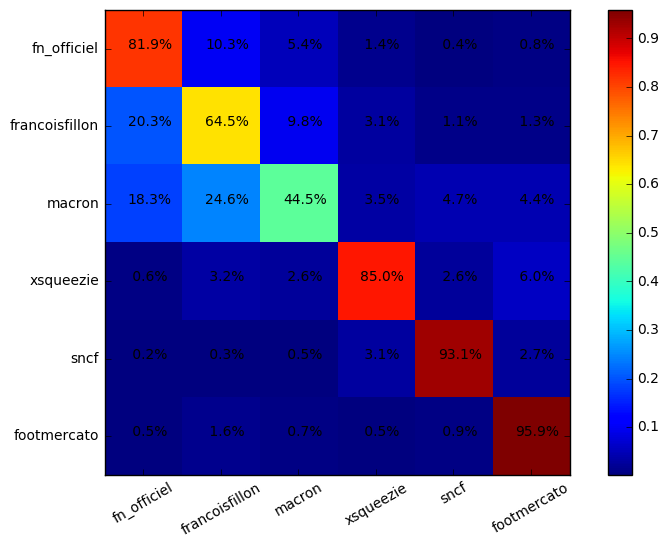

Epoch    3 : 4050.10   Test accuracy: 75.45 75.93 77.43 76.34 77.23 77.57 77.07 
Epoch    3 : 4021.45   Test accuracy: 75.52 76.14 77.43 76.21 77.32 77.48 76.96 
Epoch    3 : 3994.76   Test accuracy: 75.61 76.16 77.55 76.30 77.21 77.57 77.07 
Epoch    3 : 3969.73   Test accuracy: 75.80 76.27 77.68 76.27 77.39 77.71 77.09 
Epoch    3 : 3946.16   Test accuracy: 75.77 76.23 77.78 76.46 77.50 77.84 77.18 
Epoch    3 : 3923.92   Test accuracy: 75.80 76.30 77.96 76.57 77.71 77.87 77.21 
Epoch    3 : 3902.89   Test accuracy: 75.82 76.30 77.93 76.71 77.73 77.98 77.18 
Epoch    3 : 3882.99   Test accuracy: 75.84 76.32 77.96 76.82 77.82 78.00 77.34 
Epoch    3 : 3864.15   Test accuracy: 75.82 76.27 77.96 76.89 77.91 78.09 77.50 
Epoch    3 : 3846.31   Test accuracy: 75.86 76.39 77.98 76.89 77.93 78.07 77.55 
-------------------------------------------------
| 79.7% | 11.9% |  6.3% |  1.0% |  0.4% |  0.8% |   Total: 799
-------------------------------------------------
| 18.3% | 66.8% |  9.7% |  

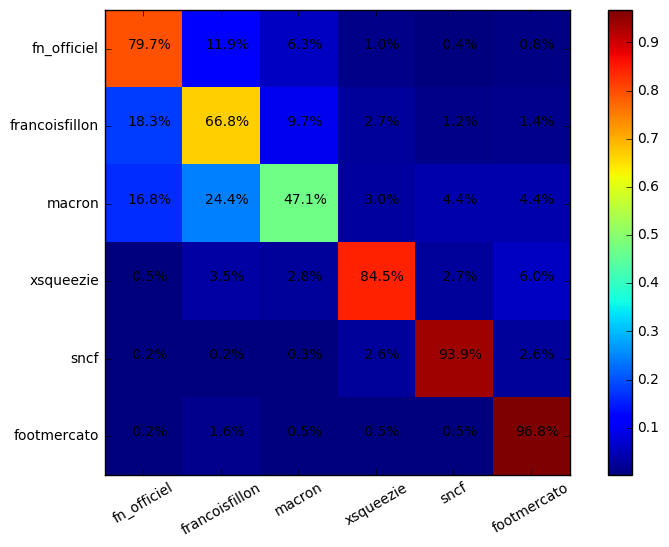

Epoch    3 : 3829.39   Test accuracy: 75.84 76.36 77.98 76.96 78.07 78.07 77.62 
Epoch    3 : 3813.40   Test accuracy: 75.89 76.36 78.16 77.05 78.05 78.28 77.62 
Epoch    3 : 3798.32   Test accuracy: 75.93 76.32 78.14 77.09 78.05 78.25 77.62 
Epoch    3 : 3784.03   Test accuracy: 75.93 76.36 78.16 77.00 78.18 78.25 77.59 
Epoch    3 : 3770.42   Test accuracy: 75.91 76.23 78.18 76.98 78.09 78.25 77.62 
Epoch    3 : 3757.45   Test accuracy: 75.89 76.30 78.12 77.12 77.98 78.16 77.59 
Epoch    3 : 3745.06   Test accuracy: 75.89 76.36 78.09 77.07 77.93 78.16 77.66 
Epoch    3 : 3733.19   Test accuracy: 75.96 76.50 78.16 77.09 77.89 78.18 77.73 
Epoch    3 : 3721.77   Test accuracy: 75.91 76.66 78.14 76.96 78.00 78.25 77.62 
Epoch    3 : 3710.76   Test accuracy: 75.96 76.62 78.14 76.93 77.96 78.16 77.66 
-------------------------------------------------
| 79.8% | 11.8% |  6.0% |  1.1% |  0.5% |  0.8% |   Total: 799
-------------------------------------------------
| 17.8% | 66.7% | 10.2% |  

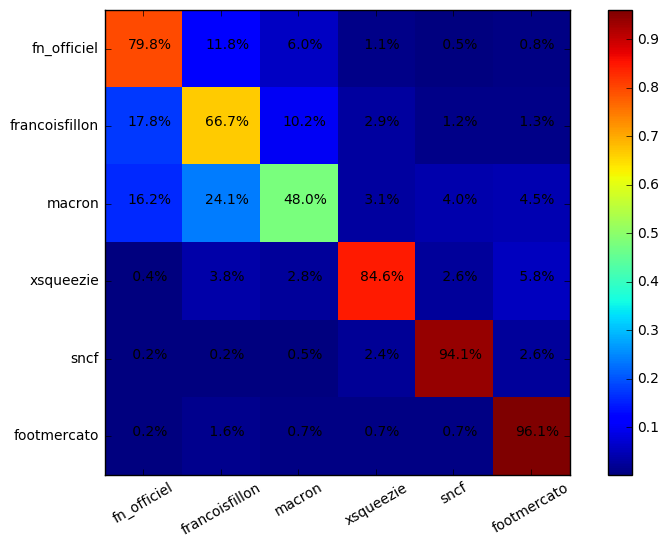

Epoch    3 : 3700.12   Test accuracy: 75.89 76.64 78.14 76.98 77.98 78.16 77.68 
Epoch    3 : 3689.79   Test accuracy: 75.93 76.66 78.16 76.98 78.00 78.23 77.71 
Epoch    3 : 3679.75   Test accuracy: 75.93 76.64 78.18 77.00 77.93 78.21 77.66 
Epoch    3 : 3669.98   Test accuracy: 76.18 76.73 78.16 77.16 77.96 78.14 77.71 
Epoch    3 : 3660.44   Test accuracy: 76.14 76.66 78.12 77.12 78.00 78.18 77.68 
Epoch    3 : 3651.12   Test accuracy: 76.23 76.68 78.07 77.05 78.07 78.16 77.66 
Epoch    3 : 3642.01   Test accuracy: 76.34 76.68 78.18 77.02 78.09 78.23 77.68 
Epoch    3 : 3633.09   Test accuracy: 76.39 76.62 78.16 77.05 78.23 78.37 77.73 
Epoch    3 : 3624.35   Test accuracy: 76.43 76.57 78.23 77.12 78.25 78.41 77.80 
Epoch    3 : 3615.78   Test accuracy: 76.52 76.59 78.34 77.12 78.21 78.34 77.91 
-------------------------------------------------
| 79.6% | 12.3% |  5.8% |  1.1% |  0.5% |  0.8% |   Total: 799
-------------------------------------------------
| 17.7% | 66.7% | 10.3% |  

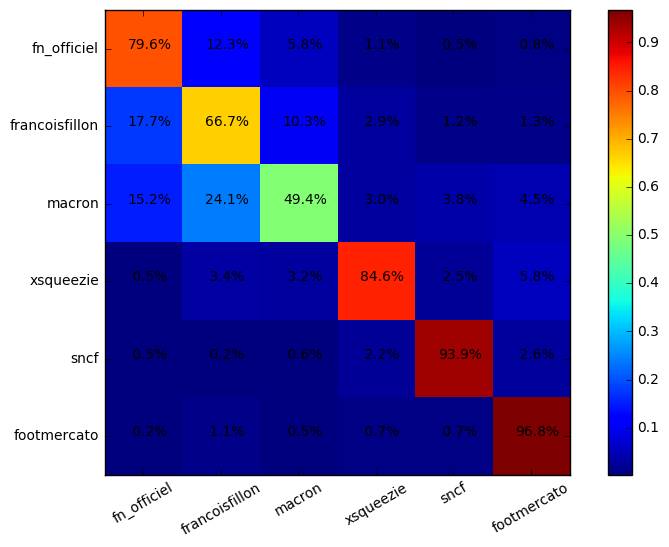

Epoch    3 : 3607.37   Test accuracy: 76.55 76.73 78.39 77.16 78.21 78.34 77.96 
Epoch    3 : 3599.12   Test accuracy: 76.68 76.82 78.34 77.14 78.28 78.34 77.96 
Epoch    3 : 3591.02   Test accuracy: 76.66 76.82 78.41 77.27 78.34 78.39 77.96 
Epoch    3 : 3583.06   Test accuracy: 76.64 76.84 78.32 77.30 78.30 78.41 77.96 
Epoch    3 : 3575.24   Test accuracy: 76.73 76.80 78.32 77.39 78.30 78.46 78.03 
Epoch    3 : 3567.56   Test accuracy: 76.82 76.91 78.30 77.39 78.32 78.50 77.93 
Epoch    3 : 3560.00   Test accuracy: 76.82 76.98 78.28 77.43 78.25 78.43 77.93 
Epoch    3 : 3552.57   Test accuracy: 76.89 76.98 78.14 77.48 78.25 78.46 77.96 
Epoch    3 : 3545.26   Test accuracy: 76.80 77.02 78.16 77.50 78.30 78.59 77.96 
Epoch    3 : 3538.07   Test accuracy: 76.73 77.12 78.23 77.53 78.30 78.53 77.93 
-------------------------------------------------
| 79.2% | 12.5% |  5.9% |  1.1% |  0.5% |  0.8% |   Total: 799
-------------------------------------------------
| 17.2% | 67.3% | 10.0% |  

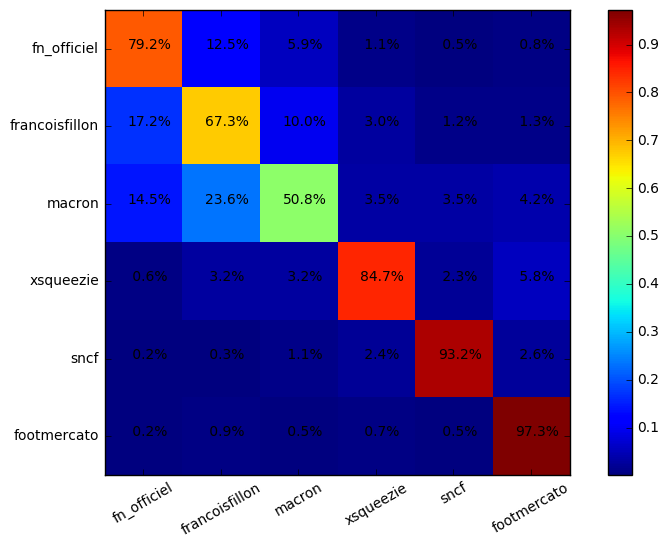

Epoch    3 : 3531.02   Test accuracy: 76.75 77.02 78.37 77.64 78.32 78.59 77.98 
Epoch    3 : 3524.10   Test accuracy: 76.68 76.87 78.41 77.55 78.32 78.64 77.98 
Epoch    3 : 3517.30   Test accuracy: 76.75 76.87 78.43 77.55 78.37 78.73 77.93 
Epoch    3 : 3510.64   Test accuracy: 76.73 76.89 78.48 77.62 78.43 78.71 77.98 
Epoch    3 : 3504.14   Test accuracy: 76.77 77.00 78.62 77.55 78.46 78.80 77.96 
Epoch    3 : 3497.79   Test accuracy: 76.82 76.98 78.57 77.66 78.48 78.78 77.98 
Epoch    3 : 3491.59   Test accuracy: 76.84 76.98 78.64 77.64 78.55 78.78 78.00 
Epoch    3 : 3485.53   Test accuracy: 76.84 77.00 78.64 77.59 78.53 78.75 78.05 
Epoch    3 : 3479.61   Test accuracy: 74.50 77.00 77.14 75.68 76.93 77.25 76.57 
Epoch    3 : 3473.83   Test accuracy: 74.52 77.07 77.16 75.73 76.91 77.18 76.57 
-------------------------------------------------
| 79.0% | 13.1% |  5.5% |  1.1% |  1.3% |  0.0% |   Total: 799
-------------------------------------------------
| 16.3% | 67.9% |  9.9% |  

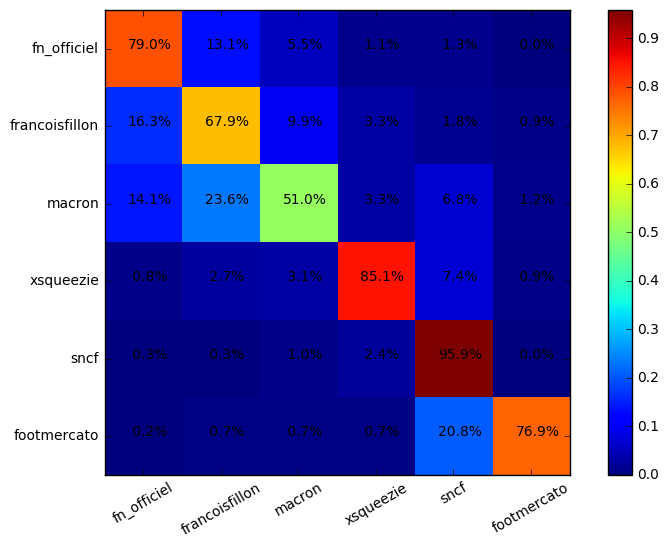

##################### 6 - Essai 3 ###################
Epoch    3 : 5182.42   Test accuracy: 68.45 71.68 70.93 69.63 70.93 71.06 70.45 
Epoch    3 : 4685.17   Test accuracy: 70.31 73.07 72.84 71.47 72.77 72.75 72.47 
Epoch    3 : 4495.18   Test accuracy: 70.97 73.89 73.57 72.07 73.61 73.61 73.25 
Epoch    3 : 4373.83   Test accuracy: 71.59 74.41 74.16 72.70 74.02 74.23 73.50 
Epoch    3 : 4286.29   Test accuracy: 72.20 74.55 74.29 73.02 74.20 74.57 73.77 
Epoch    3 : 4218.32   Test accuracy: 72.25 75.02 74.75 73.43 74.57 74.98 74.34 
Epoch    3 : 4163.32   Test accuracy: 72.29 75.16 74.95 73.54 74.80 75.11 74.43 
Epoch    3 : 4117.69   Test accuracy: 72.41 75.25 74.89 73.48 74.80 75.02 74.39 
Epoch    3 : 4078.94   Test accuracy: 72.45 75.50 74.95 73.52 74.98 75.02 74.32 
Epoch    3 : 4045.26   Test accuracy: 72.45 75.57 75.00 73.57 74.98 75.02 74.48 
-------------------------------------------------
| 80.6% | 12.8% |  3.8% |  1.5% |  1.3% |  0.1% |   Total: 799
-----------------------

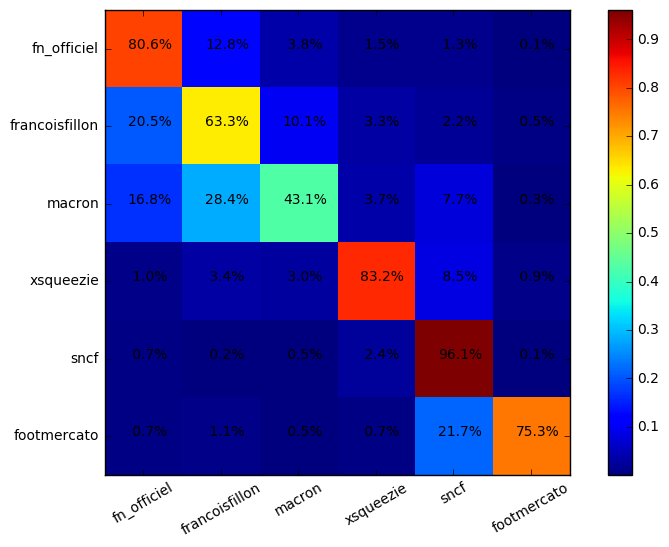

Epoch    3 : 4015.34   Test accuracy: 72.63 75.68 74.98 73.45 74.75 75.11 74.57 
Epoch    3 : 3988.28   Test accuracy: 72.70 75.68 75.02 73.64 74.73 75.20 74.70 
Epoch    3 : 3963.44   Test accuracy: 72.91 75.73 75.05 73.64 75.05 75.34 74.70 
Epoch    3 : 3940.40   Test accuracy: 73.13 75.77 75.34 73.66 75.34 75.45 74.93 
Epoch    3 : 3918.85   Test accuracy: 73.20 76.02 75.59 73.86 75.41 75.57 75.00 
Epoch    3 : 3898.55   Test accuracy: 73.45 76.11 75.68 74.00 75.55 75.84 75.11 
Epoch    3 : 3879.32   Test accuracy: 73.48 76.09 75.84 74.20 75.59 75.93 75.11 
Epoch    3 : 3861.07   Test accuracy: 73.52 76.14 76.00 74.34 75.73 76.18 75.16 
Epoch    3 : 3843.69   Test accuracy: 73.61 76.27 76.11 74.50 75.91 76.36 75.02 
Epoch    3 : 3827.12   Test accuracy: 73.73 76.32 76.16 74.52 75.96 76.46 75.23 
-------------------------------------------------
| 80.5% | 13.3% |  3.8% |  1.4% |  1.1% |  0.0% |   Total: 799
-------------------------------------------------
| 18.3% | 66.4% |  9.7% |  

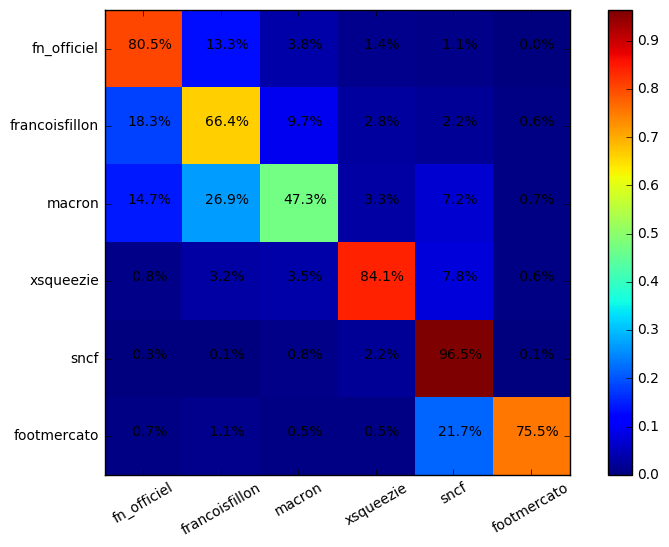

Epoch    3 : 3811.25   Test accuracy: 73.84 76.48 76.34 74.68 76.05 76.59 75.36 
Epoch    3 : 3796.05   Test accuracy: 73.91 76.50 76.32 74.93 76.11 76.73 75.36 
Epoch    3 : 3781.46   Test accuracy: 73.91 76.66 76.43 75.02 76.23 76.77 75.43 
Epoch    3 : 3767.43   Test accuracy: 74.09 76.71 76.50 75.11 76.34 76.87 75.57 
Epoch    3 : 3753.94   Test accuracy: 74.16 76.71 76.62 75.16 76.39 76.89 75.66 
Epoch    3 : 3740.94   Test accuracy: 74.09 76.80 76.62 75.14 76.46 76.93 75.80 
Epoch    3 : 3728.40   Test accuracy: 74.09 76.71 76.52 75.05 76.39 76.98 75.84 
Epoch    3 : 3716.28   Test accuracy: 74.04 76.62 76.55 75.02 76.36 77.07 75.84 
Epoch    3 : 3704.56   Test accuracy: 73.98 76.62 76.48 75.05 76.30 77.00 75.93 
Epoch    3 : 3693.20   Test accuracy: 74.09 76.64 76.48 75.02 76.34 77.00 76.07 
-------------------------------------------------
| 80.2% | 13.5% |  3.8% |  1.4% |  1.1% |  0.0% |   Total: 799
-------------------------------------------------
| 17.2% | 66.6% | 10.4% |  

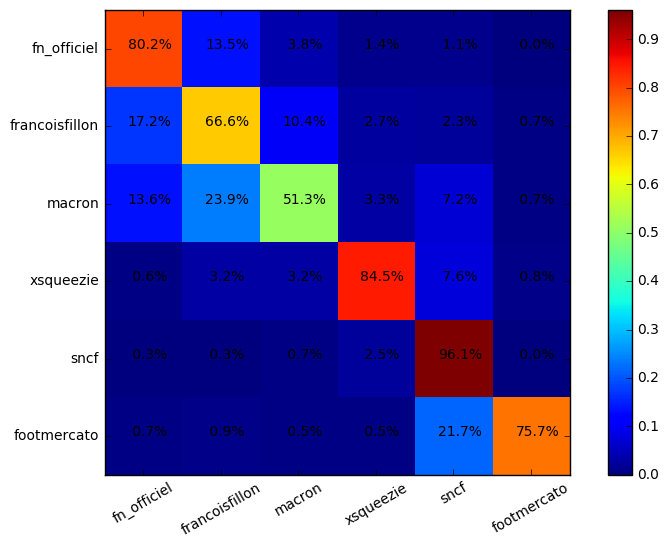

Epoch    3 : 3682.19   Test accuracy: 74.18 76.50 76.52 75.05 76.34 76.98 76.07 
Epoch    3 : 3671.49   Test accuracy: 74.16 76.41 76.57 75.16 76.36 76.98 76.07 
Epoch    3 : 3661.10   Test accuracy: 74.16 76.46 76.71 75.25 76.46 76.98 76.09 
Epoch    3 : 3651.00   Test accuracy: 74.14 76.46 76.77 75.32 76.55 77.02 76.11 
Epoch    3 : 3641.17   Test accuracy: 74.09 76.34 76.75 75.30 76.57 77.07 76.02 
Epoch    3 : 3631.60   Test accuracy: 74.07 76.36 76.77 75.32 76.64 76.93 76.05 
Epoch    3 : 3622.28   Test accuracy: 74.04 76.32 76.77 75.39 76.66 76.77 76.05 
Epoch    3 : 3613.19   Test accuracy: 74.18 76.36 76.80 75.41 76.68 76.62 76.11 
Epoch    3 : 3604.34   Test accuracy: 73.48 76.34 76.30 74.84 76.32 76.16 75.84 
Epoch    3 : 3595.70   Test accuracy: 73.54 76.36 76.30 74.86 76.36 76.07 75.82 
-------------------------------------------------
| 79.2% | 14.9% |  4.3% |  1.3% |  0.4% |  0.0% |   Total: 799
-------------------------------------------------
| 16.8% | 67.7% | 10.4% |  

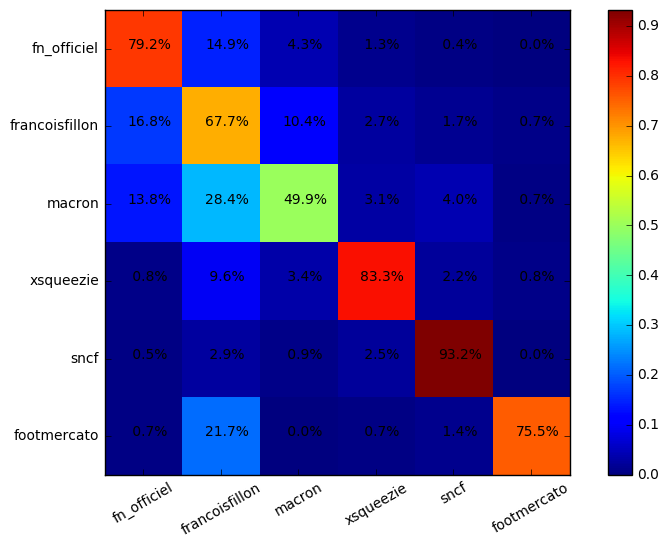

Epoch    3 : 3587.27   Test accuracy: 73.54 76.34 76.30 74.84 76.30 76.11 75.80 
Epoch    3 : 3579.04   Test accuracy: 73.54 76.34 76.34 74.91 76.27 76.07 75.75 
Epoch    3 : 3570.99   Test accuracy: 73.54 76.34 76.27 74.86 76.27 76.14 75.75 
Epoch    3 : 3563.12   Test accuracy: 73.48 76.32 76.23 74.86 76.23 76.14 75.86 
Epoch    3 : 3555.42   Test accuracy: 73.50 76.32 76.34 74.82 76.25 76.23 75.82 
Epoch    3 : 3547.89   Test accuracy: 73.54 76.36 76.39 74.75 76.32 76.23 75.73 
Epoch    3 : 3540.53   Test accuracy: 73.41 76.41 76.46 74.82 76.27 76.21 75.71 
Epoch    3 : 3533.32   Test accuracy: 73.36 76.41 76.41 74.82 76.32 76.21 75.73 
Epoch    3 : 3526.26   Test accuracy: 73.34 76.43 76.41 74.82 76.30 76.16 75.73 
Epoch    3 : 3519.35   Test accuracy: 73.29 76.43 76.34 74.73 76.23 76.16 75.77 
-------------------------------------------------
| 79.2% | 14.9% |  4.4% |  1.1% |  0.4% |  0.0% |   Total: 799
-------------------------------------------------
| 16.2% | 67.8% | 11.0% |  

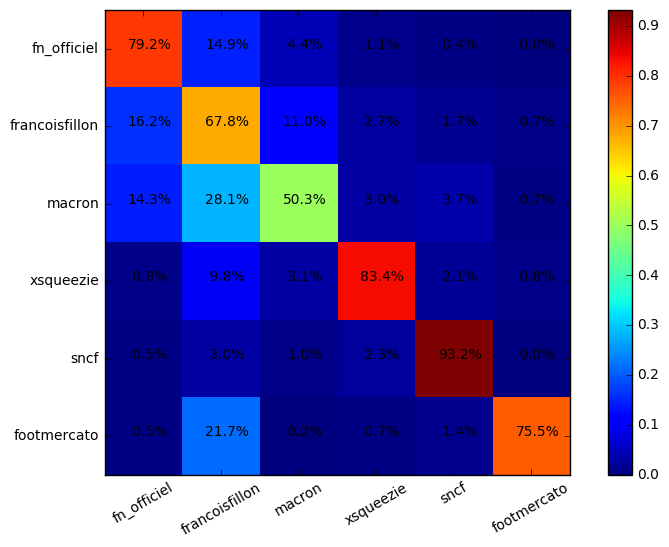

Epoch    3 : 3512.57   Test accuracy: 73.34 76.41 76.39 74.70 76.25 76.18 75.77 
Epoch    3 : 3505.93   Test accuracy: 73.36 76.46 76.32 74.73 76.23 76.14 75.68 
Epoch    3 : 3499.42   Test accuracy: 73.36 76.43 76.25 74.68 76.23 76.16 75.80 
Epoch    3 : 3493.03   Test accuracy: 73.27 76.39 76.27 74.70 76.25 76.21 75.89 
Epoch    3 : 3486.77   Test accuracy: 73.29 76.43 76.27 74.75 76.23 76.25 75.84 
Epoch    3 : 3480.63   Test accuracy: 73.23 76.46 76.34 74.75 76.34 76.32 75.80 
Epoch    3 : 3474.61   Test accuracy: 73.27 76.46 76.39 74.77 76.32 76.34 75.82 
Epoch    3 : 3468.71   Test accuracy: 73.23 76.39 76.41 74.80 76.27 76.23 75.82 
Epoch    3 : 3462.92   Test accuracy: 73.25 76.43 76.32 74.82 76.32 76.30 75.82 
Epoch    3 : 3457.23   Test accuracy: 73.29 76.48 76.32 74.82 76.21 76.36 75.80 
-------------------------------------------------
| 79.2% | 15.0% |  4.3% |  1.1% |  0.4% |  0.0% |   Total: 799
-------------------------------------------------
| 16.1% | 68.1% | 10.4% |  

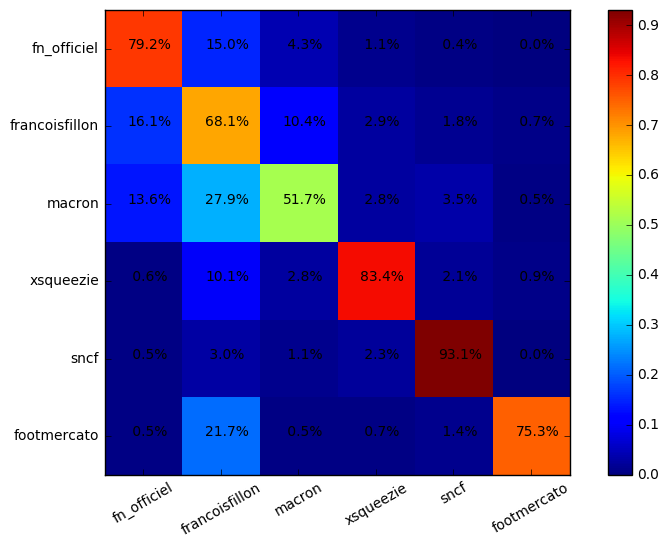

##################### 6 - Essai 4 ###################
Epoch    3 : 5227.69   Test accuracy: 67.88 72.09 70.68 69.18 70.66 70.61 70.09 
Epoch    3 : 4665.29   Test accuracy: 69.38 73.48 72.50 71.34 72.52 72.50 72.41 
Epoch    3 : 4476.24   Test accuracy: 70.38 74.27 73.32 72.11 73.34 73.34 72.86 
Epoch    3 : 4358.40   Test accuracy: 70.75 74.86 73.61 72.18 73.57 73.70 73.52 
Epoch    3 : 4272.50   Test accuracy: 71.36 75.14 73.89 72.41 73.91 73.98 73.57 
Epoch    3 : 4205.81   Test accuracy: 71.82 75.32 74.16 72.70 74.14 74.32 73.91 
Epoch    3 : 4151.41   Test accuracy: 71.77 75.64 74.55 72.95 74.45 74.70 74.07 
Epoch    3 : 4105.37   Test accuracy: 71.95 75.80 74.61 73.16 74.57 74.86 74.34 
Epoch    3 : 4065.35   Test accuracy: 72.20 76.00 74.84 73.41 74.82 74.82 74.75 
Epoch    3 : 4030.03   Test accuracy: 72.27 76.11 74.91 73.45 74.93 74.98 74.82 
-------------------------------------------------
| 81.7% | 12.3% |  4.6% |  1.0% |  0.4% |  0.0% |   Total: 799
-----------------------

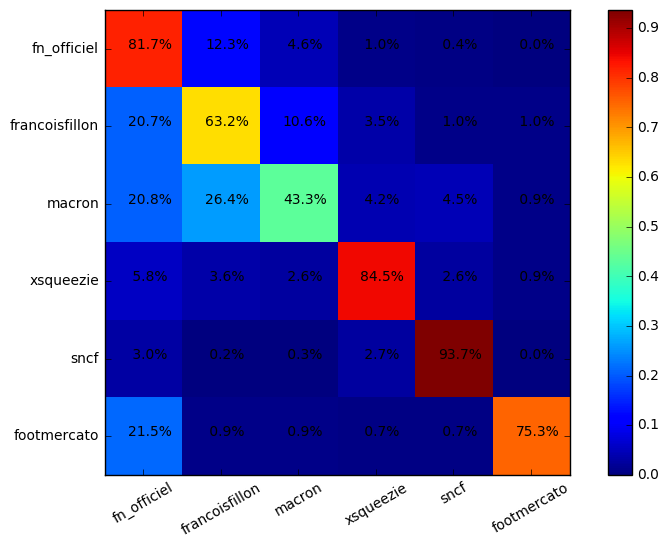

Epoch    3 : 3998.61   Test accuracy: 72.18 76.27 75.25 73.75 75.16 75.34 74.89 
Epoch    3 : 3970.52   Test accuracy: 72.18 76.48 75.45 73.77 75.41 75.41 75.00 
Epoch    3 : 3945.28   Test accuracy: 72.04 76.57 75.43 73.75 75.36 75.30 74.89 
Epoch    3 : 3922.45   Test accuracy: 72.29 76.66 75.39 73.89 75.41 75.30 74.98 
Epoch    3 : 3901.65   Test accuracy: 72.29 76.64 75.43 73.91 75.50 75.36 75.18 
Epoch    3 : 3882.57   Test accuracy: 72.47 76.75 75.43 73.86 75.50 75.43 75.25 
Epoch    3 : 3864.93   Test accuracy: 72.43 76.77 75.45 73.95 75.43 75.45 75.30 
Epoch    3 : 3848.50   Test accuracy: 72.50 76.80 75.36 74.11 75.48 75.48 75.36 
Epoch    3 : 3833.09   Test accuracy: 72.59 76.82 75.55 74.18 75.50 75.59 75.45 
Epoch    3 : 3818.53   Test accuracy: 72.75 76.80 75.71 74.32 75.68 75.73 75.43 
-------------------------------------------------
| 81.2% | 12.3% |  5.0% |  1.1% |  0.4% |  0.0% |   Total: 799
-------------------------------------------------
| 18.7% | 65.0% | 11.1% |  

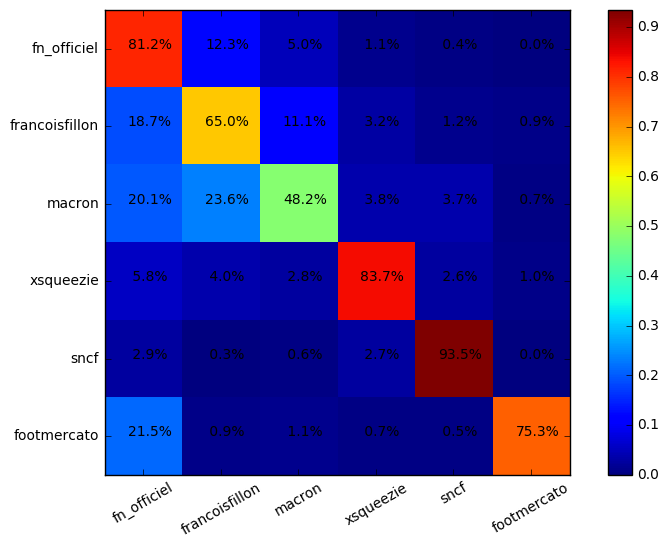

Epoch    3 : 3804.71   Test accuracy: 72.84 76.82 75.82 74.32 75.84 75.75 75.43 
Epoch    3 : 3791.54   Test accuracy: 72.75 76.77 75.82 74.25 75.89 75.75 75.50 
Epoch    3 : 3778.90   Test accuracy: 72.75 76.98 75.80 74.27 75.89 75.80 75.59 
Epoch    3 : 3766.71   Test accuracy: 72.75 76.96 75.77 74.45 75.91 75.91 75.50 
Epoch    3 : 3754.88   Test accuracy: 72.84 76.87 75.86 74.34 75.91 75.80 75.66 
Epoch    3 : 3743.37   Test accuracy: 72.82 76.87 75.84 74.39 75.89 75.77 75.75 
Epoch    3 : 3732.13   Test accuracy: 72.70 76.71 75.86 74.36 75.93 75.71 75.75 
Epoch    3 : 3721.15   Test accuracy: 72.75 76.75 75.91 74.43 75.98 75.80 75.71 
Epoch    3 : 3710.40   Test accuracy: 72.79 76.71 76.00 74.34 76.11 75.84 75.64 
Epoch    3 : 3699.88   Test accuracy: 72.75 76.66 76.07 74.39 76.11 75.86 75.64 
-------------------------------------------------
| 81.1% | 12.8% |  4.6% |  1.1% |  0.4% |  0.0% |   Total: 799
-------------------------------------------------
| 16.9% | 66.3% | 11.6% |  

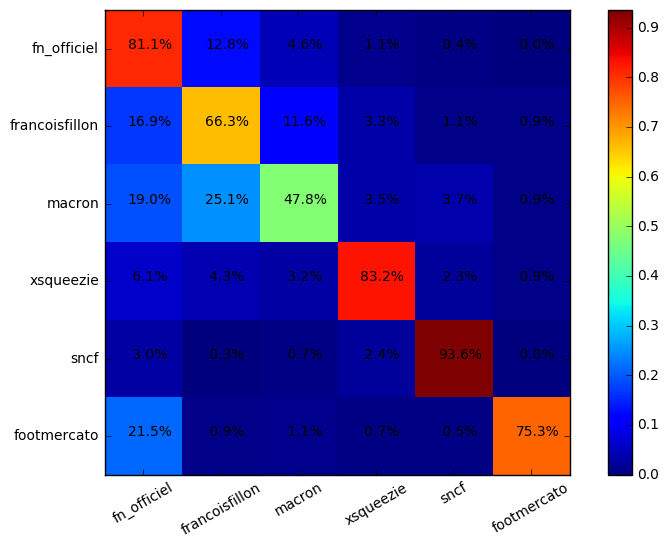

Epoch    3 : 3689.59   Test accuracy: 72.77 76.59 75.98 74.39 76.09 75.77 75.66 
Epoch    3 : 3679.52   Test accuracy: 72.73 76.41 75.96 74.41 76.16 75.77 75.68 
Epoch    3 : 3669.68   Test accuracy: 72.77 76.43 76.00 74.34 76.21 75.75 75.66 
Epoch    3 : 3660.07   Test accuracy: 72.73 76.46 75.98 74.39 76.09 75.80 75.66 
Epoch    3 : 3650.69   Test accuracy: 72.73 76.57 76.07 74.39 76.00 75.82 75.61 
Epoch    3 : 3641.55   Test accuracy: 72.77 76.50 75.96 74.36 76.11 75.80 75.48 
Epoch    3 : 3632.63   Test accuracy: 72.84 76.52 75.93 74.32 76.05 75.82 75.48 
Epoch    3 : 3623.95   Test accuracy: 72.93 76.57 75.93 74.25 76.02 75.80 75.50 
Epoch    3 : 3615.48   Test accuracy: 72.86 76.62 76.00 74.29 76.02 75.82 75.48 
Epoch    3 : 3607.24   Test accuracy: 72.91 76.46 76.02 74.36 75.91 75.89 75.52 
-------------------------------------------------
| 81.9% | 11.9% |  4.8% |  1.1% |  0.4% |  0.0% |   Total: 799
-------------------------------------------------
| 17.7% | 65.4% | 11.6% |  

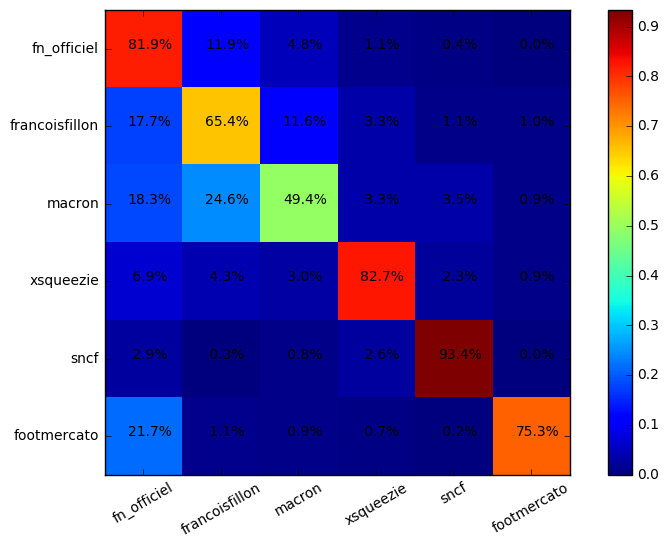

Epoch    3 : 3599.22   Test accuracy: 72.91 76.39 75.91 74.41 75.86 75.89 75.55 
Epoch    3 : 3591.41   Test accuracy: 72.95 76.36 75.82 74.34 75.82 75.89 75.55 
Epoch    3 : 3583.80   Test accuracy: 72.98 76.36 75.84 74.29 75.80 75.84 75.57 
Epoch    3 : 3576.38   Test accuracy: 72.88 76.39 75.82 74.29 75.71 75.77 75.59 
Epoch    3 : 3569.15   Test accuracy: 72.95 76.34 75.86 74.29 75.77 75.75 75.61 
Epoch    3 : 3562.09   Test accuracy: 72.93 76.25 75.80 74.29 75.89 75.73 75.68 
Epoch    3 : 3555.19   Test accuracy: 72.93 76.23 75.80 74.29 75.82 75.77 75.59 
Epoch    3 : 3548.45   Test accuracy: 72.88 76.14 75.75 74.36 75.86 75.80 75.64 
Epoch    3 : 3541.86   Test accuracy: 72.93 76.14 75.77 74.25 75.82 75.77 75.57 
Epoch    3 : 3535.40   Test accuracy: 72.95 76.09 75.84 74.29 75.82 75.66 75.57 
-------------------------------------------------
| 81.1% | 12.6% |  4.9% |  1.0% |  0.4% |  0.0% |   Total: 799
-------------------------------------------------
| 17.8% | 65.4% | 11.5% |  

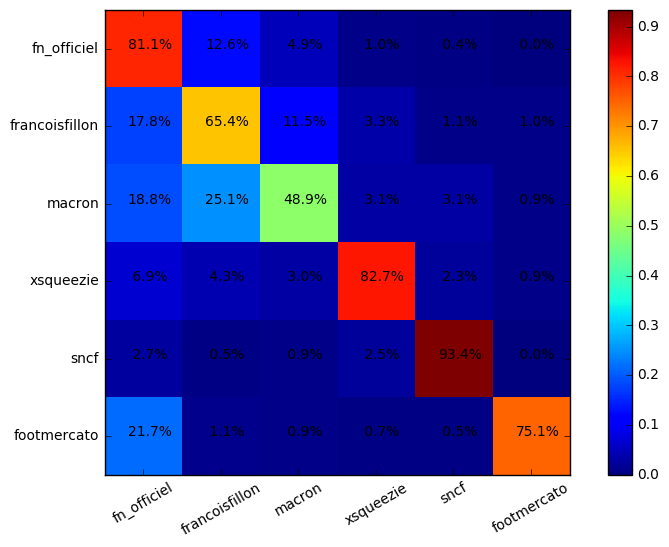

Epoch    3 : 3529.07   Test accuracy: 72.93 76.00 75.80 74.29 75.77 75.66 75.55 
Epoch    3 : 3522.87   Test accuracy: 72.77 76.07 75.66 74.25 75.73 75.71 75.52 
Epoch    3 : 3516.79   Test accuracy: 72.79 76.02 75.71 74.25 75.71 75.71 75.55 
Epoch    3 : 3510.82   Test accuracy: 72.77 76.00 75.80 74.27 75.71 75.66 75.48 
Epoch    3 : 3504.96   Test accuracy: 72.75 75.98 75.80 74.25 75.68 75.68 75.41 
Epoch    3 : 3499.21   Test accuracy: 72.70 75.91 75.80 74.23 75.66 75.75 75.36 
Epoch    3 : 3493.56   Test accuracy: 72.75 75.96 75.82 74.23 75.71 75.68 75.41 
Epoch    3 : 3488.01   Test accuracy: 72.79 75.96 75.86 74.23 75.66 75.66 75.34 
Epoch    3 : 3482.56   Test accuracy: 72.82 76.07 75.89 74.25 75.75 75.68 75.34 
Epoch    3 : 3477.20   Test accuracy: 72.86 76.02 75.86 74.23 75.77 75.71 75.36 
-------------------------------------------------
| 81.4% | 12.3% |  5.0% |  1.0% |  0.4% |  0.0% |   Total: 799
-------------------------------------------------
| 17.8% | 65.9% | 11.2% |  

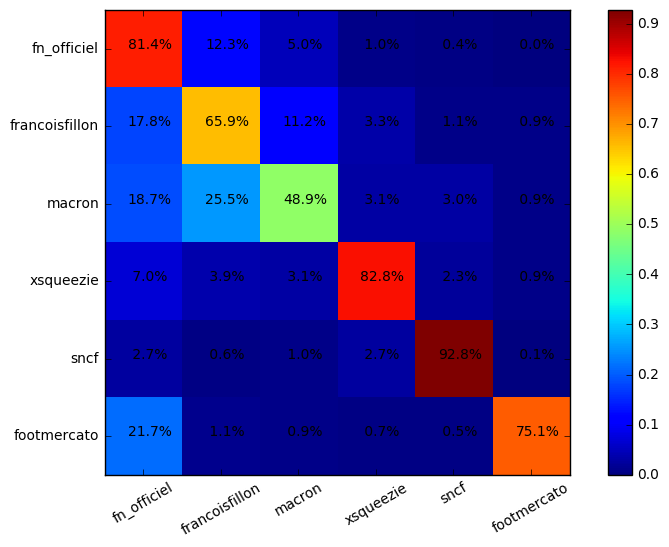

##################### 7 - Essai 0 ###################
Epoch    3 : 5266.96   Test accuracy: 66.79 71.54 69.52 67.70 69.36 69.65 69.04 
Epoch    3 : 4648.97   Test accuracy: 69.40 73.50 71.66 70.00 71.47 71.93 70.95 
Epoch    3 : 4470.48   Test accuracy: 70.04 74.07 72.52 70.86 72.38 72.63 71.93 
Epoch    3 : 4366.55   Test accuracy: 70.50 74.48 72.93 71.41 73.02 73.16 72.50 
Epoch    3 : 4288.43   Test accuracy: 71.31 74.68 73.77 71.82 73.59 73.95 73.23 
Epoch    3 : 4223.95   Test accuracy: 71.75 75.02 74.36 72.45 74.16 74.73 73.70 
Epoch    3 : 4169.49   Test accuracy: 72.32 75.43 74.95 73.00 74.73 75.36 74.14 
Epoch    3 : 4123.45   Test accuracy: 72.34 75.73 75.27 73.38 75.09 75.45 74.61 
Epoch    3 : 4084.36   Test accuracy: 72.38 75.98 75.45 73.50 75.34 75.59 74.80 
Epoch    3 : 4050.79   Test accuracy: 72.47 76.27 75.59 73.61 75.32 75.59 75.05 
-------------------------------------------------
| 80.1% | 12.3% |  6.4% |  0.7% |  0.3% |  0.1% |   Total: 940
-----------------------

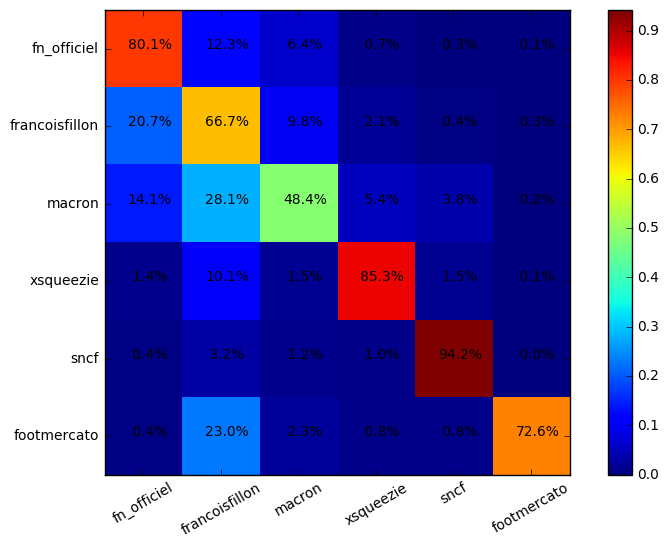

Epoch    3 : 4021.40   Test accuracy: 72.54 76.50 75.48 73.68 75.30 75.57 75.11 
Epoch    3 : 3995.07   Test accuracy: 72.59 76.77 75.50 73.68 75.45 75.57 75.02 
Epoch    3 : 3971.06   Test accuracy: 72.68 76.89 75.61 73.84 75.48 75.59 74.98 
Epoch    3 : 3948.87   Test accuracy: 72.73 76.91 75.71 73.84 75.57 75.71 75.02 
Epoch    3 : 3928.13   Test accuracy: 72.70 76.82 75.66 73.86 75.48 75.77 75.02 
Epoch    3 : 3908.70   Test accuracy: 72.63 76.80 75.64 73.95 75.61 75.77 75.00 
Epoch    3 : 3890.47   Test accuracy: 72.73 76.84 75.61 73.84 75.57 75.84 74.93 
Epoch    3 : 3873.32   Test accuracy: 72.93 76.98 75.48 73.89 75.52 75.82 75.07 
Epoch    3 : 3857.18   Test accuracy: 73.04 76.87 75.52 73.82 75.48 75.77 75.25 
Epoch    3 : 3841.98   Test accuracy: 73.09 76.87 75.66 73.89 75.55 75.77 75.25 
-------------------------------------------------
| 79.6% | 13.7% |  6.0% |  0.5% |  0.2% |  0.0% |   Total: 940
-------------------------------------------------
| 19.7% | 67.3% | 10.3% |  

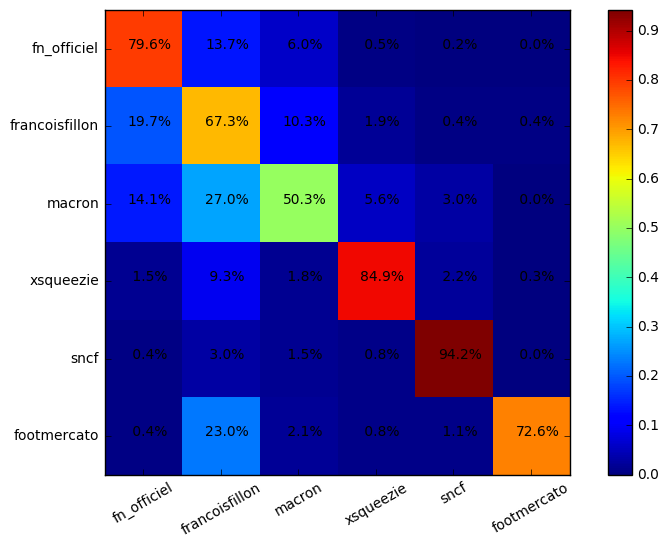

Epoch    3 : 3827.65   Test accuracy: 73.09 76.84 75.66 73.98 75.59 75.75 75.32 
Epoch    3 : 3814.12   Test accuracy: 72.93 76.93 75.71 73.98 75.55 75.86 75.23 
Epoch    3 : 3801.26   Test accuracy: 72.79 76.87 75.66 73.91 75.57 75.98 75.23 
Epoch    3 : 3788.98   Test accuracy: 72.79 76.93 75.68 73.89 75.61 75.89 75.14 
Epoch    3 : 3777.23   Test accuracy: 72.77 76.89 75.71 73.84 75.52 75.93 75.14 
Epoch    3 : 3765.98   Test accuracy: 72.82 76.98 75.71 73.82 75.52 75.98 75.11 
Epoch    3 : 3755.16   Test accuracy: 72.73 76.98 75.71 73.82 75.59 75.98 75.11 
Epoch    3 : 3744.72   Test accuracy: 72.84 76.96 75.75 73.84 75.59 75.91 75.09 
Epoch    3 : 3734.61   Test accuracy: 72.82 77.00 75.73 73.84 75.50 75.93 75.00 
Epoch    3 : 3724.81   Test accuracy: 72.84 77.00 75.82 73.73 75.55 76.00 75.00 
-------------------------------------------------
| 79.5% | 13.9% |  6.0% |  0.4% |  0.2% |  0.0% |   Total: 940
-------------------------------------------------
| 19.3% | 67.3% | 10.9% |  

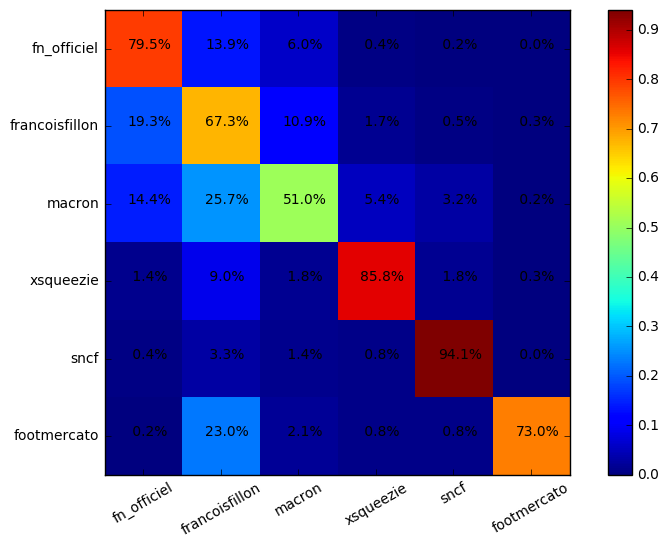

Epoch    3 : 3715.28   Test accuracy: 72.91 76.96 75.82 73.89 75.59 76.00 75.02 
Epoch    3 : 3706.00   Test accuracy: 73.04 77.02 75.75 73.82 75.52 75.96 75.05 
Epoch    3 : 3696.97   Test accuracy: 73.04 77.00 75.68 73.86 75.50 75.86 75.05 
Epoch    3 : 3688.16   Test accuracy: 73.11 77.02 75.71 73.86 75.64 75.89 75.16 
Epoch    3 : 3679.57   Test accuracy: 73.13 77.05 75.80 73.82 75.64 75.98 75.18 
Epoch    3 : 3671.18   Test accuracy: 73.16 77.12 75.84 73.82 75.66 76.07 75.23 
Epoch    3 : 3662.99   Test accuracy: 73.16 77.07 75.89 73.89 75.71 76.07 75.27 
Epoch    3 : 3654.98   Test accuracy: 73.13 76.98 75.89 73.93 75.77 76.09 75.27 
Epoch    3 : 3647.14   Test accuracy: 73.13 76.87 75.89 74.00 75.80 76.09 75.34 
Epoch    3 : 3639.47   Test accuracy: 73.13 76.93 75.96 74.16 75.93 76.14 75.34 
-------------------------------------------------
| 79.8% | 14.3% |  5.1% |  0.6% |  0.2% |  0.0% |   Total: 940
-------------------------------------------------
| 18.6% | 67.7% | 10.8% |  

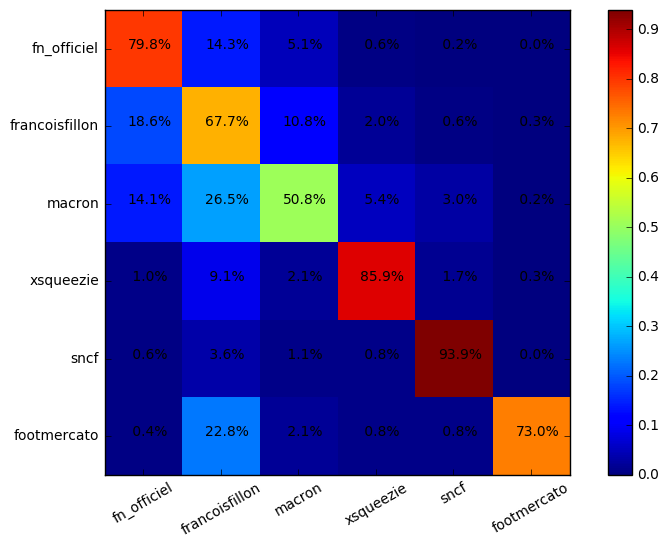

Epoch    3 : 3631.95   Test accuracy: 73.20 76.96 75.98 74.25 76.00 76.16 75.25 
Epoch    3 : 3624.58   Test accuracy: 73.25 76.93 76.09 74.20 76.09 76.14 75.18 
Epoch    3 : 3617.36   Test accuracy: 73.34 76.89 76.23 74.18 76.11 76.07 75.14 
Epoch    3 : 3610.27   Test accuracy: 73.29 76.87 76.18 74.18 76.09 76.00 75.18 
Epoch    3 : 3603.32   Test accuracy: 73.20 76.89 76.18 74.02 76.16 75.96 75.20 
Epoch    3 : 3596.51   Test accuracy: 73.20 76.93 76.07 74.00 76.14 75.91 75.20 
Epoch    3 : 3589.84   Test accuracy: 73.20 76.96 76.14 74.09 76.11 75.91 75.23 
Epoch    3 : 3583.30   Test accuracy: 73.20 76.89 76.14 74.18 76.16 75.86 75.27 
Epoch    3 : 3576.89   Test accuracy: 73.25 76.87 76.16 74.18 76.14 76.00 75.25 
Epoch    3 : 3570.61   Test accuracy: 73.32 76.89 76.21 74.16 76.11 76.02 75.27 
-------------------------------------------------
| 79.0% | 15.1% |  5.0% |  0.5% |  0.2% |  0.1% |   Total: 940
-------------------------------------------------
| 17.7% | 69.4% | 10.1% |  

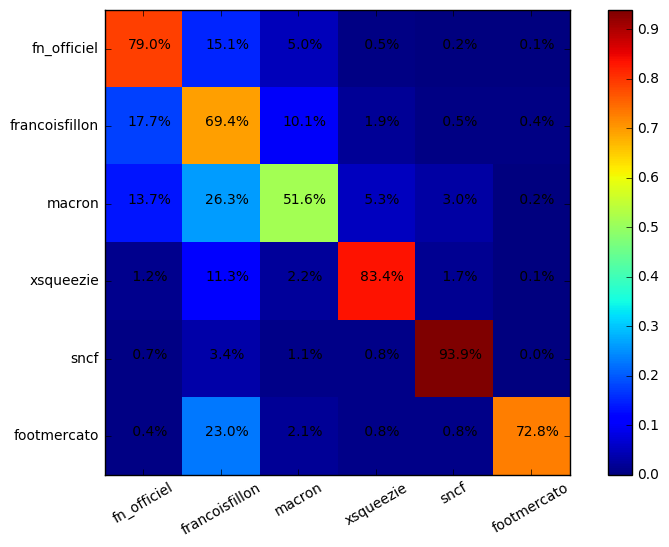

Epoch    3 : 3564.44   Test accuracy: 73.43 76.89 76.36 74.23 76.07 76.00 75.30 
Epoch    3 : 3558.38   Test accuracy: 73.38 76.84 76.32 74.32 76.02 76.00 75.34 
Epoch    3 : 3552.43   Test accuracy: 73.38 76.80 76.34 74.41 76.05 76.02 75.43 
Epoch    3 : 3546.59   Test accuracy: 73.36 76.77 76.36 74.45 76.21 76.05 75.41 
Epoch    3 : 3540.83   Test accuracy: 73.36 76.73 76.30 74.66 76.25 76.00 75.39 
Epoch    3 : 3535.17   Test accuracy: 73.36 76.73 76.32 74.66 76.21 76.00 75.45 
Epoch    3 : 3529.58   Test accuracy: 73.45 76.73 76.32 74.64 76.21 76.00 75.55 
Epoch    3 : 3524.08   Test accuracy: 73.45 76.80 76.27 74.68 76.27 75.98 75.50 
Epoch    3 : 3518.65   Test accuracy: 73.45 76.75 76.23 74.66 76.27 75.93 75.59 
Epoch    3 : 3513.29   Test accuracy: 73.50 76.77 76.18 74.66 76.30 75.98 75.61 
-------------------------------------------------
| 79.8% | 14.0% |  5.2% |  0.6% |  0.2% |  0.1% |   Total: 940
-------------------------------------------------
| 18.2% | 68.8% | 10.3% |  

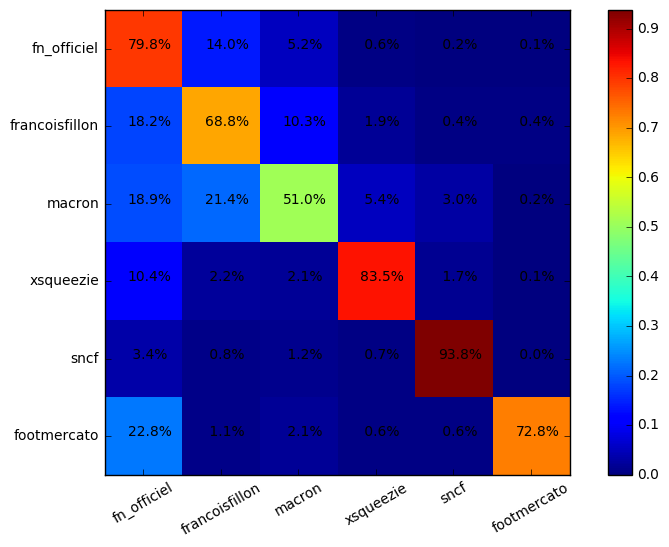

##################### 7 - Essai 1 ###################
Epoch    3 : 5196.07   Test accuracy: 68.15 72.41 70.75 69.29 70.72 70.93 70.00 
Epoch    3 : 4583.86   Test accuracy: 69.75 73.93 72.29 70.66 72.11 72.59 71.63 
Epoch    3 : 4408.59   Test accuracy: 70.72 74.66 73.23 71.41 73.04 73.41 72.63 
Epoch    3 : 4306.07   Test accuracy: 71.13 75.16 73.48 71.72 73.32 73.73 72.84 
Epoch    3 : 4230.32   Test accuracy: 71.50 75.61 73.73 72.00 73.64 73.79 73.07 
Epoch    3 : 4169.25   Test accuracy: 71.70 75.57 73.89 72.25 73.84 74.07 73.32 
Epoch    3 : 4117.95   Test accuracy: 71.72 75.77 74.09 72.50 74.07 74.39 73.38 
Epoch    3 : 4073.85   Test accuracy: 72.11 75.84 74.48 72.88 74.41 74.68 73.77 
Epoch    3 : 4035.54   Test accuracy: 72.36 76.00 74.70 73.09 74.50 74.73 73.79 
Epoch    3 : 4002.12   Test accuracy: 72.50 76.16 74.84 73.27 74.59 75.11 73.93 
-------------------------------------------------
| 79.4% | 13.2% |  6.6% |  0.7% |  0.1% |  0.0% |   Total: 940
-----------------------

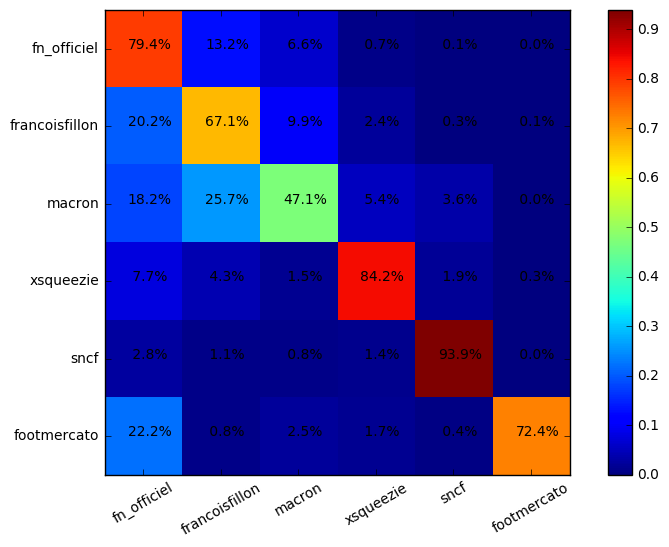

Epoch    3 : 3972.71   Test accuracy: 72.59 76.25 75.02 73.43 74.77 75.11 74.02 
Epoch    3 : 3946.49   Test accuracy: 72.84 76.27 75.18 73.48 74.98 75.36 74.23 
Epoch    3 : 3922.79   Test accuracy: 72.68 76.34 75.16 73.57 74.98 75.50 74.34 
Epoch    3 : 3901.09   Test accuracy: 72.86 76.34 75.23 73.64 75.11 75.43 74.55 
Epoch    3 : 3881.01   Test accuracy: 72.84 76.50 75.36 73.68 75.23 75.50 74.68 
Epoch    3 : 3862.29   Test accuracy: 72.95 76.48 75.39 73.70 75.23 75.68 74.80 
Epoch    3 : 3844.72   Test accuracy: 73.00 76.57 75.45 73.77 75.30 75.64 74.84 
Epoch    3 : 3828.16   Test accuracy: 72.95 76.64 75.45 73.79 75.27 75.61 74.84 
Epoch    3 : 3812.46   Test accuracy: 72.91 76.75 75.41 73.73 75.25 75.64 74.84 
Epoch    3 : 3797.54   Test accuracy: 72.93 76.84 75.41 73.84 75.27 75.71 74.77 
-------------------------------------------------
| 79.9% | 12.2% |  7.0% |  0.6% |  0.2% |  0.0% |   Total: 940
-------------------------------------------------
| 19.8% | 67.6% | 10.3% |  

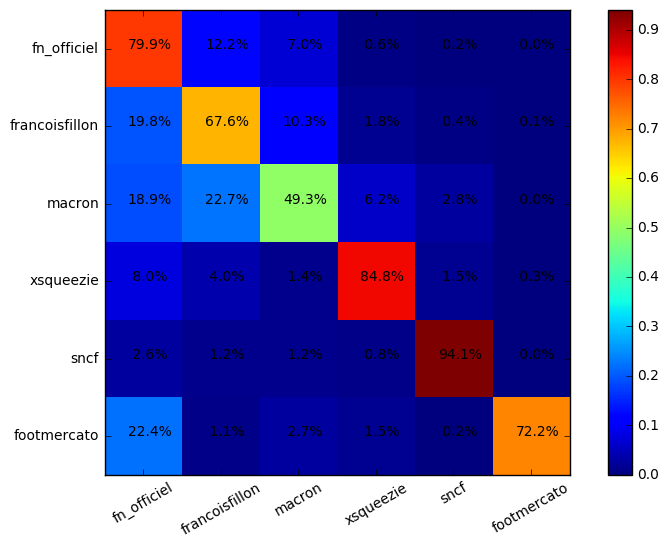

Epoch    3 : 3783.29   Test accuracy: 72.86 76.84 75.41 73.79 75.32 75.61 74.86 
Epoch    3 : 3769.66   Test accuracy: 72.84 76.82 75.45 73.82 75.32 75.61 74.86 
Epoch    3 : 3756.57   Test accuracy: 72.82 76.87 75.50 73.79 75.48 75.73 74.84 
Epoch    3 : 3743.97   Test accuracy: 72.82 76.75 75.59 73.75 75.43 75.75 74.82 
Epoch    3 : 3731.84   Test accuracy: 72.77 76.75 75.59 73.79 75.50 75.75 74.80 
Epoch    3 : 3720.12   Test accuracy: 72.61 76.75 75.57 73.77 75.50 75.75 74.80 
Epoch    3 : 3708.79   Test accuracy: 72.61 76.68 75.64 73.75 75.55 75.77 74.89 
Epoch    3 : 3697.83   Test accuracy: 72.61 76.64 75.75 73.82 75.66 75.82 75.02 
Epoch    3 : 3687.21   Test accuracy: 72.61 76.62 75.80 73.70 75.61 75.77 75.02 
Epoch    3 : 3676.93   Test accuracy: 72.63 76.57 75.71 73.82 75.71 75.75 75.00 
-------------------------------------------------
| 79.3% | 13.4% |  6.6% |  0.5% |  0.2% |  0.0% |   Total: 940
-------------------------------------------------
| 18.9% | 68.2% | 10.5% |  

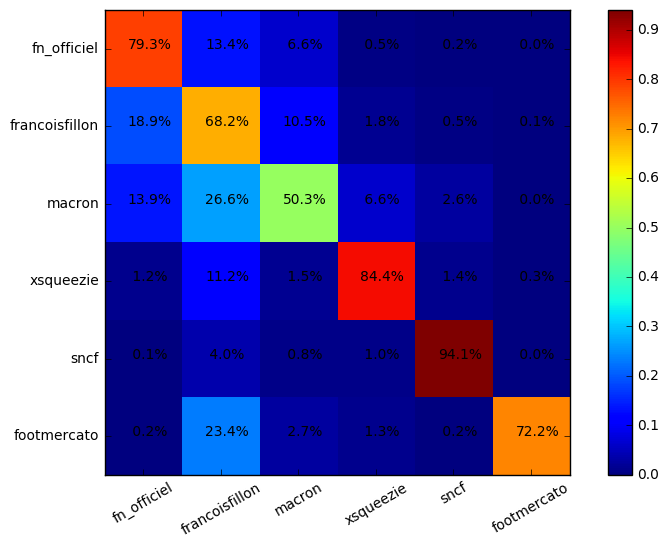

Epoch    3 : 3666.96   Test accuracy: 72.68 76.64 75.59 73.84 75.61 75.71 74.95 
Epoch    3 : 3657.29   Test accuracy: 72.63 76.62 75.48 73.82 75.48 75.68 74.91 
Epoch    3 : 3647.89   Test accuracy: 72.54 76.73 75.55 73.86 75.48 75.57 75.00 
Epoch    3 : 3638.76   Test accuracy: 72.59 76.77 75.52 73.86 75.39 75.59 75.02 
Epoch    3 : 3629.88   Test accuracy: 72.52 76.75 75.43 73.77 75.39 75.45 75.05 
Epoch    3 : 3621.26   Test accuracy: 72.52 76.68 75.39 73.70 75.45 75.55 75.00 
Epoch    3 : 3612.87   Test accuracy: 72.57 76.80 75.45 73.70 75.41 75.50 74.95 
Epoch    3 : 3604.71   Test accuracy: 72.52 76.80 75.48 73.73 75.36 75.52 75.00 
Epoch    3 : 3596.77   Test accuracy: 72.54 76.77 75.48 73.70 75.34 75.30 74.95 
Epoch    3 : 3589.06   Test accuracy: 72.54 76.77 75.45 73.73 75.30 75.14 74.93 
-------------------------------------------------
| 77.9% | 14.6% |  6.7% |  0.5% |  0.3% |  0.0% |   Total: 940
-------------------------------------------------
| 18.4% | 68.3% | 10.7% |  

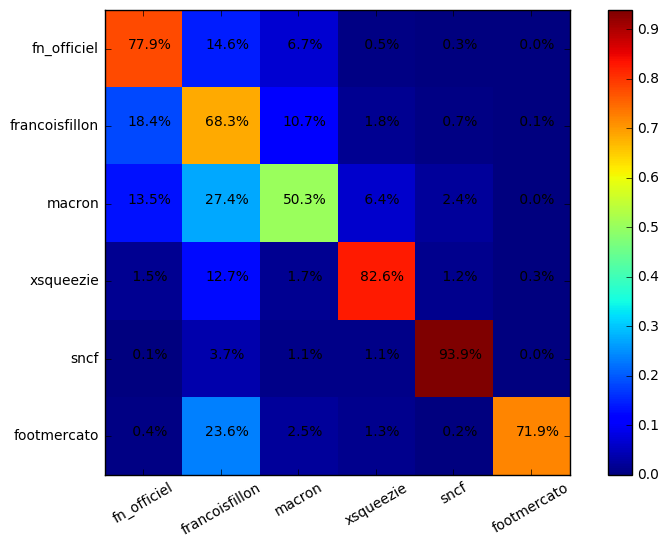

Epoch    3 : 3581.55   Test accuracy: 72.54 76.77 75.41 73.68 75.32 75.18 74.95 
Epoch    3 : 3574.25   Test accuracy: 72.63 76.82 75.43 73.68 75.36 75.27 74.95 
Epoch    3 : 3567.15   Test accuracy: 72.63 76.87 75.43 73.73 75.32 75.25 74.95 
Epoch    3 : 3560.24   Test accuracy: 72.59 76.91 75.41 73.77 75.30 75.20 75.02 
Epoch    3 : 3553.51   Test accuracy: 72.59 76.89 75.39 73.73 75.34 75.27 75.02 
Epoch    3 : 3546.97   Test accuracy: 72.70 76.93 75.36 73.66 75.34 75.23 74.91 
Epoch    3 : 3540.59   Test accuracy: 72.66 76.93 75.41 73.68 75.32 75.25 74.91 
Epoch    3 : 3534.37   Test accuracy: 72.61 76.96 75.45 73.66 75.34 75.36 74.91 
Epoch    3 : 3528.31   Test accuracy: 72.59 76.89 75.45 73.61 75.23 75.32 74.91 
Epoch    3 : 3522.38   Test accuracy: 72.59 76.96 75.36 73.57 75.32 75.32 74.93 
-------------------------------------------------
| 77.8% | 14.8% |  6.6% |  0.5% |  0.3% |  0.0% |   Total: 940
-------------------------------------------------
| 18.6% | 68.3% | 10.7% |  

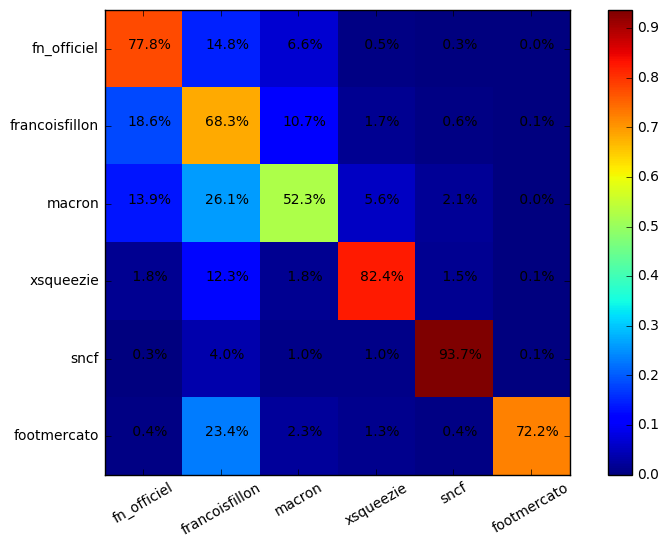

Epoch    3 : 3516.59   Test accuracy: 72.59 77.00 75.39 73.54 75.36 75.20 74.86 
Epoch    3 : 3510.92   Test accuracy: 72.47 77.02 75.34 73.61 75.32 75.20 74.86 
Epoch    3 : 3505.36   Test accuracy: 72.50 77.02 75.39 73.61 75.34 75.20 74.98 
Epoch    3 : 3499.91   Test accuracy: 72.61 77.09 75.45 73.52 75.34 75.27 74.95 
Epoch    3 : 3494.56   Test accuracy: 72.63 77.05 75.41 73.61 75.20 75.30 74.98 
Epoch    3 : 3489.32   Test accuracy: 72.68 76.91 75.45 73.59 75.30 75.25 75.00 
Epoch    3 : 3484.17   Test accuracy: 72.70 76.84 75.39 73.50 75.34 75.27 74.95 
Epoch    3 : 3479.10   Test accuracy: 72.73 76.93 75.41 73.52 75.41 75.32 74.95 
Epoch    3 : 3474.12   Test accuracy: 72.77 76.91 75.41 73.64 75.41 75.34 74.89 
Epoch    3 : 3469.22   Test accuracy: 72.82 76.87 75.52 73.64 75.48 75.43 74.91 
-------------------------------------------------
| 78.0% | 14.8% |  6.4% |  0.5% |  0.3% |  0.0% |   Total: 940
-------------------------------------------------
| 18.6% | 68.1% | 10.7% |  

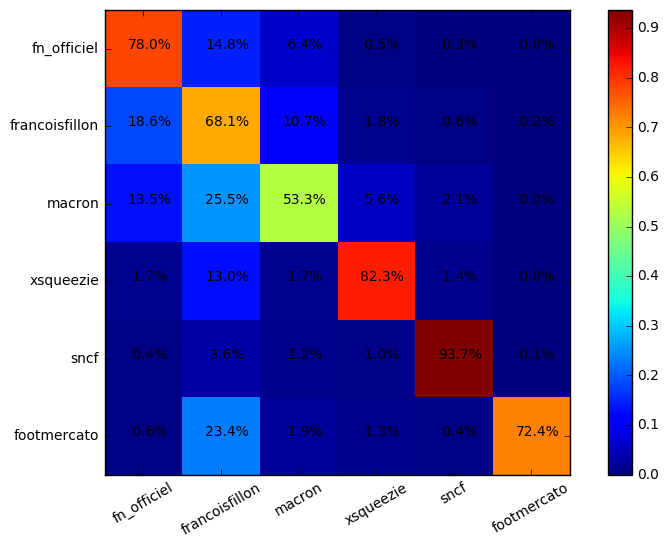

##################### 7 - Essai 2 ###################
Epoch    3 : 5172.82   Test accuracy: 66.90 71.31 69.54 68.06 69.43 69.61 69.02 
Epoch    3 : 4651.63   Test accuracy: 69.22 73.48 71.59 69.88 71.59 71.93 71.16 
Epoch    3 : 4459.54   Test accuracy: 70.40 73.93 72.75 71.02 72.66 72.91 72.00 
Epoch    3 : 4345.41   Test accuracy: 70.77 74.59 73.59 72.04 73.54 73.73 72.86 
Epoch    3 : 4265.11   Test accuracy: 71.38 75.07 74.07 72.34 73.98 73.98 73.20 
Epoch    3 : 4202.77   Test accuracy: 71.84 75.39 74.04 72.66 73.98 74.29 73.48 
Epoch    3 : 4151.27   Test accuracy: 72.09 75.82 74.50 72.91 74.29 74.86 73.86 
Epoch    3 : 4107.39   Test accuracy: 72.25 75.84 74.66 73.02 74.52 74.89 74.00 
Epoch    3 : 4069.30   Test accuracy: 72.43 75.91 74.77 73.02 74.57 75.14 74.27 
Epoch    3 : 4035.82   Test accuracy: 72.38 75.98 74.93 73.04 74.73 75.27 74.29 
-------------------------------------------------
| 79.4% | 12.9% |  6.9% |  0.5% |  0.1% |  0.2% |   Total: 940
-----------------------

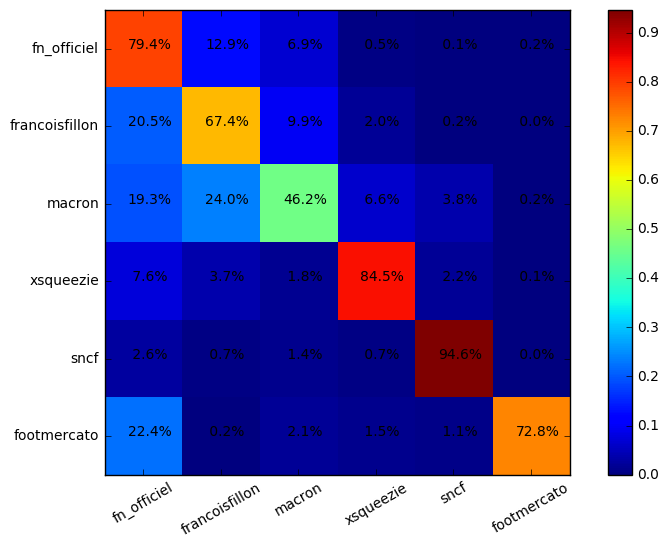

Epoch    3 : 4006.12   Test accuracy: 72.52 75.96 74.93 73.27 74.89 75.20 74.36 
Epoch    3 : 3979.59   Test accuracy: 72.57 76.02 75.11 73.32 74.86 75.25 74.45 
Epoch    3 : 3955.67   Test accuracy: 72.59 76.05 75.11 73.41 74.86 75.23 74.43 
Epoch    3 : 3933.92   Test accuracy: 72.57 76.09 75.05 73.50 74.89 75.23 74.59 
Epoch    3 : 3913.98   Test accuracy: 72.66 76.27 75.02 73.43 74.82 75.25 74.66 
Epoch    3 : 3895.54   Test accuracy: 72.79 76.34 75.05 73.48 74.86 75.30 74.66 
Epoch    3 : 3878.38   Test accuracy: 72.73 76.36 74.95 73.38 75.02 75.09 74.73 
Epoch    3 : 3862.28   Test accuracy: 72.61 76.36 75.05 73.45 75.02 74.91 74.80 
Epoch    3 : 3847.07   Test accuracy: 72.57 76.32 74.95 73.50 75.02 74.95 74.68 
Epoch    3 : 3832.63   Test accuracy: 72.47 76.39 74.98 73.48 75.00 74.91 74.66 
-------------------------------------------------
| 79.5% | 13.0% |  6.4% |  0.7% |  0.2% |  0.2% |   Total: 940
-------------------------------------------------
| 20.8% | 65.8% | 11.1% |  

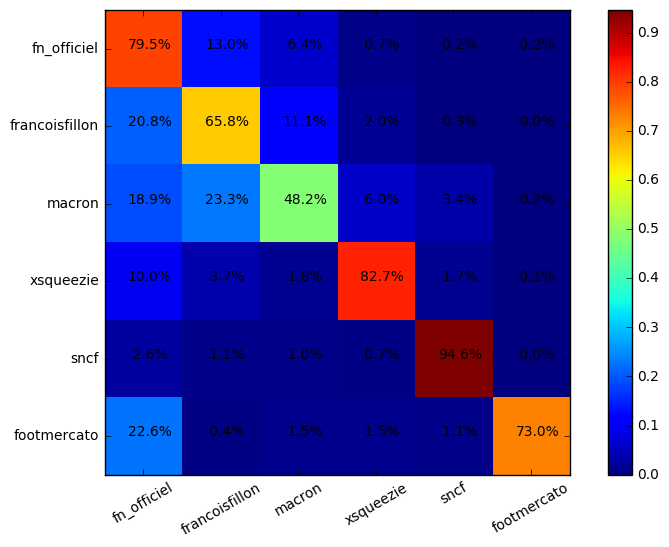

Epoch    3 : 3818.94   Test accuracy: 72.57 76.55 75.09 73.38 75.09 74.91 74.70 
Epoch    3 : 3805.95   Test accuracy: 72.59 76.52 75.25 73.52 75.23 75.02 74.75 
Epoch    3 : 3793.55   Test accuracy: 72.70 76.55 75.34 73.59 75.20 75.09 74.84 
Epoch    3 : 3781.64   Test accuracy: 72.79 76.64 75.20 73.64 75.27 75.09 74.89 
Epoch    3 : 3770.14   Test accuracy: 72.82 76.62 75.23 73.54 75.20 75.07 74.84 
Epoch    3 : 3758.99   Test accuracy: 72.98 76.66 75.32 73.59 75.30 75.09 74.91 
Epoch    3 : 3748.14   Test accuracy: 72.98 76.71 75.32 73.70 75.32 75.11 75.09 
Epoch    3 : 3737.55   Test accuracy: 72.98 76.73 75.39 73.68 75.25 75.25 75.14 
Epoch    3 : 3727.19   Test accuracy: 73.02 76.91 75.41 73.73 75.39 75.41 75.16 
Epoch    3 : 3717.05   Test accuracy: 73.11 76.87 75.50 73.70 75.43 75.41 75.11 
-------------------------------------------------
| 80.2% | 11.9% |  6.5% |  0.7% |  0.4% |  0.2% |   Total: 940
-------------------------------------------------
| 19.8% | 66.8% | 11.0% |  

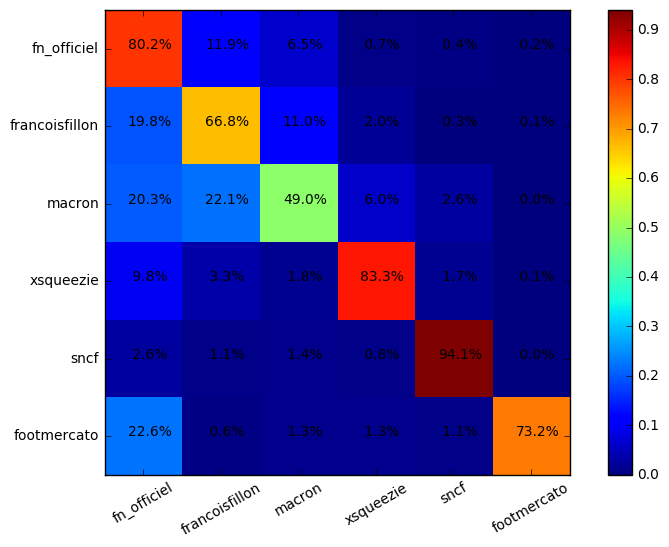

Epoch    3 : 3707.09   Test accuracy: 73.25 77.00 75.48 73.84 75.52 75.57 75.11 
Epoch    3 : 3697.32   Test accuracy: 73.32 77.00 75.61 73.91 75.55 75.55 75.16 
Epoch    3 : 3687.72   Test accuracy: 73.25 76.96 75.59 74.00 75.43 75.57 75.16 
Epoch    3 : 3678.29   Test accuracy: 73.20 76.98 75.66 74.00 75.50 75.59 75.20 
Epoch    3 : 3669.03   Test accuracy: 73.18 77.09 75.80 74.09 75.52 75.66 75.16 
Epoch    3 : 3659.98   Test accuracy: 73.16 77.09 75.82 74.09 75.64 75.77 75.23 
Epoch    3 : 3651.14   Test accuracy: 73.25 77.16 75.80 74.11 75.66 75.73 75.27 
Epoch    3 : 3642.53   Test accuracy: 73.16 77.05 75.73 74.20 75.68 75.73 75.36 
Epoch    3 : 3634.13   Test accuracy: 73.11 77.05 75.80 74.25 75.80 75.73 75.27 
Epoch    3 : 3625.93   Test accuracy: 73.13 77.16 75.91 74.32 75.80 75.82 75.25 
-------------------------------------------------
| 81.1% | 11.8% |  5.6% |  0.7% |  0.5% |  0.2% |   Total: 940
-------------------------------------------------
| 19.1% | 67.2% | 11.1% |  

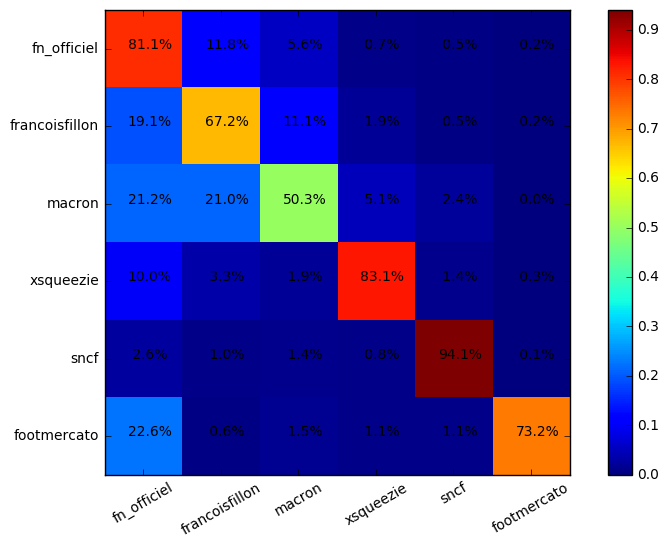

Epoch    3 : 3617.95   Test accuracy: 73.11 77.16 75.86 74.36 75.82 75.68 75.25 
Epoch    3 : 3610.18   Test accuracy: 73.09 77.12 75.84 74.34 75.80 75.66 75.25 
Epoch    3 : 3602.63   Test accuracy: 73.02 77.12 75.75 74.32 75.68 75.52 75.18 
Epoch    3 : 3595.28   Test accuracy: 72.93 77.18 75.77 74.20 75.73 75.52 75.14 
Epoch    3 : 3588.12   Test accuracy: 73.00 77.12 75.82 74.23 75.73 75.61 75.16 
Epoch    3 : 3581.16   Test accuracy: 72.91 77.18 75.86 74.23 75.75 75.59 75.18 
Epoch    3 : 3574.37   Test accuracy: 72.86 77.25 75.84 74.23 75.80 75.61 75.07 
Epoch    3 : 3567.76   Test accuracy: 72.82 77.34 75.75 74.14 75.80 75.52 75.07 
Epoch    3 : 3561.30   Test accuracy: 72.79 77.30 75.71 74.09 75.80 75.50 75.07 
Epoch    3 : 3555.01   Test accuracy: 72.79 77.37 75.77 74.00 75.75 75.52 75.09 
-------------------------------------------------
| 80.6% | 12.0% |  6.0% |  0.6% |  0.5% |  0.2% |   Total: 940
-------------------------------------------------
| 19.0% | 67.1% | 11.0% |  

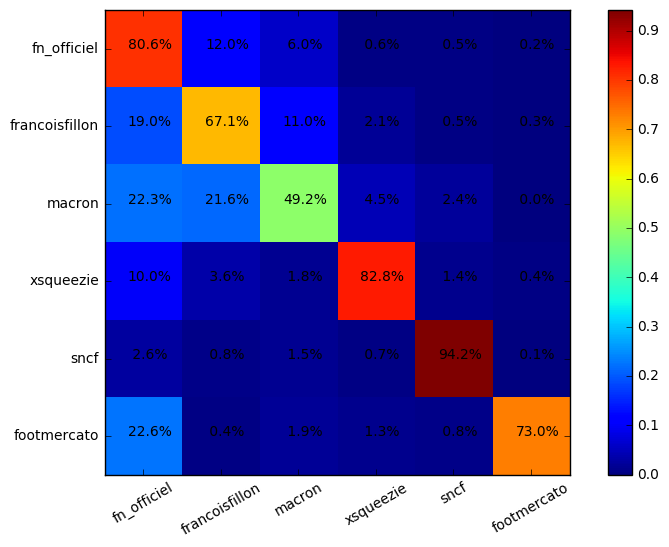

Epoch    3 : 3548.86   Test accuracy: 72.77 77.27 75.77 74.00 75.73 75.43 75.11 
Epoch    3 : 3542.85   Test accuracy: 72.66 77.25 75.80 73.93 75.73 75.41 75.07 
Epoch    3 : 3536.98   Test accuracy: 72.57 77.23 75.71 73.89 75.71 75.48 75.00 
Epoch    3 : 3531.22   Test accuracy: 72.57 77.21 75.64 73.86 75.57 75.45 75.05 
Epoch    3 : 3525.59   Test accuracy: 72.54 77.16 75.64 73.86 75.57 75.45 75.02 
Epoch    3 : 3520.06   Test accuracy: 72.57 77.25 75.64 73.82 75.68 75.48 75.00 
Epoch    3 : 3514.64   Test accuracy: 72.57 77.30 75.68 73.79 75.68 75.41 74.95 
Epoch    3 : 3509.30   Test accuracy: 72.57 77.23 75.71 73.73 75.71 75.36 75.00 
Epoch    3 : 3504.06   Test accuracy: 72.63 77.16 75.64 73.73 75.64 75.39 74.98 
Epoch    3 : 3498.90   Test accuracy: 72.59 77.18 75.68 73.66 75.64 75.48 74.95 
-------------------------------------------------
| 81.2% | 11.5% |  6.0% |  0.6% |  0.5% |  0.2% |   Total: 940
-------------------------------------------------
| 19.3% | 66.4% | 11.5% |  

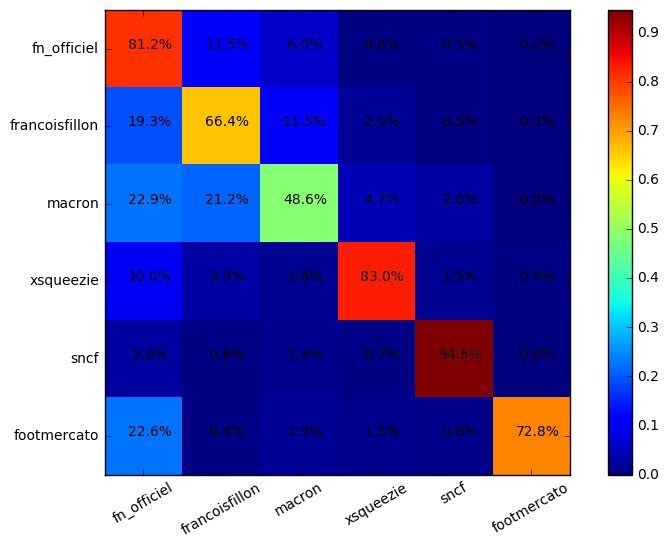

##################### 7 - Essai 3 ###################
Epoch    3 : 5123.80   Test accuracy: 67.54 71.75 70.13 68.36 70.09 70.20 69.54 
Epoch    3 : 4595.29   Test accuracy: 70.00 73.54 72.13 70.38 72.11 72.41 71.41 
Epoch    3 : 4424.00   Test accuracy: 70.68 74.07 73.20 71.25 73.02 73.20 72.38 
Epoch    3 : 4319.82   Test accuracy: 71.34 74.64 73.95 71.93 73.66 74.04 72.86 
Epoch    3 : 4244.16   Test accuracy: 72.09 75.23 74.50 72.43 74.36 74.68 73.38 
Epoch    3 : 4184.68   Test accuracy: 72.13 75.45 74.82 72.84 74.55 74.95 73.82 
Epoch    3 : 4135.54   Test accuracy: 72.32 75.52 74.80 72.66 74.66 75.07 73.93 
Epoch    3 : 4093.54   Test accuracy: 72.16 75.64 74.84 72.86 74.75 74.95 74.07 
Epoch    3 : 4056.80   Test accuracy: 72.13 75.86 74.91 72.98 74.89 74.98 74.36 
Epoch    3 : 4024.14   Test accuracy: 72.36 75.89 74.93 73.18 74.93 75.20 74.41 
-------------------------------------------------
| 78.4% | 13.5% |  7.0% |  0.7% |  0.1% |  0.2% |   Total: 940
-----------------------

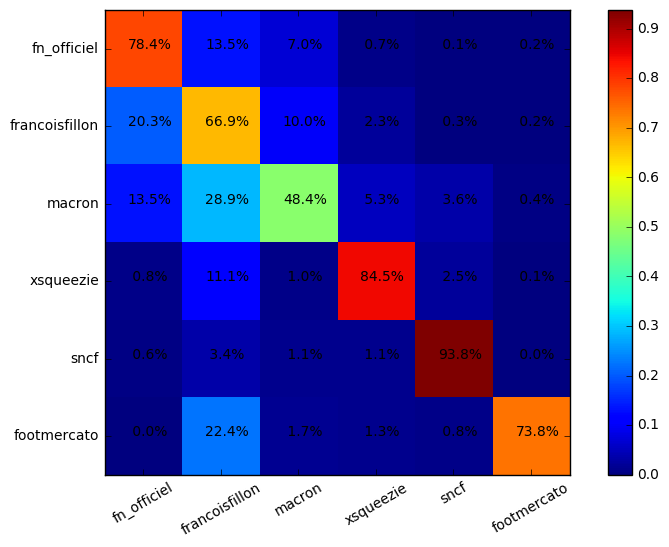

Epoch    3 : 3994.69   Test accuracy: 72.38 76.18 74.98 73.16 74.98 75.30 74.61 
Epoch    3 : 3967.81   Test accuracy: 72.45 76.14 75.34 73.27 75.18 75.41 74.77 
Epoch    3 : 3943.02   Test accuracy: 72.54 76.16 75.48 73.32 75.27 75.61 74.77 
Epoch    3 : 3920.02   Test accuracy: 72.57 76.36 75.34 73.38 75.34 75.73 74.91 
Epoch    3 : 3898.59   Test accuracy: 72.52 76.43 75.32 73.36 75.59 75.66 74.95 
Epoch    3 : 3878.58   Test accuracy: 72.54 76.39 75.39 73.54 75.45 75.64 74.91 
Epoch    3 : 3859.86   Test accuracy: 72.54 76.73 75.59 73.64 75.43 75.61 74.84 
Epoch    3 : 3842.30   Test accuracy: 72.54 76.77 75.64 73.66 75.57 75.73 74.82 
Epoch    3 : 3825.79   Test accuracy: 72.54 76.73 75.77 73.77 75.55 75.82 74.86 
Epoch    3 : 3810.19   Test accuracy: 72.52 76.80 75.73 73.73 75.59 75.86 74.93 
-------------------------------------------------
| 80.1% | 12.4% |  6.2% |  0.9% |  0.2% |  0.2% |   Total: 940
-------------------------------------------------
| 18.8% | 67.3% | 10.7% |  

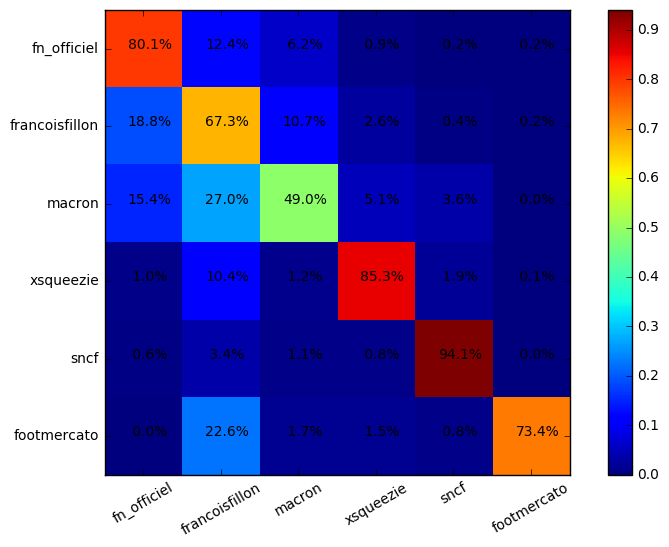

Epoch    3 : 3795.41   Test accuracy: 72.63 76.89 75.71 73.68 75.52 75.89 74.91 
Epoch    3 : 3781.34   Test accuracy: 72.73 77.02 75.71 73.77 75.57 75.89 74.82 
Epoch    3 : 3767.91   Test accuracy: 72.84 77.09 75.59 73.79 75.48 75.82 74.86 
Epoch    3 : 3755.07   Test accuracy: 72.93 77.02 75.61 73.91 75.52 75.89 74.93 
Epoch    3 : 3742.75   Test accuracy: 72.93 77.14 75.64 73.98 75.48 75.98 74.98 
Epoch    3 : 3730.92   Test accuracy: 72.91 77.07 75.66 73.91 75.61 75.91 74.95 
Epoch    3 : 3719.51   Test accuracy: 73.00 77.00 75.68 73.84 75.64 75.93 75.00 
Epoch    3 : 3708.50   Test accuracy: 72.91 77.00 75.86 74.00 75.75 76.00 75.14 
Epoch    3 : 3697.85   Test accuracy: 73.09 76.98 75.84 73.95 75.75 75.93 75.11 
Epoch    3 : 3687.53   Test accuracy: 73.11 77.07 75.75 73.86 75.77 76.00 75.16 
-------------------------------------------------
| 79.9% | 12.3% |  6.5% |  0.7% |  0.2% |  0.3% |   Total: 940
-------------------------------------------------
| 19.4% | 66.7% | 11.2% |  

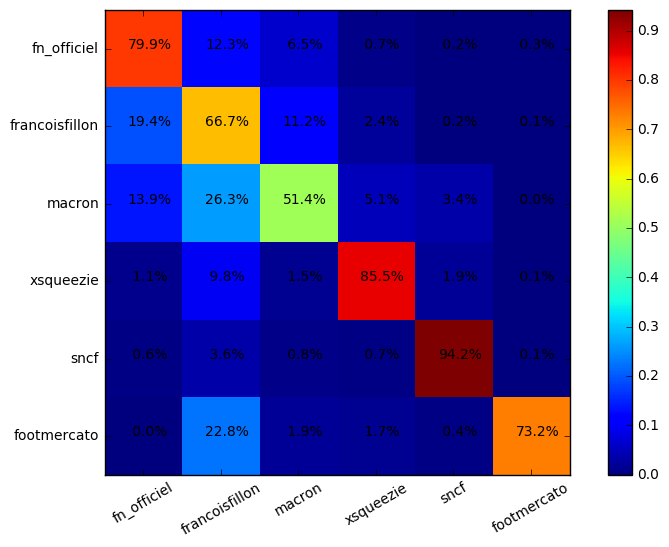

Epoch    3 : 3677.51   Test accuracy: 73.07 77.12 75.77 73.98 75.64 75.93 75.20 
Epoch    3 : 3667.77   Test accuracy: 73.11 77.16 75.77 73.95 75.71 75.98 75.11 
Epoch    3 : 3658.30   Test accuracy: 73.11 77.18 75.84 74.02 75.75 76.00 75.16 
Epoch    3 : 3649.09   Test accuracy: 73.11 77.12 75.96 74.00 75.84 76.09 75.18 
Epoch    3 : 3640.12   Test accuracy: 73.13 77.09 76.00 74.04 75.86 76.09 75.09 
Epoch    3 : 3631.39   Test accuracy: 73.16 77.12 76.02 74.11 75.84 76.09 75.09 
Epoch    3 : 3622.88   Test accuracy: 73.25 77.16 75.86 73.95 75.89 76.14 75.30 
Epoch    3 : 3614.58   Test accuracy: 73.27 77.12 75.84 73.93 75.80 76.11 75.18 
Epoch    3 : 3606.49   Test accuracy: 73.25 77.12 75.93 73.93 75.91 76.25 75.18 
Epoch    3 : 3598.59   Test accuracy: 73.25 77.16 76.07 74.11 75.98 76.34 75.27 
-------------------------------------------------
| 80.5% | 11.7% |  6.5% |  0.7% |  0.2% |  0.3% |   Total: 940
-------------------------------------------------
| 18.8% | 66.8% | 11.6% |  

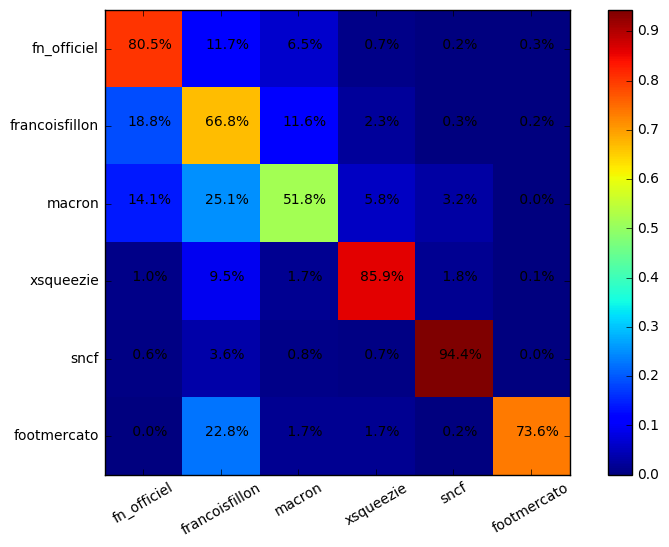

Epoch    3 : 3590.88   Test accuracy: 73.32 77.02 76.09 74.14 75.93 76.41 75.23 
Epoch    3 : 3583.34   Test accuracy: 73.32 77.14 76.09 74.11 75.93 76.41 75.27 
Epoch    3 : 3575.96   Test accuracy: 73.32 77.09 76.21 74.20 76.02 76.41 75.34 
Epoch    3 : 3568.74   Test accuracy: 73.29 77.12 76.27 74.27 76.05 76.16 75.39 
Epoch    3 : 3561.67   Test accuracy: 73.34 77.14 76.21 74.27 76.09 76.27 75.34 
Epoch    3 : 3554.76   Test accuracy: 73.32 77.21 76.27 74.20 76.18 76.25 75.48 
Epoch    3 : 3547.98   Test accuracy: 73.34 77.27 76.21 74.27 76.23 76.27 75.45 
Epoch    3 : 3541.35   Test accuracy: 73.29 77.27 76.23 74.23 76.16 76.25 75.57 
Epoch    3 : 3534.85   Test accuracy: 73.27 77.39 76.25 74.25 76.18 76.27 75.55 
Epoch    3 : 3528.48   Test accuracy: 73.25 77.39 76.32 74.20 76.14 76.25 75.61 
-------------------------------------------------
| 80.6% | 11.8% |  6.3% |  0.7% |  0.2% |  0.3% |   Total: 940
-------------------------------------------------
| 18.9% | 66.9% | 11.5% |  

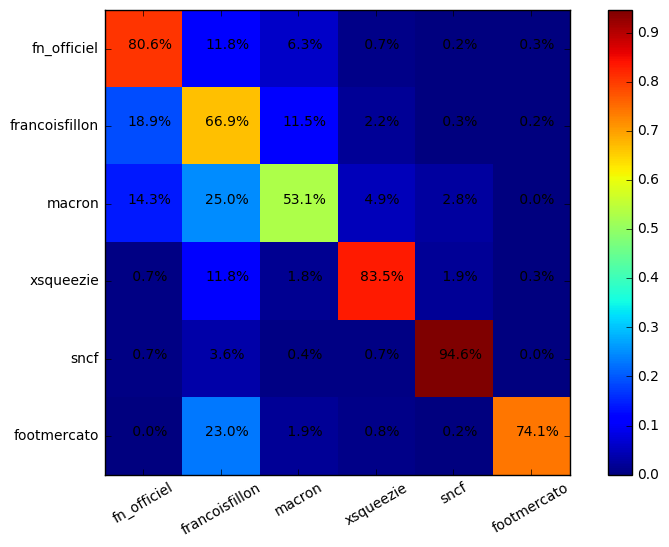

Epoch    3 : 3522.24   Test accuracy: 73.13 77.41 76.30 74.29 76.21 76.16 75.66 
Epoch    3 : 3516.11   Test accuracy: 73.11 77.50 76.27 74.20 76.16 76.09 75.64 
Epoch    3 : 3510.10   Test accuracy: 73.23 77.46 76.21 74.25 76.14 76.02 75.66 
Epoch    3 : 3504.21   Test accuracy: 73.16 77.43 76.25 74.29 76.14 76.02 75.61 
Epoch    3 : 3498.42   Test accuracy: 73.16 77.43 76.21 74.27 76.07 76.02 75.59 
Epoch    3 : 3492.73   Test accuracy: 73.16 77.50 76.25 74.29 76.09 76.07 75.59 
Epoch    3 : 3487.14   Test accuracy: 73.18 77.53 76.32 74.29 76.11 76.09 75.55 
Epoch    3 : 3481.65   Test accuracy: 73.25 77.64 76.30 74.25 76.11 76.16 75.52 
Epoch    3 : 3476.25   Test accuracy: 73.23 77.66 76.32 74.36 76.21 76.11 75.52 
Epoch    3 : 3470.95   Test accuracy: 73.27 77.68 76.36 74.39 76.32 76.11 75.48 
-------------------------------------------------
| 80.2% | 12.1% |  6.4% |  0.7% |  0.2% |  0.3% |   Total: 940
-------------------------------------------------
| 18.2% | 66.8% | 12.1% |  

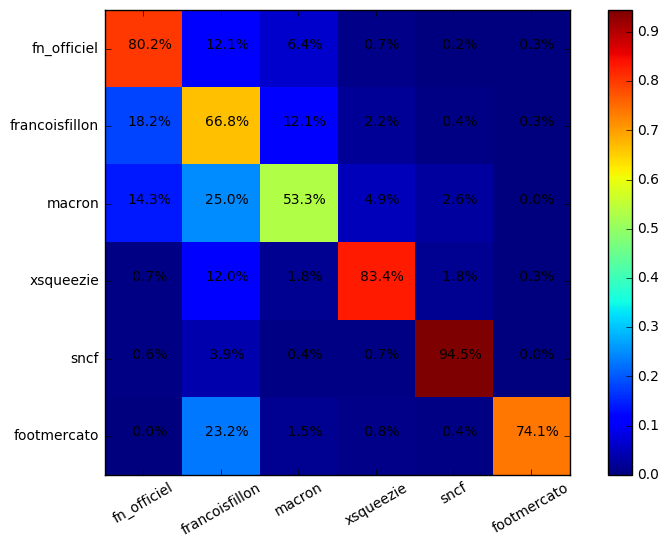

##################### 7 - Essai 4 ###################
Epoch    3 : 5191.75   Test accuracy: 67.54 71.72 69.95 68.45 69.88 69.97 69.20 
Epoch    3 : 4623.50   Test accuracy: 69.47 73.61 71.79 70.13 71.61 71.82 71.27 
Epoch    3 : 4437.03   Test accuracy: 70.15 74.16 72.66 71.09 72.47 72.95 72.50 
Epoch    3 : 4327.41   Test accuracy: 70.72 74.45 73.16 71.54 73.04 73.43 72.70 
Epoch    3 : 4250.10   Test accuracy: 70.97 74.57 73.43 71.59 73.38 73.86 72.82 
Epoch    3 : 4190.76   Test accuracy: 71.27 75.09 73.79 72.00 73.54 74.04 73.04 
Epoch    3 : 4142.64   Test accuracy: 71.47 75.20 74.09 72.32 73.79 74.34 73.18 
Epoch    3 : 4101.97   Test accuracy: 71.72 75.30 74.25 72.61 73.98 74.52 73.27 
Epoch    3 : 4066.51   Test accuracy: 71.97 75.52 74.39 72.57 74.18 74.61 73.52 
Epoch    3 : 4034.89   Test accuracy: 72.27 75.71 74.57 72.86 74.36 74.80 73.75 
-------------------------------------------------
| 80.3% | 12.6% |  6.0% |  0.5% |  0.2% |  0.4% |   Total: 940
-----------------------

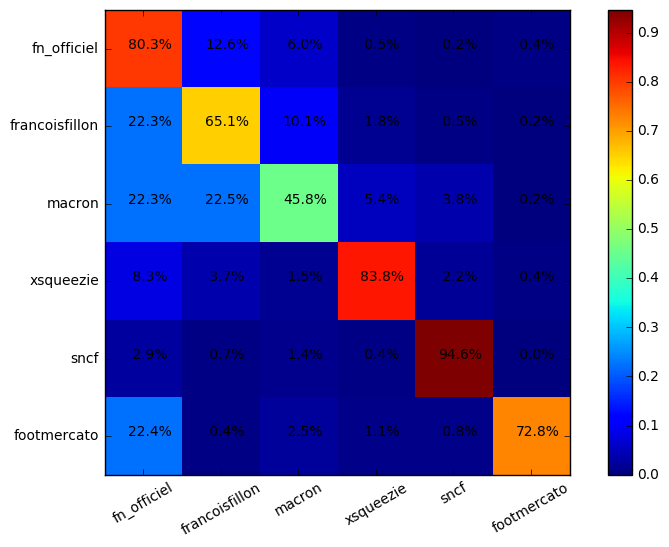

Epoch    3 : 4006.29   Test accuracy: 72.34 75.84 74.70 72.93 74.45 75.05 74.00 
Epoch    3 : 3980.16   Test accuracy: 72.50 76.00 74.89 73.27 74.61 75.05 74.14 
Epoch    3 : 3956.09   Test accuracy: 72.50 76.00 74.98 73.29 74.77 75.20 74.32 
Epoch    3 : 3933.76   Test accuracy: 72.41 76.09 75.18 73.29 74.77 75.30 74.39 
Epoch    3 : 3912.94   Test accuracy: 72.45 76.11 75.25 73.50 74.95 75.48 74.36 
Epoch    3 : 3893.48   Test accuracy: 72.54 76.21 75.25 73.50 75.18 75.48 74.45 
Epoch    3 : 3875.20   Test accuracy: 72.47 76.14 75.39 73.73 75.20 75.68 74.61 
Epoch    3 : 3857.97   Test accuracy: 72.50 76.16 75.55 73.93 75.30 75.80 74.68 
Epoch    3 : 3841.67   Test accuracy: 72.57 76.25 75.52 73.91 75.34 75.80 74.66 
Epoch    3 : 3826.18   Test accuracy: 72.70 76.30 75.57 73.93 75.32 75.84 74.75 
-------------------------------------------------
| 81.4% | 11.2% |  6.4% |  0.5% |  0.2% |  0.3% |   Total: 940
-------------------------------------------------
| 20.5% | 67.0% | 10.2% |  

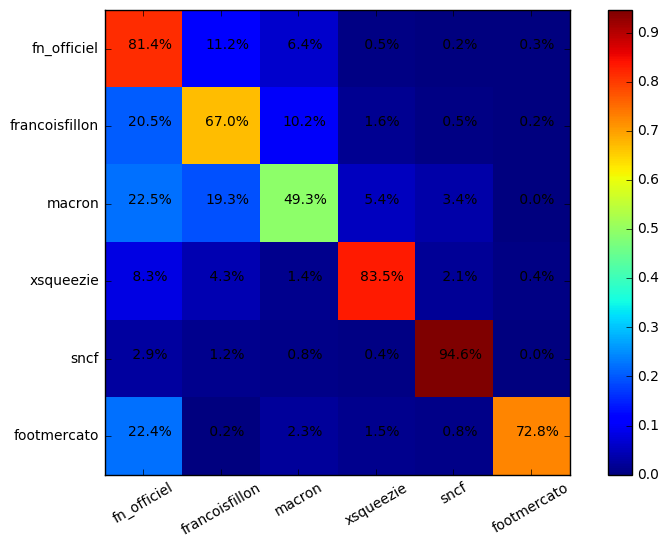

Epoch    3 : 3811.41   Test accuracy: 72.73 76.34 75.61 73.95 75.55 75.86 74.77 
Epoch    3 : 3797.29   Test accuracy: 72.77 76.36 75.68 74.09 75.48 75.82 74.84 
Epoch    3 : 3783.77   Test accuracy: 72.75 76.32 75.89 74.09 75.61 75.89 74.86 
Epoch    3 : 3770.81   Test accuracy: 72.88 76.43 75.93 74.14 75.73 75.80 74.95 
Epoch    3 : 3758.37   Test accuracy: 72.98 76.43 75.93 74.23 75.84 75.82 74.86 
Epoch    3 : 3746.41   Test accuracy: 72.77 76.43 75.98 74.34 75.82 75.84 74.86 
Epoch    3 : 3734.90   Test accuracy: 72.70 76.52 76.11 74.43 75.84 75.77 74.95 
Epoch    3 : 3723.78   Test accuracy: 72.86 76.66 76.16 74.43 75.91 75.77 75.02 
Epoch    3 : 3713.02   Test accuracy: 72.82 76.57 76.07 74.43 75.98 75.75 74.98 
Epoch    3 : 3702.57   Test accuracy: 72.93 76.64 76.11 74.41 76.02 75.84 75.02 
-------------------------------------------------
| 81.9% | 11.1% |  6.2% |  0.4% |  0.2% |  0.2% |   Total: 940
-------------------------------------------------
| 20.0% | 67.2% | 10.5% |  

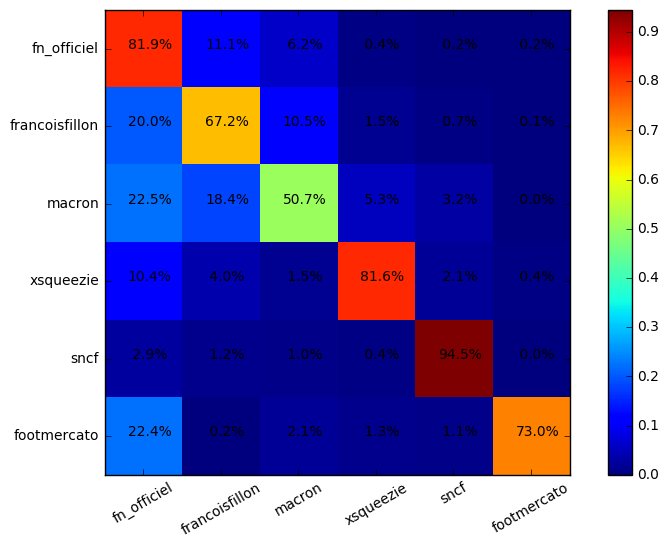

Epoch    3 : 3692.41   Test accuracy: 72.95 76.59 76.11 74.29 75.91 75.64 74.95 
Epoch    3 : 3682.53   Test accuracy: 72.91 76.62 75.96 74.18 75.80 75.66 75.00 
Epoch    3 : 3672.95   Test accuracy: 72.84 76.71 75.77 74.14 75.75 75.52 74.98 
Epoch    3 : 3663.66   Test accuracy: 72.86 76.64 75.89 74.11 75.86 75.52 75.02 
Epoch    3 : 3654.65   Test accuracy: 73.00 76.52 75.84 74.07 75.89 75.45 75.00 
Epoch    3 : 3645.91   Test accuracy: 73.04 76.46 75.71 74.07 75.73 75.50 75.07 
Epoch    3 : 3637.41   Test accuracy: 73.09 76.55 75.86 74.11 75.75 75.55 75.07 
Epoch    3 : 3629.15   Test accuracy: 73.07 76.57 75.86 74.25 75.73 75.64 74.98 
Epoch    3 : 3621.10   Test accuracy: 73.11 76.62 75.84 74.16 75.66 75.61 75.05 
Epoch    3 : 3613.27   Test accuracy: 73.18 76.64 75.82 74.18 75.66 75.61 75.07 
-------------------------------------------------
| 82.1% | 10.9% |  6.3% |  0.5% |  0.1% |  0.1% |   Total: 940
-------------------------------------------------
| 20.3% | 66.3% | 10.9% |  

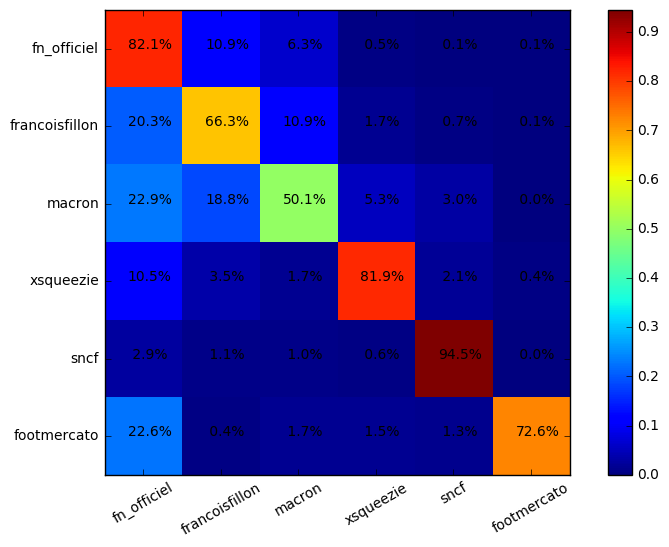

Epoch    3 : 3605.65   Test accuracy: 73.11 76.66 75.73 74.23 75.59 75.57 75.02 
Epoch    3 : 3598.23   Test accuracy: 73.09 76.62 75.75 74.25 75.59 75.52 74.95 
Epoch    3 : 3591.02   Test accuracy: 73.09 76.68 75.73 74.23 75.64 75.50 74.93 
Epoch    3 : 3584.03   Test accuracy: 73.09 76.62 75.77 74.23 75.68 75.52 74.91 
Epoch    3 : 3577.24   Test accuracy: 73.09 76.66 75.84 74.18 75.64 75.50 74.95 
Epoch    3 : 3570.64   Test accuracy: 73.09 76.66 75.73 74.23 75.50 75.61 75.02 
Epoch    3 : 3564.22   Test accuracy: 73.11 76.66 75.71 74.27 75.45 75.59 74.95 
Epoch    3 : 3557.98   Test accuracy: 73.16 76.66 75.84 74.25 75.50 75.64 75.00 
Epoch    3 : 3551.89   Test accuracy: 73.16 76.59 75.84 74.25 75.52 75.64 75.00 
Epoch    3 : 3545.96   Test accuracy: 73.18 76.59 75.89 74.25 75.52 75.66 75.05 
-------------------------------------------------
| 81.4% | 11.5% |  6.1% |  0.6% |  0.3% |  0.1% |   Total: 940
-------------------------------------------------
| 20.0% | 66.7% | 10.8% |  

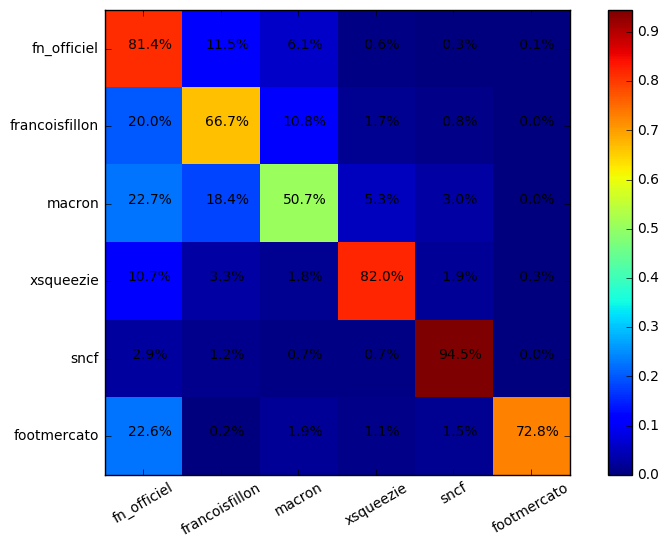

Epoch    3 : 3540.16   Test accuracy: 73.25 76.62 75.98 74.27 75.55 75.68 75.16 
Epoch    3 : 3534.51   Test accuracy: 73.23 76.52 75.96 74.23 75.59 75.09 75.16 
Epoch    3 : 3528.98   Test accuracy: 73.25 76.57 75.93 74.25 75.64 75.05 75.18 
Epoch    3 : 3523.56   Test accuracy: 73.20 76.52 75.93 74.29 75.71 75.16 75.23 
Epoch    3 : 3518.26   Test accuracy: 73.16 76.48 75.84 74.29 75.77 75.16 75.27 
Epoch    3 : 3513.07   Test accuracy: 73.16 76.41 75.82 74.34 75.75 75.23 75.16 
Epoch    3 : 3507.97   Test accuracy: 73.20 76.34 75.75 74.34 75.66 75.20 75.18 
Epoch    3 : 3502.98   Test accuracy: 73.23 76.23 75.71 74.29 75.68 75.16 75.14 
Epoch    3 : 3498.07   Test accuracy: 73.20 76.18 75.73 74.27 75.61 75.16 75.07 
Epoch    3 : 3493.24   Test accuracy: 73.18 76.18 75.66 74.27 75.64 75.07 74.98 
-------------------------------------------------
| 81.9% | 11.1% |  6.0% |  0.7% |  0.2% |  0.1% |   Total: 940
-------------------------------------------------
| 20.0% | 66.6% | 10.9% |  

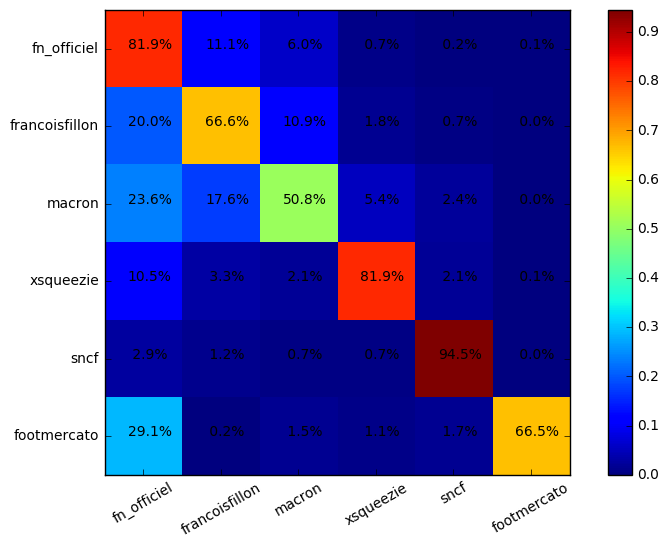

##################### 8 - Essai 0 ###################
Epoch    3 : 4707.12   Test accuracy: 72.22 75.18 74.14 72.66 74.20 74.18 73.52 
Epoch    3 : 4332.69   Test accuracy: 75.36 76.21 76.43 75.59 76.23 76.57 75.77 
Epoch    3 : 4174.53   Test accuracy: 75.84 76.77 77.02 76.21 76.98 77.25 76.46 
Epoch    3 : 4066.70   Test accuracy: 76.46 77.34 77.73 76.87 77.71 77.89 77.07 
Epoch    3 : 3985.67   Test accuracy: 76.91 77.50 78.16 77.07 77.98 78.48 77.41 
Epoch    3 : 3920.55   Test accuracy: 77.14 77.53 78.48 77.16 78.21 78.80 77.82 
Epoch    3 : 3865.86   Test accuracy: 77.32 77.73 78.84 77.50 78.55 78.98 77.91 
Epoch    3 : 3818.70   Test accuracy: 74.18 77.78 77.14 75.00 76.80 77.23 76.25 
Epoch    3 : 3777.27   Test accuracy: 74.45 77.73 77.16 75.00 77.00 77.37 76.23 
Epoch    3 : 3740.31   Test accuracy: 74.45 78.00 77.30 75.20 77.00 77.43 76.36 
-------------------------------------------------
| 72.3% | 18.3% |  7.9% |  0.7% |  0.4% |  0.3% |   Total: 956
-----------------------

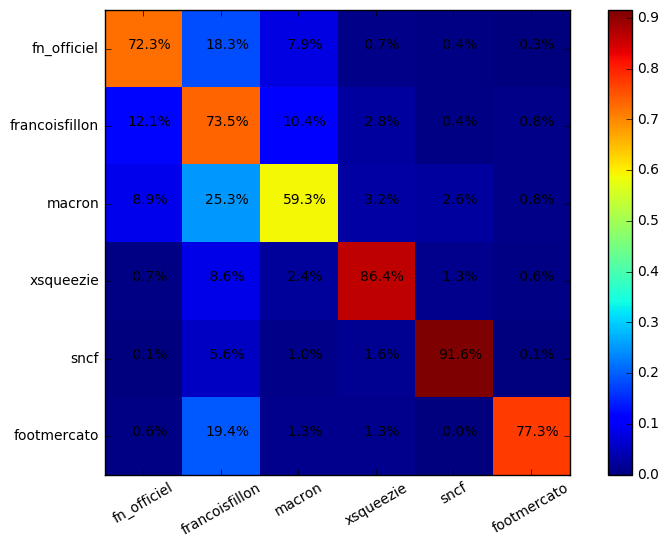

Epoch    3 : 3706.87   Test accuracy: 74.48 78.18 77.21 75.30 77.00 77.57 76.39 
Epoch    3 : 3676.24   Test accuracy: 74.36 78.32 77.27 75.32 77.00 77.64 76.50 
Epoch    3 : 3647.87   Test accuracy: 74.48 78.32 77.27 75.39 77.07 77.48 76.57 
Epoch    3 : 3621.36   Test accuracy: 74.48 78.53 77.30 75.57 77.18 77.50 76.71 
Epoch    3 : 3596.38   Test accuracy: 74.61 78.73 77.41 75.66 77.25 77.66 76.77 
Epoch    3 : 3572.69   Test accuracy: 74.75 78.73 77.41 75.59 77.41 77.62 76.80 
Epoch    3 : 3550.11   Test accuracy: 74.93 78.66 77.41 75.50 77.37 77.71 76.89 
Epoch    3 : 3528.48   Test accuracy: 75.00 78.82 77.50 75.52 77.39 77.68 76.84 
Epoch    3 : 3507.80   Test accuracy: 75.05 78.80 77.68 75.68 77.41 77.75 76.80 
Epoch    3 : 3488.01   Test accuracy: 74.98 78.78 77.62 75.77 77.48 77.96 76.89 
-------------------------------------------------
| 73.8% | 16.8% |  7.9% |  0.6% |  0.4% |  0.3% |   Total: 956
-------------------------------------------------
| 12.8% | 74.3% |  9.4% |  

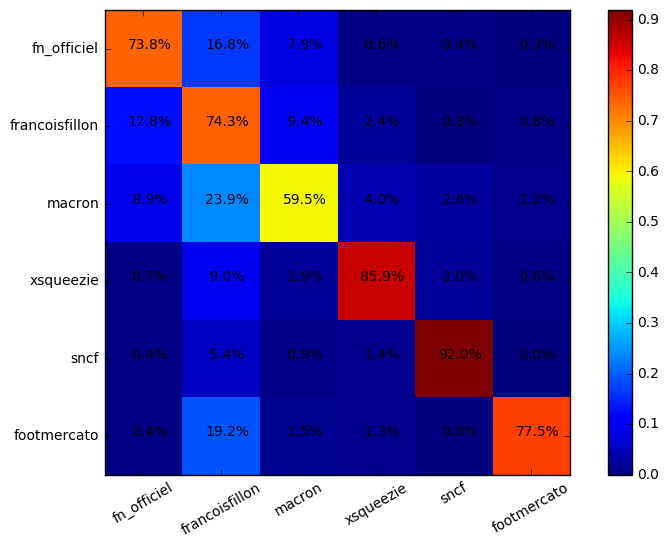

Epoch    3 : 3469.06   Test accuracy: 74.98 78.82 77.66 75.77 77.39 78.07 76.98 
Epoch    3 : 3450.87   Test accuracy: 74.86 78.78 77.68 75.64 77.50 78.09 76.96 
Epoch    3 : 3433.37   Test accuracy: 74.82 78.78 77.62 75.68 77.48 78.05 77.02 
Epoch    3 : 3416.51   Test accuracy: 74.84 78.78 77.66 75.66 77.48 78.05 77.07 
Epoch    3 : 3400.24   Test accuracy: 74.91 78.82 77.68 75.75 77.53 77.96 77.14 
Epoch    3 : 3384.50   Test accuracy: 75.07 78.73 77.75 75.82 77.62 77.87 77.12 
Epoch    3 : 3369.27   Test accuracy: 75.07 78.80 77.75 75.73 77.62 77.91 77.05 
Epoch    3 : 3354.50   Test accuracy: 75.09 78.75 77.71 75.91 77.64 77.73 77.00 
Epoch    3 : 3340.14   Test accuracy: 75.05 78.73 77.55 75.71 77.59 77.75 76.93 
Epoch    3 : 3326.16   Test accuracy: 75.05 78.78 77.43 75.75 77.46 77.71 76.89 
-------------------------------------------------
| 74.2% | 16.3% |  8.2% |  0.6% |  0.4% |  0.3% |   Total: 956
-------------------------------------------------
| 12.6% | 73.8% |  9.9% |  

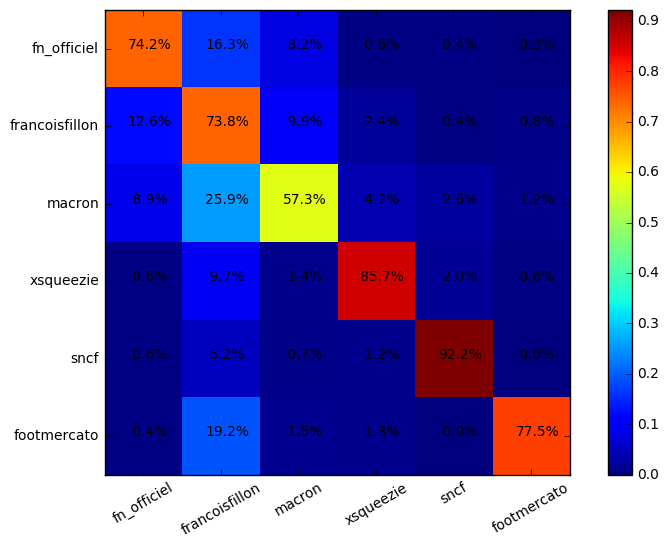

Epoch    3 : 3312.52   Test accuracy: 75.02 78.89 77.39 75.59 77.41 77.64 76.89 
Epoch    3 : 3299.20   Test accuracy: 75.00 78.87 77.34 75.57 77.37 77.62 76.84 
Epoch    3 : 3286.22   Test accuracy: 75.18 78.94 77.32 75.57 77.37 77.66 76.89 
Epoch    3 : 3273.57   Test accuracy: 75.14 78.96 77.53 75.61 77.27 77.59 76.80 
Epoch    3 : 3261.21   Test accuracy: 75.11 79.07 77.48 75.61 77.41 77.62 76.80 
Epoch    3 : 3249.04   Test accuracy: 75.16 79.00 77.57 75.61 77.39 77.59 76.75 
Epoch    3 : 3237.23   Test accuracy: 75.20 79.14 77.55 75.66 77.43 77.59 76.77 
Epoch    3 : 3225.72   Test accuracy: 75.18 79.12 77.55 75.64 77.43 77.64 76.84 
Epoch    3 : 3214.50   Test accuracy: 75.27 79.12 77.59 75.66 77.50 77.71 76.96 
Epoch    3 : 3203.56   Test accuracy: 75.32 79.07 77.66 75.71 77.55 77.71 77.05 
-------------------------------------------------
| 74.7% | 15.9% |  8.2% |  0.7% |  0.3% |  0.2% |   Total: 956
-------------------------------------------------
| 12.4% | 73.3% | 10.9% |  

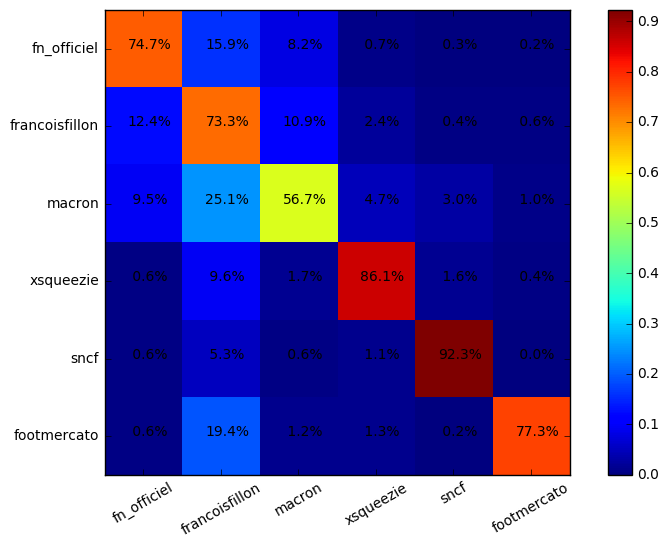

Epoch    3 : 3192.91   Test accuracy: 75.30 79.03 77.75 75.82 77.68 77.89 77.14 
Epoch    3 : 3182.53   Test accuracy: 75.34 79.07 77.78 75.86 77.80 77.93 77.21 
Epoch    3 : 3172.42   Test accuracy: 75.23 79.12 77.80 75.89 77.73 77.98 77.09 
Epoch    3 : 3162.55   Test accuracy: 75.16 79.16 77.62 75.91 77.62 78.00 77.09 
Epoch    3 : 3152.91   Test accuracy: 75.14 79.19 77.68 75.80 77.64 78.12 77.14 
Epoch    3 : 3143.49   Test accuracy: 75.00 79.12 77.78 75.84 77.66 78.05 77.32 
Epoch    3 : 3134.28   Test accuracy: 76.07 79.12 78.39 76.64 78.18 78.55 77.80 
Epoch    3 : 3125.27   Test accuracy: 76.02 79.12 78.37 76.59 78.23 78.46 77.73 
Epoch    3 : 3116.44   Test accuracy: 75.82 79.12 78.25 76.62 78.16 78.50 77.75 
Epoch    3 : 3107.78   Test accuracy: 75.80 79.16 78.25 76.57 78.12 78.50 77.84 
-------------------------------------------------
| 74.7% | 14.9% |  8.5% |  0.7% |  1.0% |  0.2% |   Total: 956
-------------------------------------------------
| 12.1% | 72.2% | 10.9% |  

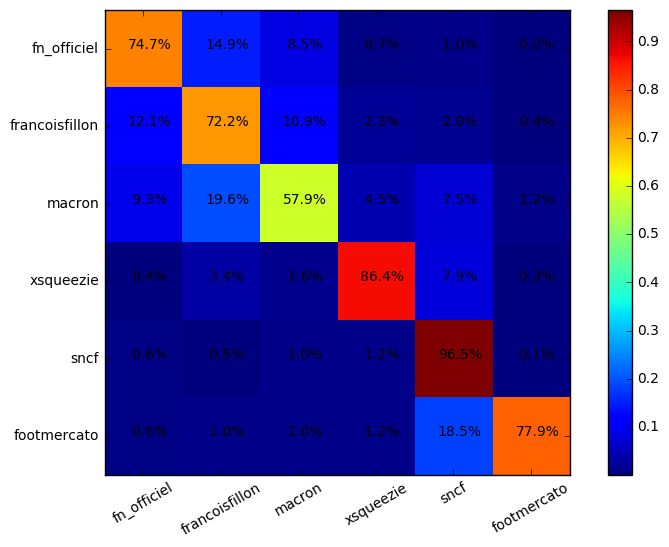

Epoch    3 : 3099.28   Test accuracy: 75.82 79.21 78.25 76.57 78.16 78.50 77.84 
Epoch    3 : 3090.90   Test accuracy: 75.80 79.25 78.21 76.64 78.07 78.43 77.84 
Epoch    3 : 3082.64   Test accuracy: 75.77 79.25 78.21 76.68 78.07 78.55 77.89 
Epoch    3 : 3074.59   Test accuracy: 75.80 79.25 78.32 76.73 78.14 78.64 77.87 
Epoch    3 : 3066.70   Test accuracy: 75.80 79.21 78.32 76.75 78.21 78.62 77.89 
Epoch    3 : 3059.00   Test accuracy: 75.80 79.14 78.34 76.75 78.32 78.55 77.91 
Epoch    3 : 3051.46   Test accuracy: 75.75 79.09 78.37 76.75 78.43 78.55 77.87 
Epoch    3 : 3044.04   Test accuracy: 75.68 79.07 78.34 76.71 78.37 78.46 77.87 
Epoch    3 : 3036.74   Test accuracy: 75.59 79.12 78.37 76.77 78.41 78.57 77.78 
Epoch    3 : 3029.54   Test accuracy: 75.57 79.12 78.28 76.75 78.32 78.53 77.71 
-------------------------------------------------
| 74.5% | 15.0% |  8.7% |  0.7% |  0.9% |  0.2% |   Total: 956
-------------------------------------------------
| 12.6% | 71.5% | 11.1% |  

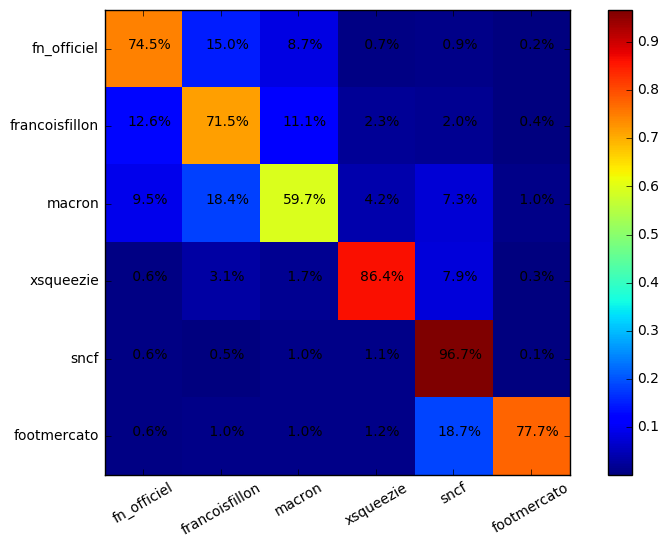

##################### 8 - Essai 1 ###################
Epoch    3 : 4840.77   Test accuracy: 72.13 75.34 74.18 72.75 74.16 74.41 73.93 
Epoch    3 : 4378.27   Test accuracy: 72.93 76.62 75.52 73.91 75.39 75.57 75.23 
Epoch    3 : 4197.67   Test accuracy: 74.00 77.25 76.23 74.64 76.14 76.41 75.77 
Epoch    3 : 4076.60   Test accuracy: 74.82 77.53 76.89 75.25 76.73 77.12 76.14 
Epoch    3 : 3986.09   Test accuracy: 75.16 77.64 77.41 75.68 77.32 77.48 76.34 
Epoch    3 : 3917.10   Test accuracy: 75.34 77.96 77.48 75.93 77.41 77.64 76.66 
Epoch    3 : 3862.21   Test accuracy: 75.59 78.37 77.73 76.07 77.43 77.87 76.96 
Epoch    3 : 3816.13   Test accuracy: 74.48 78.43 77.39 75.36 77.25 77.50 76.75 
Epoch    3 : 3775.90   Test accuracy: 74.59 78.48 77.75 75.64 77.62 77.66 76.89 
Epoch    3 : 3739.87   Test accuracy: 74.57 78.57 77.73 75.75 77.71 77.89 76.98 
-------------------------------------------------
| 74.6% | 16.8% |  6.8% |  0.6% |  0.6% |  0.5% |   Total: 956
-----------------------

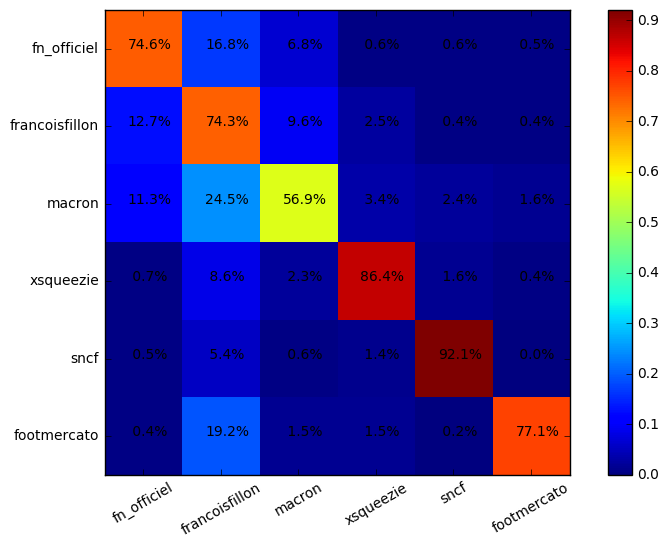

Epoch    3 : 3707.13   Test accuracy: 74.73 78.53 77.91 75.91 77.84 77.91 77.07 
Epoch    3 : 3677.12   Test accuracy: 74.75 78.66 77.93 76.00 77.93 78.00 77.02 
Epoch    3 : 3649.43   Test accuracy: 74.84 78.69 78.07 76.02 77.96 78.16 77.09 
Epoch    3 : 3623.70   Test accuracy: 74.98 78.84 78.18 76.07 78.03 78.16 77.14 
Epoch    3 : 3599.64   Test accuracy: 75.05 78.94 78.30 76.11 78.21 78.28 77.34 
Epoch    3 : 3577.00   Test accuracy: 74.93 79.03 78.12 76.16 78.18 78.07 77.37 
Epoch    3 : 3555.55   Test accuracy: 74.98 79.00 78.12 76.23 78.14 78.16 77.32 
Epoch    3 : 3535.12   Test accuracy: 75.00 78.98 78.09 76.23 78.09 78.18 77.39 
Epoch    3 : 3515.54   Test accuracy: 75.05 79.12 78.07 76.11 78.07 78.28 77.39 
Epoch    3 : 3496.70   Test accuracy: 75.09 79.09 78.07 76.18 77.98 78.28 77.32 
-------------------------------------------------
| 75.2% | 16.4% |  6.6% |  0.7% |  0.5% |  0.5% |   Total: 956
-------------------------------------------------
| 12.4% | 74.5% | 10.2% |  

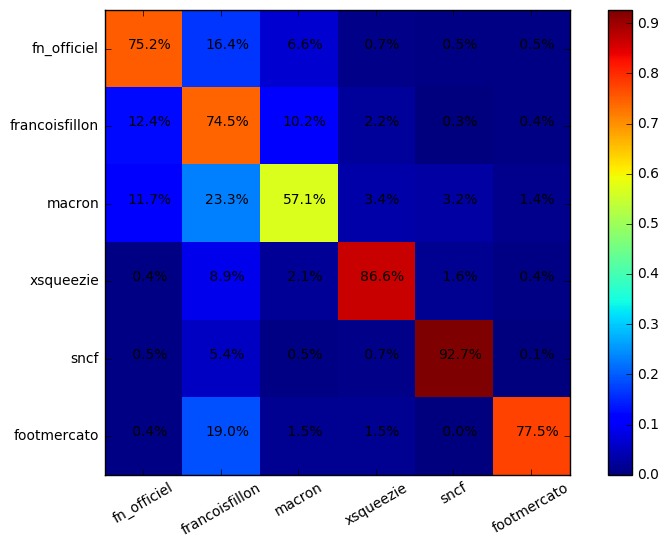

Epoch    3 : 3478.50   Test accuracy: 75.07 79.25 78.07 76.14 77.96 78.28 77.32 
Epoch    3 : 3460.91   Test accuracy: 75.07 79.25 78.09 76.21 78.09 78.32 77.30 
Epoch    3 : 3443.88   Test accuracy: 75.14 79.19 78.23 76.18 78.09 78.37 77.39 
Epoch    3 : 3427.38   Test accuracy: 75.25 79.30 78.34 76.25 78.16 78.41 77.39 
Epoch    3 : 3411.44   Test accuracy: 75.25 79.44 78.32 76.34 78.21 78.62 77.41 
Epoch    3 : 3396.04   Test accuracy: 75.27 79.46 78.32 76.43 78.18 78.62 77.46 
Epoch    3 : 3381.16   Test accuracy: 75.30 79.46 78.41 76.32 78.14 78.66 77.43 
Epoch    3 : 3366.78   Test accuracy: 75.34 79.39 78.37 76.39 78.14 78.57 77.39 
Epoch    3 : 3352.90   Test accuracy: 75.43 79.48 78.37 76.34 78.16 78.53 77.46 
Epoch    3 : 3339.46   Test accuracy: 75.48 79.53 78.28 76.39 78.23 78.57 77.53 
-------------------------------------------------
| 75.7% | 15.8% |  6.9% |  0.6% |  0.5% |  0.4% |   Total: 956
-------------------------------------------------
| 11.7% | 75.1% | 10.0% |  

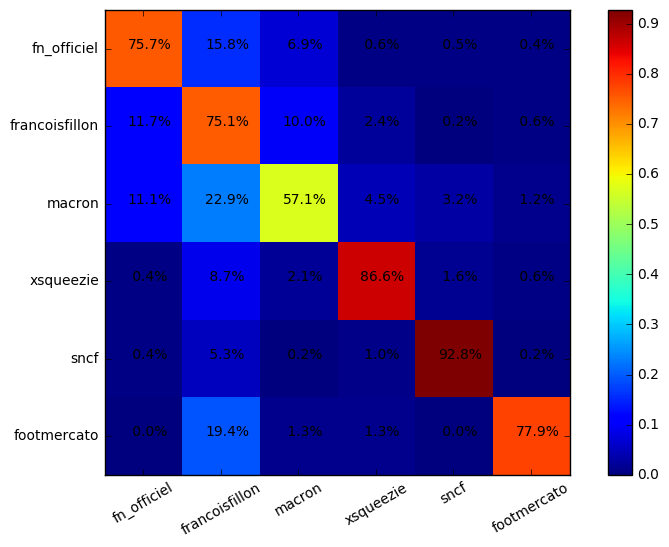

Epoch    3 : 3326.43   Test accuracy: 75.39 79.62 78.30 76.39 78.25 78.62 77.59 
Epoch    3 : 3313.80   Test accuracy: 75.34 79.62 78.34 76.41 78.23 78.71 77.66 
Epoch    3 : 3301.52   Test accuracy: 75.36 79.62 78.50 76.55 78.28 78.71 77.62 
Epoch    3 : 3289.57   Test accuracy: 75.45 79.57 78.39 76.55 78.30 78.75 77.62 
Epoch    3 : 3277.93   Test accuracy: 75.48 79.64 78.48 76.55 78.28 78.66 77.73 
Epoch    3 : 3266.58   Test accuracy: 75.57 79.48 78.50 76.48 78.30 78.69 77.68 
Epoch    3 : 3255.47   Test accuracy: 75.57 79.53 78.48 76.52 78.32 78.69 77.78 
Epoch    3 : 3244.61   Test accuracy: 75.64 79.44 78.46 76.50 78.37 78.71 77.75 
Epoch    3 : 3233.96   Test accuracy: 75.64 79.37 78.46 76.62 78.37 78.66 77.78 
Epoch    3 : 3223.52   Test accuracy: 75.77 79.48 78.48 76.64 78.43 78.66 77.82 
-------------------------------------------------
| 75.7% | 15.4% |  7.2% |  0.8% |  0.5% |  0.3% |   Total: 956
-------------------------------------------------
| 11.4% | 74.9% | 10.6% |  

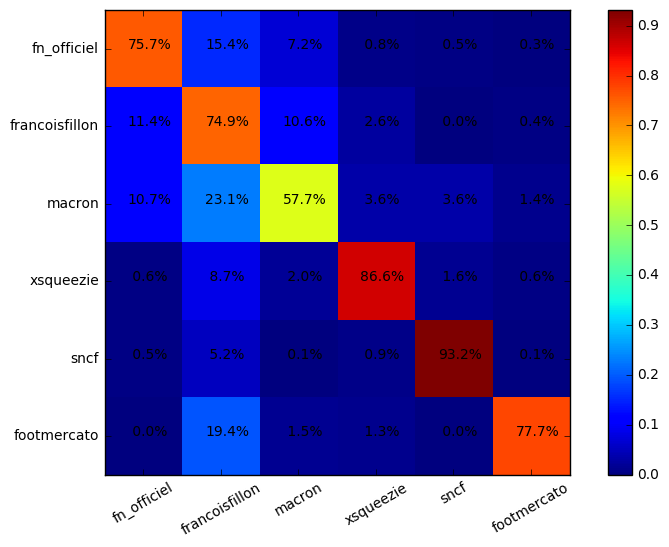

Epoch    3 : 3213.26   Test accuracy: 75.75 79.48 78.48 76.66 78.46 78.55 77.89 
Epoch    3 : 3203.19   Test accuracy: 75.82 79.53 78.53 76.59 78.48 78.55 77.91 
Epoch    3 : 3193.27   Test accuracy: 75.84 79.48 78.62 76.62 78.57 78.48 77.93 
Epoch    3 : 3183.51   Test accuracy: 75.66 79.53 78.59 76.64 78.50 78.59 77.93 
Epoch    3 : 3173.90   Test accuracy: 75.57 79.55 78.48 76.55 78.43 78.53 77.93 
Epoch    3 : 3164.44   Test accuracy: 75.61 79.48 78.53 76.52 78.37 78.64 77.93 
Epoch    3 : 3155.11   Test accuracy: 75.66 79.44 78.46 76.55 78.37 78.59 77.91 
Epoch    3 : 3145.92   Test accuracy: 75.59 79.48 78.50 76.50 78.28 78.59 77.87 
Epoch    3 : 3136.86   Test accuracy: 75.55 79.50 78.41 76.36 78.21 78.57 77.78 
Epoch    3 : 3127.95   Test accuracy: 75.50 79.50 78.48 76.30 78.23 78.53 77.71 
-------------------------------------------------
| 75.1% | 15.7% |  7.4% |  0.9% |  0.5% |  0.3% |   Total: 956
-------------------------------------------------
| 11.6% | 75.2% |  9.9% |  

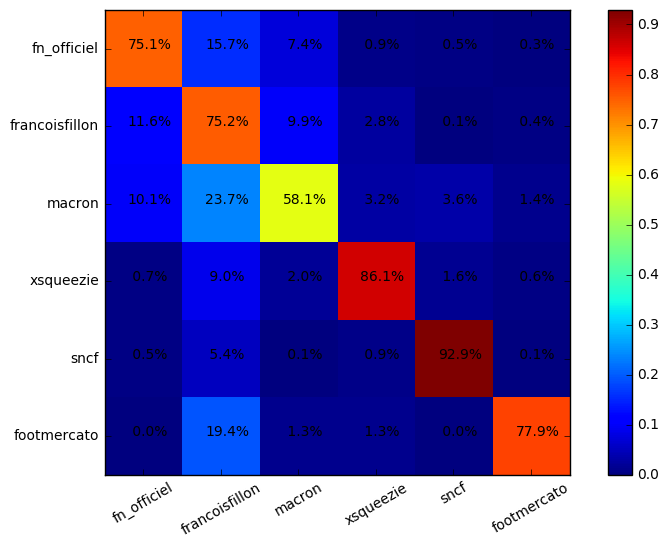

Epoch    3 : 3119.17   Test accuracy: 75.48 79.53 78.48 76.34 78.18 78.48 77.57 
Epoch    3 : 3110.52   Test accuracy: 75.41 79.60 78.43 76.32 78.25 78.53 77.57 
Epoch    3 : 3102.00   Test accuracy: 75.32 79.60 78.41 76.34 78.14 78.48 77.46 
Epoch    3 : 3093.60   Test accuracy: 75.32 79.53 78.34 76.32 78.07 78.53 77.53 
Epoch    3 : 3085.33   Test accuracy: 75.41 79.55 78.39 76.41 78.03 78.57 77.48 
Epoch    3 : 3077.18   Test accuracy: 75.45 79.55 78.43 76.41 77.98 78.59 77.46 
Epoch    3 : 3069.15   Test accuracy: 75.36 79.60 78.46 76.39 77.96 78.66 77.39 
Epoch    3 : 3061.24   Test accuracy: 75.39 79.48 78.37 76.25 77.96 78.55 77.34 
Epoch    3 : 3053.45   Test accuracy: 75.41 79.53 78.43 76.23 78.07 78.50 77.32 
Epoch    3 : 3045.78   Test accuracy: 75.43 79.55 78.46 76.23 78.23 78.50 77.37 
-------------------------------------------------
| 75.1% | 15.3% |  7.7% |  0.8% |  0.5% |  0.5% |   Total: 956
-------------------------------------------------
| 11.4% | 75.9% |  9.6% |  

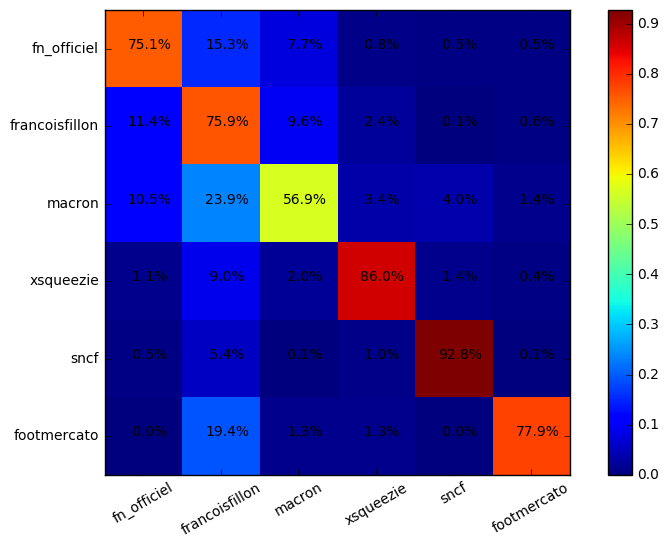

##################### 8 - Essai 2 ###################
Epoch    3 : 4892.31   Test accuracy: 71.84 75.05 74.41 72.91 74.43 74.61 73.93 
Epoch    3 : 4374.78   Test accuracy: 72.07 76.55 75.07 73.41 75.02 75.14 74.48 
Epoch    3 : 4197.39   Test accuracy: 73.09 77.55 75.68 74.07 75.77 75.82 74.95 
Epoch    3 : 4086.97   Test accuracy: 73.95 78.00 76.36 74.45 76.34 76.57 75.52 
Epoch    3 : 4005.67   Test accuracy: 74.02 78.23 76.52 74.75 76.46 76.73 75.91 
Epoch    3 : 3941.85   Test accuracy: 74.50 78.46 76.59 75.00 76.55 76.96 76.00 
Epoch    3 : 3889.19   Test accuracy: 74.70 78.30 76.98 75.32 76.91 77.16 76.41 
Epoch    3 : 3843.86   Test accuracy: 74.82 78.32 77.23 75.64 77.16 77.48 76.66 
Epoch    3 : 3803.53   Test accuracy: 74.93 78.41 77.25 75.66 77.34 77.59 76.82 
Epoch    3 : 3766.81   Test accuracy: 74.89 78.71 77.32 75.71 77.48 77.71 76.91 
-------------------------------------------------
| 75.3% | 14.7% |  8.4% |  0.8% |  0.5% |  0.2% |   Total: 956
-----------------------

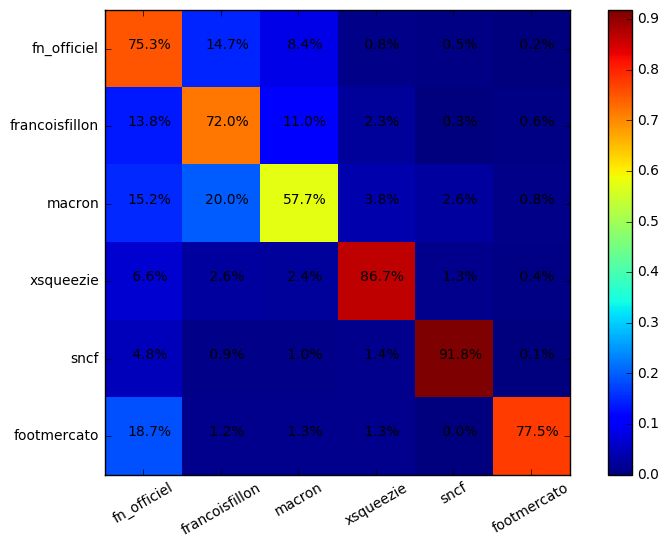

Epoch    3 : 3732.80   Test accuracy: 75.05 78.69 77.43 75.64 77.34 77.66 77.05 
Epoch    3 : 3700.93   Test accuracy: 75.23 78.75 77.46 75.71 77.50 77.71 77.07 
Epoch    3 : 3670.84   Test accuracy: 75.07 78.87 77.55 75.64 77.48 77.78 77.16 
Epoch    3 : 3642.31   Test accuracy: 75.02 79.03 77.57 75.91 77.64 77.68 77.14 
Epoch    3 : 3615.22   Test accuracy: 75.30 79.09 77.68 75.98 77.71 77.71 77.21 
Epoch    3 : 3589.53   Test accuracy: 75.27 79.12 77.80 76.18 77.75 77.87 77.21 
Epoch    3 : 3565.19   Test accuracy: 75.14 79.21 77.80 76.21 77.82 77.93 77.23 
Epoch    3 : 3542.12   Test accuracy: 75.25 79.00 77.87 76.32 77.96 78.03 77.32 
Epoch    3 : 3520.26   Test accuracy: 75.25 78.96 77.75 76.39 77.91 78.07 77.37 
Epoch    3 : 3499.51   Test accuracy: 75.20 79.03 77.84 76.32 77.91 78.18 77.46 
-------------------------------------------------
| 74.7% | 15.2% |  8.9% |  0.7% |  0.4% |  0.1% |   Total: 956
-------------------------------------------------
| 13.0% | 73.5% | 10.7% |  

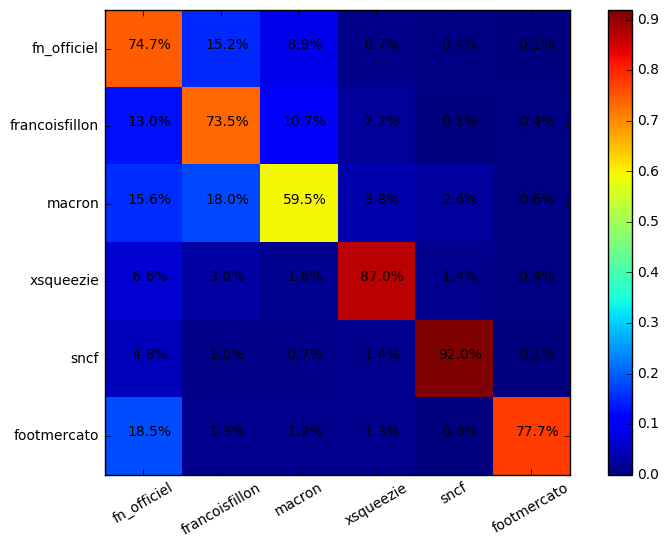

Epoch    3 : 3479.76   Test accuracy: 75.36 79.05 77.93 76.46 77.93 78.18 77.37 
Epoch    3 : 3460.92   Test accuracy: 75.48 79.09 78.07 76.50 78.03 78.39 77.34 
Epoch    3 : 3442.87   Test accuracy: 75.43 79.21 78.18 76.52 78.07 78.41 77.43 
Epoch    3 : 3425.53   Test accuracy: 75.48 79.25 78.28 76.62 78.05 78.55 77.50 
Epoch    3 : 3408.82   Test accuracy: 75.55 79.25 78.30 76.59 78.09 78.59 77.78 
Epoch    3 : 3392.70   Test accuracy: 75.50 79.32 78.28 76.73 78.09 78.50 77.82 
Epoch    3 : 3377.13   Test accuracy: 75.55 79.34 78.34 76.57 78.21 78.46 77.68 
Epoch    3 : 3362.07   Test accuracy: 75.50 79.34 78.43 76.64 78.23 78.50 77.78 
Epoch    3 : 3347.50   Test accuracy: 75.45 79.30 78.39 76.66 78.43 78.57 77.78 
Epoch    3 : 3333.38   Test accuracy: 75.48 79.34 78.48 76.73 78.41 78.64 77.73 
-------------------------------------------------
| 75.6% | 14.1% |  8.7% |  0.8% |  0.5% |  0.2% |   Total: 956
-------------------------------------------------
| 12.5% | 74.6% | 10.4% |  

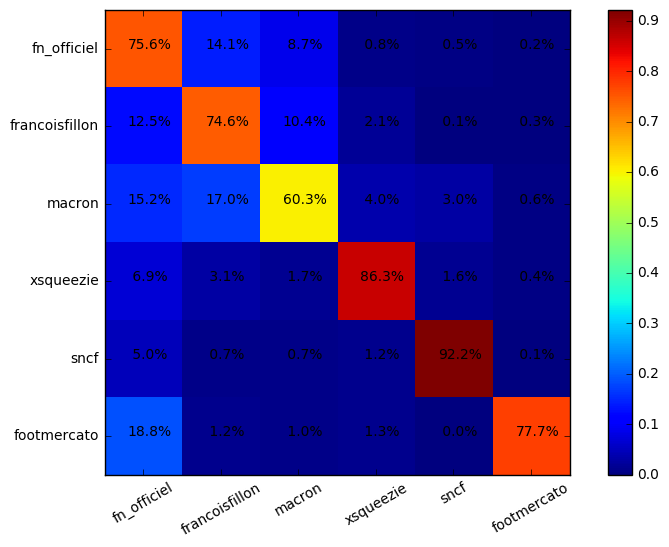

Epoch    3 : 3319.69   Test accuracy: 75.48 79.37 78.48 76.77 78.41 78.59 77.64 
Epoch    3 : 3306.40   Test accuracy: 75.55 79.48 78.39 76.82 78.34 78.57 77.78 
Epoch    3 : 3293.48   Test accuracy: 75.52 79.60 78.41 76.75 78.30 78.48 77.84 
Epoch    3 : 3280.91   Test accuracy: 75.66 79.60 78.41 76.66 78.28 78.46 77.84 
Epoch    3 : 3268.64   Test accuracy: 75.59 79.50 78.41 76.75 78.23 78.50 77.82 
Epoch    3 : 3256.65   Test accuracy: 75.71 79.50 78.39 76.73 78.14 78.39 77.78 
Epoch    3 : 3244.93   Test accuracy: 75.59 79.64 78.34 76.77 78.09 78.39 77.62 
Epoch    3 : 3233.43   Test accuracy: 75.57 79.64 78.37 76.68 78.12 78.32 77.64 
Epoch    3 : 3222.17   Test accuracy: 75.36 79.69 78.48 76.66 78.25 78.30 77.66 
Epoch    3 : 3211.12   Test accuracy: 75.32 79.66 78.46 76.68 78.21 78.30 77.64 
-------------------------------------------------
| 75.2% | 14.0% |  9.1% |  1.0% |  0.4% |  0.2% |   Total: 956
-------------------------------------------------
| 11.9% | 74.6% | 10.6% |  

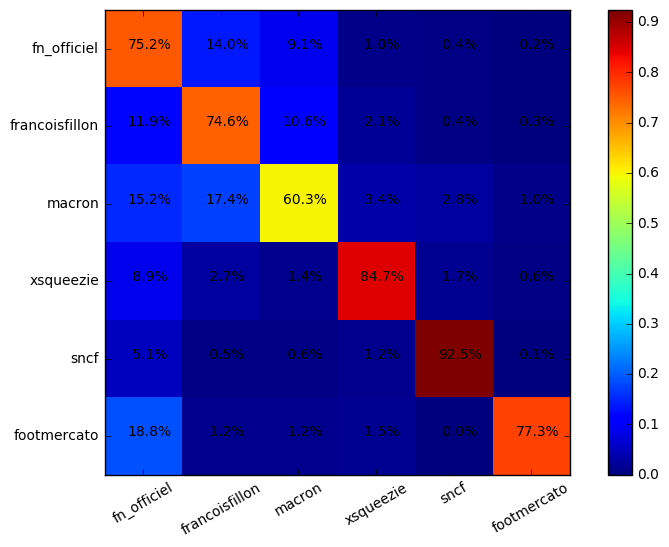

Epoch    3 : 3200.29   Test accuracy: 75.39 79.73 78.41 76.62 78.25 78.21 77.64 
Epoch    3 : 3189.66   Test accuracy: 75.43 79.75 78.37 76.59 78.30 78.14 77.62 
Epoch    3 : 3179.24   Test accuracy: 75.30 79.75 78.32 76.50 78.28 78.09 77.64 
Epoch    3 : 3169.00   Test accuracy: 75.34 79.73 78.32 76.50 78.23 78.18 77.68 
Epoch    3 : 3158.96   Test accuracy: 75.34 79.71 78.25 76.55 78.28 78.09 77.64 
Epoch    3 : 3149.11   Test accuracy: 75.48 79.80 78.16 76.48 78.28 78.09 77.66 
Epoch    3 : 3139.44   Test accuracy: 75.50 79.73 78.12 76.32 78.30 78.05 77.68 
Epoch    3 : 3129.95   Test accuracy: 75.45 79.78 78.16 76.41 78.18 78.09 77.66 
Epoch    3 : 3120.64   Test accuracy: 75.43 79.66 78.14 76.41 78.12 77.96 77.66 
Epoch    3 : 3111.50   Test accuracy: 75.34 79.64 78.16 76.39 77.98 77.93 77.64 
-------------------------------------------------
| 74.8% | 14.9% |  8.8% |  0.8% |  0.5% |  0.2% |   Total: 956
-------------------------------------------------
| 12.1% | 74.5% | 10.3% |  

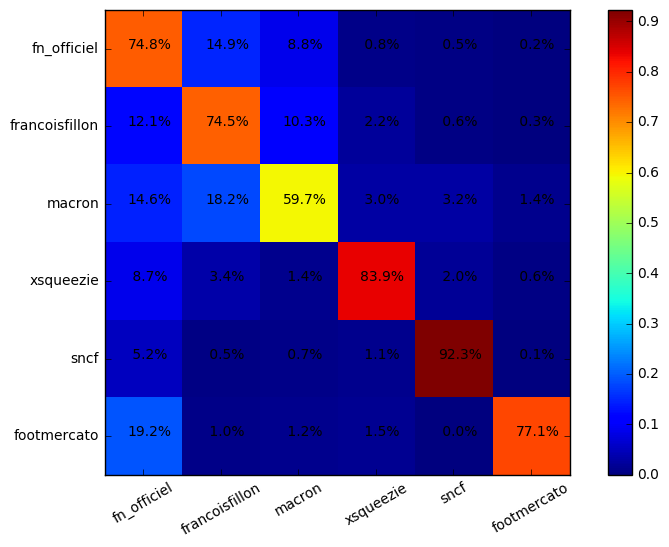

Epoch    3 : 3102.54   Test accuracy: 75.30 79.60 78.12 76.41 78.03 77.78 77.53 
Epoch    3 : 3093.75   Test accuracy: 75.32 79.62 78.07 76.39 78.00 77.75 77.53 
Epoch    3 : 3085.13   Test accuracy: 75.39 79.60 78.00 76.39 78.05 77.64 77.55 
Epoch    3 : 3076.68   Test accuracy: 75.39 79.66 78.00 76.34 78.05 77.66 77.59 
Epoch    3 : 3068.40   Test accuracy: 75.43 79.66 78.12 76.25 78.09 77.73 77.64 
Epoch    3 : 3060.28   Test accuracy: 75.43 79.55 78.12 76.25 78.16 77.73 77.64 
Epoch    3 : 3052.33   Test accuracy: 75.36 79.50 78.05 76.30 78.07 77.80 77.59 
Epoch    3 : 3044.53   Test accuracy: 75.36 79.53 78.05 76.36 77.91 77.73 77.53 
Epoch    3 : 3036.88   Test accuracy: 75.36 79.60 78.00 76.36 77.93 77.68 77.46 
Epoch    3 : 3029.39   Test accuracy: 75.27 79.64 77.96 76.41 78.00 77.66 77.57 
-------------------------------------------------
| 74.6% | 15.5% |  8.4% |  0.8% |  0.4% |  0.3% |   Total: 956
-------------------------------------------------
| 11.9% | 74.2% | 10.5% |  

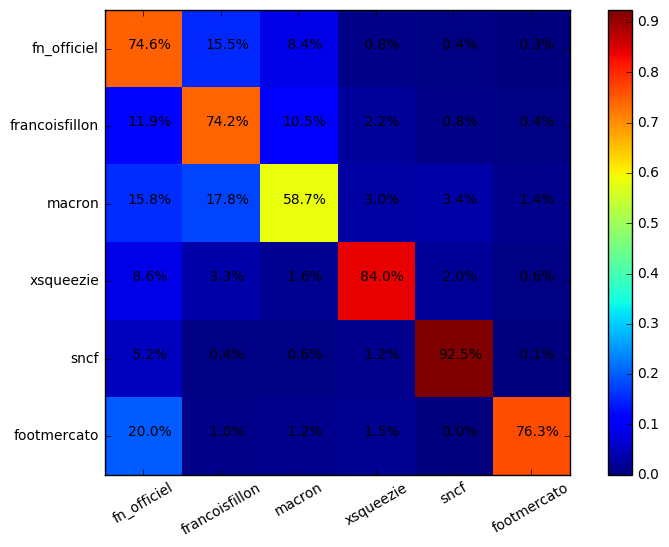

##################### 8 - Essai 3 ###################
Epoch    3 : 4874.24   Test accuracy: 70.20 74.77 72.82 71.29 72.66 73.00 72.36 
Epoch    3 : 4375.47   Test accuracy: 72.45 76.66 75.39 73.59 75.20 75.50 74.93 
Epoch    3 : 4188.96   Test accuracy: 73.48 77.00 76.09 74.36 76.05 76.14 75.61 
Epoch    3 : 4069.66   Test accuracy: 73.54 77.55 76.59 74.77 76.62 76.80 75.98 
Epoch    3 : 3983.39   Test accuracy: 73.93 77.62 76.80 74.89 76.77 77.02 76.30 
Epoch    3 : 3916.31   Test accuracy: 74.16 77.91 77.12 75.14 76.93 77.23 76.55 
Epoch    3 : 3861.26   Test accuracy: 74.25 78.23 77.21 75.27 77.07 77.39 76.48 
Epoch    3 : 3814.48   Test accuracy: 74.36 78.32 77.21 75.39 77.23 77.43 76.77 
Epoch    3 : 3773.72   Test accuracy: 74.39 78.34 77.43 75.52 77.41 77.68 76.89 
Epoch    3 : 3737.56   Test accuracy: 74.48 78.41 77.73 75.84 77.53 78.03 77.21 
-------------------------------------------------
| 74.9% | 15.9% |  7.5% |  0.6% |  0.6% |  0.4% |   Total: 956
-----------------------

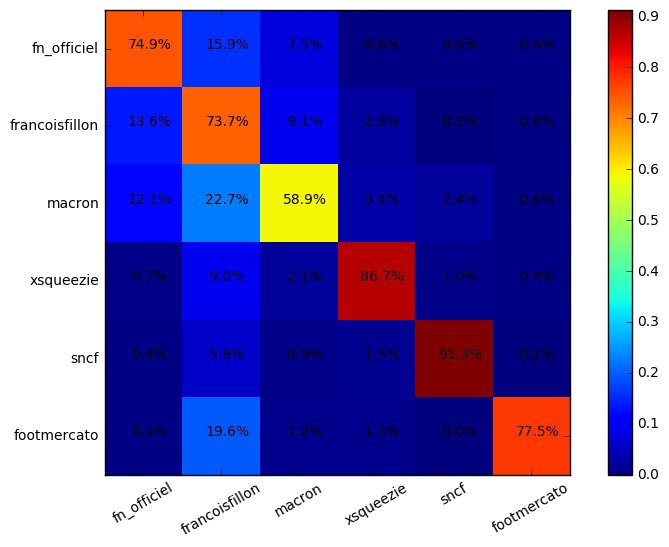

Epoch    3 : 3705.02   Test accuracy: 74.57 78.64 77.73 75.80 77.46 77.98 77.14 
Epoch    3 : 3675.36   Test accuracy: 74.75 78.69 77.73 75.75 77.59 77.80 77.30 
Epoch    3 : 3648.03   Test accuracy: 74.73 78.75 77.73 75.89 77.55 77.87 77.41 
Epoch    3 : 3622.64   Test accuracy: 74.75 78.71 77.80 76.00 77.71 77.96 77.41 
Epoch    3 : 3598.96   Test accuracy: 74.93 78.73 77.96 76.00 77.71 78.03 77.32 
Epoch    3 : 3576.82   Test accuracy: 75.11 79.03 77.98 75.89 77.71 78.09 77.16 
Epoch    3 : 3556.03   Test accuracy: 75.02 78.98 77.87 76.00 77.66 78.00 77.16 
Epoch    3 : 3536.39   Test accuracy: 75.00 79.00 77.80 76.02 77.68 77.93 77.05 
Epoch    3 : 3517.73   Test accuracy: 74.98 79.03 77.80 76.05 77.71 77.80 76.98 
Epoch    3 : 3499.92   Test accuracy: 74.82 79.12 77.71 75.93 77.68 77.73 77.00 
-------------------------------------------------
| 72.7% | 17.3% |  8.6% |  0.7% |  0.3% |  0.4% |   Total: 956
-------------------------------------------------
| 12.8% | 74.5% |  9.5% |  

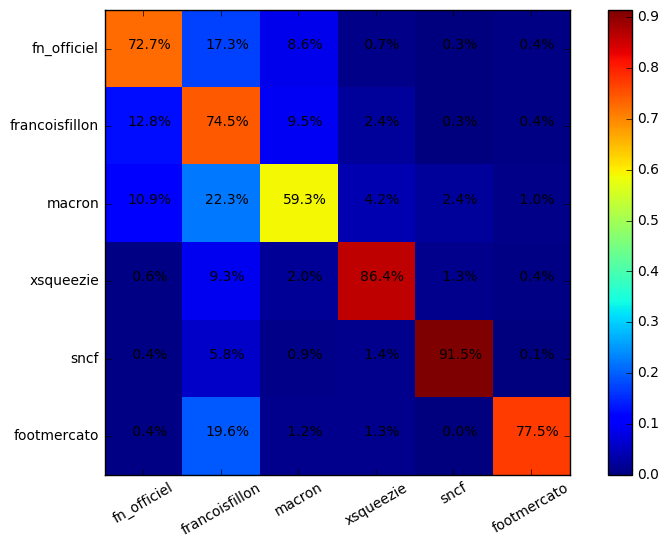

Epoch    3 : 3482.83   Test accuracy: 74.77 79.19 77.66 75.84 77.62 77.93 77.02 
Epoch    3 : 3466.40   Test accuracy: 74.80 79.14 77.75 75.68 77.62 77.91 77.07 
Epoch    3 : 3450.54   Test accuracy: 74.75 79.21 77.80 75.84 77.50 77.93 77.12 
Epoch    3 : 3435.19   Test accuracy: 74.84 79.28 77.73 75.80 77.59 77.89 77.05 
Epoch    3 : 3420.30   Test accuracy: 74.75 79.23 77.75 75.82 77.64 77.82 77.12 
Epoch    3 : 3405.85   Test accuracy: 74.82 79.32 77.57 75.71 77.59 77.75 77.14 
Epoch    3 : 3391.84   Test accuracy: 74.82 79.25 77.59 75.71 77.57 77.73 77.25 
Epoch    3 : 3378.24   Test accuracy: 74.84 79.16 77.57 75.64 77.48 77.66 77.18 
Epoch    3 : 3365.03   Test accuracy: 74.73 79.23 77.62 75.61 77.50 77.71 77.16 
Epoch    3 : 3352.18   Test accuracy: 74.75 79.28 77.62 75.68 77.62 77.78 77.09 
-------------------------------------------------
| 72.7% | 18.0% |  7.8% |  0.7% |  0.3% |  0.4% |   Total: 956
-------------------------------------------------
| 12.5% | 74.7% |  9.1% |  

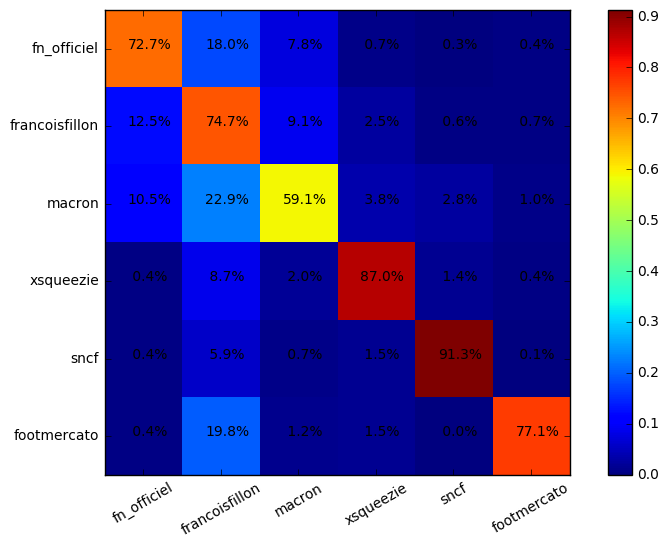

Epoch    3 : 3339.67   Test accuracy: 74.73 79.28 77.71 75.68 77.64 77.80 77.14 
Epoch    3 : 3327.47   Test accuracy: 74.75 79.28 77.73 75.68 77.64 77.82 77.21 
Epoch    3 : 3315.56   Test accuracy: 74.68 79.28 77.75 75.82 77.66 77.78 77.18 
Epoch    3 : 3303.90   Test accuracy: 74.73 79.23 77.66 75.96 77.71 77.78 77.12 
Epoch    3 : 3292.48   Test accuracy: 74.66 79.28 77.64 76.05 77.78 77.71 77.25 
Epoch    3 : 3281.30   Test accuracy: 74.61 79.32 77.73 76.11 77.89 77.68 77.27 
Epoch    3 : 3270.39   Test accuracy: 74.66 79.32 77.75 76.09 77.84 77.75 77.37 
Epoch    3 : 3259.72   Test accuracy: 74.61 79.34 77.84 76.09 77.80 77.84 77.30 
Epoch    3 : 3249.25   Test accuracy: 74.48 79.30 77.84 76.16 77.75 77.89 77.16 
Epoch    3 : 3238.97   Test accuracy: 74.45 79.23 77.84 76.21 77.80 77.84 77.23 
-------------------------------------------------
| 73.0% | 17.6% |  8.1% |  0.6% |  0.3% |  0.4% |   Total: 956
-------------------------------------------------
| 11.9% | 74.7% |  9.6% |  

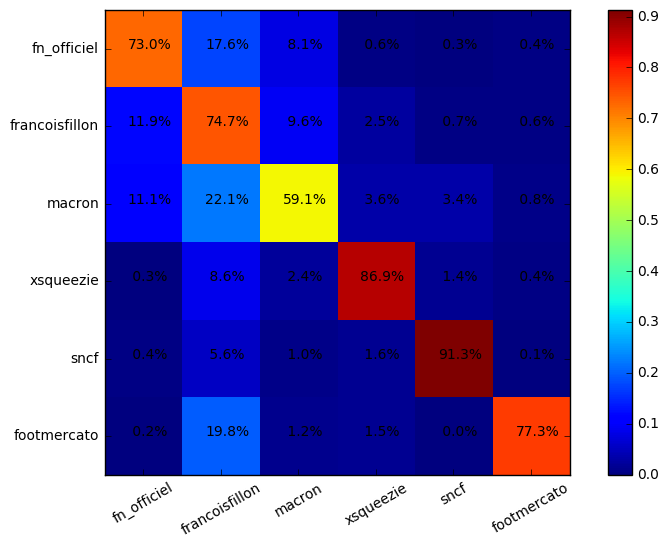

Epoch    3 : 3228.86   Test accuracy: 74.48 79.16 77.78 76.07 77.78 77.73 77.21 
Epoch    3 : 3218.90   Test accuracy: 74.43 79.09 77.75 76.05 77.73 77.71 77.21 
Epoch    3 : 3209.09   Test accuracy: 74.41 79.05 77.68 75.91 77.71 77.73 77.21 
Epoch    3 : 3199.43   Test accuracy: 74.45 79.00 77.66 75.86 77.66 77.68 77.21 
Epoch    3 : 3189.90   Test accuracy: 74.39 78.94 77.62 75.84 77.71 77.73 77.23 
Epoch    3 : 3180.52   Test accuracy: 74.34 78.91 77.64 75.89 77.66 77.73 77.30 
Epoch    3 : 3171.26   Test accuracy: 74.32 78.89 77.73 76.00 77.82 77.71 77.34 
Epoch    3 : 3162.12   Test accuracy: 74.50 78.89 77.71 76.09 77.66 77.80 77.18 
Epoch    3 : 3153.10   Test accuracy: 74.45 78.80 77.78 76.05 77.66 77.87 77.16 
Epoch    3 : 3144.17   Test accuracy: 74.55 78.80 77.73 76.05 77.64 77.91 77.12 
-------------------------------------------------
| 73.0% | 17.4% |  7.9% |  0.9% |  0.4% |  0.3% |   Total: 956
-------------------------------------------------
| 11.0% | 74.9% | 10.2% |  

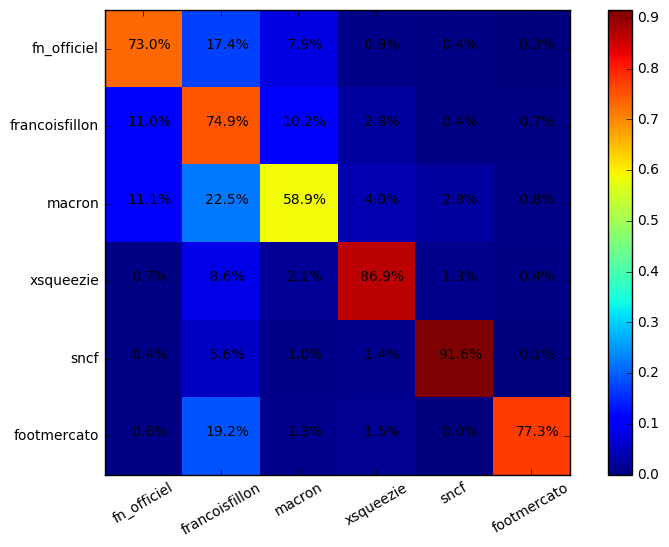

Epoch    3 : 3135.35   Test accuracy: 74.52 78.82 77.80 76.00 77.62 77.87 77.07 
Epoch    3 : 3126.63   Test accuracy: 74.59 78.75 77.66 75.98 77.62 77.84 77.21 
Epoch    3 : 3118.00   Test accuracy: 74.57 78.64 77.66 76.09 77.71 77.87 77.12 
Epoch    3 : 3109.46   Test accuracy: 74.55 78.64 77.64 76.11 77.71 77.89 77.07 
Epoch    3 : 3101.01   Test accuracy: 74.57 78.75 77.62 76.11 77.64 77.84 77.07 
Epoch    3 : 3092.65   Test accuracy: 74.55 78.78 77.62 76.02 77.68 77.87 77.02 
Epoch    3 : 3084.39   Test accuracy: 74.55 78.87 77.64 75.96 77.55 77.80 77.00 
Epoch    3 : 3076.21   Test accuracy: 74.55 78.91 77.68 75.96 77.59 77.82 76.89 
Epoch    3 : 3068.11   Test accuracy: 74.52 78.87 77.71 75.86 77.62 77.84 76.89 
Epoch    3 : 3060.10   Test accuracy: 74.52 78.89 77.78 75.77 77.64 77.89 76.96 
-------------------------------------------------
| 73.4% | 17.2% |  7.7% |  1.0% |  0.4% |  0.2% |   Total: 956
-------------------------------------------------
| 11.1% | 74.6% | 10.7% |  

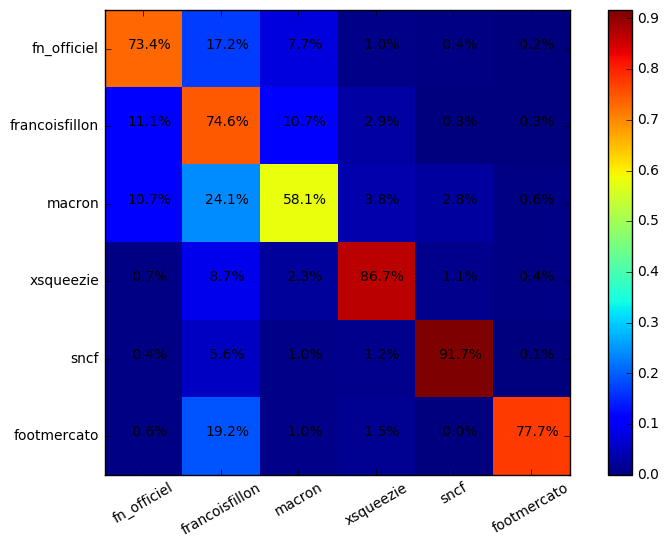

##################### 8 - Essai 4 ###################
Epoch    3 : 4877.20   Test accuracy: 71.06 75.02 73.25 71.66 73.20 73.41 72.70 
Epoch    3 : 4409.29   Test accuracy: 72.47 76.18 75.20 73.79 75.25 75.23 75.05 
Epoch    3 : 4239.98   Test accuracy: 73.43 77.05 75.86 74.43 75.96 75.96 75.64 
Epoch    3 : 4129.40   Test accuracy: 73.98 77.30 76.52 74.98 76.46 76.82 76.16 
Epoch    3 : 4044.86   Test accuracy: 74.66 77.68 77.09 75.55 76.91 77.14 76.23 
Epoch    3 : 3975.75   Test accuracy: 74.95 77.93 77.43 75.84 77.39 77.53 76.71 
Epoch    3 : 3917.11   Test accuracy: 75.27 78.46 77.68 76.14 77.62 77.75 77.07 
Epoch    3 : 3866.23   Test accuracy: 75.25 78.46 77.48 76.02 77.55 77.75 76.93 
Epoch    3 : 3821.57   Test accuracy: 75.52 78.57 77.50 75.96 77.50 77.80 77.05 
Epoch    3 : 3781.61   Test accuracy: 75.41 78.66 77.59 75.96 77.39 77.96 77.18 
-------------------------------------------------
| 73.4% | 16.7% |  7.6% |  0.7% |  1.4% |  0.1% |   Total: 956
-----------------------

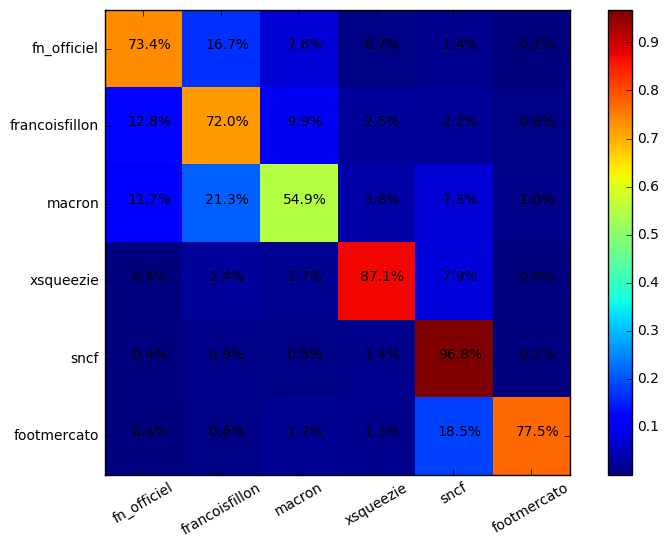

Epoch    3 : 3745.28   Test accuracy: 75.41 78.80 77.87 75.91 77.64 78.05 77.30 
Epoch    3 : 3711.96   Test accuracy: 75.52 78.73 77.89 76.14 77.78 78.07 77.25 
Epoch    3 : 3681.24   Test accuracy: 75.50 78.66 78.05 76.43 77.93 78.34 77.27 
Epoch    3 : 3652.72   Test accuracy: 75.52 78.82 78.37 76.48 78.25 78.57 77.34 
Epoch    3 : 3626.10   Test accuracy: 75.57 78.98 78.37 76.62 78.28 78.64 77.39 
Epoch    3 : 3601.13   Test accuracy: 75.68 78.98 78.43 76.68 78.25 78.59 77.46 
Epoch    3 : 3577.63   Test accuracy: 75.89 78.98 78.37 76.66 78.32 78.59 77.66 
Epoch    3 : 3555.45   Test accuracy: 75.96 78.96 78.34 76.68 78.34 78.55 77.80 
Epoch    3 : 3534.45   Test accuracy: 75.96 78.98 78.43 76.66 78.21 78.48 77.84 
Epoch    3 : 3514.51   Test accuracy: 76.02 79.03 78.39 76.75 78.25 78.55 77.91 
-------------------------------------------------
| 72.2% | 17.3% |  8.4% |  0.8% |  1.3% |  0.1% |   Total: 956
-------------------------------------------------
| 11.3% | 74.1% |  9.9% |  

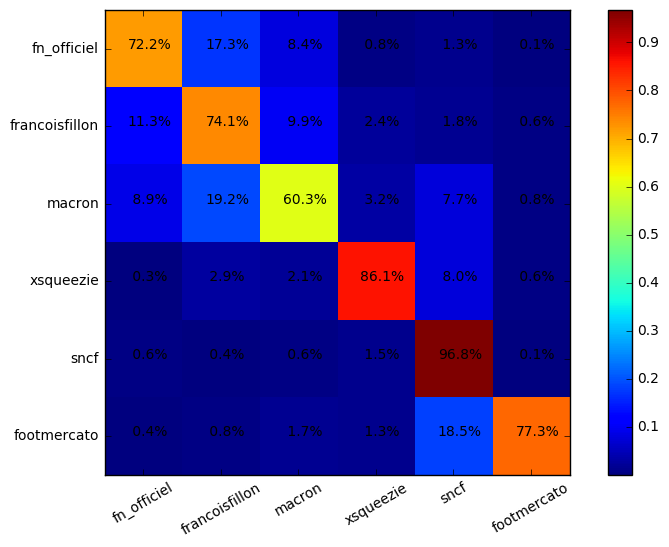

Epoch    3 : 3495.53   Test accuracy: 76.02 79.07 78.50 76.82 78.48 78.64 78.07 
Epoch    3 : 3477.38   Test accuracy: 76.07 79.00 78.53 76.89 78.50 78.71 78.03 
Epoch    3 : 3459.99   Test accuracy: 76.00 79.09 78.48 76.93 78.59 78.62 78.21 
Epoch    3 : 3443.27   Test accuracy: 76.11 79.16 78.55 76.91 78.64 78.66 78.21 
Epoch    3 : 3427.17   Test accuracy: 76.18 79.23 78.57 77.00 78.64 78.66 78.12 
Epoch    3 : 3411.65   Test accuracy: 76.07 79.07 78.62 77.07 78.66 78.71 78.14 
Epoch    3 : 3396.66   Test accuracy: 76.02 79.07 78.59 77.00 78.57 78.73 78.25 
Epoch    3 : 3382.17   Test accuracy: 75.96 79.14 78.59 76.96 78.53 78.69 78.18 
Epoch    3 : 3368.13   Test accuracy: 75.96 79.23 78.64 76.98 78.62 78.73 78.23 
Epoch    3 : 3354.53   Test accuracy: 76.02 79.21 78.66 77.05 78.59 78.80 78.25 
-------------------------------------------------
| 72.5% | 16.9% |  8.3% |  0.9% |  1.3% |  0.1% |   Total: 956
-------------------------------------------------
| 11.0% | 75.1% |  9.4% |  

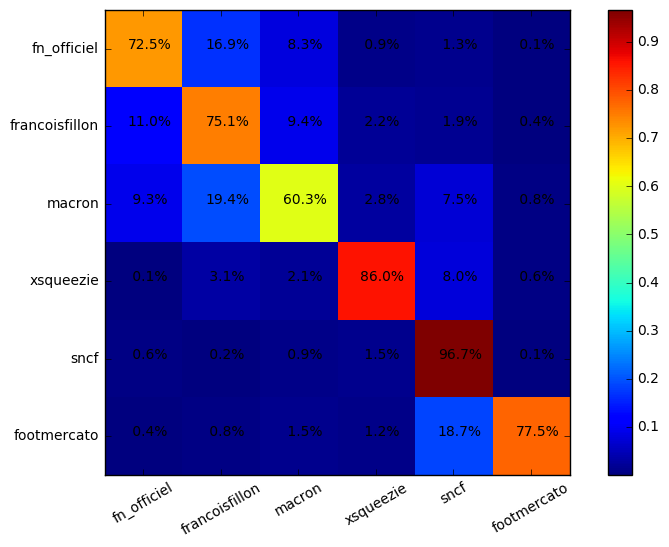

Epoch    3 : 3341.32   Test accuracy: 75.86 79.19 78.78 77.09 78.64 78.82 78.23 
Epoch    3 : 3328.47   Test accuracy: 75.91 79.19 78.69 77.00 78.69 78.84 78.30 
Epoch    3 : 3315.98   Test accuracy: 75.89 79.19 78.66 76.98 78.64 78.84 78.32 
Epoch    3 : 3303.80   Test accuracy: 75.91 79.30 78.75 77.00 78.71 78.71 78.25 
Epoch    3 : 3291.92   Test accuracy: 75.93 79.34 78.62 77.07 78.62 78.64 78.28 
Epoch    3 : 3280.33   Test accuracy: 76.05 79.34 78.57 77.02 78.48 78.39 78.25 
Epoch    3 : 3269.01   Test accuracy: 76.09 79.37 78.53 76.93 78.46 78.43 78.34 
Epoch    3 : 3257.95   Test accuracy: 76.14 79.46 78.48 76.98 78.50 78.39 78.37 
Epoch    3 : 3247.14   Test accuracy: 76.09 79.41 78.57 77.05 78.66 78.48 78.41 
Epoch    3 : 3236.56   Test accuracy: 76.11 79.37 78.53 77.12 78.69 78.43 78.37 
-------------------------------------------------
| 72.6% | 16.9% |  8.4% |  0.8% |  1.3% |  0.0% |   Total: 956
-------------------------------------------------
| 10.8% | 74.2% | 10.5% |  

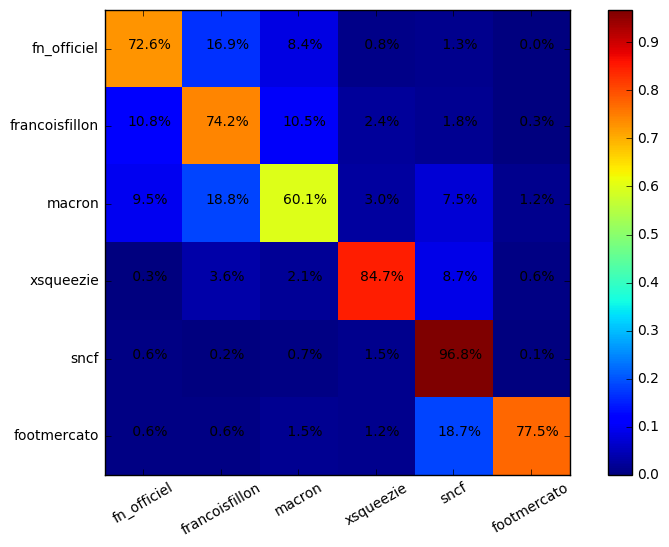

Epoch    3 : 3226.22   Test accuracy: 76.16 79.55 78.55 77.14 78.69 78.34 78.41 
Epoch    3 : 3216.10   Test accuracy: 76.18 79.66 78.55 77.14 78.78 78.41 78.57 
Epoch    3 : 3206.19   Test accuracy: 76.23 79.78 78.69 77.14 78.75 78.48 78.55 
Epoch    3 : 3196.48   Test accuracy: 76.23 79.80 78.80 77.07 78.75 78.48 78.55 
Epoch    3 : 3186.99   Test accuracy: 76.14 79.91 78.75 77.21 78.80 78.53 78.53 
Epoch    3 : 3177.69   Test accuracy: 76.16 79.94 78.78 77.21 78.89 78.48 78.50 
Epoch    3 : 3168.59   Test accuracy: 76.25 79.96 78.80 77.32 78.84 78.53 78.55 
Epoch    3 : 3159.68   Test accuracy: 76.27 79.98 78.87 77.34 78.87 78.50 78.43 
Epoch    3 : 3150.94   Test accuracy: 76.25 80.00 78.89 77.37 78.94 78.64 78.43 
Epoch    3 : 3142.38   Test accuracy: 76.25 79.96 78.84 77.41 78.98 78.71 78.39 
-------------------------------------------------
| 73.7% | 16.2% |  7.9% |  0.8% |  1.3% |  0.0% |   Total: 956
-------------------------------------------------
|  9.7% | 74.9% | 10.6% |  

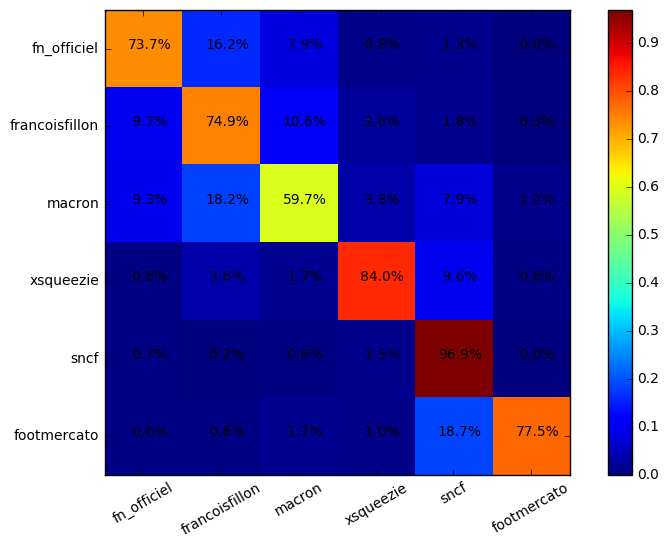

Epoch    3 : 3133.99   Test accuracy: 76.23 79.94 78.78 77.48 78.94 78.75 78.25 
Epoch    3 : 3125.77   Test accuracy: 78.69 80.00 80.23 79.16 80.28 80.07 79.57 
Epoch    3 : 3117.71   Test accuracy: 78.71 79.94 80.32 79.23 80.25 80.16 79.73 
Epoch    3 : 3109.81   Test accuracy: 78.71 79.94 80.30 79.25 80.23 80.12 79.69 
Epoch    3 : 3102.06   Test accuracy: 78.75 79.87 80.23 79.28 80.16 80.03 79.55 
Epoch    3 : 3094.46   Test accuracy: 78.87 79.87 80.28 79.37 80.21 80.00 79.60 
Epoch    3 : 3087.00   Test accuracy: 78.73 79.94 80.25 79.41 80.28 80.00 79.66 
Epoch    3 : 3079.67   Test accuracy: 78.78 80.03 80.23 79.41 80.35 80.03 79.62 
Epoch    3 : 3072.45   Test accuracy: 78.80 79.94 80.32 79.41 80.35 80.10 79.64 
Epoch    3 : 3065.34   Test accuracy: 78.84 79.91 80.35 79.41 80.35 80.07 79.62 
-------------------------------------------------
| 74.6% | 15.7% |  7.5% |  0.9% |  0.5% |  0.7% |   Total: 956
-------------------------------------------------
|  9.5% | 74.4% | 11.0% |  

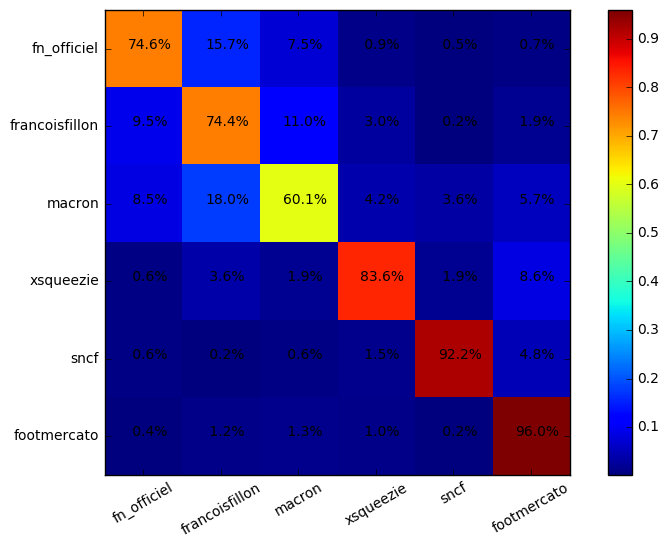

##################### 9 - Essai 0 ###################
Epoch    3 : 4792.05   Test accuracy: 71.86 75.61 74.11 72.66 74.07 74.27 73.91 
Epoch    3 : 4358.05   Test accuracy: 76.46 76.66 77.41 76.39 77.43 77.46 76.77 
Epoch    3 : 4179.45   Test accuracy: 76.48 77.32 77.82 76.91 77.78 78.07 77.39 
Epoch    3 : 4061.40   Test accuracy: 76.82 77.82 78.18 77.14 78.18 78.32 77.87 
Epoch    3 : 3972.06   Test accuracy: 77.27 77.84 78.50 77.41 78.41 78.57 77.96 
Epoch    3 : 3901.05   Test accuracy: 77.50 78.21 78.73 77.91 78.69 78.84 78.12 
Epoch    3 : 3842.88   Test accuracy: 77.50 78.28 78.91 77.91 78.82 78.84 78.43 
Epoch    3 : 3794.04   Test accuracy: 77.73 78.50 78.87 77.98 78.89 78.91 78.50 
Epoch    3 : 3752.14   Test accuracy: 77.75 78.69 79.23 78.25 79.16 79.30 78.96 
Epoch    3 : 3715.45   Test accuracy: 78.05 78.75 79.64 78.62 79.41 79.55 79.05 
-------------------------------------------------
| 76.1% | 13.9% |  7.6% |  0.9% |  0.8% |  0.6% |   Total: 969
-----------------------

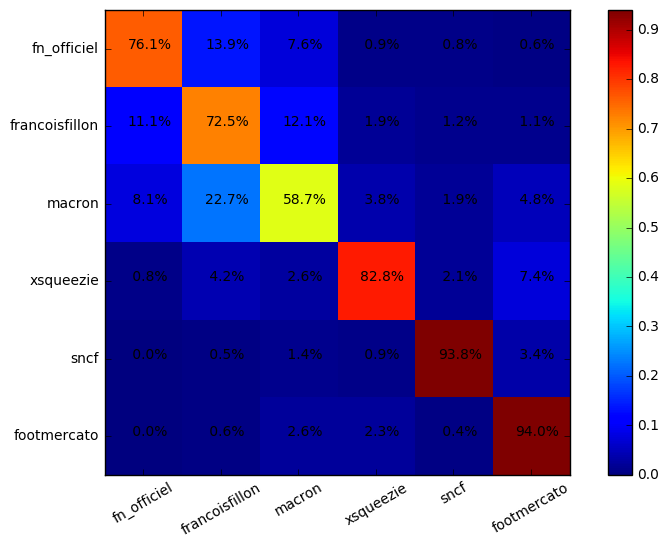

Epoch    3 : 3682.70   Test accuracy: 78.12 78.91 79.66 78.73 79.57 79.57 79.03 
Epoch    3 : 3652.98   Test accuracy: 78.16 79.00 79.71 78.71 79.60 79.78 79.05 
Epoch    3 : 3625.65   Test accuracy: 78.23 79.00 79.57 78.73 79.62 79.64 78.91 
Epoch    3 : 3600.26   Test accuracy: 78.25 79.00 79.55 78.59 79.60 79.73 78.84 
Epoch    3 : 3576.49   Test accuracy: 78.30 79.05 79.48 78.57 79.62 79.69 78.78 
Epoch    3 : 3554.09   Test accuracy: 78.37 79.14 79.53 78.62 79.53 79.75 78.94 
Epoch    3 : 3532.88   Test accuracy: 78.30 79.16 79.69 78.69 79.66 79.89 79.05 
Epoch    3 : 3512.67   Test accuracy: 78.39 79.28 79.85 78.71 79.85 80.03 79.03 
Epoch    3 : 3493.34   Test accuracy: 78.39 79.25 79.98 78.87 79.89 80.21 79.07 
Epoch    3 : 3474.75   Test accuracy: 78.57 79.37 80.03 78.84 79.91 80.23 79.25 
-------------------------------------------------
| 77.0% | 13.2% |  7.6% |  1.0% |  0.5% |  0.6% |   Total: 969
-------------------------------------------------
| 10.7% | 72.2% | 13.1% |  

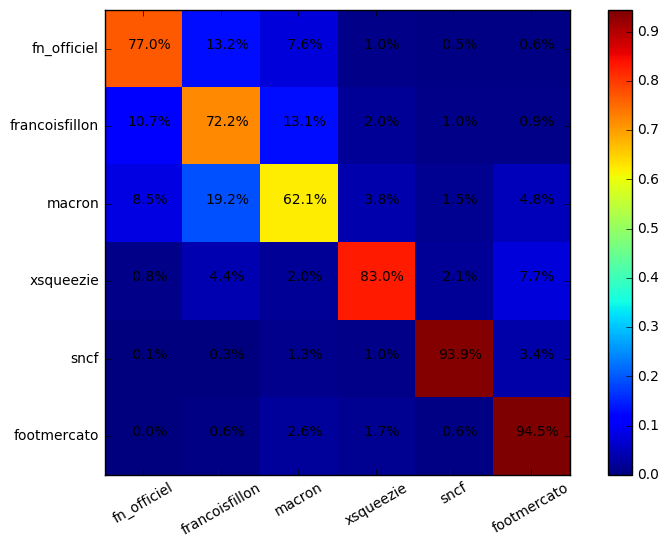

Epoch    3 : 3456.82   Test accuracy: 78.62 79.32 80.05 78.94 79.87 80.23 79.19 
Epoch    3 : 3439.47   Test accuracy: 78.69 79.34 80.14 79.05 80.00 80.23 79.16 
Epoch    3 : 3422.63   Test accuracy: 78.64 79.41 80.14 79.12 80.00 80.32 79.39 
Epoch    3 : 3406.27   Test accuracy: 78.78 79.57 80.25 79.07 80.14 80.23 79.34 
Epoch    3 : 3390.34   Test accuracy: 78.64 79.55 80.23 79.12 80.14 80.37 79.50 
Epoch    3 : 3374.82   Test accuracy: 78.71 79.62 80.41 79.12 80.23 80.37 79.57 
Epoch    3 : 3359.68   Test accuracy: 78.66 79.71 80.44 79.16 80.30 80.51 79.66 
Epoch    3 : 3344.89   Test accuracy: 75.05 79.71 78.23 76.30 78.30 78.37 77.55 
Epoch    3 : 3330.42   Test accuracy: 75.18 79.66 78.25 76.50 78.18 78.39 77.53 
Epoch    3 : 3316.27   Test accuracy: 75.11 79.66 78.16 76.55 78.14 78.37 77.59 
-------------------------------------------------
| 77.1% | 13.5% |  7.4% |  1.1% |  0.5% |  0.3% |   Total: 969
-------------------------------------------------
| 10.2% | 73.1% | 13.1% |  

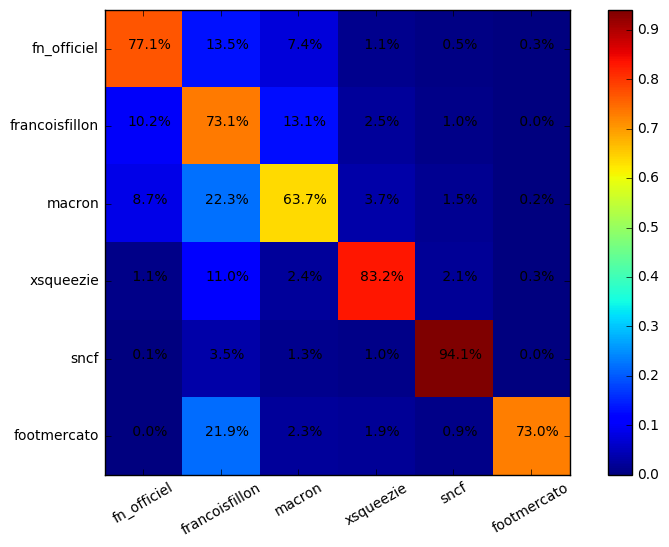

Epoch    3 : 3302.41   Test accuracy: 75.00 79.75 78.12 76.43 78.14 78.25 77.39 
Epoch    3 : 3288.83   Test accuracy: 74.93 79.78 78.16 76.41 78.07 78.25 77.41 
Epoch    3 : 3275.53   Test accuracy: 74.91 79.80 78.21 76.32 78.14 78.14 77.34 
Epoch    3 : 3262.49   Test accuracy: 74.80 79.69 78.18 76.36 78.09 78.07 77.46 
Epoch    3 : 3249.71   Test accuracy: 74.89 79.71 78.07 76.25 78.12 78.14 77.43 
Epoch    3 : 3237.19   Test accuracy: 74.84 79.73 78.05 76.14 77.93 78.09 77.46 
Epoch    3 : 3224.92   Test accuracy: 74.91 79.73 78.09 76.11 78.03 77.98 77.41 
Epoch    3 : 3212.91   Test accuracy: 74.98 79.82 77.98 76.05 78.05 78.07 77.48 
Epoch    3 : 3201.14   Test accuracy: 74.91 79.82 78.00 75.98 77.96 78.16 77.59 
Epoch    3 : 3189.60   Test accuracy: 74.95 79.78 78.07 76.05 78.00 78.18 77.55 
-------------------------------------------------
| 77.3% | 13.1% |  7.4% |  1.3% |  0.4% |  0.4% |   Total: 969
-------------------------------------------------
| 10.4% | 73.0% | 12.9% |  

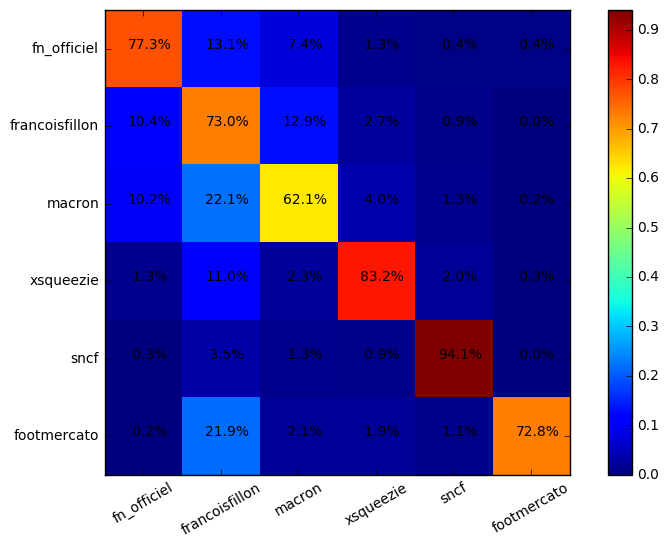

Epoch    3 : 3178.30   Test accuracy: 75.02 79.78 78.07 76.09 78.00 78.25 77.55 
Epoch    3 : 3167.22   Test accuracy: 75.09 79.71 78.09 76.09 78.05 78.23 77.50 
Epoch    3 : 3156.35   Test accuracy: 75.09 79.82 78.16 76.16 78.05 78.23 77.46 
Epoch    3 : 3145.69   Test accuracy: 75.18 79.85 78.14 76.25 78.05 78.28 77.48 
Epoch    3 : 3135.23   Test accuracy: 75.98 79.87 78.55 76.82 78.48 78.64 77.87 
Epoch    3 : 3124.95   Test accuracy: 76.00 79.75 78.62 76.87 78.55 78.62 77.87 
Epoch    3 : 3114.86   Test accuracy: 75.96 79.85 78.59 76.89 78.55 78.57 77.82 
Epoch    3 : 3104.94   Test accuracy: 75.89 79.85 78.57 76.82 78.46 78.59 77.73 
Epoch    3 : 3095.19   Test accuracy: 75.82 79.82 78.53 76.82 78.46 78.55 77.78 
Epoch    3 : 3085.59   Test accuracy: 75.77 79.80 78.43 76.82 78.34 78.50 77.71 
-------------------------------------------------
| 77.9% | 12.1% |  7.5% |  1.2% |  0.9% |  0.3% |   Total: 969
-------------------------------------------------
| 10.6% | 71.8% | 13.4% |  

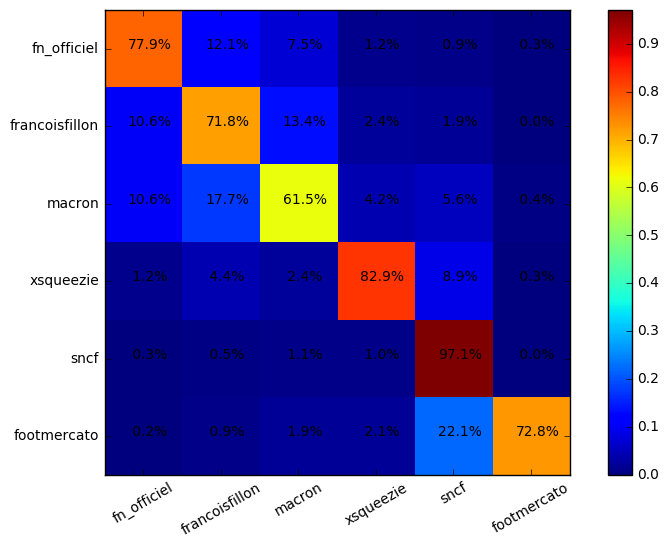

Epoch    3 : 3076.14   Test accuracy: 75.80 79.80 78.43 76.77 78.32 78.46 77.75 
Epoch    3 : 3066.84   Test accuracy: 75.77 79.85 78.53 76.77 78.34 78.43 77.75 
Epoch    3 : 3057.68   Test accuracy: 75.80 79.87 78.50 76.80 78.37 78.46 77.64 
Epoch    3 : 3048.67   Test accuracy: 75.84 79.91 78.46 76.80 78.37 78.57 77.68 
Epoch    3 : 3039.80   Test accuracy: 75.82 79.94 78.50 76.91 78.39 78.53 77.73 
Epoch    3 : 3031.07   Test accuracy: 75.75 79.89 78.55 76.93 78.43 78.64 77.73 
Epoch    3 : 3022.48   Test accuracy: 75.82 79.98 78.57 76.96 78.50 78.66 77.87 
Epoch    3 : 3014.02   Test accuracy: 75.84 79.87 78.53 76.93 78.41 78.69 77.84 
Epoch    3 : 3005.69   Test accuracy: 75.84 79.89 78.57 77.02 78.43 78.71 77.87 
Epoch    3 : 2997.50   Test accuracy: 75.80 79.87 78.62 77.07 78.39 78.62 77.89 
-------------------------------------------------
| 77.7% | 12.0% |  7.9% |  1.3% |  0.8% |  0.2% |   Total: 969
-------------------------------------------------
| 10.2% | 72.6% | 12.8% |  

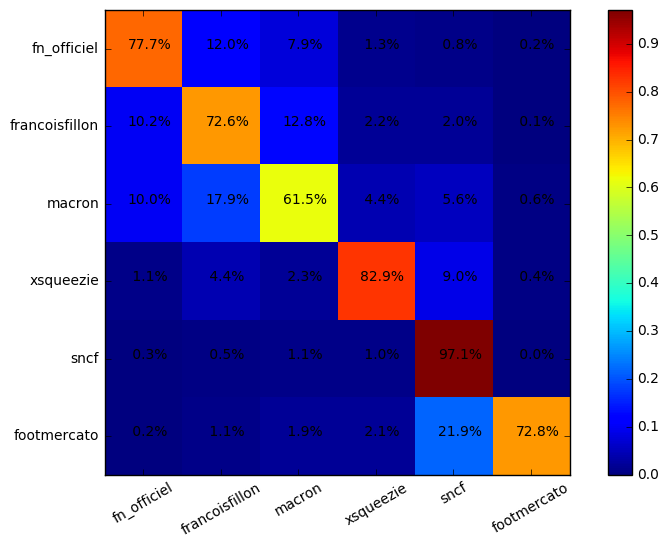

##################### 9 - Essai 1 ###################
Epoch    3 : 4773.16   Test accuracy: 71.75 75.98 74.27 72.50 74.23 74.50 73.73 
Epoch    3 : 4361.38   Test accuracy: 72.82 77.23 75.61 73.68 75.57 75.84 74.98 
Epoch    3 : 4192.68   Test accuracy: 76.82 77.82 78.09 77.09 77.93 78.23 77.55 
Epoch    3 : 4081.09   Test accuracy: 77.00 77.82 78.32 77.39 78.25 78.46 77.71 
Epoch    3 : 3997.17   Test accuracy: 77.37 78.03 78.57 77.68 78.53 78.73 77.98 
Epoch    3 : 3930.52   Test accuracy: 77.66 78.30 78.69 77.53 78.62 79.07 78.18 
Epoch    3 : 3875.46   Test accuracy: 77.87 78.50 78.89 77.93 78.87 79.21 78.41 
Epoch    3 : 3828.58   Test accuracy: 74.14 78.66 76.98 75.16 76.91 77.23 76.66 
Epoch    3 : 3787.66   Test accuracy: 74.36 78.66 77.16 75.30 77.12 77.25 76.87 
Epoch    3 : 3751.22   Test accuracy: 74.57 78.80 77.50 75.59 77.30 77.50 76.98 
-------------------------------------------------
| 74.3% | 16.4% |  7.5% |  0.8% |  0.6% |  0.3% |   Total: 969
-----------------------

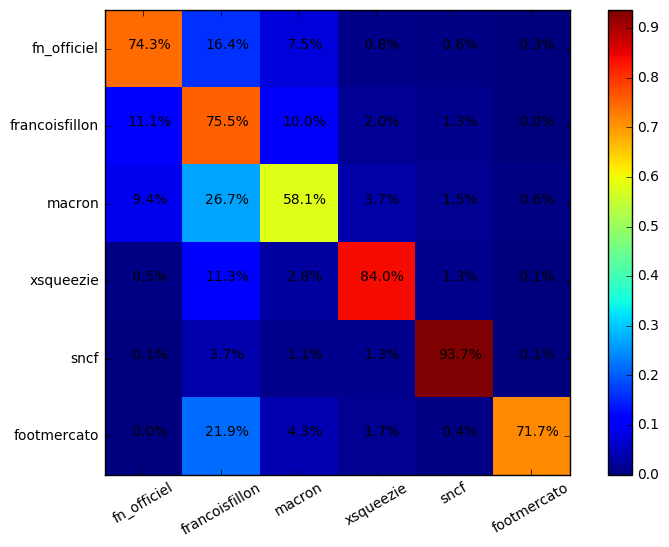

Epoch    3 : 3718.24   Test accuracy: 74.68 78.80 77.57 75.77 77.48 77.71 76.91 
Epoch    3 : 3688.00   Test accuracy: 74.77 78.89 77.64 75.64 77.64 77.68 76.93 
Epoch    3 : 3659.95   Test accuracy: 74.66 78.98 77.64 75.71 77.55 77.68 76.93 
Epoch    3 : 3633.71   Test accuracy: 74.45 78.96 77.71 75.82 77.64 77.87 77.07 
Epoch    3 : 3608.95   Test accuracy: 74.39 79.00 77.82 75.89 77.73 77.80 77.14 
Epoch    3 : 3585.43   Test accuracy: 74.41 79.19 77.71 75.86 77.66 77.84 77.21 
Epoch    3 : 3562.95   Test accuracy: 74.34 79.32 77.68 75.89 77.71 77.80 77.30 
Epoch    3 : 3541.38   Test accuracy: 74.36 79.44 77.80 75.86 77.66 77.89 77.27 
Epoch    3 : 3520.61   Test accuracy: 74.34 79.44 77.78 75.93 77.80 77.89 77.18 
Epoch    3 : 3500.58   Test accuracy: 74.55 79.32 77.73 75.91 77.78 77.84 77.27 
-------------------------------------------------
| 75.7% | 15.5% |  7.1% |  0.6% |  0.7% |  0.3% |   Total: 969
-------------------------------------------------
| 11.0% | 74.0% | 11.9% |  

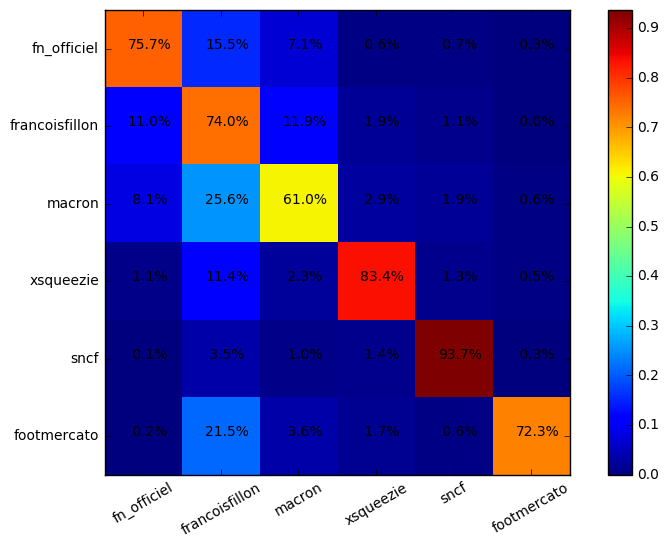

Epoch    3 : 3481.24   Test accuracy: 74.45 79.41 77.68 75.91 77.71 77.98 77.32 
Epoch    3 : 3462.53   Test accuracy: 74.50 79.62 77.75 76.02 77.75 77.93 77.37 
Epoch    3 : 3444.42   Test accuracy: 74.41 79.66 77.73 75.96 77.75 77.91 77.39 
Epoch    3 : 3426.88   Test accuracy: 74.39 79.73 77.80 76.05 77.78 78.03 77.41 
Epoch    3 : 3409.89   Test accuracy: 74.43 79.75 77.80 75.98 77.73 78.00 77.34 
Epoch    3 : 3393.41   Test accuracy: 74.50 79.71 77.89 76.05 77.84 78.09 77.23 
Epoch    3 : 3377.41   Test accuracy: 74.34 79.53 77.82 76.00 77.80 78.03 77.23 
Epoch    3 : 3361.87   Test accuracy: 74.32 79.69 77.80 75.98 77.80 77.98 77.23 
Epoch    3 : 3346.78   Test accuracy: 74.34 79.64 77.84 75.91 77.82 77.93 77.21 
Epoch    3 : 3332.11   Test accuracy: 74.32 79.66 77.96 75.91 77.80 77.87 77.07 
-------------------------------------------------
| 76.6% | 15.0% |  6.5% |  0.8% |  0.8% |  0.3% |   Total: 969
-------------------------------------------------
| 10.9% | 72.7% | 13.0% |  

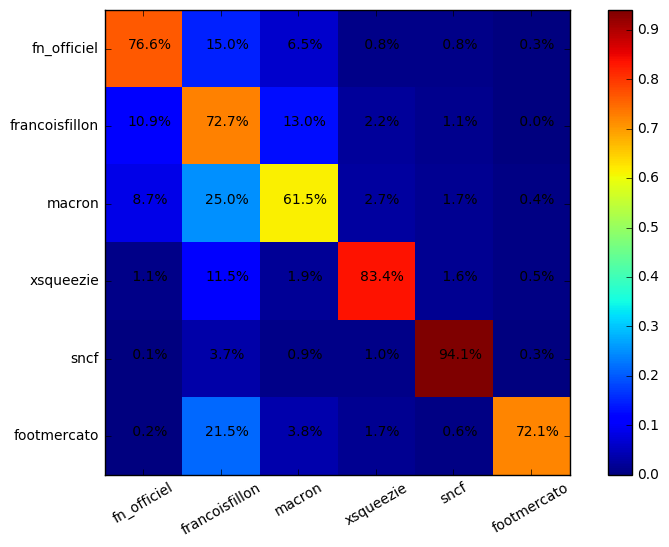

Epoch    3 : 3317.85   Test accuracy: 74.32 79.60 77.82 75.96 77.89 77.71 77.05 
Epoch    3 : 3303.95   Test accuracy: 74.34 79.66 77.82 76.07 77.64 77.71 77.02 
Epoch    3 : 3290.40   Test accuracy: 74.29 79.66 77.71 76.09 77.64 77.78 77.07 
Epoch    3 : 3277.18   Test accuracy: 74.27 79.66 77.73 75.96 77.50 77.78 77.07 
Epoch    3 : 3264.26   Test accuracy: 74.23 79.73 77.68 75.98 77.57 77.80 76.89 
Epoch    3 : 3251.64   Test accuracy: 74.36 79.87 77.68 75.89 77.64 77.84 76.91 
Epoch    3 : 3239.29   Test accuracy: 74.39 79.78 77.71 75.80 77.64 77.75 76.96 
Epoch    3 : 3227.20   Test accuracy: 74.50 79.75 77.62 75.82 77.57 77.71 77.00 
Epoch    3 : 3215.36   Test accuracy: 74.52 79.91 77.59 75.93 77.68 77.73 77.12 
Epoch    3 : 3203.76   Test accuracy: 74.64 79.80 77.73 75.82 77.71 77.66 77.02 
-------------------------------------------------
| 77.2% | 14.0% |  6.9% |  0.8% |  0.7% |  0.3% |   Total: 969
-------------------------------------------------
| 11.7% | 71.5% | 13.3% |  

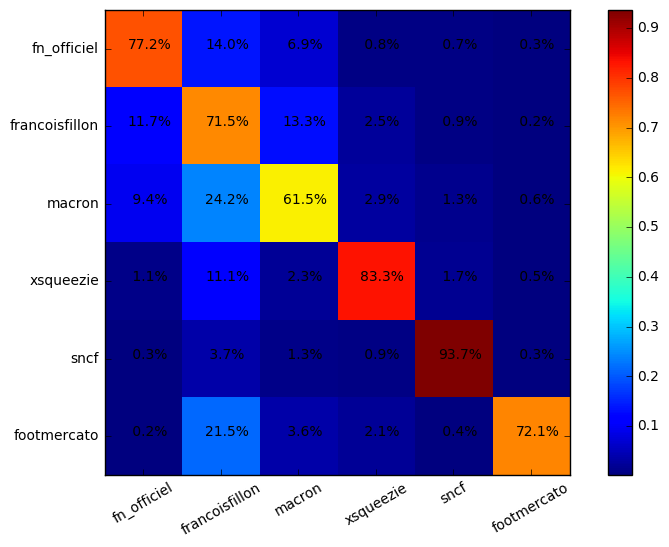

Epoch    3 : 3192.39   Test accuracy: 74.55 79.78 77.73 75.71 77.66 77.62 77.02 
Epoch    3 : 3181.24   Test accuracy: 74.55 79.71 77.57 75.68 77.71 77.55 76.93 
Epoch    3 : 3170.31   Test accuracy: 74.50 79.64 77.55 75.64 77.71 77.55 76.98 
Epoch    3 : 3159.59   Test accuracy: 74.48 79.60 77.62 75.71 77.68 77.57 76.98 
Epoch    3 : 3149.09   Test accuracy: 74.43 79.60 77.59 75.73 77.64 77.62 77.02 
Epoch    3 : 3138.79   Test accuracy: 74.39 79.66 77.62 75.71 77.57 77.57 77.09 
Epoch    3 : 3128.70   Test accuracy: 74.41 79.69 77.73 75.80 77.55 77.59 77.00 
Epoch    3 : 3118.80   Test accuracy: 74.45 79.66 77.73 75.80 77.64 77.55 77.05 
Epoch    3 : 3109.08   Test accuracy: 74.55 79.64 77.75 75.75 77.78 77.55 77.14 
Epoch    3 : 3099.55   Test accuracy: 74.41 79.60 77.71 75.75 77.84 77.57 77.21 
-------------------------------------------------
| 76.8% | 14.4% |  6.9% |  0.8% |  0.6% |  0.4% |   Total: 969
-------------------------------------------------
| 11.6% | 72.4% | 12.6% |  

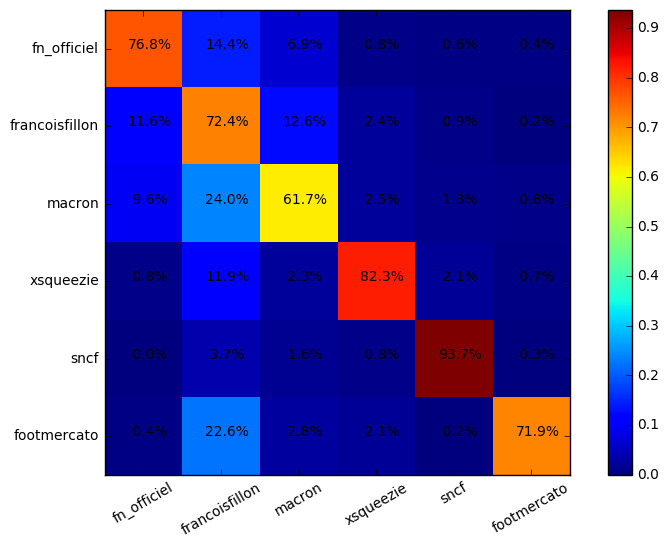

Epoch    3 : 3090.18   Test accuracy: 74.43 79.60 77.71 75.75 77.87 77.55 77.25 
Epoch    3 : 3080.98   Test accuracy: 74.41 79.48 77.82 75.75 77.87 77.59 77.32 
Epoch    3 : 3071.96   Test accuracy: 74.32 79.48 77.91 75.75 77.91 77.62 77.37 
Epoch    3 : 3063.10   Test accuracy: 74.32 79.50 77.91 75.75 77.87 77.57 77.32 
Epoch    3 : 3054.41   Test accuracy: 74.27 79.57 77.91 75.75 77.84 77.53 77.32 
Epoch    3 : 3045.88   Test accuracy: 74.29 79.55 77.78 75.64 77.84 77.50 77.34 
Epoch    3 : 3037.51   Test accuracy: 74.27 79.64 77.75 75.68 77.73 77.50 77.23 
Epoch    3 : 3029.29   Test accuracy: 74.29 79.62 77.66 75.66 77.73 77.43 77.12 
Epoch    3 : 3021.22   Test accuracy: 74.34 79.64 77.66 75.71 77.73 77.43 77.12 
Epoch    3 : 3013.30   Test accuracy: 74.32 79.62 77.59 75.71 77.73 77.48 77.07 
-------------------------------------------------
| 76.8% | 14.9% |  6.5% |  0.8% |  0.6% |  0.4% |   Total: 969
-------------------------------------------------
| 10.7% | 73.0% | 13.0% |  

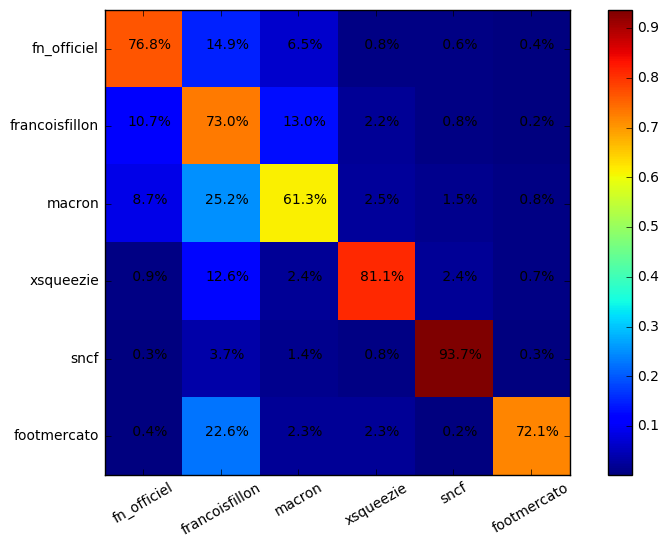

##################### 9 - Essai 2 ###################
Epoch    3 : 4893.57   Test accuracy: 71.13 75.52 73.68 72.22 73.61 73.77 73.50 
Epoch    3 : 4372.83   Test accuracy: 72.75 76.71 75.45 73.73 75.52 75.57 75.27 
Epoch    3 : 4174.30   Test accuracy: 73.09 77.27 76.05 74.34 75.91 76.18 75.52 
Epoch    3 : 4055.36   Test accuracy: 73.20 77.82 76.25 74.57 76.23 76.32 75.89 
Epoch    3 : 3971.17   Test accuracy: 73.27 78.05 76.46 74.59 76.39 76.59 75.98 
Epoch    3 : 3905.52   Test accuracy: 73.48 78.18 76.41 74.80 76.34 76.71 76.00 
Epoch    3 : 3851.13   Test accuracy: 73.89 78.32 76.66 75.02 76.57 76.77 76.05 
Epoch    3 : 3804.41   Test accuracy: 73.91 78.32 76.87 75.11 76.71 77.00 76.02 
Epoch    3 : 3763.39   Test accuracy: 74.11 78.30 76.93 75.05 76.73 76.91 76.27 
Epoch    3 : 3726.75   Test accuracy: 74.07 78.39 76.93 74.98 76.71 76.87 76.34 
-------------------------------------------------
| 72.4% | 17.5% |  8.3% |  0.9% |  0.6% |  0.2% |   Total: 969
-----------------------

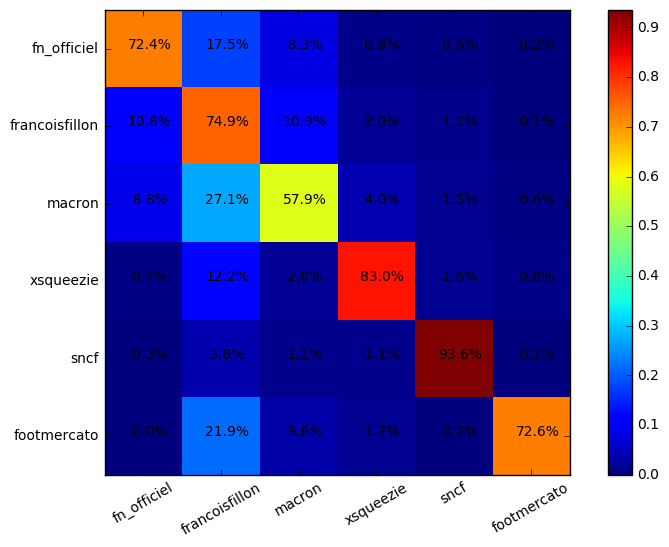

Epoch    3 : 3693.48   Test accuracy: 74.20 78.50 76.89 74.95 76.75 77.12 76.36 
Epoch    3 : 3662.83   Test accuracy: 74.18 78.57 76.91 75.00 76.80 77.07 76.46 
Epoch    3 : 3634.30   Test accuracy: 74.18 78.71 76.91 75.09 76.87 77.21 76.34 
Epoch    3 : 3607.51   Test accuracy: 74.04 78.64 77.00 75.11 76.96 77.18 76.39 
Epoch    3 : 3582.21   Test accuracy: 74.18 78.75 77.07 75.30 76.93 77.14 76.46 
Epoch    3 : 3558.23   Test accuracy: 74.29 78.78 77.09 75.20 77.02 77.16 76.50 
Epoch    3 : 3535.41   Test accuracy: 74.36 78.71 77.18 75.30 77.16 77.21 76.66 
Epoch    3 : 3513.63   Test accuracy: 74.29 78.73 77.30 75.48 77.14 77.21 76.66 
Epoch    3 : 3492.79   Test accuracy: 74.27 78.87 77.32 75.45 77.18 77.30 76.64 
Epoch    3 : 3472.80   Test accuracy: 74.20 79.00 77.32 75.41 77.23 77.48 76.77 
-------------------------------------------------
| 74.0% | 17.1% |  6.9% |  0.9% |  0.5% |  0.5% |   Total: 969
-------------------------------------------------
| 10.7% | 74.8% | 11.1% |  

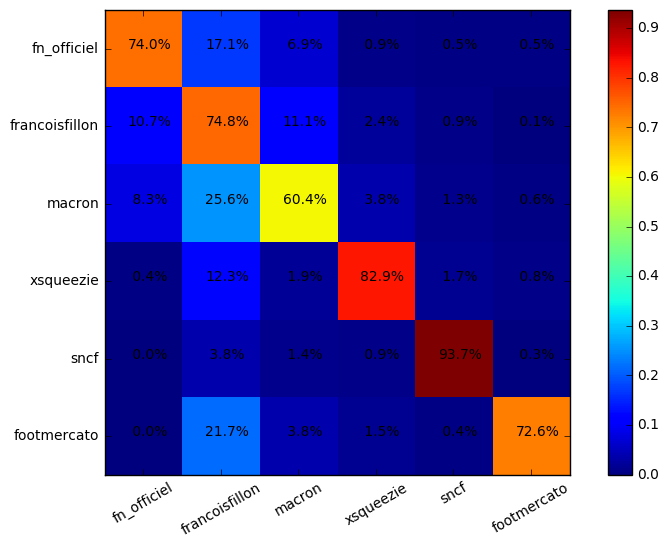

Epoch    3 : 3453.58   Test accuracy: 74.32 79.05 77.37 75.45 77.16 77.71 76.84 
Epoch    3 : 3435.09   Test accuracy: 74.39 79.14 77.48 75.45 77.27 77.53 76.87 
Epoch    3 : 3417.30   Test accuracy: 74.36 79.19 77.46 75.52 77.23 77.50 76.98 
Epoch    3 : 3400.16   Test accuracy: 74.32 79.21 77.48 75.50 77.25 77.66 77.02 
Epoch    3 : 3383.65   Test accuracy: 74.43 79.34 77.37 75.55 77.23 77.73 77.07 
Epoch    3 : 3367.72   Test accuracy: 74.50 79.30 77.50 75.59 77.25 77.62 77.21 
Epoch    3 : 3352.35   Test accuracy: 74.43 79.25 77.50 75.55 77.34 77.66 77.27 
Epoch    3 : 3337.50   Test accuracy: 74.43 79.21 77.48 75.64 77.39 77.64 77.30 
Epoch    3 : 3323.15   Test accuracy: 74.48 79.30 77.62 75.68 77.50 77.73 77.25 
Epoch    3 : 3309.27   Test accuracy: 74.45 79.41 77.71 75.80 77.50 77.71 77.27 
-------------------------------------------------
| 75.6% | 15.2% |  7.0% |  0.9% |  0.6% |  0.6% |   Total: 969
-------------------------------------------------
|  9.7% | 75.2% | 11.8% |  

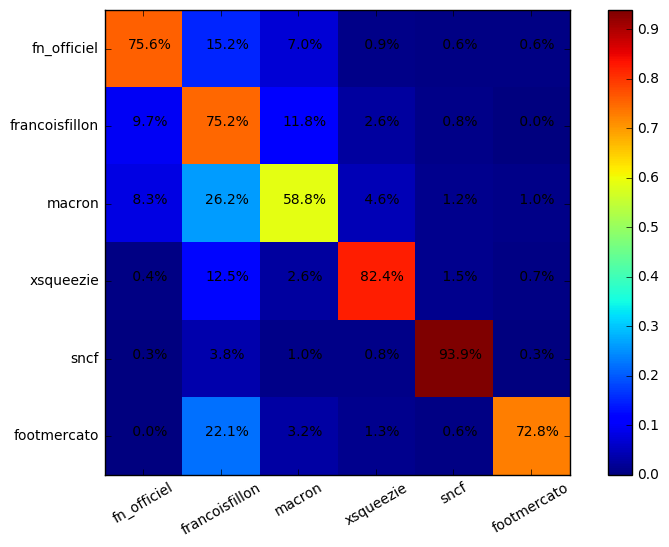

Epoch    3 : 3295.84   Test accuracy: 74.36 79.44 77.75 75.86 77.64 77.80 77.37 
Epoch    3 : 3282.82   Test accuracy: 74.41 79.50 77.89 75.89 77.64 77.91 77.39 
Epoch    3 : 3270.19   Test accuracy: 74.45 79.57 77.91 75.91 77.59 77.96 77.46 
Epoch    3 : 3257.91   Test accuracy: 74.48 79.57 77.78 75.82 77.68 77.80 77.46 
Epoch    3 : 3245.96   Test accuracy: 74.50 79.64 77.84 75.89 77.71 77.71 77.43 
Epoch    3 : 3234.32   Test accuracy: 74.45 79.66 77.80 75.98 77.73 77.66 77.50 
Epoch    3 : 3222.95   Test accuracy: 74.50 79.66 77.75 75.89 77.73 77.59 77.46 
Epoch    3 : 3211.84   Test accuracy: 74.43 79.55 77.68 75.77 77.80 77.55 77.43 
Epoch    3 : 3200.97   Test accuracy: 74.43 79.60 77.71 75.77 77.78 77.50 77.39 
Epoch    3 : 3190.33   Test accuracy: 74.43 79.55 77.71 75.77 77.75 77.59 77.34 
-------------------------------------------------
| 75.1% | 15.8% |  6.9% |  0.9% |  0.5% |  0.7% |   Total: 969
-------------------------------------------------
|  8.8% | 76.2% | 12.1% |  

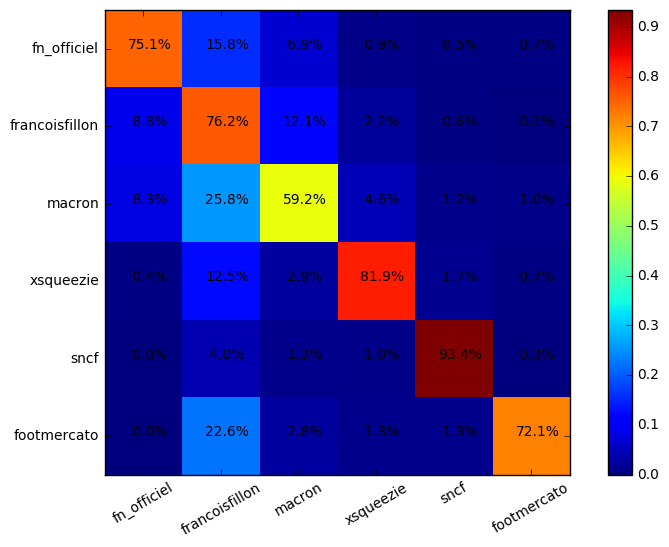

Epoch    3 : 3179.89   Test accuracy: 74.39 79.62 77.59 75.77 77.71 77.66 77.34 
Epoch    3 : 3169.65   Test accuracy: 74.41 79.57 77.66 75.77 77.59 77.57 77.48 
Epoch    3 : 3159.59   Test accuracy: 74.34 79.60 77.75 75.82 77.71 77.55 77.41 
Epoch    3 : 3149.70   Test accuracy: 74.36 79.62 77.75 75.86 77.68 77.62 77.37 
Epoch    3 : 3139.96   Test accuracy: 74.29 79.66 77.71 75.91 77.73 77.64 77.48 
Epoch    3 : 3130.39   Test accuracy: 74.23 79.73 77.89 76.00 77.78 77.62 77.46 
Epoch    3 : 3121.02   Test accuracy: 74.11 79.80 77.96 75.98 77.73 77.62 77.39 
Epoch    3 : 3111.83   Test accuracy: 74.20 79.85 77.93 76.02 77.73 77.64 77.48 
Epoch    3 : 3102.81   Test accuracy: 74.25 80.00 77.91 76.00 77.66 77.71 77.43 
Epoch    3 : 3093.94   Test accuracy: 74.27 80.00 77.82 75.96 77.66 77.73 77.34 
-------------------------------------------------
| 75.2% | 15.6% |  7.1% |  1.0% |  0.4% |  0.6% |   Total: 969
-------------------------------------------------
|  9.2% | 76.1% | 11.8% |  

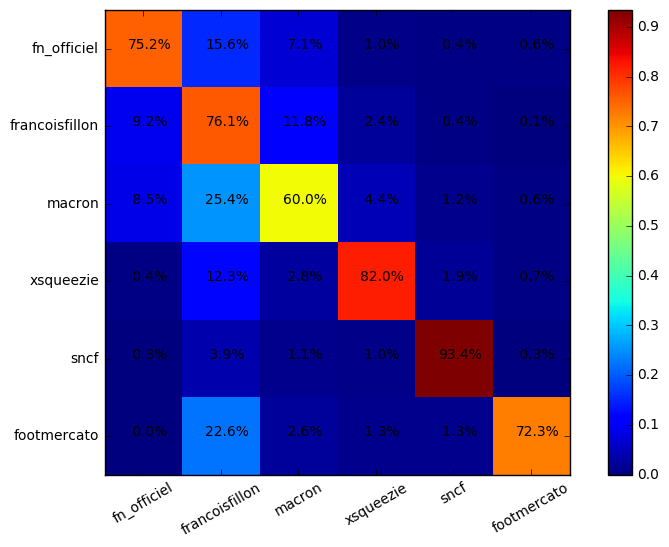

Epoch    3 : 3085.23   Test accuracy: 74.23 79.85 77.84 75.82 77.57 77.68 77.41 
Epoch    3 : 3076.66   Test accuracy: 74.27 79.82 77.80 75.82 77.55 77.66 77.41 
Epoch    3 : 3068.23   Test accuracy: 74.34 79.82 77.66 75.80 77.57 77.64 77.27 
Epoch    3 : 3059.93   Test accuracy: 74.43 79.78 77.73 75.77 77.53 77.59 77.21 
Epoch    3 : 3051.76   Test accuracy: 74.43 79.80 77.71 75.71 77.53 77.55 77.25 
Epoch    3 : 3043.71   Test accuracy: 74.39 79.73 77.73 75.71 77.55 77.48 77.30 
Epoch    3 : 3035.78   Test accuracy: 74.43 79.78 77.66 75.59 77.50 77.41 77.21 
Epoch    3 : 3027.96   Test accuracy: 74.43 79.71 77.64 75.55 77.37 77.30 77.21 
Epoch    3 : 3020.25   Test accuracy: 74.43 79.64 77.55 75.55 77.39 77.21 77.05 
Epoch    3 : 3012.65   Test accuracy: 74.39 79.64 77.46 75.50 77.30 77.23 77.09 
-------------------------------------------------
| 74.8% | 16.2% |  7.0% |  0.9% |  0.4% |  0.6% |   Total: 969
-------------------------------------------------
|  9.7% | 75.2% | 11.9% |  

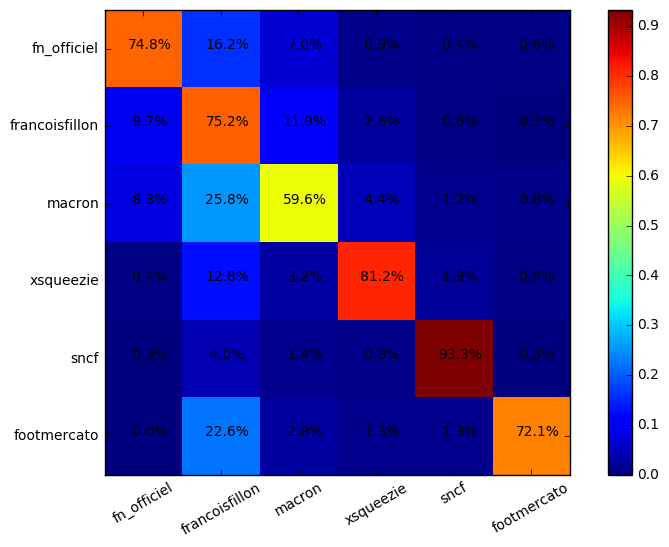

##################### 9 - Essai 3 ###################
Epoch    3 : 4793.65   Test accuracy: 71.45 75.75 73.84 72.20 73.73 74.00 73.57 
Epoch    3 : 4346.43   Test accuracy: 73.68 77.27 76.23 74.66 76.11 76.36 75.71 
Epoch    3 : 4177.08   Test accuracy: 74.02 78.00 76.66 75.18 76.57 76.80 76.07 
Epoch    3 : 4072.02   Test accuracy: 74.41 78.03 76.91 75.30 76.89 76.93 76.36 
Epoch    3 : 3995.12   Test accuracy: 74.55 78.12 77.09 75.48 76.87 77.21 76.59 
Epoch    3 : 3933.16   Test accuracy: 74.75 78.34 77.09 75.57 77.05 77.32 76.55 
Epoch    3 : 3880.02   Test accuracy: 74.64 78.50 77.21 75.61 77.14 77.43 76.71 
Epoch    3 : 3832.92   Test accuracy: 74.91 78.66 77.30 75.75 77.18 77.55 76.68 
Epoch    3 : 3790.72   Test accuracy: 74.82 78.80 77.50 75.86 77.34 77.66 76.87 
Epoch    3 : 3752.71   Test accuracy: 75.09 78.73 77.34 75.68 77.27 77.48 76.84 
-------------------------------------------------
| 74.7% | 15.3% |  7.3% |  1.2% |  1.0% |  0.4% |   Total: 969
-----------------------

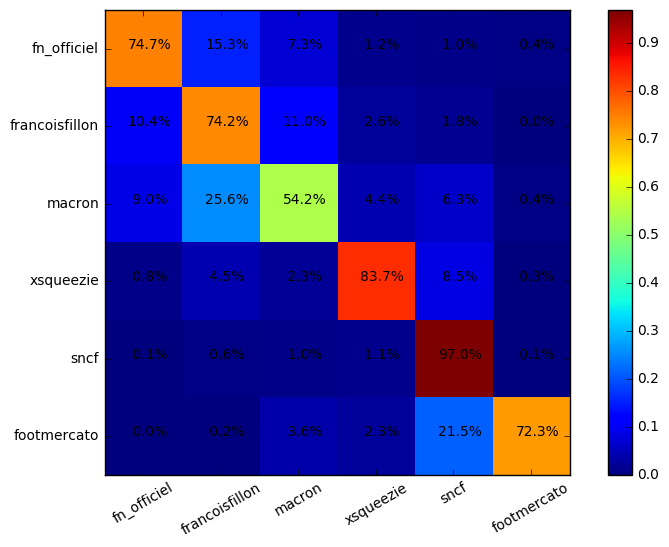

Epoch    3 : 3718.19   Test accuracy: 75.18 78.75 77.27 75.73 77.32 77.41 76.82 
Epoch    3 : 3686.74   Test accuracy: 75.18 78.80 77.23 75.84 77.12 77.50 76.77 
Epoch    3 : 3657.97   Test accuracy: 75.09 78.91 77.32 75.93 77.16 77.66 76.82 
Epoch    3 : 3631.37   Test accuracy: 75.07 78.73 77.43 75.96 77.43 77.68 76.80 
Epoch    3 : 3606.54   Test accuracy: 75.20 78.75 77.66 75.93 77.59 77.82 76.98 
Epoch    3 : 3583.19   Test accuracy: 74.39 78.80 77.39 75.41 77.14 77.57 76.62 
Epoch    3 : 3561.16   Test accuracy: 74.39 78.94 77.32 75.43 77.25 77.53 76.59 
Epoch    3 : 3540.30   Test accuracy: 74.52 78.91 77.34 75.45 77.25 77.59 76.66 
Epoch    3 : 3520.46   Test accuracy: 74.66 78.96 77.34 75.41 77.34 77.62 76.77 
Epoch    3 : 3501.52   Test accuracy: 74.80 79.03 77.46 75.57 77.46 77.73 76.91 
-------------------------------------------------
| 76.2% | 14.2% |  7.7% |  1.0% |  0.4% |  0.4% |   Total: 969
-------------------------------------------------
|  9.6% | 74.8% | 12.0% |  

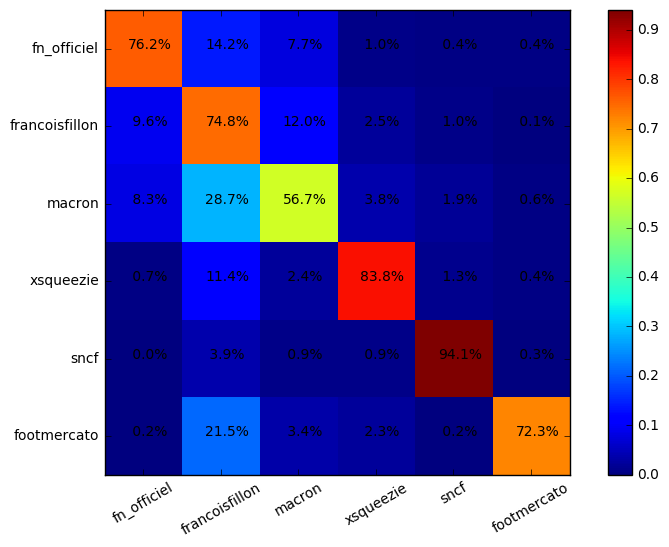

Epoch    3 : 3483.39   Test accuracy: 74.80 79.03 77.57 75.71 77.50 77.84 76.84 
Epoch    3 : 3466.00   Test accuracy: 74.86 78.91 77.64 75.68 77.55 77.84 76.84 
Epoch    3 : 3449.32   Test accuracy: 74.95 78.87 77.75 75.77 77.55 78.00 76.89 
Epoch    3 : 3433.26   Test accuracy: 74.93 78.89 77.78 75.82 77.62 78.07 76.93 
Epoch    3 : 3417.79   Test accuracy: 74.95 78.94 77.71 75.82 77.55 78.03 76.96 
Epoch    3 : 3402.85   Test accuracy: 74.95 78.94 77.78 75.86 77.66 78.00 76.96 
Epoch    3 : 3388.38   Test accuracy: 74.80 79.05 77.84 75.82 77.71 77.98 76.93 
Epoch    3 : 3374.34   Test accuracy: 74.75 79.03 77.82 75.71 77.71 77.87 77.12 
Epoch    3 : 3360.70   Test accuracy: 74.73 79.00 77.66 75.77 77.73 77.78 77.07 
Epoch    3 : 3347.43   Test accuracy: 74.82 78.91 77.75 75.82 77.73 78.00 77.07 
-------------------------------------------------
| 76.6% | 14.2% |  7.5% |  0.8% |  0.4% |  0.4% |   Total: 969
-------------------------------------------------
|  9.3% | 74.6% | 12.2% |  

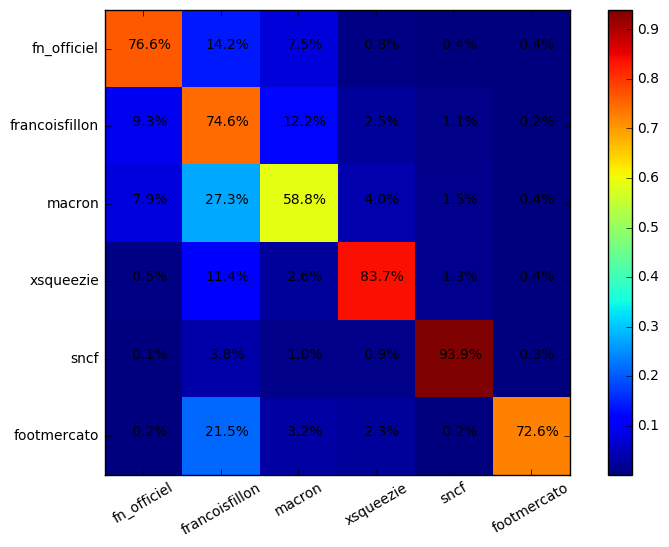

Epoch    3 : 3334.50   Test accuracy: 74.77 79.03 77.80 75.89 77.66 78.00 77.09 
Epoch    3 : 3321.89   Test accuracy: 74.73 79.03 77.75 75.96 77.71 77.91 77.02 
Epoch    3 : 3309.57   Test accuracy: 74.93 79.09 77.71 76.05 77.71 77.93 77.02 
Epoch    3 : 3297.52   Test accuracy: 74.91 78.98 77.68 75.89 77.50 77.91 77.07 
Epoch    3 : 3285.72   Test accuracy: 74.82 79.07 77.73 75.89 77.43 77.96 77.02 
Epoch    3 : 3274.15   Test accuracy: 74.80 79.07 77.78 75.93 77.43 78.00 76.93 
Epoch    3 : 3262.79   Test accuracy: 74.75 79.16 77.82 75.98 77.55 77.96 76.87 
Epoch    3 : 3251.63   Test accuracy: 74.77 79.14 77.87 76.02 77.68 77.91 76.84 
Epoch    3 : 3240.65   Test accuracy: 74.89 79.14 77.84 75.98 77.62 78.00 76.91 
Epoch    3 : 3229.82   Test accuracy: 74.77 79.19 77.80 75.93 77.66 77.96 76.84 
-------------------------------------------------
| 76.6% | 14.6% |  7.2% |  0.7% |  0.4% |  0.5% |   Total: 969
-------------------------------------------------
|  9.3% | 75.1% | 11.8% |  

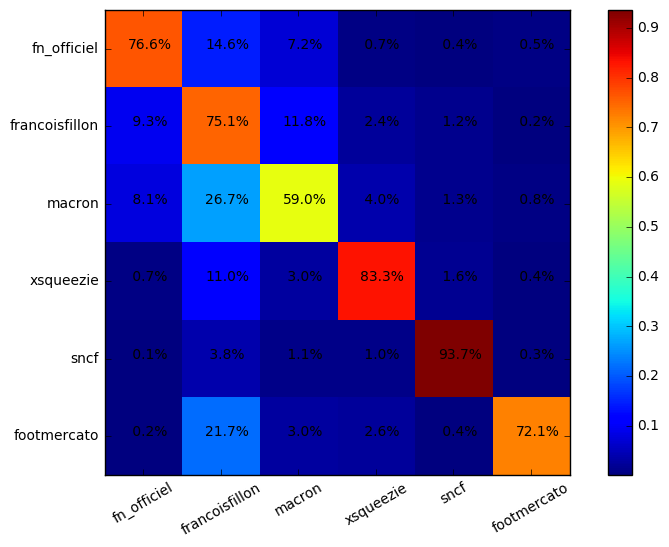

Epoch    3 : 3219.18   Test accuracy: 74.66 79.14 77.75 76.02 77.57 77.91 76.93 
Epoch    3 : 3208.72   Test accuracy: 74.66 79.14 77.73 75.91 77.59 77.87 76.91 
Epoch    3 : 3198.43   Test accuracy: 74.61 79.14 77.59 75.89 77.55 77.96 76.93 
Epoch    3 : 3188.29   Test accuracy: 74.52 79.19 77.68 75.84 77.55 77.84 77.00 
Epoch    3 : 3178.28   Test accuracy: 74.48 79.07 77.62 75.84 77.43 77.82 77.05 
Epoch    3 : 3168.39   Test accuracy: 74.50 78.98 77.55 75.75 77.41 77.82 77.02 
Epoch    3 : 3158.62   Test accuracy: 74.48 79.14 77.57 75.75 77.39 77.80 76.98 
Epoch    3 : 3148.97   Test accuracy: 74.45 79.12 77.59 75.68 77.32 77.75 76.91 
Epoch    3 : 3139.43   Test accuracy: 74.50 79.16 77.50 75.64 77.43 77.71 76.91 
Epoch    3 : 3130.01   Test accuracy: 74.43 79.19 77.37 75.64 77.41 77.66 76.96 
-------------------------------------------------
| 76.2% | 15.1% |  7.1% |  0.8% |  0.4% |  0.4% |   Total: 969
-------------------------------------------------
|  9.2% | 75.2% | 11.8% |  

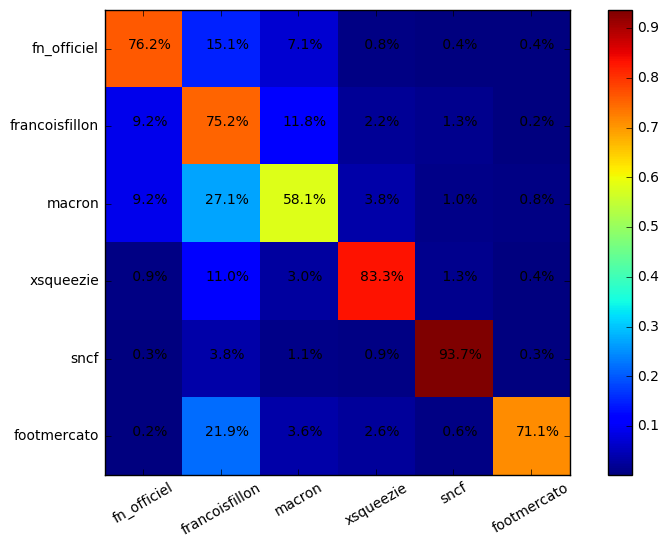

Epoch    3 : 3120.71   Test accuracy: 74.41 79.16 77.34 75.52 77.41 77.57 76.87 
Epoch    3 : 3111.52   Test accuracy: 74.34 79.19 77.43 75.55 77.27 77.57 76.91 
Epoch    3 : 3102.45   Test accuracy: 74.27 79.25 77.46 75.55 77.25 77.57 76.87 
Epoch    3 : 3093.47   Test accuracy: 74.16 79.21 77.41 75.52 77.23 77.62 76.84 
Epoch    3 : 3084.61   Test accuracy: 74.18 79.21 77.43 75.50 77.23 77.50 76.89 
Epoch    3 : 3075.85   Test accuracy: 74.20 79.21 77.43 75.52 77.21 77.41 76.87 
Epoch    3 : 3067.20   Test accuracy: 74.27 79.16 77.34 75.45 77.25 77.39 76.84 
Epoch    3 : 3058.65   Test accuracy: 74.25 79.14 77.30 75.48 77.18 77.23 76.87 
Epoch    3 : 3050.21   Test accuracy: 74.32 79.12 77.25 75.36 77.18 77.18 76.91 
Epoch    3 : 3041.89   Test accuracy: 74.29 79.12 77.16 75.41 77.18 77.16 76.91 
-------------------------------------------------
| 75.2% | 15.3% |  7.3% |  0.9% |  0.7% |  0.5% |   Total: 969
-------------------------------------------------
|  9.8% | 75.1% | 11.3% |  

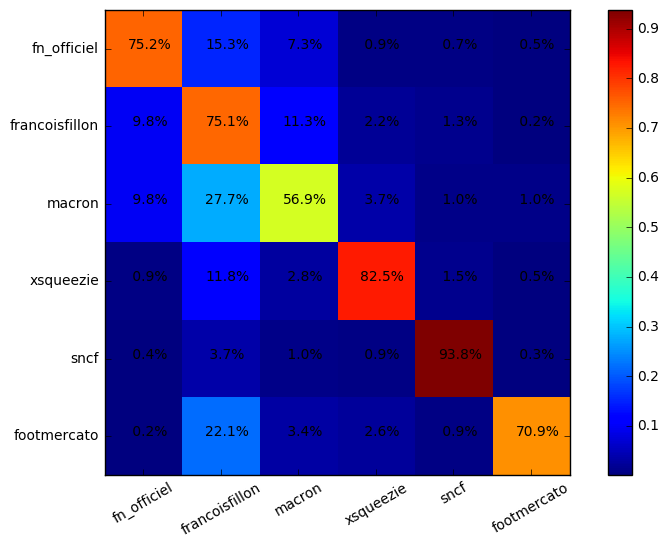

##################### 9 - Essai 4 ###################
Epoch    3 : 4862.60   Test accuracy: 71.52 74.80 73.86 72.41 73.77 74.00 73.43 
Epoch    3 : 4370.10   Test accuracy: 72.70 76.68 74.91 73.20 74.66 75.09 74.43 
Epoch    3 : 4187.16   Test accuracy: 73.25 77.14 76.00 74.32 75.73 76.02 75.30 
Epoch    3 : 4066.42   Test accuracy: 73.45 77.30 76.25 74.73 76.14 76.39 75.61 
Epoch    3 : 3978.93   Test accuracy: 73.59 77.53 76.36 74.64 76.14 76.82 75.57 
Epoch    3 : 3912.52   Test accuracy: 73.93 77.89 76.48 74.75 76.30 76.73 75.48 
Epoch    3 : 3858.53   Test accuracy: 73.84 77.89 76.75 74.82 76.52 76.93 75.68 
Epoch    3 : 3812.40   Test accuracy: 73.95 77.89 76.80 75.02 76.71 77.05 75.73 
Epoch    3 : 3771.70   Test accuracy: 74.04 78.18 76.87 75.23 76.68 77.18 75.82 
Epoch    3 : 3735.09   Test accuracy: 74.23 78.18 77.12 75.00 76.80 77.25 75.93 
-------------------------------------------------
| 74.8% | 16.4% |  6.6% |  1.0% |  0.9% |  0.2% |   Total: 969
-----------------------

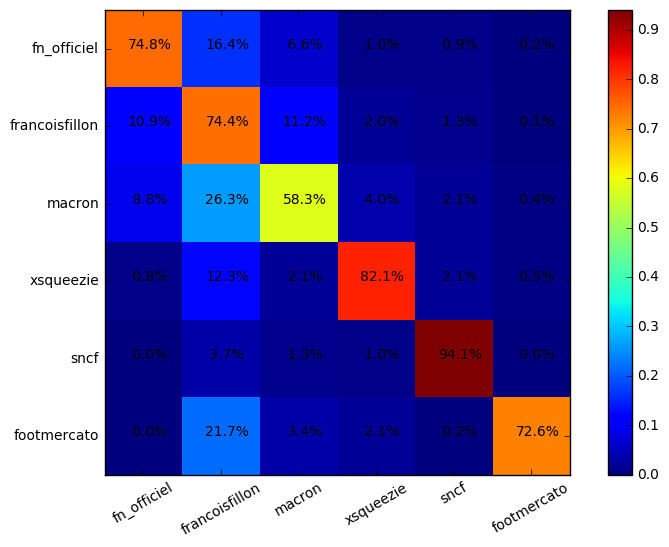

Epoch    3 : 3701.77   Test accuracy: 74.25 78.30 77.07 75.09 76.84 77.23 76.11 
Epoch    3 : 3671.17   Test accuracy: 74.16 78.12 77.23 75.20 76.93 77.30 76.25 
Epoch    3 : 3642.92   Test accuracy: 74.09 78.41 77.18 75.27 76.89 77.37 76.46 
Epoch    3 : 3616.69   Test accuracy: 74.39 78.57 77.14 75.20 76.82 77.41 76.66 
Epoch    3 : 3592.24   Test accuracy: 74.48 78.55 77.18 75.39 77.00 77.39 76.62 
Epoch    3 : 3569.30   Test accuracy: 74.48 78.66 77.43 75.43 77.30 77.34 76.55 
Epoch    3 : 3547.65   Test accuracy: 74.39 78.80 77.41 75.43 77.34 77.30 76.66 
Epoch    3 : 3527.12   Test accuracy: 74.32 78.75 77.30 75.52 77.37 77.30 76.66 
Epoch    3 : 3507.56   Test accuracy: 74.36 78.75 77.43 75.55 77.41 77.30 76.73 
Epoch    3 : 3488.83   Test accuracy: 74.39 78.80 77.39 75.64 77.25 77.41 76.82 
-------------------------------------------------
| 76.3% | 15.9% |  6.0% |  0.8% |  0.7% |  0.3% |   Total: 969
-------------------------------------------------
| 10.7% | 73.6% | 12.2% |  

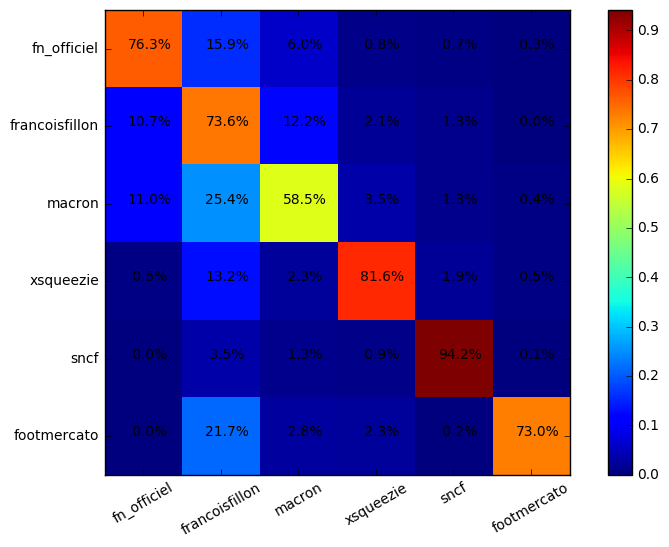

Epoch    3 : 3470.83   Test accuracy: 74.55 78.80 77.50 75.71 77.18 77.41 76.80 
Epoch    3 : 3453.43   Test accuracy: 74.57 78.91 77.53 75.68 77.32 77.53 76.93 
Epoch    3 : 3436.65   Test accuracy: 74.61 78.94 77.57 75.75 77.34 77.66 76.91 
Epoch    3 : 3420.48   Test accuracy: 74.82 79.03 77.53 75.80 77.34 77.82 76.89 
Epoch    3 : 3404.85   Test accuracy: 74.89 79.05 77.57 75.71 77.37 77.84 76.87 
Epoch    3 : 3389.73   Test accuracy: 74.89 79.09 77.57 75.80 77.48 77.82 76.91 
Epoch    3 : 3375.07   Test accuracy: 74.89 79.09 77.62 75.82 77.57 77.89 76.98 
Epoch    3 : 3360.82   Test accuracy: 75.00 79.03 77.62 75.86 77.53 77.93 77.02 
Epoch    3 : 3346.98   Test accuracy: 75.00 79.07 77.73 75.82 77.59 77.98 77.05 
Epoch    3 : 3333.49   Test accuracy: 74.93 78.91 77.84 75.84 77.68 77.98 77.14 
-------------------------------------------------
| 76.5% | 15.3% |  6.3% |  0.9% |  0.6% |  0.4% |   Total: 969
-------------------------------------------------
| 10.7% | 74.4% | 11.6% |  

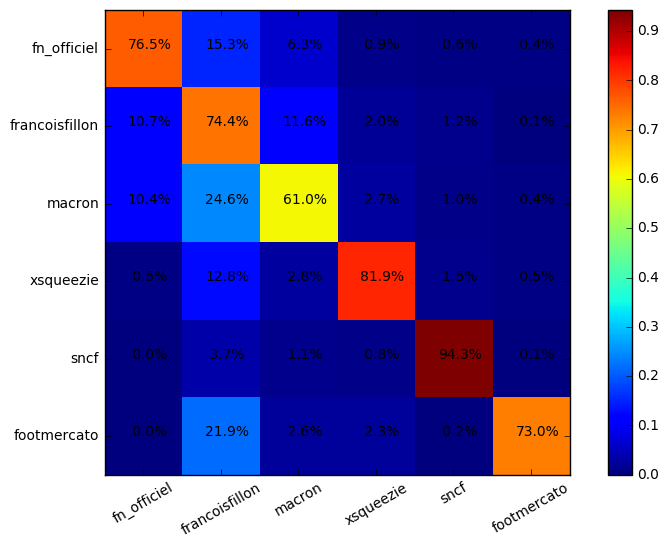

Epoch    3 : 3320.34   Test accuracy: 74.89 78.84 77.96 75.91 77.82 78.12 77.41 
Epoch    3 : 3307.49   Test accuracy: 74.86 78.87 78.00 76.05 77.87 78.18 77.43 
Epoch    3 : 3294.92   Test accuracy: 74.82 78.84 78.00 76.11 77.78 78.18 77.41 
Epoch    3 : 3282.60   Test accuracy: 74.89 78.87 78.05 76.05 77.82 78.14 77.43 
Epoch    3 : 3270.51   Test accuracy: 75.00 78.82 77.98 75.96 77.84 78.16 77.48 
Epoch    3 : 3258.63   Test accuracy: 74.91 78.94 77.96 75.98 77.84 78.16 77.46 
Epoch    3 : 3246.98   Test accuracy: 74.95 78.96 77.98 75.96 77.84 78.16 77.46 
Epoch    3 : 3235.54   Test accuracy: 74.91 79.03 78.00 76.07 77.89 78.21 77.43 
Epoch    3 : 3224.32   Test accuracy: 75.00 78.98 78.03 76.11 77.78 78.12 77.37 
Epoch    3 : 3213.31   Test accuracy: 75.02 79.09 77.91 76.14 77.80 78.05 77.39 
-------------------------------------------------
| 76.0% | 15.6% |  6.7% |  0.8% |  0.6% |  0.3% |   Total: 969
-------------------------------------------------
| 10.1% | 75.7% | 10.9% |  

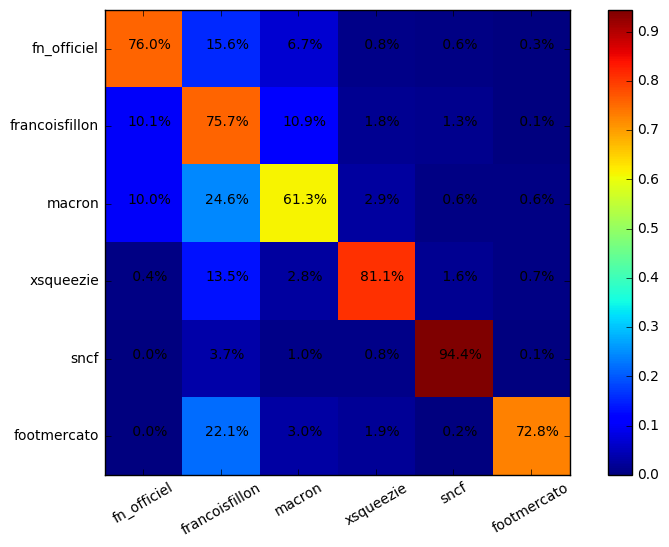

Epoch    3 : 3202.51   Test accuracy: 75.02 79.07 77.87 76.02 77.78 78.05 77.39 
Epoch    3 : 3191.93   Test accuracy: 75.00 79.00 77.93 75.96 77.84 78.09 77.18 
Epoch    3 : 3181.55   Test accuracy: 74.93 79.03 77.93 76.02 77.80 78.00 77.14 
Epoch    3 : 3171.39   Test accuracy: 74.84 78.98 77.98 75.96 77.80 78.12 77.14 
Epoch    3 : 3161.42   Test accuracy: 74.84 79.07 78.03 75.98 77.87 78.12 77.25 
Epoch    3 : 3151.66   Test accuracy: 74.89 79.00 77.89 75.93 77.80 78.09 77.14 
Epoch    3 : 3142.08   Test accuracy: 74.84 79.05 77.87 75.93 77.62 78.07 77.21 
Epoch    3 : 3132.70   Test accuracy: 74.80 79.05 77.78 76.00 77.50 77.93 77.14 
Epoch    3 : 3123.49   Test accuracy: 74.73 79.00 77.84 76.09 77.57 77.93 77.12 
Epoch    3 : 3114.45   Test accuracy: 74.68 79.05 77.80 76.11 77.64 77.89 77.02 
-------------------------------------------------
| 77.0% | 15.0% |  6.4% |  0.8% |  0.5% |  0.3% |   Total: 969
-------------------------------------------------
| 11.6% | 74.7% | 10.7% |  

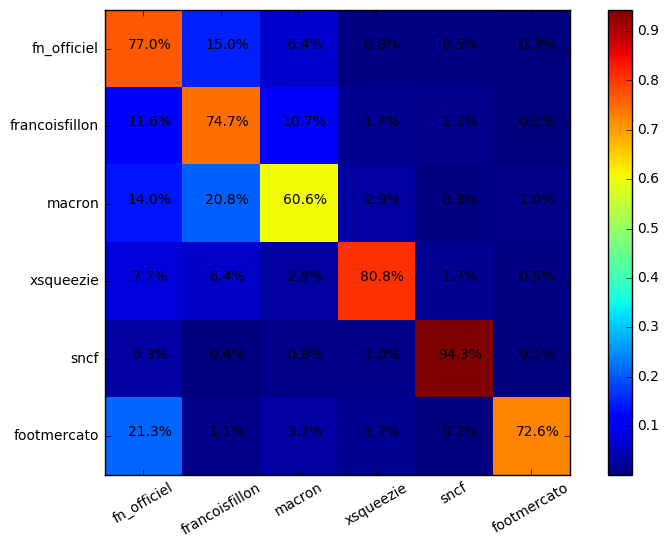

Epoch    3 : 3105.59   Test accuracy: 74.68 79.05 77.75 76.07 77.57 77.80 77.09 
Epoch    3 : 3096.89   Test accuracy: 74.64 79.03 77.78 76.07 77.68 77.82 77.12 
Epoch    3 : 3088.35   Test accuracy: 74.52 79.07 77.84 76.14 77.71 77.78 77.12 
Epoch    3 : 3079.96   Test accuracy: 74.61 79.12 77.93 76.14 77.68 77.82 77.12 
Epoch    3 : 3071.72   Test accuracy: 74.55 79.16 77.98 76.11 77.71 77.89 77.21 
Epoch    3 : 3063.62   Test accuracy: 74.64 79.23 78.07 76.30 77.73 77.87 77.32 
Epoch    3 : 3055.66   Test accuracy: 74.68 79.16 78.14 76.36 77.75 77.96 77.39 
Epoch    3 : 3047.83   Test accuracy: 74.68 79.14 78.09 76.41 77.73 77.91 77.32 
Epoch    3 : 3040.13   Test accuracy: 74.75 79.12 78.18 76.46 77.87 77.93 77.41 
Epoch    3 : 3032.56   Test accuracy: 74.73 79.16 78.30 76.46 77.96 78.07 77.30 
-------------------------------------------------
| 77.5% | 14.1% |  6.6% |  0.9% |  0.5% |  0.3% |   Total: 969
-------------------------------------------------
| 11.6% | 75.2% | 10.6% |  

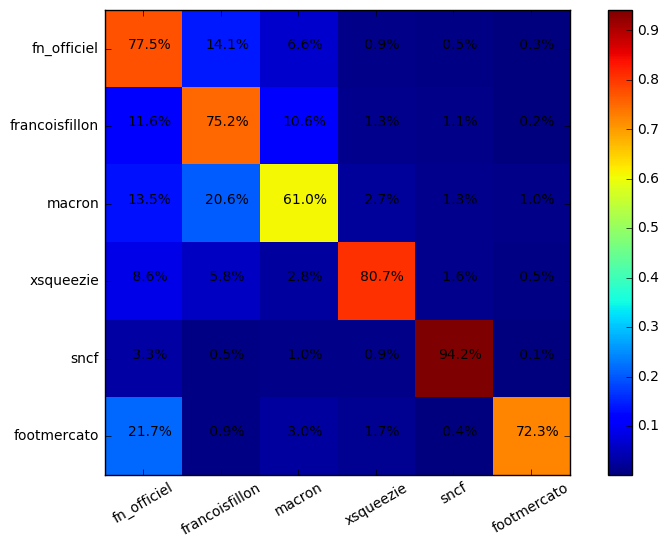

In [524]:
for i in range(1,10):
    for j in range(5):
        print '##################### %d - Essai %d ###################'%(i,j)
        tf.reset_default_graph()
        t = LSTM_wrapper('dataset/tweets/data/total%d'%i)
        t.show_training(4,10)
        t.confusion()
        t.show_training(4,10)
        t.confusion()
        t.show_training(4,10)
        t.confusion()
        t.show_training(4,10)
        t.confusion()
        t.show_training(4,10)
        t.confusion()
        t.show_training(4,10)
        t.confusion()

-------------------------
| 78.0% | 16.1% |  5.9% |   Total: 880
-------------------------
| 17.9% | 68.9% | 13.2% |   Total: 927
-------------------------
| 11.2% | 27.4% | 61.5% |   Total: 493


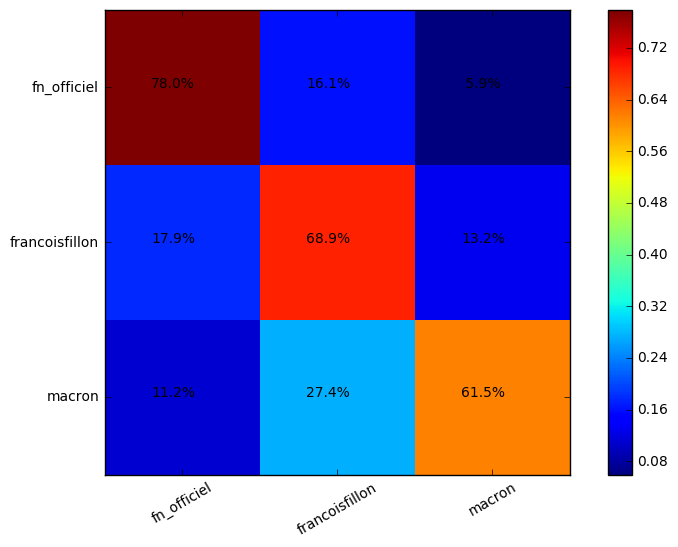

In [379]:
t.confusion()

Epoch    3 : 5542.18   Test accuracy: 68.50 66.16 68.24 67.72 68.02 68.37 67.24 
Epoch    3 : 5214.32   Test accuracy: 70.28 67.33 70.06 69.71 69.97 70.49 69.11 
Epoch    3 : 5046.39   Test accuracy: 71.58 68.33 71.27 70.97 71.27 71.75 70.32 
Epoch    3 : 4923.43   Test accuracy: 72.31 69.67 72.57 71.92 72.10 72.66 71.14 
Epoch    3 : 4828.94   Test accuracy: 72.44 70.28 72.96 72.40 72.70 73.05 71.58 
Epoch    3 : 4753.93   Test accuracy: 72.66 70.49 73.09 72.66 72.92 73.35 72.14 
Epoch    3 : 4691.77   Test accuracy: 72.83 70.84 73.61 73.01 73.35 73.96 72.62 
Epoch    3 : 4638.40   Test accuracy: 73.05 71.14 73.44 72.88 73.18 73.79 72.62 
Epoch    3 : 4591.26   Test accuracy: 73.27 71.06 73.70 72.92 73.53 73.83 72.83 
Epoch    3 : 4548.66   Test accuracy: 73.22 71.32 73.48 72.96 73.31 73.61 72.88 
-------------------------
| 77.0% | 17.8% |  5.2% |   Total: 882
-------------------------
| 13.4% | 77.8% |  8.8% |   Total: 928
-------------------------
|  9.8% | 30.3% | 59.8% |   Total:

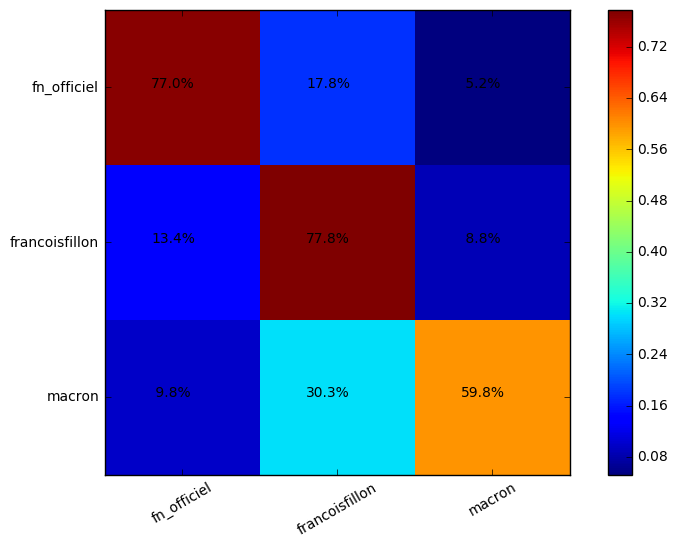

Epoch    3 : 4509.43   Test accuracy: 73.14 71.53 73.53 72.88 73.27 73.74 72.83 
Epoch    3 : 4472.74   Test accuracy: 73.27 71.40 73.61 73.09 73.70 74.00 72.79 
Epoch    3 : 4438.02   Test accuracy: 73.40 71.49 73.70 73.18 73.70 74.09 73.05 
Epoch    3 : 4404.89   Test accuracy: 73.57 71.71 74.13 73.53 73.92 74.22 73.35 
Epoch    3 : 4373.05   Test accuracy: 73.70 71.97 74.31 73.61 73.87 74.39 73.40 
Epoch    3 : 4342.28   Test accuracy: 73.44 71.97 74.13 73.61 73.87 74.31 73.40 
Epoch    3 : 4312.41   Test accuracy: 73.22 71.97 74.00 73.48 73.74 74.18 73.01 
Epoch    3 : 4283.35   Test accuracy: 73.35 72.05 73.96 73.18 73.83 74.22 73.14 
Epoch    3 : 4255.03   Test accuracy: 73.48 72.05 74.09 73.22 74.13 74.09 73.09 
Epoch    3 : 4227.36   Test accuracy: 73.66 72.14 74.18 73.35 74.31 74.26 73.18 
-------------------------
| 78.3% | 16.6% |  5.1% |   Total: 882
-------------------------
| 12.9% | 77.4% |  9.7% |   Total: 928
-------------------------
|  9.2% | 29.5% | 61.2% |   Total:

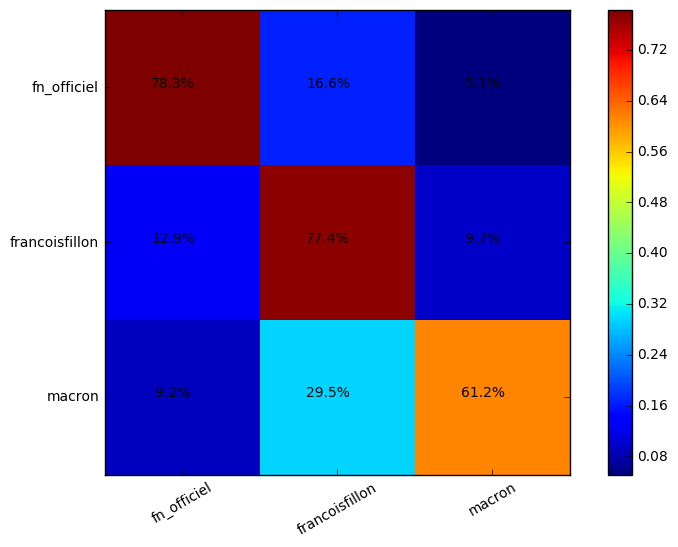

In [520]:
t.show_training(4,10)
t.confusion()
t.show_training(4,10)
t.confusion()

Epoch   49 : 294.28     14.925215     19.18
Epoch   49 : 222.22     11.148828     19.35
Epoch   49 : 151.59     7.075422     17.78
Epoch   49 : 89.81     5.367561     18.63
Epoch   49 : 49.87     3.309643     19.35
Epoch   49 : 35.12     2.217036     19.86
Epoch   49 : 19.12     2.036703     19.30

--------------------------------------------------------

Epoch   49 : 205.19     10.045614     17.78
Epoch   49 : 109.84     4.890209     17.23
Epoch   49 : 47.77     2.036703     17.56
Epoch   49 : 22.31     1.463880     18.67
Epoch   49 : 14.04     1.007744     18.50
Epoch    4 : 13.15

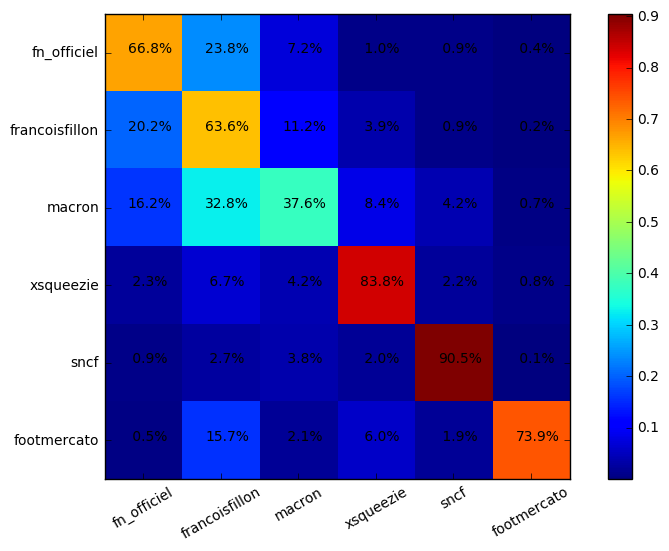

In [276]:
confusion_plot(c,['fn_officiel','francoisfillon','macron','xsqueezie','sncf','footmercato'])